# Comparing Simulated Annealing Cooling Methods

We will examine all 3 methods (& their hyperparmeters) and their effect of the performance of the SA algorithm before deciding on 1 set of parameters. 

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import seaborn as sns
# import matplotlib
import matplotlib.pyplot as plt

In [2]:
# read in data
d1 = pd.read_csv(Path().absolute()/'data/winequality-red.csv', sep=';')
d1['red_wine'] = 1
d2 = pd.read_csv(Path().absolute()/'data/winequality-white.csv', sep=';')
d2['red_wine'] = 0
print(f'Size of red wines: {d1.shape}')
print(f'Size of white wines: {d2.shape}')
d2

Size of red wines: (1599, 13)
Size of white wines: (4898, 13)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,0
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,0
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,0
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0


In [3]:
# concat 2 datasets into 1
df = pd.concat([d1,d2])
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0


In [4]:
df.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
red_wine                  int64
dtype: object

In [5]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.246114
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,0.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,0.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,0.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000


## Train model using xgboost

Some points to note before we proceed with training the xgboost model:

- We are taking the first model we get without tuning hyperparmeters via an automl tool or performing a random grid search because we interested in exploiting the model. I skipped that step here, but encourage the reader to perform due diligence with their ML model before optimizing its inputs.
- We should check whether our model is overfit and thus may want to consider splitting the test set into 2 groups so that we have 2 separate hold-out datasets to prevent overfitting. It is worth noting that some data scientists, don't care about overfitting when optimizing over its input search space because they want a model that closely aligns with its training data when optimizing. Overfitting typically comes at the cost of generalizing poorly to unseen/new data, which may mean that the model will interpolate and extrapolate poorly. This significantly depends on the quality and quantity of your training data. 

In [6]:
# Split the dataset into train/test set
from sklearn.model_selection import train_test_split
X, y = df.drop(columns=['quality']),df['quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
print(f"X_train.shape: {X_train.shape}, y_train.shape: {y_train.shape}")
print(f"X_test.shape: {X_test.shape}, y_test.shape: {y_test.shape}")

X_train.shape: (4352, 12), y_train.shape: (4352,)
X_test.shape: (2145, 12), y_test.shape: (2145,)


In [7]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Use "hist" for training the model.
xg_reg = xgb.XGBRegressor(tree_method="hist")
# Fit the model using predictor X and response y.
xg_reg.fit(X_train, y_train)
preds = xg_reg.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))
mape = mean_absolute_percentage_error(y_test, preds)
print("Test RMSE: %f, MAPE: %f" % (rmse,mape))
tpreds = xg_reg.predict(X_train)
trmse = np.sqrt(mean_squared_error(y_train, tpreds))
tmape = mean_absolute_percentage_error(y_train, tpreds)
print("Training RMSE: %f, MAPE: %f" % (trmse,tmape))
# Save model into JSON format. => reg.save_model("regressor.json")

Test RMSE: 0.643106, MAPE: 0.083802
Training RMSE: 0.244802, MAPE: 0.030291


The RSME returns as 0.64 on the quality scale of 0-10 and a mean absolute percentage error of 0.08, which is a decent performance for a regression model.

## Comparing SA Cooling Methods


The temperature can decrease in 3 ways:
- linear (with alpha)
- geometric (with alpha)
- slow decrease (with beta)

In [62]:
temp = np.linspace(10000,1, num=5000)# 0 to 10000
alphas = [10, 0.95, 5, 50, 100]
betas = [10, 5, 1, 50, 100, 0.5]

comp_cooling = pd.DataFrame(temp, columns=['temp'])

for alpha in alphas:
    comp_cooling[f"linear_alpha_{alpha}"] = temp-alpha
    comp_cooling[f"geometric_alpha_{alpha}"] = temp*(1/alpha)

for beta in betas:
    comp_cooling[f"slowDecrease_beta_{beta}"] = temp / (1 + (beta * temp))
comp_cooling

,temp,linear_alpha_10,geometric_alpha_10,linear_alpha_0.95,geometric_alpha_0.95,linear_alpha_5,geometric_alpha_5,linear_alpha_50,geometric_alpha_50,linear_alpha_100,geometric_alpha_100,slowDecrease_beta_10,slowDecrease_beta_5,slowDecrease_beta_1,slowDecrease_beta_50,slowDecrease_beta_100,slowDecrease_beta_0.5
0,10000.0000,9990.0000,1000.00000,9999.0500,10526.315789,9995.0000,2000.00000,9950.0000,200.000000,9900.0000,100.000000,0.099999,0.199996,0.999900,0.020000,0.010000,1.999600
1,9997.9998,9987.9998,999.79998,9997.0498,10524.210316,9992.9998,1999.59996,9947.9998,199.959996,9897.9998,99.979998,0.099999,0.199996,0.999900,0.020000,0.010000,1.999600
2,9995.9996,9985.9996,999.59996,9995.0496,10522.104842,9990.9996,1999.19992,9945.9996,199.919992,9895.9996,99.959996,0.099999,0.199996,0.999900,0.020000,0.010000,1.999600
3,9993.9994,9983.9994,999.39994,9993.0494,10519.999368,9988.9994,1998.79988,9943.9994,199.879988,9893.9994,99.939994,0.099999,0.199996,0.999900,0.020000,0.010000,1.999600
4,9991.9992,9981.9992,999.19992,9991.0492,10517.893895,9986.9992,1998.39984,9941.9992,199.839984,9891.9992,99.919992,0.099999,0.199996,0.999900,0.020000,0.010000,1.999600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,9.0008,-0.9992,0.90008,8.0508,9.474526,4.0008,1.80016,-40.9992,0.180016,-90.9992,0.090008,0.098901,0.195653,0.900008,0.019956,0.009989,1.636390
4996,7.0006,-2.9994,0.70006,6.0506,7.369053,2.0006,1.40012,-42.9994,0.140012,-92.9994,0.070006,0.098592,0.194445,0.875009,0.019943,0.009986,1.555585
4997,5.0004,-4.9996,0.50004,4.0504,5.263579,0.0004,1.00008,-44.9996,0.100008,-94.9996,0.050004,0.098039,0.192308,0.833344,0.019920,0.009980,1.428604
4998,3.0002,-6.9998,0.30002,2.0502,3.158105,-1.9998,0.60004,-46.9998,0.060004,-96.9998,0.030002,0.096774,0.187501,0.750013,0.019868,0.009967,1.200032


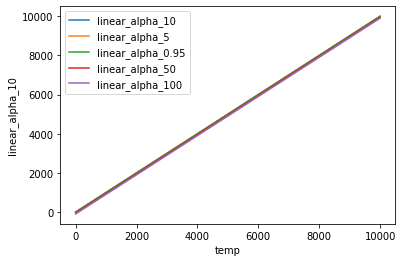

In [59]:
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_10',label='linear_alpha_10')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_5',label='linear_alpha_5')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_0.95',label='linear_alpha_0.95')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_50',label='linear_alpha_50')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_100',label='linear_alpha_100')

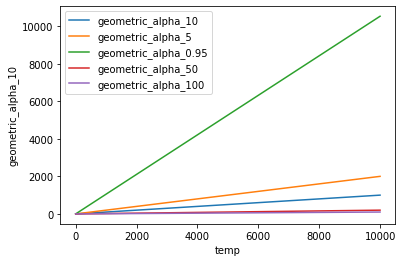

In [60]:
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_10',label ='geometric_alpha_10')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_5',label ='geometric_alpha_5')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_0.95',label ='geometric_alpha_0.95')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_50',label ='geometric_alpha_50')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_100',label ='geometric_alpha_100')

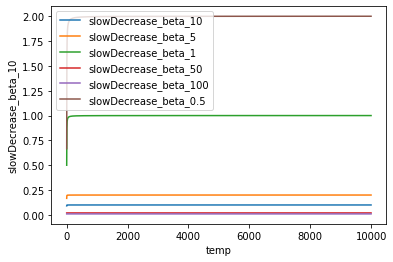

In [65]:
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_10',label ='slowDecrease_beta_10')
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_5',label ='slowDecrease_beta_5')
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_1',label ='slowDecrease_beta_1')
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_50',label ='slowDecrease_beta_50')
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_100',label ='slowDecrease_beta_100')
sns.lineplot(data=comp_cooling, x='temp',y='slowDecrease_beta_0.5',label ='slowDecrease_beta_0.5')

The slow decrease method should be renamed fast drop-off as the there are essentially only two temperatures (the plateau and the near zero) for slow decrease. 

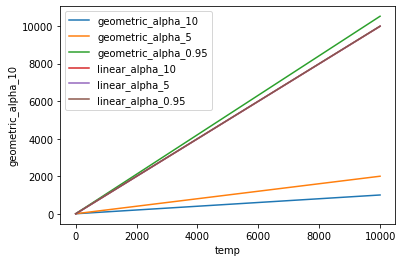

In [56]:
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_10',label ='geometric_alpha_10')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_5',label ='geometric_alpha_5')
sns.lineplot(data=comp_cooling, x='temp',y='geometric_alpha_0.95',label ='geometric_alpha_0.95')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_10',label='linear_alpha_10')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_5',label='linear_alpha_5')
sns.lineplot(data=comp_cooling, x='temp',y='linear_alpha_0.95',label='linear_alpha_0.95')

## Apply Simulated Annealing to optimize over model

Added:
- doc strings
- getting random neighbors
- expand algo to accept any number of inputs
- storing output to pandas df
- verbose option to print output
- upper/lower bound

Started with source code for Simulated Annealing class from https://towardsdatascience.com/optimization-techniques-simulated-annealing-d6a4785a1de7

Next:
- need to implement way to find neighboring int

Note that I did not strictly treat the red_wine variable as binary as the simulated annealing algorithm was allowed to choose any value between 0 (inclusive) & 1 (inclusive).

In [11]:
import random
import math

class SimulatedAnnealing:
    def __init__(self, initialSolution, solutionEvaluator, initialTemp, finalTemp, tempReduction, neighborDistance, 
                 upper_bound,lower_bound,
                 iterationPerTemp=100, alpha=10, beta=5, verbose=1):
        """
        Constructor Method.
            initialSolution : (float) starting solution
            solutionEvaluator: (function) cost function that we are optimizing over
            initialTemp: (float) start temp
            finalTemp : (float) final temp (stopping criteria)
            tempReduction: (str) temperature reduction rule, choice of linear, geometric or slowDecrease
            alpha: (float) temp reduction rule parameter
            beta: (float) temp reduction rule parameter; necessary for Slow-decrease rule, but not other rules
            neighborDistance: (list) distance to search for neighbors in input (search) space
            upper_bound: (list) upper bound in input (search) space
            lower_bound: (list) lower bound in input (search) space
            iterationPerTemp: (float)        
        """
        self.solution = initialSolution
        self.numInputs = len(initialSolution)
        self.evaluate = solutionEvaluator
        self.currTemp = initialTemp
        self.finalTemp = finalTemp
        self.iterationPerTemp = iterationPerTemp
        self.alpha = alpha
        self.beta = beta
        self.verbose = verbose
        self.upper_bound = upper_bound
        self.lower_bound = lower_bound
        self.neighborDistance = neighborDistance
        
        # expand distance for each soln dimension to array
        if len(neighborDistance) != self.numInputs:
            self.neighborDistance = np.repeat(neighborDistance, self.numInputs) 
            
        if tempReduction == "linear":
            self.decrementRule = self.linearTempReduction
        elif tempReduction == "geometric":
            self.decrementRule = self.geometricTempReduction
        elif tempReduction == "slowDecrease":
            self.decrementRule = self.slowDecreaseTempReduction
        else:
            self.decrementRule = tempReduction
        
        # ensure upper/lower bounds are in place else fil with zeros
        if len(lower_bound) < self.numInputs:
            self.lower_bound = np.empty(self.numInputs).fill(0)
            
        if len(upper_bound) < self.numInputs:
            self.upper_bound = np.empty(self.numInputs).fill(0)

    def linearTempReduction(self):
        self.currTemp -= self.alpha

    def geometricTempReduction(self):
        self.currTemp *= (1/self.alpha)

    def slowDecreaseTempReduction(self):
        self.currTemp = self.currTemp / (1 + self.beta * self.currTemp)

    def isTerminationCriteriaMet(self):
        # can add more termination criteria
        return self.currTemp <= self.finalTemp
    
    def _get_neighbor_int(self, current_value, step=1):
        """ Return a neighboring random integer value from some current value.
        :param step: step size range within neighborhood
        :return: random value within neighborhood of current input value
        """
        neighbor = random.randrange(self.lower_bound, self.upper_bound, step)
        return neighbor

    def _get_neighbor_float(self, sig_dig):
        """ Return a neighboring random float from some current value within provided lower/upper bounds.
            Defines neighborhood as current value +- distance
        :param sig_dig: number of significant digits in result
        :return: random value within neighborhood of current input value
        """
        upper_neighbor = self.solution + self.neighborDistance
        lower_neighbor = self.solution - self.neighborDistance
        
        upper_bounds = self.upper_bound
        lower_bounds = self.lower_bound
        
        # enforce upper & lower bounds, loop over all inputs
        upper_neighbor = np.clip(upper_neighbor, None, upper_bounds)
        lower_neighbor = np.clip(lower_neighbor, lower_bounds, None)
            
        neighbor = random.uniform(lower_neighbor, upper_neighbor)
        neighbor = np.around(neighbor, sig_dig)
        return neighbor
    
    def run(self):
        results=[]
        while not self.isTerminationCriteriaMet():
            # iterate that number of times
            for i in range(self.iterationPerTemp):
                # get random neighbors for newSolution
                x_new = self._get_neighbor_float(sig_dig=12)
                newSolution = np.array(x_new)
                # get the cost between the two solutions
                cost_old = self.evaluate(self.solution)[0]
                cost_delta = cost_old - self.evaluate(newSolution)[0]
                if self.verbose:
                    print(f"Iteration {i} - cost: {cost_old:.2f},cost_delta: {cost_delta}, currTemp: {self.currTemp:.2f}")
                results.append((i, self.solution.flatten(), cost_old, self.currTemp)) # store values
                # if the new solution is better, accept it
                if cost_delta >= 0:
                    self.solution = newSolution
                    if self.verbose:
                        print("  new soln was better & accepted.")
                # if the new solution is not better, accept it with a probability of e^(-cost/temp)
                else:
                    acceptance_prob = math.exp(-cost_delta / self.currTemp)
                    if random.uniform(0, 1) < acceptance_prob:
                        self.solution = newSolution
                        if self.verbose:
                            print(f"  new soln was NOT better & was accepted with probability of {acceptance_prob:.2f}.")
                    else:
                        if self.verbose:
                            print(f"  new soln was NOT better & was NOT accepted with probability of {acceptance_prob:.2f}.")
            # decrement the temperature
            self.decrementRule()
        return results

In [9]:
# fill lower bound as min of training data, unless otherwise known
lb = X_train.min(axis=0).values
lb

array([3.8    , 0.08   , 0.     , 0.6    , 0.009  , 1.     , 6.     ,
       0.98711, 2.74   , 0.22   , 8.     , 0.     ])

In [10]:
X_train.max(axis=0).values

array([ 15.6    ,   1.58   ,   1.     ,  65.8    ,   0.611  , 146.5    ,
       344.     ,   1.03898,   4.01   ,   1.95   ,  14.05   ,   1.     ])

In [12]:
# fill upper bound as max of training data, unless otherwise known
ub = X_train.max(axis=0).values
#ub[8] = 14
ub

array([ 15.6    ,   1.58   ,   1.     ,  65.8    ,   0.611  , 146.5    ,
       344.     ,   1.03898,   4.01   ,   1.95   ,  14.05   ,   1.     ])

### Linear Simulated Annealing

We performed SA with:
- linear cooling from temperature from 6000 to 1
- alpha = 10 (default)
- upper and lower bounds informed by the actual data min and max values
- searching a distance of 0.5 from the current solution across all variables

In [13]:
%%time
sa_linear = SimulatedAnnealing(initialSolution=np.array([[7.000e+00, 1.700e-01, 7.400e-01, 1.280e+01, 4.500e-02, 2.400e+01,
        1.260e+02, 9.942e-01, 3.260e+00, 3.800e-01, 1.220e+01, 0.000e+00]]), solutionEvaluator=xg_reg.predict, initialTemp=6000, 
                               finalTemp=1, tempReduction="linear", neighborDistance=[0.5],upper_bound=ub,lower_bound=lb)
# alpha=0.95
results = sa_linear.run()

Iteration 0 - cost: 6.65,cost_delta: 0.3105282783508301, currTemp: 6000.00
  new soln was better & accepted.
Iteration 1 - cost: 6.34,cost_delta: 0.31389760971069336, currTemp: 6000.00
  new soln was better & accepted.
Iteration 2 - cost: 6.02,cost_delta: 0.7499885559082031, currTemp: 6000.00
  new soln was better & accepted.
Iteration 3 - cost: 5.27,cost_delta: -0.893578052520752, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.16,cost_delta: 0.8910045623779297, currTemp: 6000.00
  new soln was better & accepted.
Iteration 5 - cost: 5.27,cost_delta: -1.2699522972106934, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 6.54,cost_delta: 1.6368370056152344, currTemp: 6000.00
  new soln was better & accepted.
Iteration 7 - cost: 4.91,cost_delta: 0.7953972816467285, currTemp: 6000.00
  new soln was better & accepted.
Iteration 8 - cost: 4.11,cost_delta: -2.039473533630371, cur

Iteration 91 - cost: 5.21,cost_delta: 0.24226856231689453, currTemp: 6000.00
  new soln was better & accepted.
Iteration 92 - cost: 4.96,cost_delta: -0.19852876663208008, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.16,cost_delta: -0.8733749389648438, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 6.04,cost_delta: 0.07424783706665039, currTemp: 6000.00
  new soln was better & accepted.
Iteration 95 - cost: 5.96,cost_delta: -0.13719415664672852, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 6.10,cost_delta: 0.12857580184936523, currTemp: 6000.00
  new soln was better & accepted.
Iteration 97 - cost: 5.97,cost_delta: 0.2868947982788086, currTemp: 6000.00
  new soln was better & accepted.
Iteration 98 - cost: 5.68,cost_delta: 0.28663063049316406, currTemp: 6000.00
  new soln was better & accepted.
Iteration 99

Iteration 86 - cost: 5.84,cost_delta: 0.8938789367675781, currTemp: 5990.00
  new soln was better & accepted.
Iteration 87 - cost: 4.95,cost_delta: 1.7679061889648438, currTemp: 5990.00
  new soln was better & accepted.
Iteration 88 - cost: 3.18,cost_delta: -1.0152959823608398, currTemp: 5990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.19,cost_delta: -1.6541152000427246, currTemp: 5990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 5.85,cost_delta: 0.24270963668823242, currTemp: 5990.00
  new soln was better & accepted.
Iteration 91 - cost: 5.61,cost_delta: -0.1992816925048828, currTemp: 5990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.80,cost_delta: 0.1798419952392578, currTemp: 5990.00
  new soln was better & accepted.
Iteration 93 - cost: 5.62,cost_delta: 0.05828380584716797, currTemp: 5990.00
  new soln was better & accepted.
Iteration 94 - c

Iteration 70 - cost: 5.23,cost_delta: 1.7946350574493408, currTemp: 5980.00
  new soln was better & accepted.
Iteration 71 - cost: 3.44,cost_delta: 0.44635581970214844, currTemp: 5980.00
  new soln was better & accepted.
Iteration 72 - cost: 2.99,cost_delta: -1.4003980159759521, currTemp: 5980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 4.39,cost_delta: 1.1016557216644287, currTemp: 5980.00
  new soln was better & accepted.
Iteration 74 - cost: 3.29,cost_delta: 0.2494046688079834, currTemp: 5980.00
  new soln was better & accepted.
Iteration 75 - cost: 3.04,cost_delta: -1.308581829071045, currTemp: 5980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.35,cost_delta: -0.8719544410705566, currTemp: 5980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.22,cost_delta: 0.4330105781555176, currTemp: 5980.00
  new soln was better & accepted.
Iteration 78 - cos

Iteration 48 - cost: 2.42,cost_delta: 0.0017061233520507812, currTemp: 5970.00
  new soln was better & accepted.
Iteration 49 - cost: 2.42,cost_delta: 0.006232023239135742, currTemp: 5970.00
  new soln was better & accepted.
Iteration 50 - cost: 2.41,cost_delta: -3.0722930431365967, currTemp: 5970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.49,cost_delta: 0.7030658721923828, currTemp: 5970.00
  new soln was better & accepted.
Iteration 52 - cost: 4.78,cost_delta: -0.25928306579589844, currTemp: 5970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.04,cost_delta: 0.0273284912109375, currTemp: 5970.00
  new soln was better & accepted.
Iteration 54 - cost: 5.01,cost_delta: -0.3287968635559082, currTemp: 5970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.34,cost_delta: 0.2575855255126953, currTemp: 5970.00
  new soln was better & accepted.
Iteration 56

Iteration 43 - cost: 6.01,cost_delta: 1.892003059387207, currTemp: 5960.00
  new soln was better & accepted.
Iteration 44 - cost: 4.12,cost_delta: -0.5274801254272461, currTemp: 5960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.65,cost_delta: -0.9820966720581055, currTemp: 5960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.63,cost_delta: 0.9071817398071289, currTemp: 5960.00
  new soln was better & accepted.
Iteration 47 - cost: 4.72,cost_delta: 0.5546598434448242, currTemp: 5960.00
  new soln was better & accepted.
Iteration 48 - cost: 4.17,cost_delta: -0.8903145790100098, currTemp: 5960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.06,cost_delta: 0.15683841705322266, currTemp: 5960.00
  new soln was better & accepted.
Iteration 50 - cost: 4.90,cost_delta: -0.5863542556762695, currTemp: 5960.00
  new soln was NOT better & was accepted with proba

Iteration 41 - cost: 5.27,cost_delta: 0.6618022918701172, currTemp: 5950.00
  new soln was better & accepted.
Iteration 42 - cost: 4.61,cost_delta: -0.9238286018371582, currTemp: 5950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.53,cost_delta: 1.0579895973205566, currTemp: 5950.00
  new soln was better & accepted.
Iteration 44 - cost: 4.47,cost_delta: -0.39424753189086914, currTemp: 5950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.87,cost_delta: 0.6413531303405762, currTemp: 5950.00
  new soln was better & accepted.
Iteration 46 - cost: 4.23,cost_delta: -0.9984011650085449, currTemp: 5950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.22,cost_delta: 1.130293846130371, currTemp: 5950.00
  new soln was better & accepted.
Iteration 48 - cost: 4.09,cost_delta: 0.0, currTemp: 5950.00
  new soln was better & accepted.
Iteration 49 - cost: 4.09,cost_de

Iteration 32 - cost: 3.32,cost_delta: -1.423905611038208, currTemp: 5940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.74,cost_delta: 0.11960792541503906, currTemp: 5940.00
  new soln was better & accepted.
Iteration 34 - cost: 4.62,cost_delta: -0.5426149368286133, currTemp: 5940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.16,cost_delta: 0.37180662155151367, currTemp: 5940.00
  new soln was better & accepted.
Iteration 36 - cost: 4.79,cost_delta: -0.34381103515625, currTemp: 5940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.14,cost_delta: 0.8125419616699219, currTemp: 5940.00
  new soln was better & accepted.
Iteration 38 - cost: 4.32,cost_delta: -0.3230314254760742, currTemp: 5940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.65,cost_delta: 0.060436248779296875, currTemp: 5940.00
  new soln was be

Iteration 21 - cost: 5.36,cost_delta: 0.4695892333984375, currTemp: 5930.00
  new soln was better & accepted.
Iteration 22 - cost: 4.89,cost_delta: -0.11482381820678711, currTemp: 5930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.00,cost_delta: 0.11482381820678711, currTemp: 5930.00
  new soln was better & accepted.
Iteration 24 - cost: 4.89,cost_delta: 0.07254934310913086, currTemp: 5930.00
  new soln was better & accepted.
Iteration 25 - cost: 4.82,cost_delta: 2.133951187133789, currTemp: 5930.00
  new soln was better & accepted.
Iteration 26 - cost: 2.68,cost_delta: -0.033293724060058594, currTemp: 5930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.72,cost_delta: -2.0385923385620117, currTemp: 5930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.75,cost_delta: 0.20628643035888672, currTemp: 5930.00
  new soln was better & accepted.
Iteration 29 

Iteration 24 - cost: 4.57,cost_delta: -0.23085784912109375, currTemp: 5920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.80,cost_delta: -0.6511950492858887, currTemp: 5920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.45,cost_delta: -0.4088563919067383, currTemp: 5920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.86,cost_delta: 0.7244176864624023, currTemp: 5920.00
  new soln was better & accepted.
Iteration 28 - cost: 5.14,cost_delta: -0.2393965721130371, currTemp: 5920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.38,cost_delta: 0.14524364471435547, currTemp: 5920.00
  new soln was better & accepted.
Iteration 30 - cost: 5.23,cost_delta: 0.3136892318725586, currTemp: 5920.00
  new soln was better & accepted.
Iteration 31 - cost: 4.92,cost_delta: -0.40887928009033203, currTemp: 5920.00
  new soln was

Iteration 18 - cost: 4.16,cost_delta: -0.6492471694946289, currTemp: 5910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.81,cost_delta: 0.6218767166137695, currTemp: 5910.00
  new soln was better & accepted.
Iteration 20 - cost: 4.18,cost_delta: 0.14982223510742188, currTemp: 5910.00
  new soln was better & accepted.
Iteration 21 - cost: 4.03,cost_delta: -1.1343212127685547, currTemp: 5910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.17,cost_delta: 2.24090576171875, currTemp: 5910.00
  new soln was better & accepted.
Iteration 23 - cost: 2.93,cost_delta: -1.7018647193908691, currTemp: 5910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.63,cost_delta: -0.7812709808349609, currTemp: 5910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.41,cost_delta: 3.648808002471924, currTemp: 5910.00
  new soln was bette

Iteration 11 - cost: 3.72,cost_delta: -1.471848964691162, currTemp: 5900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.19,cost_delta: 2.5290849208831787, currTemp: 5900.00
  new soln was better & accepted.
Iteration 13 - cost: 2.66,cost_delta: -0.3321375846862793, currTemp: 5900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 2.99,cost_delta: -0.6385965347290039, currTemp: 5900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 3.63,cost_delta: 0.1654815673828125, currTemp: 5900.00
  new soln was better & accepted.
Iteration 16 - cost: 3.47,cost_delta: -0.30829787254333496, currTemp: 5900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 3.77,cost_delta: 0.08431029319763184, currTemp: 5900.00
  new soln was better & accepted.
Iteration 18 - cost: 3.69,cost_delta: -0.17812514305114746, currTemp: 5900.00
  new soln was 

Iteration 9 - cost: 3.93,cost_delta: -0.6968615055084229, currTemp: 5890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 4.63,cost_delta: 0.013132572174072266, currTemp: 5890.00
  new soln was better & accepted.
Iteration 11 - cost: 4.62,cost_delta: -0.03991127014160156, currTemp: 5890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 4.66,cost_delta: 1.1489510536193848, currTemp: 5890.00
  new soln was better & accepted.
Iteration 13 - cost: 3.51,cost_delta: -0.002922534942626953, currTemp: 5890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 3.51,cost_delta: -1.1778326034545898, currTemp: 5890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 4.69,cost_delta: 0.04406023025512695, currTemp: 5890.00
  new soln was better & accepted.
Iteration 16 - cost: 4.64,cost_delta: 0.9115760326385498, currTemp: 5890.00
  new soln wa

Iteration 6 - cost: 3.43,cost_delta: -1.0957703590393066, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 4.52,cost_delta: 2.1135802268981934, currTemp: 5880.00
  new soln was better & accepted.
Iteration 8 - cost: 2.41,cost_delta: -3.4975509643554688, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.91,cost_delta: 3.4975509643554688, currTemp: 5880.00
  new soln was better & accepted.
Iteration 10 - cost: 2.41,cost_delta: -0.26470017433166504, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 2.67,cost_delta: 0.1897115707397461, currTemp: 5880.00
  new soln was better & accepted.
Iteration 12 - cost: 2.48,cost_delta: -0.25091099739074707, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 2.74,cost_delta: 0.3331284523010254, currTemp: 5880.00
  new soln was bette

Iteration 95 - cost: 3.36,cost_delta: -0.08171796798706055, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 3.45,cost_delta: -1.7464914321899414, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.19,cost_delta: -0.2622489929199219, currTemp: 5880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.45,cost_delta: 0.010829925537109375, currTemp: 5880.00
  new soln was better & accepted.
Iteration 99 - cost: 5.44,cost_delta: 0.1361527442932129, currTemp: 5880.00
  new soln was better & accepted.
Iteration 0 - cost: 5.31,cost_delta: 2.0641393661499023, currTemp: 5870.00
  new soln was better & accepted.
Iteration 1 - cost: 3.24,cost_delta: -0.13441896438598633, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 3.38,cost_delta: -0.15139198303222656, currTemp: 5870.00
  new soln was 

Iteration 93 - cost: 3.92,cost_delta: -0.19179534912109375, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.11,cost_delta: -0.31853246688842773, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 4.43,cost_delta: -0.13930940628051758, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 4.57,cost_delta: -1.0482444763183594, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.62,cost_delta: 1.9637181758880615, currTemp: 5870.00
  new soln was better & accepted.
Iteration 98 - cost: 3.66,cost_delta: -1.0108449459075928, currTemp: 5870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.67,cost_delta: 0.7168478965759277, currTemp: 5870.00
  new soln was better & accepted.
Iteration 0 - cost: 3.95,cost_delta: 0.43817877769470215,

Iteration 92 - cost: 3.87,cost_delta: -0.6024117469787598, currTemp: 5860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.47,cost_delta: -0.2504897117614746, currTemp: 5860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.72,cost_delta: 0.7338869571685791, currTemp: 5860.00
  new soln was better & accepted.
Iteration 95 - cost: 3.99,cost_delta: -0.34841084480285645, currTemp: 5860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 4.34,cost_delta: 0.0846567153930664, currTemp: 5860.00
  new soln was better & accepted.
Iteration 97 - cost: 4.25,cost_delta: -0.06762218475341797, currTemp: 5860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 4.32,cost_delta: 0.0575709342956543, currTemp: 5860.00
  new soln was better & accepted.
Iteration 99 - cost: 4.26,cost_delta: -1.6270456314086914, currTemp: 5860.00
  new soln was 

Iteration 84 - cost: 5.58,cost_delta: -0.020221710205078125, currTemp: 5850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.60,cost_delta: -0.1328434944152832, currTemp: 5850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.74,cost_delta: 0.4725337028503418, currTemp: 5850.00
  new soln was better & accepted.
Iteration 87 - cost: 5.26,cost_delta: 2.011681079864502, currTemp: 5850.00
  new soln was better & accepted.
Iteration 88 - cost: 3.25,cost_delta: -0.18992948532104492, currTemp: 5850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 3.44,cost_delta: -0.017363548278808594, currTemp: 5850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 3.46,cost_delta: 0.26439499855041504, currTemp: 5850.00
  new soln was better & accepted.
Iteration 91 - cost: 3.20,cost_delta: -0.07492876052856445, currTemp: 5850.00
  new soln 

Iteration 88 - cost: 3.24,cost_delta: 0.5799970626831055, currTemp: 5840.00
  new soln was better & accepted.
Iteration 89 - cost: 2.66,cost_delta: -0.020477771759033203, currTemp: 5840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 2.68,cost_delta: -1.2148888111114502, currTemp: 5840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 3.89,cost_delta: -0.14571499824523926, currTemp: 5840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 4.04,cost_delta: 1.189342975616455, currTemp: 5840.00
  new soln was better & accepted.
Iteration 93 - cost: 2.85,cost_delta: 0.31230592727661133, currTemp: 5840.00
  new soln was better & accepted.
Iteration 94 - cost: 2.54,cost_delta: -0.697547197341919, currTemp: 5840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 3.24,cost_delta: 0.06607913970947266, currTemp: 5840.00
  new soln was 

Iteration 87 - cost: 5.96,cost_delta: -0.04579591751098633, currTemp: 5830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 6.01,cost_delta: -0.3736114501953125, currTemp: 5830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 6.38,cost_delta: 1.6557960510253906, currTemp: 5830.00
  new soln was better & accepted.
Iteration 90 - cost: 4.72,cost_delta: 1.9044852256774902, currTemp: 5830.00
  new soln was better & accepted.
Iteration 91 - cost: 2.82,cost_delta: 0.1661396026611328, currTemp: 5830.00
  new soln was better & accepted.
Iteration 92 - cost: 2.65,cost_delta: 0.0, currTemp: 5830.00
  new soln was better & accepted.
Iteration 93 - cost: 2.65,cost_delta: -0.010081768035888672, currTemp: 5830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 2.66,cost_delta: -1.1152970790863037, currTemp: 5830.00
  new soln was NOT better & was accepted with probability of 1.

Iteration 77 - cost: 5.83,cost_delta: 0.144805908203125, currTemp: 5820.00
  new soln was better & accepted.
Iteration 78 - cost: 5.69,cost_delta: -0.020587921142578125, currTemp: 5820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.71,cost_delta: -0.5696706771850586, currTemp: 5820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 6.28,cost_delta: 0.9095616340637207, currTemp: 5820.00
  new soln was better & accepted.
Iteration 81 - cost: 5.37,cost_delta: -0.08882617950439453, currTemp: 5820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.45,cost_delta: -0.6473469734191895, currTemp: 5820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 6.10,cost_delta: 0.47749757766723633, currTemp: 5820.00
  new soln was better & accepted.
Iteration 84 - cost: 5.62,cost_delta: 0.024021148681640625, currTemp: 5820.00
  new soln wa

Iteration 82 - cost: 3.47,cost_delta: -1.4130043983459473, currTemp: 5810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 4.88,cost_delta: -0.0466923713684082, currTemp: 5810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 4.93,cost_delta: -1.0749421119689941, currTemp: 5810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 6.01,cost_delta: 0.8925051689147949, currTemp: 5810.00
  new soln was better & accepted.
Iteration 86 - cost: 5.11,cost_delta: 0.5501861572265625, currTemp: 5810.00
  new soln was better & accepted.
Iteration 87 - cost: 4.56,cost_delta: -0.10133504867553711, currTemp: 5810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.66,cost_delta: -0.9838948249816895, currTemp: 5810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.65,cost_delta: 0.36364078521728516, 

Iteration 83 - cost: 4.52,cost_delta: 0.06433582305908203, currTemp: 5800.00
  new soln was better & accepted.
Iteration 84 - cost: 4.45,cost_delta: 0.985048770904541, currTemp: 5800.00
  new soln was better & accepted.
Iteration 85 - cost: 3.47,cost_delta: -1.4151668548583984, currTemp: 5800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 4.88,cost_delta: 1.6996898651123047, currTemp: 5800.00
  new soln was better & accepted.
Iteration 87 - cost: 3.18,cost_delta: -0.8232765197753906, currTemp: 5800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.01,cost_delta: 0.0008597373962402344, currTemp: 5800.00
  new soln was better & accepted.
Iteration 89 - cost: 4.01,cost_delta: -0.9329137802124023, currTemp: 5800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.94,cost_delta: 0.2955446243286133, currTemp: 5800.00
  new soln was better & accepted.
Iteration 91 - 

Iteration 75 - cost: 4.43,cost_delta: 0.06318473815917969, currTemp: 5790.00
  new soln was better & accepted.
Iteration 76 - cost: 4.37,cost_delta: 0.033553123474121094, currTemp: 5790.00
  new soln was better & accepted.
Iteration 77 - cost: 4.34,cost_delta: -0.03575325012207031, currTemp: 5790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.37,cost_delta: 0.483795166015625, currTemp: 5790.00
  new soln was better & accepted.
Iteration 79 - cost: 3.89,cost_delta: -0.3952598571777344, currTemp: 5790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.29,cost_delta: -0.05795717239379883, currTemp: 5790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 4.34,cost_delta: -0.24588584899902344, currTemp: 5790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.59,cost_delta: -0.023101329803466797, currTemp: 5790.00
  new soln

Iteration 73 - cost: 4.57,cost_delta: 0.3917875289916992, currTemp: 5780.00
  new soln was better & accepted.
Iteration 74 - cost: 4.18,cost_delta: -0.4461174011230469, currTemp: 5780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 4.63,cost_delta: 0.1465449333190918, currTemp: 5780.00
  new soln was better & accepted.
Iteration 76 - cost: 4.48,cost_delta: -0.1670970916748047, currTemp: 5780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.65,cost_delta: 1.3131237030029297, currTemp: 5780.00
  new soln was better & accepted.
Iteration 78 - cost: 3.34,cost_delta: -1.6687641143798828, currTemp: 5780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.00,cost_delta: 0.6142258644104004, currTemp: 5780.00
  new soln was better & accepted.
Iteration 80 - cost: 4.39,cost_delta: -0.5746335983276367, currTemp: 5780.00
  new soln was NOT better & was accepted with proba

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.09,cost_delta: -0.22373485565185547, currTemp: 5770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.31,cost_delta: 2.545426845550537, currTemp: 5770.00
  new soln was better & accepted.
Iteration 74 - cost: 2.76,cost_delta: -3.021425247192383, currTemp: 5770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.78,cost_delta: 0.3359246253967285, currTemp: 5770.00
  new soln was better & accepted.
Iteration 76 - cost: 5.45,cost_delta: 0.297788143157959, currTemp: 5770.00
  new soln was better & accepted.
Iteration 77 - cost: 5.15,cost_delta: 0.05860328674316406, currTemp: 5770.00
  new soln was better & accepted.
Iteration 78 - cost: 5.09,cost_delta: 1.9391999244689941, currTemp: 5770.00
  new soln was better & accepted.
Iteration 79 - cost: 3.15,cost_delta: -0.5549230575561523, currTemp: 5770.00
  new soln was NOT 

Iteration 76 - cost: 4.77,cost_delta: 2.1493706703186035, currTemp: 5760.00
  new soln was better & accepted.
Iteration 77 - cost: 2.62,cost_delta: -1.3771629333496094, currTemp: 5760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.00,cost_delta: 0.2691025733947754, currTemp: 5760.00
  new soln was better & accepted.
Iteration 79 - cost: 3.73,cost_delta: -0.7374019622802734, currTemp: 5760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.47,cost_delta: 1.9251704216003418, currTemp: 5760.00
  new soln was better & accepted.
Iteration 81 - cost: 2.54,cost_delta: -0.08263111114501953, currTemp: 5760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 2.62,cost_delta: -0.0727078914642334, currTemp: 5760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 2.70,cost_delta: 0.17562103271484375, currTemp: 5760.00
  new soln was b

Iteration 81 - cost: 3.64,cost_delta: -2.26200532913208, currTemp: 5750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.90,cost_delta: 0.17415189743041992, currTemp: 5750.00
  new soln was better & accepted.
Iteration 83 - cost: 5.73,cost_delta: 0.13684892654418945, currTemp: 5750.00
  new soln was better & accepted.
Iteration 84 - cost: 5.59,cost_delta: 0.3549823760986328, currTemp: 5750.00
  new soln was better & accepted.
Iteration 85 - cost: 5.24,cost_delta: 0.16241931915283203, currTemp: 5750.00
  new soln was better & accepted.
Iteration 86 - cost: 5.07,cost_delta: -0.5764079093933105, currTemp: 5750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 5.65,cost_delta: 0.13076305389404297, currTemp: 5750.00
  new soln was better & accepted.
Iteration 88 - cost: 5.52,cost_delta: 0.25134849548339844, currTemp: 5750.00
  new soln was better & accepted.
Iteration 89 - cost: 5.27,cost_delta: 1.784921646

Iteration 72 - cost: 4.99,cost_delta: 2.2955431938171387, currTemp: 5740.00
  new soln was better & accepted.
Iteration 73 - cost: 2.69,cost_delta: -0.48337388038635254, currTemp: 5740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 3.17,cost_delta: -0.0727691650390625, currTemp: 5740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 3.25,cost_delta: 0.004779815673828125, currTemp: 5740.00
  new soln was better & accepted.
Iteration 76 - cost: 3.24,cost_delta: -0.13482284545898438, currTemp: 5740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 3.38,cost_delta: 0.12471127510070801, currTemp: 5740.00
  new soln was better & accepted.
Iteration 78 - cost: 3.25,cost_delta: -0.1685323715209961, currTemp: 5740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 3.42,cost_delta: -0.13866353034973145, currTemp: 5740.00
  new soln 

Iteration 62 - cost: 3.25,cost_delta: 0.842839241027832, currTemp: 5730.00
  new soln was better & accepted.
Iteration 63 - cost: 2.41,cost_delta: -0.03306722640991211, currTemp: 5730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 2.44,cost_delta: -0.11909937858581543, currTemp: 5730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 2.56,cost_delta: 0.028747081756591797, currTemp: 5730.00
  new soln was better & accepted.
Iteration 66 - cost: 2.53,cost_delta: -0.6139862537384033, currTemp: 5730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 3.15,cost_delta: 0.045693159103393555, currTemp: 5730.00
  new soln was better & accepted.
Iteration 68 - cost: 3.10,cost_delta: -0.11669111251831055, currTemp: 5730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 3.22,cost_delta: -1.878291368484497, currTemp: 5730.00
  new soln w

Iteration 55 - cost: 3.26,cost_delta: -0.4264709949493408, currTemp: 5720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 3.69,cost_delta: 0.3766186237335205, currTemp: 5720.00
  new soln was better & accepted.
Iteration 57 - cost: 3.31,cost_delta: -0.15217018127441406, currTemp: 5720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 3.47,cost_delta: -0.23155903816223145, currTemp: 5720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 3.70,cost_delta: 0.1793673038482666, currTemp: 5720.00
  new soln was better & accepted.
Iteration 60 - cost: 3.52,cost_delta: -0.24797415733337402, currTemp: 5720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 3.77,cost_delta: 0.30016589164733887, currTemp: 5720.00
  new soln was better & accepted.
Iteration 62 - cost: 3.47,cost_delta: 0.844822883605957, currTemp: 5720.00
  new soln was 

Iteration 51 - cost: 4.85,cost_delta: 1.313136339187622, currTemp: 5710.00
  new soln was better & accepted.
Iteration 52 - cost: 3.54,cost_delta: 0.6668803691864014, currTemp: 5710.00
  new soln was better & accepted.
Iteration 53 - cost: 2.87,cost_delta: 0.08524847030639648, currTemp: 5710.00
  new soln was better & accepted.
Iteration 54 - cost: 2.78,cost_delta: -0.4838838577270508, currTemp: 5710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 3.27,cost_delta: -0.312406063079834, currTemp: 5710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 3.58,cost_delta: 0.14258956909179688, currTemp: 5710.00
  new soln was better & accepted.
Iteration 57 - cost: 3.44,cost_delta: 0.8673496246337891, currTemp: 5710.00
  new soln was better & accepted.
Iteration 58 - cost: 2.57,cost_delta: -0.12036657333374023, currTemp: 5710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - co

Iteration 42 - cost: 5.14,cost_delta: -0.5472650527954102, currTemp: 5700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.69,cost_delta: 0.8388962745666504, currTemp: 5700.00
  new soln was better & accepted.
Iteration 44 - cost: 4.85,cost_delta: 2.105102062225342, currTemp: 5700.00
  new soln was better & accepted.
Iteration 45 - cost: 2.75,cost_delta: -0.12527990341186523, currTemp: 5700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.87,cost_delta: -2.6676077842712402, currTemp: 5700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.54,cost_delta: 0.6781320571899414, currTemp: 5700.00
  new soln was better & accepted.
Iteration 48 - cost: 4.86,cost_delta: 2.0644044876098633, currTemp: 5700.00
  new soln was better & accepted.
Iteration 49 - cost: 2.80,cost_delta: -0.17118501663208008, currTemp: 5700.00
  new soln was NOT better & was accepted with prob

Iteration 42 - cost: 5.24,cost_delta: 2.5079541206359863, currTemp: 5690.00
  new soln was better & accepted.
Iteration 43 - cost: 2.74,cost_delta: -0.524160623550415, currTemp: 5690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 3.26,cost_delta: 0.1920621395111084, currTemp: 5690.00
  new soln was better & accepted.
Iteration 45 - cost: 3.07,cost_delta: -2.4540629386901855, currTemp: 5690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.52,cost_delta: 0.4583148956298828, currTemp: 5690.00
  new soln was better & accepted.
Iteration 47 - cost: 5.06,cost_delta: -0.005239009857177734, currTemp: 5690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.07,cost_delta: -0.5296621322631836, currTemp: 5690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.60,cost_delta: 0.8318147659301758, currTemp: 5690.00
  new soln was be

Iteration 38 - cost: 5.08,cost_delta: -0.5305585861206055, currTemp: 5680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.61,cost_delta: 0.9659547805786133, currTemp: 5680.00
  new soln was better & accepted.
Iteration 40 - cost: 4.64,cost_delta: -1.0039925575256348, currTemp: 5680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.65,cost_delta: 0.9181256294250488, currTemp: 5680.00
  new soln was better & accepted.
Iteration 42 - cost: 4.73,cost_delta: -0.9822206497192383, currTemp: 5680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.71,cost_delta: -0.16562938690185547, currTemp: 5680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.88,cost_delta: 0.5836625099182129, currTemp: 5680.00
  new soln was better & accepted.
Iteration 45 - cost: 5.29,cost_delta: -0.6016941070556641, currTemp: 5680.00
  new soln was N

Iteration 26 - cost: 5.15,cost_delta: 1.0308170318603516, currTemp: 5670.00
  new soln was better & accepted.
Iteration 27 - cost: 4.12,cost_delta: 0.36920833587646484, currTemp: 5670.00
  new soln was better & accepted.
Iteration 28 - cost: 3.75,cost_delta: 0.5831212997436523, currTemp: 5670.00
  new soln was better & accepted.
Iteration 29 - cost: 3.16,cost_delta: -0.1518387794494629, currTemp: 5670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 3.32,cost_delta: -1.294804573059082, currTemp: 5670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.61,cost_delta: -0.19852495193481445, currTemp: 5670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.81,cost_delta: -0.04729509353637695, currTemp: 5670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.86,cost_delta: 0.2364497184753418, currTemp: 5670.00
  new soln was b

Iteration 21 - cost: 4.59,cost_delta: -1.2596173286437988, currTemp: 5660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.85,cost_delta: 1.115121841430664, currTemp: 5660.00
  new soln was better & accepted.
Iteration 23 - cost: 4.74,cost_delta: 0.04794502258300781, currTemp: 5660.00
  new soln was better & accepted.
Iteration 24 - cost: 4.69,cost_delta: -0.13640499114990234, currTemp: 5660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.83,cost_delta: 0.09723329544067383, currTemp: 5660.00
  new soln was better & accepted.
Iteration 26 - cost: 4.73,cost_delta: 0.6550397872924805, currTemp: 5660.00
  new soln was better & accepted.
Iteration 27 - cost: 4.07,cost_delta: -0.9762349128723145, currTemp: 5660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 5.05,cost_delta: 0.17287683486938477, currTemp: 5660.00
  new soln was better & accepted.
Iteration 29 - 

Iteration 23 - cost: 5.74,cost_delta: 0.32430505752563477, currTemp: 5650.00
  new soln was better & accepted.
Iteration 24 - cost: 5.41,cost_delta: 2.7516589164733887, currTemp: 5650.00
  new soln was better & accepted.
Iteration 25 - cost: 2.66,cost_delta: -0.3915567398071289, currTemp: 5650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 3.05,cost_delta: -2.7016615867614746, currTemp: 5650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.75,cost_delta: 0.34711456298828125, currTemp: 5650.00
  new soln was better & accepted.
Iteration 28 - cost: 5.41,cost_delta: 0.15865755081176758, currTemp: 5650.00
  new soln was better & accepted.
Iteration 29 - cost: 5.25,cost_delta: 0.4620852470397949, currTemp: 5650.00
  new soln was better & accepted.
Iteration 30 - cost: 4.78,cost_delta: -0.03324270248413086, currTemp: 5650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 -

Iteration 28 - cost: 3.14,cost_delta: 0.9094910621643066, currTemp: 5640.00
  new soln was better & accepted.
Iteration 29 - cost: 2.23,cost_delta: -2.687215566635132, currTemp: 5640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.92,cost_delta: 0.43610620498657227, currTemp: 5640.00
  new soln was better & accepted.
Iteration 31 - cost: 4.48,cost_delta: -1.3470935821533203, currTemp: 5640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.83,cost_delta: 0.5610837936401367, currTemp: 5640.00
  new soln was better & accepted.
Iteration 33 - cost: 5.27,cost_delta: 0.43843650817871094, currTemp: 5640.00
  new soln was better & accepted.
Iteration 34 - cost: 4.83,cost_delta: -0.1372981071472168, currTemp: 5640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.97,cost_delta: 1.6960809230804443, currTemp: 5640.00
  new soln was better & accepted.
Iteration 36 - co

Iteration 25 - cost: 3.56,cost_delta: 1.2278623580932617, currTemp: 5630.00
  new soln was better & accepted.
Iteration 26 - cost: 2.33,cost_delta: 0.21983695030212402, currTemp: 5630.00
  new soln was better & accepted.
Iteration 27 - cost: 2.11,cost_delta: -0.2751801013946533, currTemp: 5630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.39,cost_delta: -1.5091023445129395, currTemp: 5630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.90,cost_delta: -1.1893606185913086, currTemp: 5630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 5.09,cost_delta: 2.7930383682250977, currTemp: 5630.00
  new soln was better & accepted.
Iteration 31 - cost: 2.29,cost_delta: -0.16950416564941406, currTemp: 5630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.46,cost_delta: -0.19778203964233398, currTemp: 5630.00
  new soln was

Iteration 19 - cost: 4.76,cost_delta: -0.13422822952270508, currTemp: 5620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.89,cost_delta: 0.37224817276000977, currTemp: 5620.00
  new soln was better & accepted.
Iteration 21 - cost: 4.52,cost_delta: -0.3108997344970703, currTemp: 5620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.83,cost_delta: 0.45111083984375, currTemp: 5620.00
  new soln was better & accepted.
Iteration 23 - cost: 4.38,cost_delta: -0.5941143035888672, currTemp: 5620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.98,cost_delta: 0.8751401901245117, currTemp: 5620.00
  new soln was better & accepted.
Iteration 25 - cost: 4.10,cost_delta: -0.0778512954711914, currTemp: 5620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.18,cost_delta: 0.8513879776000977, currTemp: 5620.00
  new soln was bet

Iteration 16 - cost: 4.10,cost_delta: -0.41626501083374023, currTemp: 5610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 4.52,cost_delta: 0.03955078125, currTemp: 5610.00
  new soln was better & accepted.
Iteration 18 - cost: 4.48,cost_delta: -0.08453893661499023, currTemp: 5610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.56,cost_delta: 0.003783702850341797, currTemp: 5610.00
  new soln was better & accepted.
Iteration 20 - cost: 4.56,cost_delta: 0.1261768341064453, currTemp: 5610.00
  new soln was better & accepted.
Iteration 21 - cost: 4.43,cost_delta: 0.37174415588378906, currTemp: 5610.00
  new soln was better & accepted.
Iteration 22 - cost: 4.06,cost_delta: -0.6031017303466797, currTemp: 5610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.67,cost_delta: 0.568932056427002, currTemp: 5610.00
  new soln was better & accepted.
Iteration 24 - cost

Iteration 16 - cost: 4.28,cost_delta: 0.03851938247680664, currTemp: 5600.00
  new soln was better & accepted.
Iteration 17 - cost: 4.24,cost_delta: -0.5892972946166992, currTemp: 5600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.83,cost_delta: -0.9798154830932617, currTemp: 5600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.81,cost_delta: 1.2654705047607422, currTemp: 5600.00
  new soln was better & accepted.
Iteration 20 - cost: 4.54,cost_delta: 0.8054327964782715, currTemp: 5600.00
  new soln was better & accepted.
Iteration 21 - cost: 3.74,cost_delta: -1.2036962509155273, currTemp: 5600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.94,cost_delta: 1.144083023071289, currTemp: 5600.00
  new soln was better & accepted.
Iteration 23 - cost: 3.80,cost_delta: -0.37676143646240234, currTemp: 5600.00
  new soln was NOT better & was accepted with prob

Iteration 21 - cost: 4.97,cost_delta: -0.07687902450561523, currTemp: 5590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.04,cost_delta: 0.18915319442749023, currTemp: 5590.00
  new soln was better & accepted.
Iteration 23 - cost: 4.86,cost_delta: -0.09277772903442383, currTemp: 5590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.95,cost_delta: 1.0243828296661377, currTemp: 5590.00
  new soln was better & accepted.
Iteration 25 - cost: 3.92,cost_delta: -0.8033721446990967, currTemp: 5590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.73,cost_delta: -0.5352959632873535, currTemp: 5590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.26,cost_delta: 0.18295621871948242, currTemp: 5590.00
  new soln was better & accepted.
Iteration 28 - cost: 5.08,cost_delta: 0.010669231414794922, currTemp: 5590.00
  new soln w

Iteration 24 - cost: 4.56,cost_delta: -0.1989755630493164, currTemp: 5580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.76,cost_delta: 0.6730232238769531, currTemp: 5580.00
  new soln was better & accepted.
Iteration 26 - cost: 4.09,cost_delta: -0.7402682304382324, currTemp: 5580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 4.83,cost_delta: 0.07654714584350586, currTemp: 5580.00
  new soln was better & accepted.
Iteration 28 - cost: 4.75,cost_delta: -0.6585187911987305, currTemp: 5580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.41,cost_delta: 0.5163125991821289, currTemp: 5580.00
  new soln was better & accepted.
Iteration 30 - cost: 4.89,cost_delta: 0.13293123245239258, currTemp: 5580.00
  new soln was better & accepted.
Iteration 31 - cost: 4.76,cost_delta: 0.3704872131347656, currTemp: 5580.00
  new soln was better & accepted.
Iteration 32 - c

Iteration 20 - cost: 4.67,cost_delta: 0.7264759540557861, currTemp: 5570.00
  new soln was better & accepted.
Iteration 21 - cost: 3.94,cost_delta: 0.07824397087097168, currTemp: 5570.00
  new soln was better & accepted.
Iteration 22 - cost: 3.87,cost_delta: -0.9483523368835449, currTemp: 5570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.81,cost_delta: 0.7121739387512207, currTemp: 5570.00
  new soln was better & accepted.
Iteration 24 - cost: 4.10,cost_delta: -0.37683582305908203, currTemp: 5570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.48,cost_delta: 1.968282699584961, currTemp: 5570.00
  new soln was better & accepted.
Iteration 26 - cost: 2.51,cost_delta: -2.508244514465332, currTemp: 5570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.02,cost_delta: -0.07997560501098633, currTemp: 5570.00
  new soln was NOT better & was accepted with prob

Iteration 17 - cost: 3.82,cost_delta: -0.011901140213012695, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 3.84,cost_delta: -0.11705708503723145, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 3.95,cost_delta: -1.2995953559875488, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.25,cost_delta: 1.41036057472229, currTemp: 5560.00
  new soln was better & accepted.
Iteration 21 - cost: 3.84,cost_delta: -0.05753588676452637, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 3.90,cost_delta: -0.1565847396850586, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.06,cost_delta: -0.46120500564575195, currTemp: 5560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.

Iteration 6 - cost: 4.35,cost_delta: -0.03756427764892578, currTemp: 5550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 4.38,cost_delta: 0.0464472770690918, currTemp: 5550.00
  new soln was better & accepted.
Iteration 8 - cost: 4.34,cost_delta: -0.9941501617431641, currTemp: 5550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.33,cost_delta: 1.0795340538024902, currTemp: 5550.00
  new soln was better & accepted.
Iteration 10 - cost: 4.25,cost_delta: -0.5809893608093262, currTemp: 5550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 4.83,cost_delta: 0.012094497680664062, currTemp: 5550.00
  new soln was better & accepted.
Iteration 12 - cost: 4.82,cost_delta: 0.061708927154541016, currTemp: 5550.00
  new soln was better & accepted.
Iteration 13 - cost: 4.76,cost_delta: 0.7465066909790039, currTemp: 5550.00
  new soln was better & accepted.
Iteration 14 - co

Iteration 99 - cost: 4.82,cost_delta: 0.0, currTemp: 5550.00
  new soln was better & accepted.
Iteration 0 - cost: 4.82,cost_delta: -0.0729823112487793, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.89,cost_delta: 2.969170093536377, currTemp: 5540.00
  new soln was better & accepted.
Iteration 2 - cost: 1.92,cost_delta: -1.5057493448257446, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 3.43,cost_delta: -0.4582550525665283, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 3.89,cost_delta: -0.2606477737426758, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.15,cost_delta: 2.0578083992004395, currTemp: 5540.00
  new soln was better & accepted.
Iteration 6 - cost: 2.09,cost_delta: -1.4553701877593994, currTemp: 5540.00
  new soln was NOT better & was accepted

Iteration 86 - cost: 3.74,cost_delta: 0.04839587211608887, currTemp: 5540.00
  new soln was better & accepted.
Iteration 87 - cost: 3.69,cost_delta: -0.4069366455078125, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.10,cost_delta: 0.4337618350982666, currTemp: 5540.00
  new soln was better & accepted.
Iteration 89 - cost: 3.66,cost_delta: -0.4520246982574463, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.12,cost_delta: 0.22144341468811035, currTemp: 5540.00
  new soln was better & accepted.
Iteration 91 - cost: 3.89,cost_delta: -0.5759537220001221, currTemp: 5540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 4.47,cost_delta: 0.10100078582763672, currTemp: 5540.00
  new soln was better & accepted.
Iteration 93 - cost: 4.37,cost_delta: 0.4389634132385254, currTemp: 5540.00
  new soln was better & accepted.
Iteration 94 - 

Iteration 74 - cost: 3.93,cost_delta: -0.03392934799194336, currTemp: 5530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 3.97,cost_delta: -0.30707216262817383, currTemp: 5530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.27,cost_delta: 0.3866267204284668, currTemp: 5530.00
  new soln was better & accepted.
Iteration 77 - cost: 3.89,cost_delta: 0.040450334548950195, currTemp: 5530.00
  new soln was better & accepted.
Iteration 78 - cost: 3.85,cost_delta: -0.38141417503356934, currTemp: 5530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.23,cost_delta: 0.1214137077331543, currTemp: 5530.00
  new soln was better & accepted.
Iteration 80 - cost: 4.11,cost_delta: 0.20888710021972656, currTemp: 5530.00
  new soln was better & accepted.
Iteration 81 - cost: 3.90,cost_delta: -0.6278467178344727, currTemp: 5530.00
  new soln was NOT better & was accepted with

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.33,cost_delta: 0.3000783920288086, currTemp: 5520.00
  new soln was better & accepted.
Iteration 72 - cost: 5.03,cost_delta: -0.21968746185302734, currTemp: 5520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.25,cost_delta: 0.37430763244628906, currTemp: 5520.00
  new soln was better & accepted.
Iteration 74 - cost: 4.87,cost_delta: 2.0979621410369873, currTemp: 5520.00
  new soln was better & accepted.
Iteration 75 - cost: 2.77,cost_delta: -0.05433034896850586, currTemp: 5520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 2.83,cost_delta: 0.45227694511413574, currTemp: 5520.00
  new soln was better & accepted.
Iteration 77 - cost: 2.38,cost_delta: -0.0029230117797851562, currTemp: 5520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 2.38,cost_delta: -0.4808726310729

Iteration 69 - cost: 2.14,cost_delta: -0.3179621696472168, currTemp: 5510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 2.46,cost_delta: 0.004779815673828125, currTemp: 5510.00
  new soln was better & accepted.
Iteration 71 - cost: 2.45,cost_delta: -1.4409005641937256, currTemp: 5510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 3.89,cost_delta: -0.6351315975189209, currTemp: 5510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 4.53,cost_delta: -0.4810805320739746, currTemp: 5510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.01,cost_delta: -0.11935234069824219, currTemp: 5510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.13,cost_delta: 0.1006765365600586, currTemp: 5510.00
  new soln was better & accepted.
Iteration 76 - cost: 5.03,cost_delta: 0.39578962326049805

Iteration 70 - cost: 3.14,cost_delta: -2.3753013610839844, currTemp: 5500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.51,cost_delta: 0.053774356842041016, currTemp: 5500.00
  new soln was better & accepted.
Iteration 72 - cost: 5.46,cost_delta: -0.11215782165527344, currTemp: 5500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.57,cost_delta: 3.3790926933288574, currTemp: 5500.00
  new soln was better & accepted.
Iteration 74 - cost: 2.19,cost_delta: -2.8356919288635254, currTemp: 5500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.03,cost_delta: -0.3119692802429199, currTemp: 5500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.34,cost_delta: -0.12055444717407227, currTemp: 5500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.46,cost_delta: 0.0830702781677246

Iteration 76 - cost: 2.88,cost_delta: -1.943150520324707, currTemp: 5490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.82,cost_delta: 1.527778148651123, currTemp: 5490.00
  new soln was better & accepted.
Iteration 78 - cost: 3.29,cost_delta: 0.6787779331207275, currTemp: 5490.00
  new soln was better & accepted.
Iteration 79 - cost: 2.61,cost_delta: -3.196211576461792, currTemp: 5490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.81,cost_delta: 0.7576355934143066, currTemp: 5490.00
  new soln was better & accepted.
Iteration 81 - cost: 5.05,cost_delta: 0.13308238983154297, currTemp: 5490.00
  new soln was better & accepted.
Iteration 82 - cost: 4.92,cost_delta: 0.697235107421875, currTemp: 5490.00
  new soln was better & accepted.
Iteration 83 - cost: 4.22,cost_delta: -0.7985529899597168, currTemp: 5490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 

Iteration 79 - cost: 5.02,cost_delta: 0.5296950340270996, currTemp: 5480.00
  new soln was better & accepted.
Iteration 80 - cost: 4.49,cost_delta: 0.13132905960083008, currTemp: 5480.00
  new soln was better & accepted.
Iteration 81 - cost: 4.36,cost_delta: -0.01717090606689453, currTemp: 5480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.38,cost_delta: 0.5824942588806152, currTemp: 5480.00
  new soln was better & accepted.
Iteration 83 - cost: 3.79,cost_delta: -0.8945794105529785, currTemp: 5480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 4.69,cost_delta: 0.14852237701416016, currTemp: 5480.00
  new soln was better & accepted.
Iteration 85 - cost: 4.54,cost_delta: 0.2783236503601074, currTemp: 5480.00
  new soln was better & accepted.
Iteration 86 - cost: 4.26,cost_delta: -0.42378759384155273, currTemp: 5480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 -

Iteration 80 - cost: 3.80,cost_delta: -0.7963149547576904, currTemp: 5470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 4.60,cost_delta: -0.14456939697265625, currTemp: 5470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.74,cost_delta: 0.6264286041259766, currTemp: 5470.00
  new soln was better & accepted.
Iteration 83 - cost: 4.12,cost_delta: 0.011803150177001953, currTemp: 5470.00
  new soln was better & accepted.
Iteration 84 - cost: 4.10,cost_delta: 0.12197375297546387, currTemp: 5470.00
  new soln was better & accepted.
Iteration 85 - cost: 3.98,cost_delta: 0.058815956115722656, currTemp: 5470.00
  new soln was better & accepted.
Iteration 86 - cost: 3.92,cost_delta: 0.12235331535339355, currTemp: 5470.00
  new soln was better & accepted.
Iteration 87 - cost: 3.80,cost_delta: 0.6629371643066406, currTemp: 5470.00
  new soln was better & accepted.
Iteration 88 - cost: 3.14,cost_delta: -0.7025

Iteration 85 - cost: 4.34,cost_delta: -0.9134221076965332, currTemp: 5460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.25,cost_delta: 0.8339452743530273, currTemp: 5460.00
  new soln was better & accepted.
Iteration 87 - cost: 4.42,cost_delta: 0.5142402648925781, currTemp: 5460.00
  new soln was better & accepted.
Iteration 88 - cost: 3.91,cost_delta: -0.8197336196899414, currTemp: 5460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.73,cost_delta: -0.1068568229675293, currTemp: 5460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.83,cost_delta: 0.18068552017211914, currTemp: 5460.00
  new soln was better & accepted.
Iteration 91 - cost: 4.65,cost_delta: 0.0449213981628418, currTemp: 5460.00
  new soln was better & accepted.
Iteration 92 - cost: 4.61,cost_delta: -0.2345271110534668, currTemp: 5460.00
  new soln was NOT better & was accepted with prob

Iteration 88 - cost: 4.74,cost_delta: 0.36964988708496094, currTemp: 5450.00
  new soln was better & accepted.
Iteration 89 - cost: 4.37,cost_delta: -0.46123218536376953, currTemp: 5450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.83,cost_delta: 0.04417753219604492, currTemp: 5450.00
  new soln was better & accepted.
Iteration 91 - cost: 4.79,cost_delta: 0.0, currTemp: 5450.00
  new soln was better & accepted.
Iteration 92 - cost: 4.79,cost_delta: 0.1317281723022461, currTemp: 5450.00
  new soln was better & accepted.
Iteration 93 - cost: 4.66,cost_delta: -0.3913140296936035, currTemp: 5450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 5.05,cost_delta: 0.515592098236084, currTemp: 5450.00
  new soln was better & accepted.
Iteration 95 - cost: 4.53,cost_delta: 0.19069480895996094, currTemp: 5450.00
  new soln was better & accepted.
Iteration 96 - cost: 4.34,cost_delta: -0.7201352119445801, currT

Iteration 91 - cost: 4.03,cost_delta: -0.8487343788146973, currTemp: 5440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 4.88,cost_delta: 0.8240799903869629, currTemp: 5440.00
  new soln was better & accepted.
Iteration 93 - cost: 4.05,cost_delta: -0.49635839462280273, currTemp: 5440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.55,cost_delta: -0.011365890502929688, currTemp: 5440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 4.56,cost_delta: -0.1095576286315918, currTemp: 5440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 4.67,cost_delta: 0.6996171474456787, currTemp: 5440.00
  new soln was better & accepted.
Iteration 97 - cost: 3.97,cost_delta: -0.12497687339782715, currTemp: 5440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 4.10,cost_delta: -0.830312728881835

Iteration 87 - cost: 4.15,cost_delta: -0.41109752655029297, currTemp: 5430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.56,cost_delta: 0.08310079574584961, currTemp: 5430.00
  new soln was better & accepted.
Iteration 89 - cost: 4.48,cost_delta: 0.6037099361419678, currTemp: 5430.00
  new soln was better & accepted.
Iteration 90 - cost: 3.88,cost_delta: -0.20979046821594238, currTemp: 5430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.09,cost_delta: 0.009409904479980469, currTemp: 5430.00
  new soln was better & accepted.
Iteration 92 - cost: 4.08,cost_delta: -0.27869224548339844, currTemp: 5430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.36,cost_delta: 0.6052780151367188, currTemp: 5430.00
  new soln was better & accepted.
Iteration 94 - cost: 3.75,cost_delta: -0.8074665069580078, currTemp: 5430.00
  new soln was NOT better & was accepted with

Iteration 84 - cost: 4.78,cost_delta: 0.14950132369995117, currTemp: 5420.00
  new soln was better & accepted.
Iteration 85 - cost: 4.63,cost_delta: 0.38485288619995117, currTemp: 5420.00
  new soln was better & accepted.
Iteration 86 - cost: 4.25,cost_delta: -1.8268613815307617, currTemp: 5420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 6.08,cost_delta: 1.9820880889892578, currTemp: 5420.00
  new soln was better & accepted.
Iteration 88 - cost: 4.09,cost_delta: -0.6308794021606445, currTemp: 5420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.73,cost_delta: 0.4089841842651367, currTemp: 5420.00
  new soln was better & accepted.
Iteration 90 - cost: 4.32,cost_delta: 1.1023530960083008, currTemp: 5420.00
  new soln was better & accepted.
Iteration 91 - cost: 3.21,cost_delta: -2.686685562133789, currTemp: 5420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - co

Iteration 82 - cost: 2.96,cost_delta: -0.26291656494140625, currTemp: 5410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 3.22,cost_delta: -0.5350697040557861, currTemp: 5410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 3.76,cost_delta: 0.39115214347839355, currTemp: 5410.00
  new soln was better & accepted.
Iteration 85 - cost: 3.37,cost_delta: 0.7466573715209961, currTemp: 5410.00
  new soln was better & accepted.
Iteration 86 - cost: 2.62,cost_delta: -1.108510971069336, currTemp: 5410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 3.73,cost_delta: -0.1044454574584961, currTemp: 5410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 3.83,cost_delta: 0.2917661666870117, currTemp: 5410.00
  new soln was better & accepted.
Iteration 89 - cost: 3.54,cost_delta: -0.04955101013183594, currTemp: 5410.00
  new soln was 

Iteration 77 - cost: 5.74,cost_delta: 2.315365791320801, currTemp: 5400.00
  new soln was better & accepted.
Iteration 78 - cost: 3.42,cost_delta: -2.022395133972168, currTemp: 5400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.44,cost_delta: 2.053663969039917, currTemp: 5400.00
  new soln was better & accepted.
Iteration 80 - cost: 3.39,cost_delta: -0.0017390251159667969, currTemp: 5400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 3.39,cost_delta: -0.49748897552490234, currTemp: 5400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 3.89,cost_delta: -1.9280707836151123, currTemp: 5400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.82,cost_delta: 0.42818450927734375, currTemp: 5400.00
  new soln was better & accepted.
Iteration 84 - cost: 5.39,cost_delta: 1.3323955535888672, currTemp: 5400.00
  new soln was b

  new soln was better & accepted.
Iteration 77 - cost: 4.26,cost_delta: -0.28782081604003906, currTemp: 5390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.55,cost_delta: 0.09917783737182617, currTemp: 5390.00
  new soln was better & accepted.
Iteration 79 - cost: 4.45,cost_delta: -0.6787319183349609, currTemp: 5390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.13,cost_delta: -0.4610729217529297, currTemp: 5390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.59,cost_delta: 1.1723899841308594, currTemp: 5390.00
  new soln was better & accepted.
Iteration 82 - cost: 4.42,cost_delta: -0.5075898170471191, currTemp: 5390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 4.93,cost_delta: 0.35672760009765625, currTemp: 5390.00
  new soln was better & accepted.
Iteration 84 - cost: 4.57,cost_delta: 0.8640227317810059,

Iteration 76 - cost: 4.30,cost_delta: -0.2574310302734375, currTemp: 5380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.56,cost_delta: 0.2950458526611328, currTemp: 5380.00
  new soln was better & accepted.
Iteration 78 - cost: 4.27,cost_delta: 0.052330970764160156, currTemp: 5380.00
  new soln was better & accepted.
Iteration 79 - cost: 4.21,cost_delta: -0.14871931076049805, currTemp: 5380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.36,cost_delta: 0.389087438583374, currTemp: 5380.00
  new soln was better & accepted.
Iteration 81 - cost: 3.97,cost_delta: -0.47266125679016113, currTemp: 5380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.45,cost_delta: 1.320652961730957, currTemp: 5380.00
  new soln was better & accepted.
Iteration 83 - cost: 3.12,cost_delta: -1.1136035919189453, currTemp: 5380.00
  new soln was NOT better & was accepted with pro

Iteration 78 - cost: 3.16,cost_delta: -3.0711278915405273, currTemp: 5370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 6.23,cost_delta: 0.8050718307495117, currTemp: 5370.00
  new soln was better & accepted.
Iteration 80 - cost: 5.42,cost_delta: 1.1304068565368652, currTemp: 5370.00
  new soln was better & accepted.
Iteration 81 - cost: 4.29,cost_delta: -1.5434699058532715, currTemp: 5370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.83,cost_delta: -0.007065773010253906, currTemp: 5370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.84,cost_delta: 1.4804139137268066, currTemp: 5370.00
  new soln was better & accepted.
Iteration 84 - cost: 4.36,cost_delta: -1.4158782958984375, currTemp: 5370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.78,cost_delta: 0.726834774017334, currTemp: 5370.00
  new soln was be

Iteration 71 - cost: 6.01,cost_delta: 2.8761391639709473, currTemp: 5360.00
  new soln was better & accepted.
Iteration 72 - cost: 3.14,cost_delta: -0.22775936126708984, currTemp: 5360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 3.36,cost_delta: -2.6138014793395996, currTemp: 5360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.98,cost_delta: 0.8052177429199219, currTemp: 5360.00
  new soln was better & accepted.
Iteration 75 - cost: 5.17,cost_delta: -1.1106886863708496, currTemp: 5360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 6.28,cost_delta: 0.20469331741333008, currTemp: 5360.00
  new soln was better & accepted.
Iteration 77 - cost: 6.08,cost_delta: 0.07677984237670898, currTemp: 5360.00
  new soln was better & accepted.
Iteration 78 - cost: 6.00,cost_delta: -0.6317129135131836, currTemp: 5360.00
  new soln was NOT better & was accepted with pr

Iteration 69 - cost: 4.93,cost_delta: -0.04429292678833008, currTemp: 5350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.97,cost_delta: 0.3689765930175781, currTemp: 5350.00
  new soln was better & accepted.
Iteration 71 - cost: 4.60,cost_delta: -0.7582497596740723, currTemp: 5350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.36,cost_delta: 0.40004634857177734, currTemp: 5350.00
  new soln was better & accepted.
Iteration 73 - cost: 4.96,cost_delta: -0.14640188217163086, currTemp: 5350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.11,cost_delta: -0.17443037033081055, currTemp: 5350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.28,cost_delta: -0.20023727416992188, currTemp: 5350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.48,cost_delta: 2.921804666519165

Iteration 69 - cost: 5.81,cost_delta: -0.39854907989501953, currTemp: 5340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 6.21,cost_delta: 2.6604599952697754, currTemp: 5340.00
  new soln was better & accepted.
Iteration 71 - cost: 3.55,cost_delta: -2.5045299530029297, currTemp: 5340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 6.06,cost_delta: 2.398930072784424, currTemp: 5340.00
  new soln was better & accepted.
Iteration 73 - cost: 3.66,cost_delta: -2.78635835647583, currTemp: 5340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 6.44,cost_delta: 0.20308637619018555, currTemp: 5340.00
  new soln was better & accepted.
Iteration 75 - cost: 6.24,cost_delta: 0.03864717483520508, currTemp: 5340.00
  new soln was better & accepted.
Iteration 76 - cost: 6.20,cost_delta: 0.13124608993530273, currTemp: 5340.00
  new soln was better & accepted.
Iteration 77 - co

Iteration 66 - cost: 6.07,cost_delta: 3.0364222526550293, currTemp: 5330.00
  new soln was better & accepted.
Iteration 67 - cost: 3.04,cost_delta: -1.79150390625, currTemp: 5330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.83,cost_delta: 0.0075588226318359375, currTemp: 5330.00
  new soln was better & accepted.
Iteration 69 - cost: 4.82,cost_delta: 1.7451744079589844, currTemp: 5330.00
  new soln was better & accepted.
Iteration 70 - cost: 3.08,cost_delta: 0.0, currTemp: 5330.00
  new soln was better & accepted.
Iteration 71 - cost: 3.08,cost_delta: -0.5704212188720703, currTemp: 5330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 3.65,cost_delta: -0.14391756057739258, currTemp: 5330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 3.79,cost_delta: 0.20845556259155273, currTemp: 5330.00
  new soln was better & accepted.
Iteration 74 - cost: 3.58,cost_de

Iteration 69 - cost: 5.15,cost_delta: 1.9159190654754639, currTemp: 5320.00
  new soln was better & accepted.
Iteration 70 - cost: 3.24,cost_delta: -2.521730661392212, currTemp: 5320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.76,cost_delta: 0.8138909339904785, currTemp: 5320.00
  new soln was better & accepted.
Iteration 72 - cost: 4.94,cost_delta: -0.2618227005004883, currTemp: 5320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.21,cost_delta: -0.8377351760864258, currTemp: 5320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 6.04,cost_delta: 0.04609966278076172, currTemp: 5320.00
  new soln was better & accepted.
Iteration 75 - cost: 6.00,cost_delta: 0.005380153656005859, currTemp: 5320.00
  new soln was better & accepted.
Iteration 76 - cost: 5.99,cost_delta: 0.44518232345581055, currTemp: 5320.00
  new soln was better & accepted.
Iteration 77 - 

Iteration 71 - cost: 2.50,cost_delta: -2.7990283966064453, currTemp: 5310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.30,cost_delta: 2.947725772857666, currTemp: 5310.00
  new soln was better & accepted.
Iteration 73 - cost: 2.36,cost_delta: 0.05841398239135742, currTemp: 5310.00
  new soln was better & accepted.
Iteration 74 - cost: 2.30,cost_delta: -2.3012704849243164, currTemp: 5310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 4.60,cost_delta: -0.22639942169189453, currTemp: 5310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.82,cost_delta: -0.14753007888793945, currTemp: 5310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.97,cost_delta: 0.19785022735595703, currTemp: 5310.00
  new soln was better & accepted.
Iteration 78 - cost: 4.77,cost_delta: -0.6187949180603027, currTemp: 5310.00
  new soln was

Iteration 72 - cost: 3.23,cost_delta: 0.4468982219696045, currTemp: 5300.00
  new soln was better & accepted.
Iteration 73 - cost: 2.79,cost_delta: 0.10713529586791992, currTemp: 5300.00
  new soln was better & accepted.
Iteration 74 - cost: 2.68,cost_delta: 0.12450957298278809, currTemp: 5300.00
  new soln was better & accepted.
Iteration 75 - cost: 2.55,cost_delta: -0.04958081245422363, currTemp: 5300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 2.60,cost_delta: 0.04385089874267578, currTemp: 5300.00
  new soln was better & accepted.
Iteration 77 - cost: 2.56,cost_delta: -0.3354318141937256, currTemp: 5300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 2.90,cost_delta: 0.3354318141937256, currTemp: 5300.00
  new soln was better & accepted.
Iteration 79 - cost: 2.56,cost_delta: -0.1676483154296875, currTemp: 5300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 -

Iteration 76 - cost: 3.58,cost_delta: 1.29225754737854, currTemp: 5290.00
  new soln was better & accepted.
Iteration 77 - cost: 2.29,cost_delta: -0.0002269744873046875, currTemp: 5290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 2.29,cost_delta: -0.19977569580078125, currTemp: 5290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 2.49,cost_delta: 0.1851208209991455, currTemp: 5290.00
  new soln was better & accepted.
Iteration 80 - cost: 2.30,cost_delta: -1.5098552703857422, currTemp: 5290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 3.81,cost_delta: 1.2872583866119385, currTemp: 5290.00
  new soln was better & accepted.
Iteration 82 - cost: 2.52,cost_delta: 0.34511494636535645, currTemp: 5290.00
  new soln was better & accepted.
Iteration 83 - cost: 2.18,cost_delta: 0.029877424240112305, currTemp: 5290.00
  new soln was better & accepted.
Iteration 84 

Iteration 77 - cost: 2.54,cost_delta: -0.1875290870666504, currTemp: 5280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 2.73,cost_delta: -1.7296490669250488, currTemp: 5280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.46,cost_delta: -0.5603451728820801, currTemp: 5280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.02,cost_delta: -0.1880807876586914, currTemp: 5280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.21,cost_delta: 0.03697347640991211, currTemp: 5280.00
  new soln was better & accepted.
Iteration 82 - cost: 5.17,cost_delta: -0.05146026611328125, currTemp: 5280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.22,cost_delta: 2.565579414367676, currTemp: 5280.00
  new soln was better & accepted.
Iteration 84 - cost: 2.65,cost_delta: -2.4054598808288574, 

Iteration 74 - cost: 5.00,cost_delta: 1.3091964721679688, currTemp: 5270.00
  new soln was better & accepted.
Iteration 75 - cost: 3.69,cost_delta: -0.10576033592224121, currTemp: 5270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 3.79,cost_delta: -0.11120748519897461, currTemp: 5270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 3.90,cost_delta: 0.07264113426208496, currTemp: 5270.00
  new soln was better & accepted.
Iteration 78 - cost: 3.83,cost_delta: 0.5008563995361328, currTemp: 5270.00
  new soln was better & accepted.
Iteration 79 - cost: 3.33,cost_delta: -0.8805966377258301, currTemp: 5270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.21,cost_delta: -1.1846318244934082, currTemp: 5270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.40,cost_delta: 0.6514081954956055, currTemp: 5270.00
  new soln was 

Iteration 71 - cost: 5.30,cost_delta: -0.02304220199584961, currTemp: 5260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.33,cost_delta: 0.5101170539855957, currTemp: 5260.00
  new soln was better & accepted.
Iteration 73 - cost: 4.82,cost_delta: -0.04273176193237305, currTemp: 5260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.86,cost_delta: -0.036087989807128906, currTemp: 5260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 4.89,cost_delta: -0.045215606689453125, currTemp: 5260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.94,cost_delta: 0.4067239761352539, currTemp: 5260.00
  new soln was better & accepted.
Iteration 77 - cost: 4.53,cost_delta: -0.8760514259338379, currTemp: 5260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 5.41,cost_delta: 0.75548791885375

Iteration 77 - cost: 5.13,cost_delta: -0.17472410202026367, currTemp: 5250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 5.30,cost_delta: -0.18145990371704102, currTemp: 5250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.48,cost_delta: -0.3395261764526367, currTemp: 5250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.82,cost_delta: 2.46749210357666, currTemp: 5250.00
  new soln was better & accepted.
Iteration 81 - cost: 3.35,cost_delta: -1.9619951248168945, currTemp: 5250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.32,cost_delta: 1.0171093940734863, currTemp: 5250.00
  new soln was better & accepted.
Iteration 83 - cost: 4.30,cost_delta: -1.3456668853759766, currTemp: 5250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.64,cost_delta: -0.27533817291259766, 

Iteration 78 - cost: 5.85,cost_delta: 0.7206602096557617, currTemp: 5240.00
  new soln was better & accepted.
Iteration 79 - cost: 5.13,cost_delta: 0.3332247734069824, currTemp: 5240.00
  new soln was better & accepted.
Iteration 80 - cost: 4.79,cost_delta: 0.6614680290222168, currTemp: 5240.00
  new soln was better & accepted.
Iteration 81 - cost: 4.13,cost_delta: -1.5439510345458984, currTemp: 5240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.68,cost_delta: 0.6236038208007812, currTemp: 5240.00
  new soln was better & accepted.
Iteration 83 - cost: 5.05,cost_delta: 0.13835811614990234, currTemp: 5240.00
  new soln was better & accepted.
Iteration 84 - cost: 4.91,cost_delta: 0.10993623733520508, currTemp: 5240.00
  new soln was better & accepted.
Iteration 85 - cost: 4.80,cost_delta: 0.42709970474243164, currTemp: 5240.00
  new soln was better & accepted.
Iteration 86 - cost: 4.38,cost_delta: -0.27306604385375977, currTemp: 5240.00
  new

Iteration 71 - cost: 3.52,cost_delta: -0.39011406898498535, currTemp: 5230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 3.91,cost_delta: 0.009514331817626953, currTemp: 5230.00
  new soln was better & accepted.
Iteration 73 - cost: 3.90,cost_delta: -0.8702812194824219, currTemp: 5230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.77,cost_delta: 0.9138021469116211, currTemp: 5230.00
  new soln was better & accepted.
Iteration 75 - cost: 3.86,cost_delta: -0.9360079765319824, currTemp: 5230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.79,cost_delta: -0.08380508422851562, currTemp: 5230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.88,cost_delta: 0.10650920867919922, currTemp: 5230.00
  new soln was better & accepted.
Iteration 78 - cost: 4.77,cost_delta: 0.053055763244628906, currTemp: 5230.00
  new soln 

Iteration 74 - cost: 4.76,cost_delta: 0.3631124496459961, currTemp: 5220.00
  new soln was better & accepted.
Iteration 75 - cost: 4.40,cost_delta: 0.6046147346496582, currTemp: 5220.00
  new soln was better & accepted.
Iteration 76 - cost: 3.80,cost_delta: 0.04839754104614258, currTemp: 5220.00
  new soln was better & accepted.
Iteration 77 - cost: 3.75,cost_delta: -0.9560465812683105, currTemp: 5220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.70,cost_delta: -0.5678019523620605, currTemp: 5220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.27,cost_delta: 0.31586360931396484, currTemp: 5220.00
  new soln was better & accepted.
Iteration 80 - cost: 4.96,cost_delta: 0.8694629669189453, currTemp: 5220.00
  new soln was better & accepted.
Iteration 81 - cost: 4.09,cost_delta: -1.2461352348327637, currTemp: 5220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - c

Iteration 74 - cost: 5.62,cost_delta: -0.314237117767334, currTemp: 5210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.93,cost_delta: -0.04458141326904297, currTemp: 5210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.98,cost_delta: 3.0432310104370117, currTemp: 5210.00
  new soln was better & accepted.
Iteration 77 - cost: 2.93,cost_delta: -3.183927536010742, currTemp: 5210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 6.12,cost_delta: 1.214644432067871, currTemp: 5210.00
  new soln was better & accepted.
Iteration 79 - cost: 4.90,cost_delta: -1.0237512588500977, currTemp: 5210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.93,cost_delta: 1.5124216079711914, currTemp: 5210.00
  new soln was better & accepted.
Iteration 81 - cost: 4.41,cost_delta: -0.21224737167358398, currTemp: 5210.00
  new soln was NOT

Iteration 69 - cost: 4.31,cost_delta: 1.0670499801635742, currTemp: 5200.00
  new soln was better & accepted.
Iteration 70 - cost: 3.25,cost_delta: 1.071681022644043, currTemp: 5200.00
  new soln was better & accepted.
Iteration 71 - cost: 2.17,cost_delta: 0.07510042190551758, currTemp: 5200.00
  new soln was better & accepted.
Iteration 72 - cost: 2.10,cost_delta: 0.42486631870269775, currTemp: 5200.00
  new soln was better & accepted.
Iteration 73 - cost: 1.67,cost_delta: -0.43187248706817627, currTemp: 5200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 2.11,cost_delta: 0.007006168365478516, currTemp: 5200.00
  new soln was better & accepted.
Iteration 75 - cost: 2.10,cost_delta: -0.3313910961151123, currTemp: 5200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 2.43,cost_delta: 0.3313910961151123, currTemp: 5200.00
  new soln was better & accepted.
Iteration 77 - cost: 2.10,cost_delta: -3.2125577

Iteration 58 - cost: 4.40,cost_delta: -0.5369577407836914, currTemp: 5190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 4.94,cost_delta: 0.029006481170654297, currTemp: 5190.00
  new soln was better & accepted.
Iteration 60 - cost: 4.91,cost_delta: 0.6892890930175781, currTemp: 5190.00
  new soln was better & accepted.
Iteration 61 - cost: 4.22,cost_delta: 0.35345458984375, currTemp: 5190.00
  new soln was better & accepted.
Iteration 62 - cost: 3.87,cost_delta: -0.452023983001709, currTemp: 5190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.32,cost_delta: 0.042641639709472656, currTemp: 5190.00
  new soln was better & accepted.
Iteration 64 - cost: 4.28,cost_delta: 0.20172405242919922, currTemp: 5190.00
  new soln was better & accepted.
Iteration 65 - cost: 4.07,cost_delta: -0.08795881271362305, currTemp: 5190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - 

Iteration 44 - cost: 1.92,cost_delta: -2.129619598388672, currTemp: 5180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.05,cost_delta: -0.8168816566467285, currTemp: 5180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.87,cost_delta: 0.7454023361206055, currTemp: 5180.00
  new soln was better & accepted.
Iteration 47 - cost: 4.12,cost_delta: 0.3634042739868164, currTemp: 5180.00
  new soln was better & accepted.
Iteration 48 - cost: 3.76,cost_delta: 0.30436086654663086, currTemp: 5180.00
  new soln was better & accepted.
Iteration 49 - cost: 3.45,cost_delta: -0.9713115692138672, currTemp: 5180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.43,cost_delta: 0.29628419876098633, currTemp: 5180.00
  new soln was better & accepted.
Iteration 51 - cost: 4.13,cost_delta: 0.47020840644836426, currTemp: 5180.00
  new soln was better & accepted.
Iteration 52 - c

Iteration 28 - cost: 4.78,cost_delta: 0.985156774520874, currTemp: 5170.00
  new soln was better & accepted.
Iteration 29 - cost: 3.80,cost_delta: -0.5740602016448975, currTemp: 5170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.37,cost_delta: -0.14119434356689453, currTemp: 5170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.51,cost_delta: 0.13123178482055664, currTemp: 5170.00
  new soln was better & accepted.
Iteration 32 - cost: 4.38,cost_delta: -0.48506689071655273, currTemp: 5170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.86,cost_delta: -0.004471302032470703, currTemp: 5170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.87,cost_delta: -0.12300872802734375, currTemp: 5170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.99,cost_delta: 0.499396324157714

Iteration 29 - cost: 5.01,cost_delta: 2.5622668266296387, currTemp: 5160.00
  new soln was better & accepted.
Iteration 30 - cost: 2.45,cost_delta: -2.3885321617126465, currTemp: 5160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.84,cost_delta: -0.27872323989868164, currTemp: 5160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.12,cost_delta: -0.09310340881347656, currTemp: 5160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.21,cost_delta: 2.923499822616577, currTemp: 5160.00
  new soln was better & accepted.
Iteration 34 - cost: 2.29,cost_delta: -2.8841874599456787, currTemp: 5160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.17,cost_delta: 0.27408695220947266, currTemp: 5160.00
  new soln was better & accepted.
Iteration 36 - cost: 4.90,cost_delta: 0.10953044891357422, currTemp: 5160.00
  new soln was 

Iteration 20 - cost: 5.52,cost_delta: 1.8795976638793945, currTemp: 5150.00
  new soln was better & accepted.
Iteration 21 - cost: 3.64,cost_delta: 0.6400868892669678, currTemp: 5150.00
  new soln was better & accepted.
Iteration 22 - cost: 3.00,cost_delta: 0.06717181205749512, currTemp: 5150.00
  new soln was better & accepted.
Iteration 23 - cost: 2.93,cost_delta: -0.16801929473876953, currTemp: 5150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 3.10,cost_delta: -2.5791468620300293, currTemp: 5150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.68,cost_delta: -0.5202479362487793, currTemp: 5150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 6.20,cost_delta: 0.0535731315612793, currTemp: 5150.00
  new soln was better & accepted.
Iteration 27 - cost: 6.15,cost_delta: -0.23711585998535156, currTemp: 5150.00
  new soln was NOT better & was accepted with pr

Iteration 22 - cost: 5.89,cost_delta: 3.5361151695251465, currTemp: 5140.00
  new soln was better & accepted.
Iteration 23 - cost: 2.36,cost_delta: -0.8742613792419434, currTemp: 5140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 3.23,cost_delta: 0.5973143577575684, currTemp: 5140.00
  new soln was better & accepted.
Iteration 25 - cost: 2.64,cost_delta: -2.636228084564209, currTemp: 5140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.27,cost_delta: -0.4818120002746582, currTemp: 5140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.75,cost_delta: -0.6123838424682617, currTemp: 5140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 6.37,cost_delta: 0.673008918762207, currTemp: 5140.00
  new soln was better & accepted.
Iteration 29 - cost: 5.69,cost_delta: -0.5498251914978027, currTemp: 5140.00
  new soln was NOT 

Iteration 23 - cost: 3.41,cost_delta: 0.1518557071685791, currTemp: 5130.00
  new soln was better & accepted.
Iteration 24 - cost: 3.26,cost_delta: -2.8334710597991943, currTemp: 5130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 6.10,cost_delta: 2.864264488220215, currTemp: 5130.00
  new soln was better & accepted.
Iteration 26 - cost: 3.23,cost_delta: 0.26241111755371094, currTemp: 5130.00
  new soln was better & accepted.
Iteration 27 - cost: 2.97,cost_delta: 0.004779815673828125, currTemp: 5130.00
  new soln was better & accepted.
Iteration 28 - cost: 2.96,cost_delta: -0.6634318828582764, currTemp: 5130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.63,cost_delta: 0.3889782428741455, currTemp: 5130.00
  new soln was better & accepted.
Iteration 30 - cost: 3.24,cost_delta: 0.09436702728271484, currTemp: 5130.00
  new soln was better & accepted.
Iteration 31 - cost: 3.14,cost_delta: 0.891450881

Iteration 29 - cost: 5.73,cost_delta: -0.10198593139648438, currTemp: 5120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 5.84,cost_delta: 0.29886865615844727, currTemp: 5120.00
  new soln was better & accepted.
Iteration 31 - cost: 5.54,cost_delta: 0.30596351623535156, currTemp: 5120.00
  new soln was better & accepted.
Iteration 32 - cost: 5.23,cost_delta: 0.11819028854370117, currTemp: 5120.00
  new soln was better & accepted.
Iteration 33 - cost: 5.11,cost_delta: 0.34859752655029297, currTemp: 5120.00
  new soln was better & accepted.
Iteration 34 - cost: 4.77,cost_delta: -0.29775428771972656, currTemp: 5120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.06,cost_delta: 0.17002248764038086, currTemp: 5120.00
  new soln was better & accepted.
Iteration 36 - cost: 4.89,cost_delta: -0.3181281089782715, currTemp: 5120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3

Iteration 10 - cost: 5.09,cost_delta: 1.2642571926116943, currTemp: 5110.00
  new soln was better & accepted.
Iteration 11 - cost: 3.82,cost_delta: -1.1224348545074463, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 4.94,cost_delta: 0.1896672248840332, currTemp: 5110.00
  new soln was better & accepted.
Iteration 13 - cost: 4.75,cost_delta: -0.7641544342041016, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.52,cost_delta: 1.583315372467041, currTemp: 5110.00
  new soln was better & accepted.
Iteration 15 - cost: 3.94,cost_delta: -0.20255613327026367, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 4.14,cost_delta: -1.0328145027160645, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.17,cost_delta: 1.3304469585418701, currTemp: 5110.00
  new soln was bet

Iteration 96 - cost: 2.31,cost_delta: -0.09771156311035156, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 2.41,cost_delta: -0.19706010818481445, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 2.60,cost_delta: -0.12036657333374023, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 2.72,cost_delta: -3.737959384918213, currTemp: 5110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 6.46,cost_delta: 3.687140464782715, currTemp: 5100.00
  new soln was better & accepted.
Iteration 1 - cost: 2.77,cost_delta: -0.8531897068023682, currTemp: 5100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 3.63,cost_delta: -2.1744182109832764, currTemp: 5100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.80,cos

Iteration 97 - cost: 5.38,cost_delta: 3.413236618041992, currTemp: 5100.00
  new soln was better & accepted.
Iteration 98 - cost: 1.97,cost_delta: -0.06401073932647705, currTemp: 5100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 2.04,cost_delta: -0.33176159858703613, currTemp: 5100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 2.37,cost_delta: 0.06606626510620117, currTemp: 5090.00
  new soln was better & accepted.
Iteration 1 - cost: 2.30,cost_delta: -3.3756227493286133, currTemp: 5090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.68,cost_delta: 3.7479732036590576, currTemp: 5090.00
  new soln was better & accepted.
Iteration 3 - cost: 1.93,cost_delta: -3.836331605911255, currTemp: 5090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.77,cost_delta: 3.5148000717163086, currTemp: 5090.00
  new soln was better 

Iteration 2 - cost: 4.31,cost_delta: 0.5770120620727539, currTemp: 5080.00
  new soln was better & accepted.
Iteration 3 - cost: 3.73,cost_delta: -1.5815987586975098, currTemp: 5080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.32,cost_delta: 1.1423077583312988, currTemp: 5080.00
  new soln was better & accepted.
Iteration 5 - cost: 4.17,cost_delta: -1.5890960693359375, currTemp: 5080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.76,cost_delta: 0.4534912109375, currTemp: 5080.00
  new soln was better & accepted.
Iteration 7 - cost: 5.31,cost_delta: 0.2822151184082031, currTemp: 5080.00
  new soln was better & accepted.
Iteration 8 - cost: 5.03,cost_delta: -0.6153488159179688, currTemp: 5080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.64,cost_delta: 1.1001782417297363, currTemp: 5080.00
  new soln was better & accepted.
Iteration 10 - cost: 4.54,cos

Iteration 4 - cost: 2.32,cost_delta: -0.6603655815124512, currTemp: 5070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 2.98,cost_delta: 0.4750328063964844, currTemp: 5070.00
  new soln was better & accepted.
Iteration 6 - cost: 2.50,cost_delta: -0.21181631088256836, currTemp: 5070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 2.71,cost_delta: -0.162322998046875, currTemp: 5070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 2.88,cost_delta: 0.43460512161254883, currTemp: 5070.00
  new soln was better & accepted.
Iteration 9 - cost: 2.44,cost_delta: -0.6066052913665771, currTemp: 5070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 3.05,cost_delta: -1.8213627338409424, currTemp: 5070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 4.87,cost_delta: -0.14407968521118164, currT

Iteration 10 - cost: 5.64,cost_delta: -0.20305252075195312, currTemp: 5060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 5.85,cost_delta: 0.5799393653869629, currTemp: 5060.00
  new soln was better & accepted.
Iteration 12 - cost: 5.27,cost_delta: 0.2811393737792969, currTemp: 5060.00
  new soln was better & accepted.
Iteration 13 - cost: 4.99,cost_delta: -0.8634543418884277, currTemp: 5060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.85,cost_delta: -0.18385553359985352, currTemp: 5060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 6.03,cost_delta: 3.4471397399902344, currTemp: 5060.00
  new soln was better & accepted.
Iteration 16 - cost: 2.59,cost_delta: -0.7936968803405762, currTemp: 5060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 3.38,cost_delta: -2.781775951385498, currTemp: 5060.00
  new soln was N

Iteration 11 - cost: 5.42,cost_delta: 0.5023717880249023, currTemp: 5050.00
  new soln was better & accepted.
Iteration 12 - cost: 4.91,cost_delta: -0.9899015426635742, currTemp: 5050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 5.90,cost_delta: 0.17647790908813477, currTemp: 5050.00
  new soln was better & accepted.
Iteration 14 - cost: 5.73,cost_delta: 0.6992936134338379, currTemp: 5050.00
  new soln was better & accepted.
Iteration 15 - cost: 5.03,cost_delta: -0.7027878761291504, currTemp: 5050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.73,cost_delta: 0.5706567764282227, currTemp: 5050.00
  new soln was better & accepted.
Iteration 17 - cost: 5.16,cost_delta: -1.202064037322998, currTemp: 5050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 6.36,cost_delta: 1.792574405670166, currTemp: 5050.00
  new soln was better & accepted.
Iteration 19 - cost

Iteration 14 - cost: 2.56,cost_delta: -0.5367491245269775, currTemp: 5040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 3.09,cost_delta: 0.33729052543640137, currTemp: 5040.00
  new soln was better & accepted.
Iteration 16 - cost: 2.76,cost_delta: 0.1997373104095459, currTemp: 5040.00
  new soln was better & accepted.
Iteration 17 - cost: 2.56,cost_delta: -0.24517512321472168, currTemp: 5040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 2.80,cost_delta: 0.26418399810791016, currTemp: 5040.00
  new soln was better & accepted.
Iteration 19 - cost: 2.54,cost_delta: -0.09096050262451172, currTemp: 5040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 2.63,cost_delta: -0.2000746726989746, currTemp: 5040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 2.83,cost_delta: 0.07628321647644043, currTemp: 5040.00
  new soln wa

Iteration 8 - cost: 2.67,cost_delta: -0.7407817840576172, currTemp: 5030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 3.41,cost_delta: 1.291168451309204, currTemp: 5030.00
  new soln was better & accepted.
Iteration 10 - cost: 2.12,cost_delta: -0.18696308135986328, currTemp: 5030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 2.31,cost_delta: -0.13337945938110352, currTemp: 5030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 2.44,cost_delta: -0.40648388862609863, currTemp: 5030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 2.85,cost_delta: -2.8555896282196045, currTemp: 5030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.70,cost_delta: 2.4875752925872803, currTemp: 5030.00
  new soln was better & accepted.
Iteration 15 - cost: 3.21,cost_delta: -2.092862844467163, cu

Iteration 12 - cost: 2.96,cost_delta: 0.10301065444946289, currTemp: 5020.00
  new soln was better & accepted.
Iteration 13 - cost: 2.86,cost_delta: 0.7531352043151855, currTemp: 5020.00
  new soln was better & accepted.
Iteration 14 - cost: 2.10,cost_delta: 0.0, currTemp: 5020.00
  new soln was better & accepted.
Iteration 15 - cost: 2.10,cost_delta: -0.07492876052856445, currTemp: 5020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 2.18,cost_delta: -0.03440141677856445, currTemp: 5020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 2.21,cost_delta: -0.16698598861694336, currTemp: 5020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 2.38,cost_delta: -1.622727870941162, currTemp: 5020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.00,cost_delta: -2.374800205230713, currTemp: 5020.00
  new soln was NOT better & wa

Iteration 14 - cost: 2.31,cost_delta: -2.68110990524292, currTemp: 5010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 4.99,cost_delta: 0.7222814559936523, currTemp: 5010.00
  new soln was better & accepted.
Iteration 16 - cost: 4.27,cost_delta: -0.7394967079162598, currTemp: 5010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.01,cost_delta: -0.05326223373413086, currTemp: 5010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.06,cost_delta: 0.983546257019043, currTemp: 5010.00
  new soln was better & accepted.
Iteration 19 - cost: 4.08,cost_delta: 1.8985767364501953, currTemp: 5010.00
  new soln was better & accepted.
Iteration 20 - cost: 2.18,cost_delta: -0.07492876052856445, currTemp: 5010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 2.25,cost_delta: 0.019321918487548828, currTemp: 5010.00
  new soln was be

Iteration 19 - cost: 2.28,cost_delta: 0.0, currTemp: 5000.00
  new soln was better & accepted.
Iteration 20 - cost: 2.28,cost_delta: 0.043689727783203125, currTemp: 5000.00
  new soln was better & accepted.
Iteration 21 - cost: 2.24,cost_delta: -0.21392250061035156, currTemp: 5000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 2.45,cost_delta: 0.21392250061035156, currTemp: 5000.00
  new soln was better & accepted.
Iteration 23 - cost: 2.24,cost_delta: 0.0, currTemp: 5000.00
  new soln was better & accepted.
Iteration 24 - cost: 2.24,cost_delta: -0.07492876052856445, currTemp: 5000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.31,cost_delta: -0.11894464492797852, currTemp: 5000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.43,cost_delta: 0.18223881721496582, currTemp: 5000.00
  new soln was better & accepted.
Iteration 27 - cost: 2.25,cost_delta: -0.

Iteration 21 - cost: 2.23,cost_delta: -0.09235858917236328, currTemp: 4990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 2.32,cost_delta: 0.11104965209960938, currTemp: 4990.00
  new soln was better & accepted.
Iteration 23 - cost: 2.21,cost_delta: -0.19974398612976074, currTemp: 4990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 2.41,cost_delta: 0.02464914321899414, currTemp: 4990.00
  new soln was better & accepted.
Iteration 25 - cost: 2.39,cost_delta: -0.44751977920532227, currTemp: 4990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.83,cost_delta: 0.44751977920532227, currTemp: 4990.00
  new soln was better & accepted.
Iteration 27 - cost: 2.39,cost_delta: -1.6958556175231934, currTemp: 4990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.08,cost_delta: -0.26642656326293945, currTemp: 4990.00
  new soln

Iteration 27 - cost: 1.84,cost_delta: -0.08335387706756592, currTemp: 4980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 1.92,cost_delta: -0.5426644086837769, currTemp: 4980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 2.46,cost_delta: 0.8036984205245972, currTemp: 4980.00
  new soln was better & accepted.
Iteration 30 - cost: 1.66,cost_delta: -1.2669395208358765, currTemp: 4980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 2.93,cost_delta: 0.599022626876831, currTemp: 4980.00
  new soln was better & accepted.
Iteration 32 - cost: 2.33,cost_delta: -0.13578152656555176, currTemp: 4980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 2.46,cost_delta: -0.04543781280517578, currTemp: 4980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 2.51,cost_delta: 0.20122885704040527,

Iteration 20 - cost: 6.61,cost_delta: 2.2645158767700195, currTemp: 4970.00
  new soln was better & accepted.
Iteration 21 - cost: 4.35,cost_delta: -0.2019672393798828, currTemp: 4970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.55,cost_delta: 0.24127674102783203, currTemp: 4970.00
  new soln was better & accepted.
Iteration 23 - cost: 4.31,cost_delta: -1.375859260559082, currTemp: 4970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.69,cost_delta: 1.5939831733703613, currTemp: 4970.00
  new soln was better & accepted.
Iteration 25 - cost: 4.09,cost_delta: -0.10369491577148438, currTemp: 4970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.19,cost_delta: -1.6118111610412598, currTemp: 4970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.81,cost_delta: 1.4442977905273438, currTemp: 4970.00
  new soln was be

Iteration 15 - cost: 2.39,cost_delta: -0.14725399017333984, currTemp: 4960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 2.54,cost_delta: 0.14725399017333984, currTemp: 4960.00
  new soln was better & accepted.
Iteration 17 - cost: 2.39,cost_delta: 0.2157611846923828, currTemp: 4960.00
  new soln was better & accepted.
Iteration 18 - cost: 2.18,cost_delta: -0.09149384498596191, currTemp: 4960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 2.27,cost_delta: -2.257988214492798, currTemp: 4960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.53,cost_delta: 1.9438996315002441, currTemp: 4960.00
  new soln was better & accepted.
Iteration 21 - cost: 2.58,cost_delta: 0.21392297744750977, currTemp: 4960.00
  new soln was better & accepted.
Iteration 22 - cost: 2.37,cost_delta: 0.09659409523010254, currTemp: 4960.00
  new soln was better & accepted.
Iteration 23 -

Iteration 8 - cost: 2.00,cost_delta: -0.5063236951828003, currTemp: 4950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 2.50,cost_delta: 0.015463829040527344, currTemp: 4950.00
  new soln was better & accepted.
Iteration 10 - cost: 2.49,cost_delta: -0.16977214813232422, currTemp: 4950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 2.66,cost_delta: 0.17092633247375488, currTemp: 4950.00
  new soln was better & accepted.
Iteration 12 - cost: 2.49,cost_delta: -0.4489154815673828, currTemp: 4950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 2.93,cost_delta: -2.31490421295166, currTemp: 4950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.25,cost_delta: 0.4669961929321289, currTemp: 4950.00
  new soln was better & accepted.
Iteration 15 - cost: 4.78,cost_delta: 1.420553207397461, currTemp: 4950.00
  new soln was bett

Iteration 10 - cost: 5.15,cost_delta: 2.5296945571899414, currTemp: 4940.00
  new soln was better & accepted.
Iteration 11 - cost: 2.62,cost_delta: -1.9701614379882812, currTemp: 4940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 4.59,cost_delta: 2.741239070892334, currTemp: 4940.00
  new soln was better & accepted.
Iteration 13 - cost: 1.85,cost_delta: -0.6328856945037842, currTemp: 4940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 2.48,cost_delta: -0.1175088882446289, currTemp: 4940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 2.60,cost_delta: -2.6931440830230713, currTemp: 4940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.29,cost_delta: 2.2115659713745117, currTemp: 4940.00
  new soln was better & accepted.
Iteration 17 - cost: 3.08,cost_delta: 0.504096269607544, currTemp: 4940.00
  new soln was bette

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 4.63,cost_delta: 2.2389307022094727, currTemp: 4930.00
  new soln was better & accepted.
Iteration 14 - cost: 2.39,cost_delta: -0.19651269912719727, currTemp: 4930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 2.59,cost_delta: 0.06953907012939453, currTemp: 4930.00
  new soln was better & accepted.
Iteration 16 - cost: 2.52,cost_delta: -0.11894464492797852, currTemp: 4930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 2.64,cost_delta: 0.14241623878479004, currTemp: 4930.00
  new soln was better & accepted.
Iteration 18 - cost: 2.49,cost_delta: -0.0728297233581543, currTemp: 4930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 2.57,cost_delta: 0.08167552947998047, currTemp: 4930.00
  new soln was better & accepted.
Iteration 20 - cost: 2.49,cost_delta: -1.766705751419067

Iteration 17 - cost: 5.64,cost_delta: -0.14580774307250977, currTemp: 4920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.79,cost_delta: -0.32684803009033203, currTemp: 4920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 6.12,cost_delta: 0.9907522201538086, currTemp: 4920.00
  new soln was better & accepted.
Iteration 20 - cost: 5.13,cost_delta: 0.11785888671875, currTemp: 4920.00
  new soln was better & accepted.
Iteration 21 - cost: 5.01,cost_delta: -0.15071678161621094, currTemp: 4920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.16,cost_delta: 2.85644268989563, currTemp: 4920.00
  new soln was better & accepted.
Iteration 23 - cost: 2.30,cost_delta: -0.13161492347717285, currTemp: 4920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 2.43,cost_delta: -0.2960186004638672, currTemp: 4920.00
  new soln was NO

Iteration 19 - cost: 3.58,cost_delta: 1.3189013004302979, currTemp: 4910.00
  new soln was better & accepted.
Iteration 20 - cost: 2.26,cost_delta: -2.536104679107666, currTemp: 4910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 4.80,cost_delta: -0.0388789176940918, currTemp: 4910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.84,cost_delta: -0.03470897674560547, currTemp: 4910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.87,cost_delta: -0.7723903656005859, currTemp: 4910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.64,cost_delta: 0.14099359512329102, currTemp: 4910.00
  new soln was better & accepted.
Iteration 25 - cost: 5.50,cost_delta: -0.20889854431152344, currTemp: 4910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.71,cost_delta: 0.9100995063781738, 

Iteration 24 - cost: 1.97,cost_delta: -0.21097755432128906, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.18,cost_delta: -0.04121875762939453, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.22,cost_delta: -0.03565502166748047, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.26,cost_delta: -0.299762487411499, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.56,cost_delta: -0.07492876052856445, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 2.63,cost_delta: -0.04543781280517578, currTemp: 4900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.68,cost_delta: 0.2862365245819092, currTemp: 4900.00
  new soln was better & accepted.
Iteration 31 - cost: 2

Iteration 18 - cost: 4.95,cost_delta: 2.827625274658203, currTemp: 4890.00
  new soln was better & accepted.
Iteration 19 - cost: 2.12,cost_delta: -0.17810630798339844, currTemp: 4890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 2.30,cost_delta: -0.287656307220459, currTemp: 4890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 2.59,cost_delta: -1.229393720626831, currTemp: 4890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 3.82,cost_delta: -0.9674117565155029, currTemp: 4890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.79,cost_delta: 0.3765068054199219, currTemp: 4890.00
  new soln was better & accepted.
Iteration 24 - cost: 4.41,cost_delta: 0.4471139907836914, currTemp: 4890.00
  new soln was better & accepted.
Iteration 25 - cost: 3.96,cost_delta: -1.4195914268493652, currTemp: 4890.00
  new soln was NOT 

Iteration 19 - cost: 5.50,cost_delta: -0.4935331344604492, currTemp: 4880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 6.00,cost_delta: 0.271939754486084, currTemp: 4880.00
  new soln was better & accepted.
Iteration 21 - cost: 5.72,cost_delta: 0.5480213165283203, currTemp: 4880.00
  new soln was better & accepted.
Iteration 22 - cost: 5.18,cost_delta: -0.043364524841308594, currTemp: 4880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.22,cost_delta: -0.7582888603210449, currTemp: 4880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.98,cost_delta: 0.6360349655151367, currTemp: 4880.00
  new soln was better & accepted.
Iteration 25 - cost: 5.34,cost_delta: 0.809542179107666, currTemp: 4880.00
  new soln was better & accepted.
Iteration 26 - cost: 4.53,cost_delta: -0.09598827362060547, currTemp: 4880.00
  new soln was NOT better & was accepted with prob

Iteration 22 - cost: 6.30,cost_delta: 0.065582275390625, currTemp: 4870.00
  new soln was better & accepted.
Iteration 23 - cost: 6.24,cost_delta: 0.7635617256164551, currTemp: 4870.00
  new soln was better & accepted.
Iteration 24 - cost: 5.47,cost_delta: 1.4676880836486816, currTemp: 4870.00
  new soln was better & accepted.
Iteration 25 - cost: 4.01,cost_delta: -1.206575870513916, currTemp: 4870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.21,cost_delta: -0.11127614974975586, currTemp: 4870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.32,cost_delta: 0.16389703750610352, currTemp: 4870.00
  new soln was better & accepted.
Iteration 28 - cost: 5.16,cost_delta: 0.1296243667602539, currTemp: 4870.00
  new soln was better & accepted.
Iteration 29 - cost: 5.03,cost_delta: -0.03562736511230469, currTemp: 4870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - co

Iteration 29 - cost: 4.15,cost_delta: 0.3106350898742676, currTemp: 4860.00
  new soln was better & accepted.
Iteration 30 - cost: 3.84,cost_delta: 0.1105659008026123, currTemp: 4860.00
  new soln was better & accepted.
Iteration 31 - cost: 3.73,cost_delta: -1.6018683910369873, currTemp: 4860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.33,cost_delta: 1.4511442184448242, currTemp: 4860.00
  new soln was better & accepted.
Iteration 33 - cost: 3.88,cost_delta: -0.6701788902282715, currTemp: 4860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.55,cost_delta: 0.7897579669952393, currTemp: 4860.00
  new soln was better & accepted.
Iteration 35 - cost: 3.76,cost_delta: -0.43420910835266113, currTemp: 4860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.20,cost_delta: 0.5688562393188477, currTemp: 4860.00
  new soln was better & accepted.
Iteration 37 - co

Iteration 30 - cost: 4.83,cost_delta: 0.37807798385620117, currTemp: 4850.00
  new soln was better & accepted.
Iteration 31 - cost: 4.45,cost_delta: 0.9645466804504395, currTemp: 4850.00
  new soln was better & accepted.
Iteration 32 - cost: 3.48,cost_delta: -1.924511432647705, currTemp: 4850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.41,cost_delta: 0.5343284606933594, currTemp: 4850.00
  new soln was better & accepted.
Iteration 34 - cost: 4.87,cost_delta: 0.1110696792602539, currTemp: 4850.00
  new soln was better & accepted.
Iteration 35 - cost: 4.76,cost_delta: 0.3735332489013672, currTemp: 4850.00
  new soln was better & accepted.
Iteration 36 - cost: 4.39,cost_delta: 0.09552001953125, currTemp: 4850.00
  new soln was better & accepted.
Iteration 37 - cost: 4.29,cost_delta: -0.775723934173584, currTemp: 4850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.07,cost_delta: 0.755464076995849

Iteration 36 - cost: 4.40,cost_delta: 0.02548074722290039, currTemp: 4840.00
  new soln was better & accepted.
Iteration 37 - cost: 4.37,cost_delta: -0.6866049766540527, currTemp: 4840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.06,cost_delta: 0.3044753074645996, currTemp: 4840.00
  new soln was better & accepted.
Iteration 39 - cost: 4.75,cost_delta: -0.5115389823913574, currTemp: 4840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.26,cost_delta: 0.577277660369873, currTemp: 4840.00
  new soln was better & accepted.
Iteration 41 - cost: 4.69,cost_delta: -0.1266613006591797, currTemp: 4840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.81,cost_delta: -0.39487409591674805, currTemp: 4840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.21,cost_delta: 0.22092199325561523, currTemp: 4840.00
  new soln was b

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.43,cost_delta: -0.4170045852661133, currTemp: 4830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 4.84,cost_delta: 0.07091760635375977, currTemp: 4830.00
  new soln was better & accepted.
Iteration 30 - cost: 4.77,cost_delta: -1.2257318496704102, currTemp: 4830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 6.00,cost_delta: 0.9918026924133301, currTemp: 4830.00
  new soln was better & accepted.
Iteration 32 - cost: 5.01,cost_delta: 0.24815750122070312, currTemp: 4830.00
  new soln was better & accepted.
Iteration 33 - cost: 4.76,cost_delta: 0.02834939956665039, currTemp: 4830.00
  new soln was better & accepted.
Iteration 34 - cost: 4.73,cost_delta: -0.06426858901977539, currTemp: 4830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.79,cost_delta: -0.1940355300903320

Iteration 36 - cost: 6.06,cost_delta: 0.15854978561401367, currTemp: 4820.00
  new soln was better & accepted.
Iteration 37 - cost: 5.90,cost_delta: 1.1864137649536133, currTemp: 4820.00
  new soln was better & accepted.
Iteration 38 - cost: 4.72,cost_delta: -1.4867525100708008, currTemp: 4820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 6.20,cost_delta: 0.6299629211425781, currTemp: 4820.00
  new soln was better & accepted.
Iteration 40 - cost: 5.57,cost_delta: 0.36577558517456055, currTemp: 4820.00
  new soln was better & accepted.
Iteration 41 - cost: 5.21,cost_delta: -0.4788684844970703, currTemp: 4820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.69,cost_delta: -0.07390785217285156, currTemp: 4820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.76,cost_delta: -0.17033720016479492, currTemp: 4820.00
  new soln was NOT better & was accepted with p

Iteration 37 - cost: 5.20,cost_delta: 0.2231593132019043, currTemp: 4810.00
  new soln was better & accepted.
Iteration 38 - cost: 4.98,cost_delta: -0.2353525161743164, currTemp: 4810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.21,cost_delta: 0.39142417907714844, currTemp: 4810.00
  new soln was better & accepted.
Iteration 40 - cost: 4.82,cost_delta: 0.5345058441162109, currTemp: 4810.00
  new soln was better & accepted.
Iteration 41 - cost: 4.29,cost_delta: -0.37229108810424805, currTemp: 4810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.66,cost_delta: -0.5089855194091797, currTemp: 4810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.17,cost_delta: 0.4813408851623535, currTemp: 4810.00
  new soln was better & accepted.
Iteration 44 - cost: 4.69,cost_delta: -0.34484386444091797, currTemp: 4810.00
  new soln was NOT better & was accepted with pr

Iteration 43 - cost: 3.58,cost_delta: -0.7853360176086426, currTemp: 4800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.37,cost_delta: 0.6547880172729492, currTemp: 4800.00
  new soln was better & accepted.
Iteration 45 - cost: 3.71,cost_delta: 0.30916261672973633, currTemp: 4800.00
  new soln was better & accepted.
Iteration 46 - cost: 3.40,cost_delta: -0.3039565086364746, currTemp: 4800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 3.71,cost_delta: -0.6780738830566406, currTemp: 4800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.39,cost_delta: 1.7624435424804688, currTemp: 4800.00
  new soln was better & accepted.
Iteration 49 - cost: 2.62,cost_delta: 0.5740375518798828, currTemp: 4800.00
  new soln was better & accepted.
Iteration 50 - cost: 2.05,cost_delta: -1.205052375793457, currTemp: 4800.00
  new soln was NOT better & was accepted with proba

Iteration 45 - cost: 4.95,cost_delta: 1.4479365348815918, currTemp: 4790.00
  new soln was better & accepted.
Iteration 46 - cost: 3.50,cost_delta: -1.5755877494812012, currTemp: 4790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.08,cost_delta: 0.8187894821166992, currTemp: 4790.00
  new soln was better & accepted.
Iteration 48 - cost: 4.26,cost_delta: -0.6470947265625, currTemp: 4790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.91,cost_delta: 1.2766098976135254, currTemp: 4790.00
  new soln was better & accepted.
Iteration 50 - cost: 3.63,cost_delta: -2.3736071586608887, currTemp: 4790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 6.00,cost_delta: 1.2326245307922363, currTemp: 4790.00
  new soln was better & accepted.
Iteration 52 - cost: 4.77,cost_delta: -0.34490251541137695, currTemp: 4790.00
  new soln was NOT better & was accepted with probabi

  new soln was better & accepted.
Iteration 51 - cost: 4.30,cost_delta: 0.6480827331542969, currTemp: 4780.00
  new soln was better & accepted.
Iteration 52 - cost: 3.66,cost_delta: 1.6263301372528076, currTemp: 4780.00
  new soln was better & accepted.
Iteration 53 - cost: 2.03,cost_delta: -0.036211252212524414, currTemp: 4780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 2.07,cost_delta: -0.0024793148040771484, currTemp: 4780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.07,cost_delta: -0.8551075458526611, currTemp: 4780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 2.92,cost_delta: 0.7183151245117188, currTemp: 4780.00
  new soln was better & accepted.
Iteration 57 - cost: 2.21,cost_delta: 0.2119044065475464, currTemp: 4780.00
  new soln was better & accepted.
Iteration 58 - cost: 1.99,cost_delta: -0.5401979684829712, currTemp: 4780.00
  new soln w

Iteration 47 - cost: 1.87,cost_delta: -0.6669788360595703, currTemp: 4770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 2.53,cost_delta: 0.4961094856262207, currTemp: 4770.00
  new soln was better & accepted.
Iteration 49 - cost: 2.04,cost_delta: -0.9682013988494873, currTemp: 4770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 3.01,cost_delta: -0.1851496696472168, currTemp: 4770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 3.19,cost_delta: -2.082547187805176, currTemp: 4770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.27,cost_delta: 3.1913487911224365, currTemp: 4770.00
  new soln was better & accepted.
Iteration 53 - cost: 2.08,cost_delta: -2.3640053272247314, currTemp: 4770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.45,cost_delta: -1.224754810333252, cur

Iteration 36 - cost: 4.68,cost_delta: -0.039928436279296875, currTemp: 4760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.72,cost_delta: -0.45804834365844727, currTemp: 4760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.18,cost_delta: 0.0023956298828125, currTemp: 4760.00
  new soln was better & accepted.
Iteration 39 - cost: 5.18,cost_delta: 3.2059357166290283, currTemp: 4760.00
  new soln was better & accepted.
Iteration 40 - cost: 1.97,cost_delta: -0.15714669227600098, currTemp: 4760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 2.13,cost_delta: -0.027866363525390625, currTemp: 4760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 2.16,cost_delta: -3.2534079551696777, currTemp: 4760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.41,cost_delta: 3.25340795516967

Iteration 26 - cost: 5.32,cost_delta: 0.8300447463989258, currTemp: 4750.00
  new soln was better & accepted.
Iteration 27 - cost: 4.49,cost_delta: 0.14269447326660156, currTemp: 4750.00
  new soln was better & accepted.
Iteration 28 - cost: 4.35,cost_delta: -1.6063008308410645, currTemp: 4750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.96,cost_delta: 0.8450741767883301, currTemp: 4750.00
  new soln was better & accepted.
Iteration 30 - cost: 5.11,cost_delta: -0.7781357765197754, currTemp: 4750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.89,cost_delta: 0.6184201240539551, currTemp: 4750.00
  new soln was better & accepted.
Iteration 32 - cost: 5.27,cost_delta: 0.2970919609069824, currTemp: 4750.00
  new soln was better & accepted.
Iteration 33 - cost: 4.97,cost_delta: 0.054789066314697266, currTemp: 4750.00
  new soln was better & accepted.
Iteration 34 - cost: 4.92,cost_delta: 0.107235908

Iteration 97 - cost: 5.17,cost_delta: 0.4894528388977051, currTemp: 4750.00
  new soln was better & accepted.
Iteration 98 - cost: 4.68,cost_delta: 0.19483184814453125, currTemp: 4750.00
  new soln was better & accepted.
Iteration 99 - cost: 4.48,cost_delta: 0.0, currTemp: 4750.00
  new soln was better & accepted.
Iteration 0 - cost: 4.48,cost_delta: -0.4170961380004883, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.90,cost_delta: 0.08809280395507812, currTemp: 4740.00
  new soln was better & accepted.
Iteration 2 - cost: 4.81,cost_delta: -0.3317890167236328, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.14,cost_delta: 0.6243782043457031, currTemp: 4740.00
  new soln was better & accepted.
Iteration 4 - cost: 4.52,cost_delta: -0.015776634216308594, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.53,cost_delt

Iteration 89 - cost: 5.47,cost_delta: 0.5541129112243652, currTemp: 4740.00
  new soln was better & accepted.
Iteration 90 - cost: 4.92,cost_delta: 0.049054622650146484, currTemp: 4740.00
  new soln was better & accepted.
Iteration 91 - cost: 4.87,cost_delta: -0.6148605346679688, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.49,cost_delta: 0.21550750732421875, currTemp: 4740.00
  new soln was better & accepted.
Iteration 93 - cost: 5.27,cost_delta: 2.5029091835021973, currTemp: 4740.00
  new soln was better & accepted.
Iteration 94 - cost: 2.77,cost_delta: -4.043565273284912, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 6.81,cost_delta: 1.6406755447387695, currTemp: 4740.00
  new soln was better & accepted.
Iteration 96 - cost: 5.17,cost_delta: -0.3906974792480469, currTemp: 4740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - c

Iteration 72 - cost: 5.41,cost_delta: 0.5421247482299805, currTemp: 4730.00
  new soln was better & accepted.
Iteration 73 - cost: 4.87,cost_delta: -0.050759315490722656, currTemp: 4730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.92,cost_delta: -0.5456633567810059, currTemp: 4730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.46,cost_delta: 0.6920690536499023, currTemp: 4730.00
  new soln was better & accepted.
Iteration 76 - cost: 4.77,cost_delta: -0.3703651428222656, currTemp: 4730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.14,cost_delta: 0.00734710693359375, currTemp: 4730.00
  new soln was better & accepted.
Iteration 78 - cost: 5.14,cost_delta: -0.1821279525756836, currTemp: 4730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.32,cost_delta: 0.23812246322631836, currTemp: 4730.00
  new soln was

Iteration 68 - cost: 5.26,cost_delta: 0.44742822647094727, currTemp: 4720.00
  new soln was better & accepted.
Iteration 69 - cost: 4.81,cost_delta: 0.16585350036621094, currTemp: 4720.00
  new soln was better & accepted.
Iteration 70 - cost: 4.64,cost_delta: -0.5801296234130859, currTemp: 4720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.22,cost_delta: 0.3590974807739258, currTemp: 4720.00
  new soln was better & accepted.
Iteration 72 - cost: 4.87,cost_delta: -0.020839691162109375, currTemp: 4720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 4.89,cost_delta: 0.00040721893310546875, currTemp: 4720.00
  new soln was better & accepted.
Iteration 74 - cost: 4.89,cost_delta: 0.21461200714111328, currTemp: 4720.00
  new soln was better & accepted.
Iteration 75 - cost: 4.67,cost_delta: -0.5412406921386719, currTemp: 4720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration

Iteration 59 - cost: 4.73,cost_delta: -0.2972426414489746, currTemp: 4710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.02,cost_delta: 0.8779735565185547, currTemp: 4710.00
  new soln was better & accepted.
Iteration 61 - cost: 4.15,cost_delta: -0.7282543182373047, currTemp: 4710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 4.87,cost_delta: -0.07741165161132812, currTemp: 4710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.95,cost_delta: 0.08277416229248047, currTemp: 4710.00
  new soln was better & accepted.
Iteration 64 - cost: 4.87,cost_delta: -0.3109140396118164, currTemp: 4710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.18,cost_delta: 0.7548465728759766, currTemp: 4710.00
  new soln was better & accepted.
Iteration 66 - cost: 4.42,cost_delta: -0.4265632629394531, currTemp: 4710.00
  new soln was 

Iteration 55 - cost: 3.77,cost_delta: 1.900098204612732, currTemp: 4700.00
  new soln was better & accepted.
Iteration 56 - cost: 1.87,cost_delta: -4.496589660644531, currTemp: 4700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 6.37,cost_delta: 4.553633213043213, currTemp: 4700.00
  new soln was better & accepted.
Iteration 58 - cost: 1.82,cost_delta: -0.6823939085006714, currTemp: 4700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.50,cost_delta: -1.9811363220214844, currTemp: 4700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.48,cost_delta: -1.2411036491394043, currTemp: 4700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.72,cost_delta: 0.5505437850952148, currTemp: 4700.00
  new soln was better & accepted.
Iteration 62 - cost: 5.17,cost_delta: 0.14316177368164062, currTemp: 4700.00
  new soln was bette

Iteration 65 - cost: 3.20,cost_delta: -2.3687195777893066, currTemp: 4690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.57,cost_delta: 0.202972412109375, currTemp: 4690.00
  new soln was better & accepted.
Iteration 67 - cost: 5.36,cost_delta: 1.5052485466003418, currTemp: 4690.00
  new soln was better & accepted.
Iteration 68 - cost: 3.86,cost_delta: -3.5893421173095703, currTemp: 4690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 7.45,cost_delta: 1.4777979850769043, currTemp: 4690.00
  new soln was better & accepted.
Iteration 70 - cost: 5.97,cost_delta: -0.1927170753479004, currTemp: 4690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 6.16,cost_delta: 0.878349781036377, currTemp: 4690.00
  new soln was better & accepted.
Iteration 72 - cost: 5.28,cost_delta: 1.997715950012207, currTemp: 4690.00
  new soln was better & accepted.
Iteration 73 - cost: 

Iteration 53 - cost: 5.67,cost_delta: 0.15256595611572266, currTemp: 4680.00
  new soln was better & accepted.
Iteration 54 - cost: 5.52,cost_delta: 0.4254117012023926, currTemp: 4680.00
  new soln was better & accepted.
Iteration 55 - cost: 5.09,cost_delta: 0.5973935127258301, currTemp: 4680.00
  new soln was better & accepted.
Iteration 56 - cost: 4.50,cost_delta: 1.1579833030700684, currTemp: 4680.00
  new soln was better & accepted.
Iteration 57 - cost: 3.34,cost_delta: 0.004779815673828125, currTemp: 4680.00
  new soln was better & accepted.
Iteration 58 - cost: 3.33,cost_delta: 0.08001470565795898, currTemp: 4680.00
  new soln was better & accepted.
Iteration 59 - cost: 3.25,cost_delta: 0.0, currTemp: 4680.00
  new soln was better & accepted.
Iteration 60 - cost: 3.25,cost_delta: 0.10747385025024414, currTemp: 4680.00
  new soln was better & accepted.
Iteration 61 - cost: 3.15,cost_delta: 0.0990304946899414, currTemp: 4680.00
  new soln was better & accepted.
Iteration 62 - cost:

Iteration 53 - cost: 3.31,cost_delta: 0.1191411018371582, currTemp: 4670.00
  new soln was better & accepted.
Iteration 54 - cost: 3.19,cost_delta: 0.08734560012817383, currTemp: 4670.00
  new soln was better & accepted.
Iteration 55 - cost: 3.11,cost_delta: 0.001155853271484375, currTemp: 4670.00
  new soln was better & accepted.
Iteration 56 - cost: 3.10,cost_delta: 0.7934060096740723, currTemp: 4670.00
  new soln was better & accepted.
Iteration 57 - cost: 2.31,cost_delta: -0.07492876052856445, currTemp: 4670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 2.39,cost_delta: -0.02464914321899414, currTemp: 4670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.41,cost_delta: 0.05696606636047363, currTemp: 4670.00
  new soln was better & accepted.
Iteration 60 - cost: 2.35,cost_delta: 0.04261183738708496, currTemp: 4670.00
  new soln was better & accepted.
Iteration 61 - cost: 2.31,cost_delta: -0.0749

Iteration 31 - cost: 2.41,cost_delta: 0.0, currTemp: 4660.00
  new soln was better & accepted.
Iteration 32 - cost: 2.41,cost_delta: 0.3373069763183594, currTemp: 4660.00
  new soln was better & accepted.
Iteration 33 - cost: 2.07,cost_delta: -2.6311683654785156, currTemp: 4660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.70,cost_delta: 2.293313980102539, currTemp: 4660.00
  new soln was better & accepted.
Iteration 35 - cost: 2.41,cost_delta: -1.8629231452941895, currTemp: 4660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.27,cost_delta: 1.8040056228637695, currTemp: 4660.00
  new soln was better & accepted.
Iteration 37 - cost: 2.47,cost_delta: 0.0, currTemp: 4660.00
  new soln was better & accepted.
Iteration 38 - cost: 2.47,cost_delta: -0.12514591217041016, currTemp: 4660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.59,cost_delta: 0.14924764

Iteration 31 - cost: 2.27,cost_delta: -0.1951735019683838, currTemp: 4650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.47,cost_delta: -2.980820894241333, currTemp: 4650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.45,cost_delta: 2.8155434131622314, currTemp: 4650.00
  new soln was better & accepted.
Iteration 34 - cost: 2.63,cost_delta: -2.5492970943450928, currTemp: 4650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.18,cost_delta: 2.5521087646484375, currTemp: 4650.00
  new soln was better & accepted.
Iteration 36 - cost: 2.63,cost_delta: 0.2343592643737793, currTemp: 4650.00
  new soln was better & accepted.
Iteration 37 - cost: 2.39,cost_delta: -0.12036609649658203, currTemp: 4650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 2.51,cost_delta: 0.37564802169799805, currTemp: 4650.00
  new soln was be

Iteration 21 - cost: 2.39,cost_delta: -0.07547616958618164, currTemp: 4640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 2.47,cost_delta: 0.018883705139160156, currTemp: 4640.00
  new soln was better & accepted.
Iteration 23 - cost: 2.45,cost_delta: -0.01833629608154297, currTemp: 4640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 2.47,cost_delta: -1.5374226570129395, currTemp: 4640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.01,cost_delta: -2.9873805046081543, currTemp: 4640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 6.99,cost_delta: 2.8207311630249023, currTemp: 4640.00
  new soln was better & accepted.
Iteration 27 - cost: 4.17,cost_delta: -0.11962175369262695, currTemp: 4640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.29,cost_delta: -0.09781837463378

Iteration 27 - cost: 2.47,cost_delta: -0.0508275032043457, currTemp: 4630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.52,cost_delta: 0.04062342643737793, currTemp: 4630.00
  new soln was better & accepted.
Iteration 29 - cost: 2.48,cost_delta: -0.3379061222076416, currTemp: 4630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.82,cost_delta: 0.2978193759918213, currTemp: 4630.00
  new soln was better & accepted.
Iteration 31 - cost: 2.52,cost_delta: 0.0, currTemp: 4630.00
  new soln was better & accepted.
Iteration 32 - cost: 2.52,cost_delta: 0.07439208030700684, currTemp: 4630.00
  new soln was better & accepted.
Iteration 33 - cost: 2.44,cost_delta: -0.14446783065795898, currTemp: 4630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 2.59,cost_delta: -2.3771796226501465, currTemp: 4630.00
  new soln was NOT better & was accepted with probability of 1.

Iteration 28 - cost: 2.34,cost_delta: 0.07709217071533203, currTemp: 4620.00
  new soln was better & accepted.
Iteration 29 - cost: 2.26,cost_delta: -3.9005534648895264, currTemp: 4620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 6.16,cost_delta: 1.5301012992858887, currTemp: 4620.00
  new soln was better & accepted.
Iteration 31 - cost: 4.63,cost_delta: 0.035468101501464844, currTemp: 4620.00
  new soln was better & accepted.
Iteration 32 - cost: 4.59,cost_delta: 0.6166176795959473, currTemp: 4620.00
  new soln was better & accepted.
Iteration 33 - cost: 3.98,cost_delta: -1.7559962272644043, currTemp: 4620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.73,cost_delta: 1.3984508514404297, currTemp: 4620.00
  new soln was better & accepted.
Iteration 35 - cost: 4.34,cost_delta: -1.3062562942504883, currTemp: 4620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - 

Iteration 34 - cost: 1.84,cost_delta: -2.844123363494873, currTemp: 4610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.69,cost_delta: 2.7595481872558594, currTemp: 4610.00
  new soln was better & accepted.
Iteration 36 - cost: 1.93,cost_delta: -4.883812427520752, currTemp: 4610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 6.81,cost_delta: 4.594139099121094, currTemp: 4610.00
  new soln was better & accepted.
Iteration 38 - cost: 2.22,cost_delta: -2.635028600692749, currTemp: 4610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.85,cost_delta: 0.7641901969909668, currTemp: 4610.00
  new soln was better & accepted.
Iteration 40 - cost: 4.09,cost_delta: 1.4646499156951904, currTemp: 4610.00
  new soln was better & accepted.
Iteration 41 - cost: 2.62,cost_delta: 0.6878896951675415, currTemp: 4610.00
  new soln was better & accepted.
Iteration 42 - cost: 1

Iteration 37 - cost: 6.60,cost_delta: 1.5544519424438477, currTemp: 4600.00
  new soln was better & accepted.
Iteration 38 - cost: 5.05,cost_delta: -0.006732463836669922, currTemp: 4600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.05,cost_delta: 2.860506296157837, currTemp: 4600.00
  new soln was better & accepted.
Iteration 40 - cost: 2.19,cost_delta: -2.5214669704437256, currTemp: 4600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.71,cost_delta: -0.21155929565429688, currTemp: 4600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.93,cost_delta: -0.3202638626098633, currTemp: 4600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.25,cost_delta: -0.5510950088500977, currTemp: 4600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.80,cost_delta: 0.4606332778930664, 

Iteration 43 - cost: 2.16,cost_delta: -0.019647598266601562, currTemp: 4590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 2.18,cost_delta: 0.0896906852722168, currTemp: 4590.00
  new soln was better & accepted.
Iteration 45 - cost: 2.09,cost_delta: -2.8673832416534424, currTemp: 4590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.96,cost_delta: 2.698321580886841, currTemp: 4590.00
  new soln was better & accepted.
Iteration 47 - cost: 2.26,cost_delta: 0.28918778896331787, currTemp: 4590.00
  new soln was better & accepted.
Iteration 48 - cost: 1.97,cost_delta: -0.08457076549530029, currTemp: 4590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 2.05,cost_delta: -0.07547616958618164, currTemp: 4590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 2.13,cost_delta: -3.942467451095581, currTemp: 4590.00
  new soln was

Iteration 45 - cost: 4.60,cost_delta: -0.5840644836425781, currTemp: 4580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.18,cost_delta: 0.6856141090393066, currTemp: 4580.00
  new soln was better & accepted.
Iteration 47 - cost: 4.50,cost_delta: -0.46397829055786133, currTemp: 4580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.96,cost_delta: 3.2859292030334473, currTemp: 4580.00
  new soln was better & accepted.
Iteration 49 - cost: 1.67,cost_delta: -0.14388179779052734, currTemp: 4580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 1.82,cost_delta: -0.18132007122039795, currTemp: 4580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 2.00,cost_delta: -0.4332289695739746, currTemp: 4580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 2.43,cost_delta: 0.05659294128417969

Iteration 42 - cost: 5.04,cost_delta: -0.5041699409484863, currTemp: 4570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.54,cost_delta: 0.3957996368408203, currTemp: 4570.00
  new soln was better & accepted.
Iteration 44 - cost: 5.15,cost_delta: 0.08085298538208008, currTemp: 4570.00
  new soln was better & accepted.
Iteration 45 - cost: 5.07,cost_delta: 0.7734675407409668, currTemp: 4570.00
  new soln was better & accepted.
Iteration 46 - cost: 4.29,cost_delta: -1.050896167755127, currTemp: 4570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.35,cost_delta: 0.4275655746459961, currTemp: 4570.00
  new soln was better & accepted.
Iteration 48 - cost: 4.92,cost_delta: -2.129871368408203, currTemp: 4570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 7.05,cost_delta: 1.7939882278442383, currTemp: 4570.00
  new soln was better & accepted.
Iteration 50 - cost

Iteration 40 - cost: 4.88,cost_delta: -0.035947322845458984, currTemp: 4560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.92,cost_delta: 0.34270477294921875, currTemp: 4560.00
  new soln was better & accepted.
Iteration 42 - cost: 4.57,cost_delta: 0.0457758903503418, currTemp: 4560.00
  new soln was better & accepted.
Iteration 43 - cost: 4.53,cost_delta: 0.2856307029724121, currTemp: 4560.00
  new soln was better & accepted.
Iteration 44 - cost: 4.24,cost_delta: -1.1623039245605469, currTemp: 4560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.40,cost_delta: 0.6317586898803711, currTemp: 4560.00
  new soln was better & accepted.
Iteration 46 - cost: 4.77,cost_delta: 0.3694181442260742, currTemp: 4560.00
  new soln was better & accepted.
Iteration 47 - cost: 4.40,cost_delta: 2.499270439147949, currTemp: 4560.00
  new soln was better & accepted.
Iteration 48 - cost: 1.90,cost_delta: -0.171339869

Iteration 45 - cost: 4.55,cost_delta: -0.0031371116638183594, currTemp: 4550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.56,cost_delta: 0.37813425064086914, currTemp: 4550.00
  new soln was better & accepted.
Iteration 47 - cost: 4.18,cost_delta: 0.321216344833374, currTemp: 4550.00
  new soln was better & accepted.
Iteration 48 - cost: 3.86,cost_delta: -0.027840137481689453, currTemp: 4550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 3.88,cost_delta: -0.9506404399871826, currTemp: 4550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.84,cost_delta: 0.5171828269958496, currTemp: 4550.00
  new soln was better & accepted.
Iteration 51 - cost: 4.32,cost_delta: -1.152574062347412, currTemp: 4550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.47,cost_delta: 1.0282244682312012, currTemp: 4550.00
  new soln was

Iteration 45 - cost: 5.23,cost_delta: 0.19097280502319336, currTemp: 4540.00
  new soln was better & accepted.
Iteration 46 - cost: 5.04,cost_delta: 0.07193470001220703, currTemp: 4540.00
  new soln was better & accepted.
Iteration 47 - cost: 4.97,cost_delta: 0.24852991104125977, currTemp: 4540.00
  new soln was better & accepted.
Iteration 48 - cost: 4.72,cost_delta: -1.0921483039855957, currTemp: 4540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.81,cost_delta: -0.21866941452026367, currTemp: 4540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 6.03,cost_delta: 1.3171701431274414, currTemp: 4540.00
  new soln was better & accepted.
Iteration 51 - cost: 4.71,cost_delta: -0.7249794006347656, currTemp: 4540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.44,cost_delta: -0.027002334594726562, currTemp: 4540.00
  new soln was NOT better & was accepted with

Iteration 50 - cost: 2.78,cost_delta: -0.0765080451965332, currTemp: 4530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 2.86,cost_delta: 0.8090426921844482, currTemp: 4530.00
  new soln was better & accepted.
Iteration 52 - cost: 2.05,cost_delta: -0.8986289501190186, currTemp: 4530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 2.94,cost_delta: 0.9499657154083252, currTemp: 4530.00
  new soln was better & accepted.
Iteration 54 - cost: 1.99,cost_delta: -0.3078949451446533, currTemp: 4530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.30,cost_delta: -0.3482949733734131, currTemp: 4530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 2.65,cost_delta: 0.42533087730407715, currTemp: 4530.00
  new soln was better & accepted.
Iteration 57 - cost: 2.23,cost_delta: 0.07804203033447266, currTemp: 4530.00
  new soln was b

Iteration 56 - cost: 5.62,cost_delta: 0.32682085037231445, currTemp: 4520.00
  new soln was better & accepted.
Iteration 57 - cost: 5.29,cost_delta: 1.1185050010681152, currTemp: 4520.00
  new soln was better & accepted.
Iteration 58 - cost: 4.17,cost_delta: -0.7818012237548828, currTemp: 4520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 4.95,cost_delta: -0.5798354148864746, currTemp: 4520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.53,cost_delta: 0.6017155647277832, currTemp: 4520.00
  new soln was better & accepted.
Iteration 61 - cost: 4.93,cost_delta: -0.7491283416748047, currTemp: 4520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.68,cost_delta: 1.1206026077270508, currTemp: 4520.00
  new soln was better & accepted.
Iteration 63 - cost: 4.56,cost_delta: 1.376619815826416, currTemp: 4520.00
  new soln was better & accepted.
Iteration 64 - cos

Iteration 52 - cost: 5.25,cost_delta: 0.8783426284790039, currTemp: 4510.00
  new soln was better & accepted.
Iteration 53 - cost: 4.37,cost_delta: 1.423264503479004, currTemp: 4510.00
  new soln was better & accepted.
Iteration 54 - cost: 2.95,cost_delta: -0.05135631561279297, currTemp: 4510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 3.00,cost_delta: 1.0116122961044312, currTemp: 4510.00
  new soln was better & accepted.
Iteration 56 - cost: 1.98,cost_delta: -0.014801502227783203, currTemp: 4510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 2.00,cost_delta: 0.1253681182861328, currTemp: 4510.00
  new soln was better & accepted.
Iteration 58 - cost: 1.87,cost_delta: -0.9478706121444702, currTemp: 4510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.82,cost_delta: -2.083317756652832, currTemp: 4510.00
  new soln was NOT better & was accepted with prob

Iteration 34 - cost: 4.62,cost_delta: 2.4186718463897705, currTemp: 4500.00
  new soln was better & accepted.
Iteration 35 - cost: 2.20,cost_delta: -0.5269999504089355, currTemp: 4500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 2.73,cost_delta: -0.16357183456420898, currTemp: 4500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 2.89,cost_delta: -0.38329172134399414, currTemp: 4500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 3.27,cost_delta: -2.2823569774627686, currTemp: 4500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.56,cost_delta: -0.7793402671813965, currTemp: 4500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 6.33,cost_delta: 0.4956626892089844, currTemp: 4500.00
  new soln was better & accepted.
Iteration 41 - cost: 5.84,cost_delta: 0.31388044357299805,

Iteration 24 - cost: 2.95,cost_delta: 0.7099404335021973, currTemp: 4490.00
  new soln was better & accepted.
Iteration 25 - cost: 2.24,cost_delta: -0.8045873641967773, currTemp: 4490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 3.05,cost_delta: -1.4298617839813232, currTemp: 4490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 4.48,cost_delta: 1.6118543148040771, currTemp: 4490.00
  new soln was better & accepted.
Iteration 28 - cost: 2.86,cost_delta: -0.01100468635559082, currTemp: 4490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 2.88,cost_delta: -0.03832268714904785, currTemp: 4490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.91,cost_delta: -0.012483596801757812, currTemp: 4490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 2.93,cost_delta: -0.027262687683105

Iteration 26 - cost: 6.18,cost_delta: 0.2644023895263672, currTemp: 4480.00
  new soln was better & accepted.
Iteration 27 - cost: 5.92,cost_delta: 0.8264083862304688, currTemp: 4480.00
  new soln was better & accepted.
Iteration 28 - cost: 5.09,cost_delta: 2.0965616703033447, currTemp: 4480.00
  new soln was better & accepted.
Iteration 29 - cost: 3.00,cost_delta: -0.07492876052856445, currTemp: 4480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 3.07,cost_delta: 0.22747468948364258, currTemp: 4480.00
  new soln was better & accepted.
Iteration 31 - cost: 2.84,cost_delta: -0.06872797012329102, currTemp: 4480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.91,cost_delta: -0.06055045127868652, currTemp: 4480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 2.97,cost_delta: -0.02374267578125, currTemp: 4480.00
  new soln was NOT better & was accepted with pro

Iteration 31 - cost: 4.27,cost_delta: -0.02389812469482422, currTemp: 4470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.29,cost_delta: 0.08457422256469727, currTemp: 4470.00
  new soln was better & accepted.
Iteration 33 - cost: 4.21,cost_delta: -0.30910301208496094, currTemp: 4470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.52,cost_delta: -0.2425384521484375, currTemp: 4470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.76,cost_delta: -0.9379682540893555, currTemp: 4470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 5.70,cost_delta: 1.4174342155456543, currTemp: 4470.00
  new soln was better & accepted.
Iteration 37 - cost: 4.28,cost_delta: -0.1996593475341797, currTemp: 4470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.48,cost_delta: 0.1509876251220703,

Iteration 32 - cost: 4.53,cost_delta: -0.8350162506103516, currTemp: 4460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.37,cost_delta: 0.06712484359741211, currTemp: 4460.00
  new soln was better & accepted.
Iteration 34 - cost: 5.30,cost_delta: -0.30443906784057617, currTemp: 4460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.60,cost_delta: -0.3927927017211914, currTemp: 4460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 6.00,cost_delta: -0.06067466735839844, currTemp: 4460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 6.06,cost_delta: 0.6658811569213867, currTemp: 4460.00
  new soln was better & accepted.
Iteration 38 - cost: 5.39,cost_delta: 0.08493614196777344, currTemp: 4460.00
  new soln was better & accepted.
Iteration 39 - cost: 5.31,cost_delta: -0.3022651672363281, currTemp: 4460.00
  new soln wa

Iteration 24 - cost: 5.05,cost_delta: 0.5023984909057617, currTemp: 4450.00
  new soln was better & accepted.
Iteration 25 - cost: 4.55,cost_delta: 2.1227481365203857, currTemp: 4450.00
  new soln was better & accepted.
Iteration 26 - cost: 2.43,cost_delta: -0.32328319549560547, currTemp: 4450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.75,cost_delta: -0.11168432235717773, currTemp: 4450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.86,cost_delta: 0.0036263465881347656, currTemp: 4450.00
  new soln was better & accepted.
Iteration 29 - cost: 2.86,cost_delta: -0.10376119613647461, currTemp: 4450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.96,cost_delta: 0.10054183006286621, currTemp: 4450.00
  new soln was better & accepted.
Iteration 31 - cost: 2.86,cost_delta: -0.07170939445495605, currTemp: 4450.00
  new soln was NOT better & was accepted wi

Iteration 22 - cost: 5.10,cost_delta: -0.11962080001831055, currTemp: 4440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.22,cost_delta: -0.16889572143554688, currTemp: 4440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.39,cost_delta: 0.1548323631286621, currTemp: 4440.00
  new soln was better & accepted.
Iteration 25 - cost: 5.23,cost_delta: 0.35559844970703125, currTemp: 4440.00
  new soln was better & accepted.
Iteration 26 - cost: 4.88,cost_delta: -1.0207715034484863, currTemp: 4440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.90,cost_delta: 0.6956639289855957, currTemp: 4440.00
  new soln was better & accepted.
Iteration 28 - cost: 5.20,cost_delta: -0.4224276542663574, currTemp: 4440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.62,cost_delta: 0.46147918701171875, currTemp: 4440.00
  new soln was

Iteration 21 - cost: 4.13,cost_delta: -0.6427249908447266, currTemp: 4430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.77,cost_delta: -0.20638465881347656, currTemp: 4430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.97,cost_delta: 0.7401652336120605, currTemp: 4430.00
  new soln was better & accepted.
Iteration 24 - cost: 4.23,cost_delta: 2.382449150085449, currTemp: 4430.00
  new soln was better & accepted.
Iteration 25 - cost: 1.85,cost_delta: -2.5393481254577637, currTemp: 4430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.39,cost_delta: 2.281883478164673, currTemp: 4430.00
  new soln was better & accepted.
Iteration 27 - cost: 2.11,cost_delta: 0.09548616409301758, currTemp: 4430.00
  new soln was better & accepted.
Iteration 28 - cost: 2.01,cost_delta: -2.0262739658355713, currTemp: 4430.00
  new soln was NOT better & was accepted with proba

Iteration 16 - cost: 2.85,cost_delta: 0.7266702651977539, currTemp: 4420.00
  new soln was better & accepted.
Iteration 17 - cost: 2.12,cost_delta: -3.2081658840179443, currTemp: 4420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.33,cost_delta: 2.684126853942871, currTemp: 4420.00
  new soln was better & accepted.
Iteration 19 - cost: 2.65,cost_delta: 0.8250712156295776, currTemp: 4420.00
  new soln was better & accepted.
Iteration 20 - cost: 1.82,cost_delta: -0.5530959367752075, currTemp: 4420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 2.38,cost_delta: -0.13762950897216797, currTemp: 4420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 2.51,cost_delta: 0.15489435195922852, currTemp: 4420.00
  new soln was better & accepted.
Iteration 23 - cost: 2.36,cost_delta: -0.6601183414459229, currTemp: 4420.00
  new soln was NOT better & was accepted with prob

Iteration 21 - cost: 2.97,cost_delta: 0.4493136405944824, currTemp: 4410.00
  new soln was better & accepted.
Iteration 22 - cost: 2.52,cost_delta: -3.44047474861145, currTemp: 4410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.96,cost_delta: 3.59250807762146, currTemp: 4410.00
  new soln was better & accepted.
Iteration 24 - cost: 2.37,cost_delta: -0.028064250946044922, currTemp: 4410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.40,cost_delta: -0.1351604461669922, currTemp: 4410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.53,cost_delta: 0.045716285705566406, currTemp: 4410.00
  new soln was better & accepted.
Iteration 27 - cost: 2.49,cost_delta: 0.4848942756652832, currTemp: 4410.00
  new soln was better & accepted.
Iteration 28 - cost: 2.00,cost_delta: 0.04289829730987549, currTemp: 4410.00
  new soln was better & accepted.
Iteration 29 - co

Iteration 18 - cost: 4.64,cost_delta: -0.34061288833618164, currTemp: 4400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.98,cost_delta: 0.7599897384643555, currTemp: 4400.00
  new soln was better & accepted.
Iteration 20 - cost: 4.22,cost_delta: -0.0030493736267089844, currTemp: 4400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 4.22,cost_delta: 0.14245939254760742, currTemp: 4400.00
  new soln was better & accepted.
Iteration 22 - cost: 4.08,cost_delta: -0.06937456130981445, currTemp: 4400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.15,cost_delta: -0.25336313247680664, currTemp: 4400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.40,cost_delta: 1.428380012512207, currTemp: 4400.00
  new soln was better & accepted.
Iteration 25 - cost: 2.98,cost_delta: 0.02585458755493164, currTemp: 4400.00
  new soln 

Iteration 17 - cost: 2.14,cost_delta: 0.0010530948638916016, currTemp: 4390.00
  new soln was better & accepted.
Iteration 18 - cost: 2.14,cost_delta: -2.7248382568359375, currTemp: 4390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.87,cost_delta: 0.8425569534301758, currTemp: 4390.00
  new soln was better & accepted.
Iteration 20 - cost: 4.02,cost_delta: -0.7681894302368164, currTemp: 4390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 4.79,cost_delta: 0.5131039619445801, currTemp: 4390.00
  new soln was better & accepted.
Iteration 22 - cost: 4.28,cost_delta: -0.5958318710327148, currTemp: 4390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.87,cost_delta: 0.07254981994628906, currTemp: 4390.00
  new soln was better & accepted.
Iteration 24 - cost: 4.80,cost_delta: -1.6173286437988281, currTemp: 4390.00
  new soln was NOT better & was accepted with p

Iteration 14 - cost: 5.48,cost_delta: 1.4529109001159668, currTemp: 4380.00
  new soln was better & accepted.
Iteration 15 - cost: 4.03,cost_delta: 1.9204566478729248, currTemp: 4380.00
  new soln was better & accepted.
Iteration 16 - cost: 2.11,cost_delta: -3.398595094680786, currTemp: 4380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.51,cost_delta: 3.398595094680786, currTemp: 4380.00
  new soln was better & accepted.
Iteration 18 - cost: 2.11,cost_delta: -2.9031198024749756, currTemp: 4380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.01,cost_delta: 0.1164097785949707, currTemp: 4380.00
  new soln was better & accepted.
Iteration 20 - cost: 4.90,cost_delta: -1.4956178665161133, currTemp: 4380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 6.39,cost_delta: 1.5720925331115723, currTemp: 4380.00
  new soln was better & accepted.
Iteration 22 - cost:

Iteration 13 - cost: 4.32,cost_delta: -0.6465358734130859, currTemp: 4370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 4.97,cost_delta: -0.7662701606750488, currTemp: 4370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.73,cost_delta: 0.24054336547851562, currTemp: 4370.00
  new soln was better & accepted.
Iteration 16 - cost: 5.49,cost_delta: 1.5048184394836426, currTemp: 4370.00
  new soln was better & accepted.
Iteration 17 - cost: 3.99,cost_delta: -0.15062189102172852, currTemp: 4370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.14,cost_delta: 1.0087039470672607, currTemp: 4370.00
  new soln was better & accepted.
Iteration 19 - cost: 3.13,cost_delta: -1.2197682857513428, currTemp: 4370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.35,cost_delta: -0.07245874404907227, currTemp: 4370.00
  new soln was

Iteration 99 - cost: 3.18,cost_delta: -0.6872477531433105, currTemp: 4370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 3.87,cost_delta: -0.41591453552246094, currTemp: 4360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.29,cost_delta: -0.9483232498168945, currTemp: 4360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.23,cost_delta: 0.7418208122253418, currTemp: 4360.00
  new soln was better & accepted.
Iteration 3 - cost: 4.49,cost_delta: -0.3845858573913574, currTemp: 4360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 4.88,cost_delta: -0.31552934646606445, currTemp: 4360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.19,cost_delta: 0.02289581298828125, currTemp: 4360.00
  new soln was better & accepted.
Iteration 6 - cost: 5.17,cost_delta: 1.073354721069336, currTem

Iteration 98 - cost: 4.18,cost_delta: 1.150045394897461, currTemp: 4360.00
  new soln was better & accepted.
Iteration 99 - cost: 3.03,cost_delta: 1.0950027704238892, currTemp: 4360.00
  new soln was better & accepted.
Iteration 0 - cost: 1.93,cost_delta: 0.292208194732666, currTemp: 4350.00
  new soln was better & accepted.
Iteration 1 - cost: 1.64,cost_delta: -0.3671368360519409, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 2.01,cost_delta: -0.23349452018737793, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 2.24,cost_delta: 0.3557950258255005, currTemp: 4350.00
  new soln was better & accepted.
Iteration 4 - cost: 1.89,cost_delta: -0.9947069883346558, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 2.88,cost_delta: 0.9982784986495972, currTemp: 4350.00
  new soln was better & accepted.
Iteration 6 - cost: 1.88,

  new soln was better & accepted.
Iteration 81 - cost: 3.01,cost_delta: 0.2311725616455078, currTemp: 4350.00
  new soln was better & accepted.
Iteration 82 - cost: 2.78,cost_delta: -3.9219233989715576, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 6.70,cost_delta: 1.4861435890197754, currTemp: 4350.00
  new soln was better & accepted.
Iteration 84 - cost: 5.21,cost_delta: -0.03638172149658203, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.25,cost_delta: 1.8124768733978271, currTemp: 4350.00
  new soln was better & accepted.
Iteration 86 - cost: 3.44,cost_delta: 0.5114226341247559, currTemp: 4350.00
  new soln was better & accepted.
Iteration 87 - cost: 2.92,cost_delta: -0.07553911209106445, currTemp: 4350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 3.00,cost_delta: 0.881800651550293, currTemp: 4350.00
  new soln was be

Iteration 81 - cost: 5.11,cost_delta: -0.7226376533508301, currTemp: 4340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.83,cost_delta: 0.909400463104248, currTemp: 4340.00
  new soln was better & accepted.
Iteration 83 - cost: 4.92,cost_delta: 0.17424869537353516, currTemp: 4340.00
  new soln was better & accepted.
Iteration 84 - cost: 4.75,cost_delta: -0.2201242446899414, currTemp: 4340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 4.97,cost_delta: 1.0724411010742188, currTemp: 4340.00
  new soln was better & accepted.
Iteration 86 - cost: 3.90,cost_delta: 1.9026659727096558, currTemp: 4340.00
  new soln was better & accepted.
Iteration 87 - cost: 1.99,cost_delta: -0.08335387706756592, currTemp: 4340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 2.08,cost_delta: -0.389693021774292, currTemp: 4340.00
  new soln was NOT better & was accepted with proba

Iteration 73 - cost: 1.90,cost_delta: -0.1287616491317749, currTemp: 4330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 2.03,cost_delta: -0.005279064178466797, currTemp: 4330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 2.04,cost_delta: 0.3229057788848877, currTemp: 4330.00
  new soln was better & accepted.
Iteration 76 - cost: 1.71,cost_delta: -3.8149964809417725, currTemp: 4330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.53,cost_delta: 0.5572872161865234, currTemp: 4330.00
  new soln was better & accepted.
Iteration 78 - cost: 4.97,cost_delta: 0.010309696197509766, currTemp: 4330.00
  new soln was better & accepted.
Iteration 79 - cost: 4.96,cost_delta: 0.07680082321166992, currTemp: 4330.00
  new soln was better & accepted.
Iteration 80 - cost: 4.88,cost_delta: 2.9235587120056152, currTemp: 4330.00
  new soln was better & accepted.
Iteration 81 

Iteration 70 - cost: 5.25,cost_delta: 0.12630176544189453, currTemp: 4320.00
  new soln was better & accepted.
Iteration 71 - cost: 5.13,cost_delta: -0.2346820831298828, currTemp: 4320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.36,cost_delta: 0.15105342864990234, currTemp: 4320.00
  new soln was better & accepted.
Iteration 73 - cost: 5.21,cost_delta: 0.1366877555847168, currTemp: 4320.00
  new soln was better & accepted.
Iteration 74 - cost: 5.07,cost_delta: 2.9270951747894287, currTemp: 4320.00
  new soln was better & accepted.
Iteration 75 - cost: 2.15,cost_delta: -2.3375837802886963, currTemp: 4320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.48,cost_delta: -0.7812356948852539, currTemp: 4320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.26,cost_delta: -0.287442684173584, currTemp: 4320.00
  new soln was NOT better & was accepted with prob

Iteration 72 - cost: 5.02,cost_delta: -0.39016199111938477, currTemp: 4310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.41,cost_delta: 0.5645079612731934, currTemp: 4310.00
  new soln was better & accepted.
Iteration 74 - cost: 4.85,cost_delta: -0.6199641227722168, currTemp: 4310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.47,cost_delta: 1.0351343154907227, currTemp: 4310.00
  new soln was better & accepted.
Iteration 76 - cost: 4.43,cost_delta: -0.12122678756713867, currTemp: 4310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.55,cost_delta: 0.10058116912841797, currTemp: 4310.00
  new soln was better & accepted.
Iteration 78 - cost: 4.45,cost_delta: 2.2564780712127686, currTemp: 4310.00
  new soln was better & accepted.
Iteration 79 - cost: 2.20,cost_delta: 0.2467869520187378, currTemp: 4310.00
  new soln was better & accepted.
Iteration 80 - 

Iteration 71 - cost: 4.14,cost_delta: -0.587395191192627, currTemp: 4300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 4.72,cost_delta: -0.5348048210144043, currTemp: 4300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.26,cost_delta: -0.10717439651489258, currTemp: 4300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.36,cost_delta: 0.22753334045410156, currTemp: 4300.00
  new soln was better & accepted.
Iteration 75 - cost: 5.14,cost_delta: -0.040266990661621094, currTemp: 4300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.18,cost_delta: 0.02051544189453125, currTemp: 4300.00
  new soln was better & accepted.
Iteration 77 - cost: 5.16,cost_delta: -0.9698219299316406, currTemp: 4300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 6.13,cost_delta: 0.9351859092712402

Iteration 66 - cost: 5.21,cost_delta: -0.4631776809692383, currTemp: 4290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.67,cost_delta: 1.6506147384643555, currTemp: 4290.00
  new soln was better & accepted.
Iteration 68 - cost: 4.02,cost_delta: 0.15504240989685059, currTemp: 4290.00
  new soln was better & accepted.
Iteration 69 - cost: 3.86,cost_delta: 1.8185970783233643, currTemp: 4290.00
  new soln was better & accepted.
Iteration 70 - cost: 2.05,cost_delta: -2.4153928756713867, currTemp: 4290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.46,cost_delta: -0.7714056968688965, currTemp: 4290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.23,cost_delta: -0.3971285820007324, currTemp: 4290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.63,cost_delta: 0.1696333885192871, currTemp: 4290.00
  new soln was be

Iteration 63 - cost: 5.25,cost_delta: 0.5358309745788574, currTemp: 4280.00
  new soln was better & accepted.
Iteration 64 - cost: 4.71,cost_delta: 1.7726645469665527, currTemp: 4280.00
  new soln was better & accepted.
Iteration 65 - cost: 2.94,cost_delta: -1.3089208602905273, currTemp: 4280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.25,cost_delta: 1.3575506210327148, currTemp: 4280.00
  new soln was better & accepted.
Iteration 67 - cost: 2.89,cost_delta: 0.026791810989379883, currTemp: 4280.00
  new soln was better & accepted.
Iteration 68 - cost: 2.87,cost_delta: -2.241180658340454, currTemp: 4280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.11,cost_delta: 0.028357505798339844, currTemp: 4280.00
  new soln was better & accepted.
Iteration 70 - cost: 5.08,cost_delta: 0.13874530792236328, currTemp: 4280.00
  new soln was better & accepted.
Iteration 71 - cost: 4.94,cost_delta: 0.07691431

Iteration 69 - cost: 1.70,cost_delta: -2.2053565979003906, currTemp: 4270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 3.90,cost_delta: 2.069089889526367, currTemp: 4270.00
  new soln was better & accepted.
Iteration 71 - cost: 1.83,cost_delta: -0.12340295314788818, currTemp: 4270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 1.96,cost_delta: 0.37928307056427, currTemp: 4270.00
  new soln was better & accepted.
Iteration 73 - cost: 1.58,cost_delta: -0.338053822517395, currTemp: 4270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 1.91,cost_delta: -0.07492876052856445, currTemp: 4270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 1.99,cost_delta: -0.02464926242828369, currTemp: 4270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 2.01,cost_delta: -3.7616171836853027, cu

Iteration 53 - cost: 3.92,cost_delta: -1.0983366966247559, currTemp: 4260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.02,cost_delta: 1.0506019592285156, currTemp: 4260.00
  new soln was better & accepted.
Iteration 55 - cost: 3.97,cost_delta: -1.2177867889404297, currTemp: 4260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.19,cost_delta: 1.3127293586730957, currTemp: 4260.00
  new soln was better & accepted.
Iteration 57 - cost: 3.88,cost_delta: -0.8021655082702637, currTemp: 4260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.68,cost_delta: -1.7271175384521484, currTemp: 4260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 6.41,cost_delta: 0.4886198043823242, currTemp: 4260.00
  new soln was better & accepted.
Iteration 60 - cost: 5.92,cost_delta: 1.8695921897888184, currTemp: 4260.00
  new soln was bet

Iteration 38 - cost: 1.87,cost_delta: -0.1861485242843628, currTemp: 4250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.06,cost_delta: 0.2679506540298462, currTemp: 4250.00
  new soln was better & accepted.
Iteration 40 - cost: 1.79,cost_delta: -3.0241894721984863, currTemp: 4250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.82,cost_delta: 0.03987455368041992, currTemp: 4250.00
  new soln was better & accepted.
Iteration 42 - cost: 4.78,cost_delta: -0.47081422805786133, currTemp: 4250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.25,cost_delta: 0.4944329261779785, currTemp: 4250.00
  new soln was better & accepted.
Iteration 44 - cost: 4.75,cost_delta: 1.0147366523742676, currTemp: 4250.00
  new soln was better & accepted.
Iteration 45 - cost: 3.74,cost_delta: 2.053023338317871, currTemp: 4250.00
  new soln was better & accepted.
Iteration 46 - co

Iteration 42 - cost: 1.97,cost_delta: 0.41008007526397705, currTemp: 4240.00
  new soln was better & accepted.
Iteration 43 - cost: 1.56,cost_delta: -0.35353076457977295, currTemp: 4240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 1.91,cost_delta: -2.3135452270507812, currTemp: 4240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.22,cost_delta: -0.5890688896179199, currTemp: 4240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.81,cost_delta: -0.240081787109375, currTemp: 4240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.05,cost_delta: 0.2076740264892578, currTemp: 4240.00
  new soln was better & accepted.
Iteration 48 - cost: 4.84,cost_delta: -1.6954545974731445, currTemp: 4240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 6.54,cost_delta: 0.9926066398620605, c

Iteration 41 - cost: 4.97,cost_delta: 0.9020323753356934, currTemp: 4230.00
  new soln was better & accepted.
Iteration 42 - cost: 4.07,cost_delta: -0.42664480209350586, currTemp: 4230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.50,cost_delta: 0.8530840873718262, currTemp: 4230.00
  new soln was better & accepted.
Iteration 44 - cost: 3.64,cost_delta: -0.6439285278320312, currTemp: 4230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.29,cost_delta: 0.39936327934265137, currTemp: 4230.00
  new soln was better & accepted.
Iteration 46 - cost: 3.89,cost_delta: 0.2095959186553955, currTemp: 4230.00
  new soln was better & accepted.
Iteration 47 - cost: 3.68,cost_delta: -1.6539034843444824, currTemp: 4230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.33,cost_delta: 0.0689091682434082, currTemp: 4230.00
  new soln was better & accepted.
Iteration 49 - c

Iteration 23 - cost: 5.56,cost_delta: -0.051064491271972656, currTemp: 4220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.61,cost_delta: -0.04739713668823242, currTemp: 4220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.66,cost_delta: -0.06471729278564453, currTemp: 4220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.72,cost_delta: 0.7181134223937988, currTemp: 4220.00
  new soln was better & accepted.
Iteration 27 - cost: 5.00,cost_delta: 0.20213556289672852, currTemp: 4220.00
  new soln was better & accepted.
Iteration 28 - cost: 4.80,cost_delta: -0.2680959701538086, currTemp: 4220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.07,cost_delta: 0.22059202194213867, currTemp: 4220.00
  new soln was better & accepted.
Iteration 30 - cost: 4.85,cost_delta: 0.7846837043762207, currTemp: 4220.00
  new soln w

Iteration 24 - cost: 5.43,cost_delta: 0.7284483909606934, currTemp: 4210.00
  new soln was better & accepted.
Iteration 25 - cost: 4.70,cost_delta: -0.24951839447021484, currTemp: 4210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.95,cost_delta: 0.004709720611572266, currTemp: 4210.00
  new soln was better & accepted.
Iteration 27 - cost: 4.95,cost_delta: 0.05077171325683594, currTemp: 4210.00
  new soln was better & accepted.
Iteration 28 - cost: 4.90,cost_delta: 0.27558326721191406, currTemp: 4210.00
  new soln was better & accepted.
Iteration 29 - cost: 4.62,cost_delta: -0.5355739593505859, currTemp: 4210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 5.16,cost_delta: 0.35379457473754883, currTemp: 4210.00
  new soln was better & accepted.
Iteration 31 - cost: 4.81,cost_delta: -0.08332633972167969, currTemp: 4210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3

Iteration 8 - cost: 1.87,cost_delta: -1.957027554512024, currTemp: 4200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 3.83,cost_delta: 1.8606005907058716, currTemp: 4200.00
  new soln was better & accepted.
Iteration 10 - cost: 1.97,cost_delta: 0.0717780590057373, currTemp: 4200.00
  new soln was better & accepted.
Iteration 11 - cost: 1.90,cost_delta: 0.02464890480041504, currTemp: 4200.00
  new soln was better & accepted.
Iteration 12 - cost: 1.87,cost_delta: 0.0, currTemp: 4200.00
  new soln was better & accepted.
Iteration 13 - cost: 1.87,cost_delta: -0.02464890480041504, currTemp: 4200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 1.90,cost_delta: -0.09429633617401123, currTemp: 4200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 1.99,cost_delta: 0.19387388229370117, currTemp: 4200.00
  new soln was better & accepted.
Iteration 16 - cost: 1.80,cost_d

Iteration 92 - cost: 5.48,cost_delta: 0.4058413505554199, currTemp: 4200.00
  new soln was better & accepted.
Iteration 93 - cost: 5.07,cost_delta: 0.0007166862487792969, currTemp: 4200.00
  new soln was better & accepted.
Iteration 94 - cost: 5.07,cost_delta: 0.06314277648925781, currTemp: 4200.00
  new soln was better & accepted.
Iteration 95 - cost: 5.01,cost_delta: 0.24068069458007812, currTemp: 4200.00
  new soln was better & accepted.
Iteration 96 - cost: 4.77,cost_delta: 2.7903361320495605, currTemp: 4200.00
  new soln was better & accepted.
Iteration 97 - cost: 1.98,cost_delta: -0.175209641456604, currTemp: 4200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 2.15,cost_delta: 0.1842423677444458, currTemp: 4200.00
  new soln was better & accepted.
Iteration 99 - cost: 1.97,cost_delta: -0.17113268375396729, currTemp: 4200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 2.14,cost_delta: -0.0948433

Iteration 96 - cost: 4.29,cost_delta: 1.9849729537963867, currTemp: 4190.00
  new soln was better & accepted.
Iteration 97 - cost: 2.30,cost_delta: 0.03406023979187012, currTemp: 4190.00
  new soln was better & accepted.
Iteration 98 - cost: 2.27,cost_delta: -2.683274507522583, currTemp: 4190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.95,cost_delta: 2.238827705383301, currTemp: 4190.00
  new soln was better & accepted.
Iteration 0 - cost: 2.71,cost_delta: 0.405606746673584, currTemp: 4180.00
  new soln was better & accepted.
Iteration 1 - cost: 2.31,cost_delta: -0.07492876052856445, currTemp: 4180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 2.38,cost_delta: 0.18875741958618164, currTemp: 4180.00
  new soln was better & accepted.
Iteration 3 - cost: 2.19,cost_delta: 0.0, currTemp: 4180.00
  new soln was better & accepted.
Iteration 4 - cost: 2.19,cost_delta: 0.0, currTemp: 4180.00
  new soln 

Iteration 3 - cost: 2.22,cost_delta: -0.31476449966430664, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 2.54,cost_delta: -0.023284912109375, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 2.56,cost_delta: 0.3781852722167969, currTemp: 4170.00
  new soln was better & accepted.
Iteration 6 - cost: 2.18,cost_delta: -0.11183977127075195, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 2.30,cost_delta: -0.6752626895904541, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 2.97,cost_delta: 0.9118688106536865, currTemp: 4170.00
  new soln was better & accepted.
Iteration 9 - cost: 2.06,cost_delta: -0.1567974090576172, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 2.22,cost_delta: -0.16977214813232422, currTe

Iteration 96 - cost: 4.30,cost_delta: 2.0869340896606445, currTemp: 4170.00
  new soln was better & accepted.
Iteration 97 - cost: 2.22,cost_delta: -2.846769332885742, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.06,cost_delta: -0.4141988754272461, currTemp: 4170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 5.48,cost_delta: 0.25159454345703125, currTemp: 4170.00
  new soln was better & accepted.
Iteration 0 - cost: 5.23,cost_delta: -0.061922550201416016, currTemp: 4160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.29,cost_delta: 0.19408464431762695, currTemp: 4160.00
  new soln was better & accepted.
Iteration 2 - cost: 5.09,cost_delta: 0.9575910568237305, currTemp: 4160.00
  new soln was better & accepted.
Iteration 3 - cost: 4.14,cost_delta: 1.9197416305541992, currTemp: 4160.00
  new soln was better & accepted.
Iteration 4 - cost:

Iteration 90 - cost: 6.09,cost_delta: 1.4557180404663086, currTemp: 4160.00
  new soln was better & accepted.
Iteration 91 - cost: 4.64,cost_delta: -0.9953780174255371, currTemp: 4160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.63,cost_delta: 0.19972467422485352, currTemp: 4160.00
  new soln was better & accepted.
Iteration 93 - cost: 5.43,cost_delta: -0.4643101692199707, currTemp: 4160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 5.90,cost_delta: 0.7774982452392578, currTemp: 4160.00
  new soln was better & accepted.
Iteration 95 - cost: 5.12,cost_delta: 0.19308996200561523, currTemp: 4160.00
  new soln was better & accepted.
Iteration 96 - cost: 4.93,cost_delta: 0.9789044857025146, currTemp: 4160.00
  new soln was better & accepted.
Iteration 97 - cost: 3.95,cost_delta: -0.47143054008483887, currTemp: 4160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - 

Iteration 92 - cost: 5.17,cost_delta: -0.5079159736633301, currTemp: 4150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.68,cost_delta: 2.505693197250366, currTemp: 4150.00
  new soln was better & accepted.
Iteration 94 - cost: 3.17,cost_delta: 0.4745962619781494, currTemp: 4150.00
  new soln was better & accepted.
Iteration 95 - cost: 2.70,cost_delta: 0.5119240283966064, currTemp: 4150.00
  new soln was better & accepted.
Iteration 96 - cost: 2.19,cost_delta: -3.281259298324585, currTemp: 4150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.47,cost_delta: 0.4534473419189453, currTemp: 4150.00
  new soln was better & accepted.
Iteration 98 - cost: 5.02,cost_delta: -0.15047597885131836, currTemp: 4150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 5.17,cost_delta: -1.3397836685180664, currTemp: 4150.00
  new soln was NOT better & was accepted with probab

Iteration 97 - cost: 4.03,cost_delta: -1.2589669227600098, currTemp: 4140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.29,cost_delta: 0.04712200164794922, currTemp: 4140.00
  new soln was better & accepted.
Iteration 99 - cost: 5.24,cost_delta: 0.7085738182067871, currTemp: 4140.00
  new soln was better & accepted.
Iteration 0 - cost: 4.53,cost_delta: 1.4945976734161377, currTemp: 4130.00
  new soln was better & accepted.
Iteration 1 - cost: 3.04,cost_delta: 0.9346041679382324, currTemp: 4130.00
  new soln was better & accepted.
Iteration 2 - cost: 2.10,cost_delta: 0.03933238983154297, currTemp: 4130.00
  new soln was better & accepted.
Iteration 3 - cost: 2.06,cost_delta: -4.068168640136719, currTemp: 4130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.13,cost_delta: 3.1903767585754395, currTemp: 4130.00
  new soln was better & accepted.
Iteration 5 - cost: 2.94,cost_delta: 1.0371211767196655,

Iteration 83 - cost: 4.64,cost_delta: 0.5629997253417969, currTemp: 4130.00
  new soln was better & accepted.
Iteration 84 - cost: 4.08,cost_delta: -0.31138181686401367, currTemp: 4130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 4.39,cost_delta: -0.35137081146240234, currTemp: 4130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 4.74,cost_delta: -0.0665287971496582, currTemp: 4130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 4.81,cost_delta: 0.5113587379455566, currTemp: 4130.00
  new soln was better & accepted.
Iteration 88 - cost: 4.30,cost_delta: 0.41422557830810547, currTemp: 4130.00
  new soln was better & accepted.
Iteration 89 - cost: 3.89,cost_delta: -0.9472332000732422, currTemp: 4130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.83,cost_delta: 0.4329190254211426, currTemp: 4130.00
  new soln was 

Iteration 82 - cost: 3.64,cost_delta: 0.19425415992736816, currTemp: 4120.00
  new soln was better & accepted.
Iteration 83 - cost: 3.45,cost_delta: 0.15947437286376953, currTemp: 4120.00
  new soln was better & accepted.
Iteration 84 - cost: 3.29,cost_delta: 0.23084521293640137, currTemp: 4120.00
  new soln was better & accepted.
Iteration 85 - cost: 3.06,cost_delta: -0.9390175342559814, currTemp: 4120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 4.00,cost_delta: -0.6115865707397461, currTemp: 4120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 4.61,cost_delta: 0.6917703151702881, currTemp: 4120.00
  new soln was better & accepted.
Iteration 88 - cost: 3.92,cost_delta: -0.04424595832824707, currTemp: 4120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 3.96,cost_delta: -0.2484750747680664, currTemp: 4120.00
  new soln was NOT better & was accepted with p

Iteration 63 - cost: 3.96,cost_delta: -0.10536026954650879, currTemp: 4110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 4.06,cost_delta: -0.8363237380981445, currTemp: 4110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.90,cost_delta: 1.1467158794403076, currTemp: 4110.00
  new soln was better & accepted.
Iteration 66 - cost: 3.75,cost_delta: -1.1219556331634521, currTemp: 4110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.87,cost_delta: -1.1003222465515137, currTemp: 4110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.97,cost_delta: 1.6293935775756836, currTemp: 4110.00
  new soln was better & accepted.
Iteration 69 - cost: 4.34,cost_delta: 0.7656674385070801, currTemp: 4110.00
  new soln was better & accepted.
Iteration 70 - cost: 3.58,cost_delta: -0.355790376663208, currTemp: 4110.00
  new soln was NO

Iteration 50 - cost: 1.94,cost_delta: -0.6607152223587036, currTemp: 4100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 2.60,cost_delta: -2.942685842514038, currTemp: 4100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.54,cost_delta: 2.406430959701538, currTemp: 4100.00
  new soln was better & accepted.
Iteration 53 - cost: 3.13,cost_delta: -2.411693811416626, currTemp: 4100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.55,cost_delta: 2.208346128463745, currTemp: 4100.00
  new soln was better & accepted.
Iteration 55 - cost: 3.34,cost_delta: 1.3374755382537842, currTemp: 4100.00
  new soln was better & accepted.
Iteration 56 - cost: 2.00,cost_delta: -3.4814095497131348, currTemp: 4100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.48,cost_delta: 3.601294994354248, currTemp: 4100.00
  new soln was better &

Iteration 44 - cost: 5.25,cost_delta: 0.20837020874023438, currTemp: 4090.00
  new soln was better & accepted.
Iteration 45 - cost: 5.05,cost_delta: 0.5249476432800293, currTemp: 4090.00
  new soln was better & accepted.
Iteration 46 - cost: 4.52,cost_delta: 0.0, currTemp: 4090.00
  new soln was better & accepted.
Iteration 47 - cost: 4.52,cost_delta: -0.759279727935791, currTemp: 4090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.28,cost_delta: 0.6496458053588867, currTemp: 4090.00
  new soln was better & accepted.
Iteration 49 - cost: 4.63,cost_delta: 2.3149919509887695, currTemp: 4090.00
  new soln was better & accepted.
Iteration 50 - cost: 2.32,cost_delta: -0.5238156318664551, currTemp: 4090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 2.84,cost_delta: -0.46405649185180664, currTemp: 4090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 3.30,cost_d

Iteration 47 - cost: 3.39,cost_delta: 0.004779815673828125, currTemp: 4080.00
  new soln was better & accepted.
Iteration 48 - cost: 3.38,cost_delta: 0.1416022777557373, currTemp: 4080.00
  new soln was better & accepted.
Iteration 49 - cost: 3.24,cost_delta: -0.21105742454528809, currTemp: 4080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 3.45,cost_delta: -3.075838088989258, currTemp: 4080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 6.53,cost_delta: 1.0202240943908691, currTemp: 4080.00
  new soln was better & accepted.
Iteration 52 - cost: 5.51,cost_delta: 0.2706413269042969, currTemp: 4080.00
  new soln was better & accepted.
Iteration 53 - cost: 5.23,cost_delta: -0.49852943420410156, currTemp: 4080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.73,cost_delta: -0.29784202575683594, currTemp: 4080.00
  new soln was NOT better & was accepted with p

Iteration 36 - cost: 4.95,cost_delta: -0.4659438133239746, currTemp: 4070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.41,cost_delta: 2.7720160484313965, currTemp: 4070.00
  new soln was better & accepted.
Iteration 38 - cost: 2.64,cost_delta: -0.22298002243041992, currTemp: 4070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.86,cost_delta: 0.2939424514770508, currTemp: 4070.00
  new soln was better & accepted.
Iteration 40 - cost: 2.57,cost_delta: -0.8535339832305908, currTemp: 4070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.42,cost_delta: 0.08722805976867676, currTemp: 4070.00
  new soln was better & accepted.
Iteration 42 - cost: 3.33,cost_delta: -0.026759862899780273, currTemp: 4070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 3.36,cost_delta: 0.053740739822387695, currTemp: 4070.00
  new soln w

Iteration 7 - cost: 4.99,cost_delta: 0.18819236755371094, currTemp: 4060.00
  new soln was better & accepted.
Iteration 8 - cost: 4.80,cost_delta: 1.7771382331848145, currTemp: 4060.00
  new soln was better & accepted.
Iteration 9 - cost: 3.02,cost_delta: -0.07553911209106445, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 3.10,cost_delta: -0.04543733596801758, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 3.14,cost_delta: -2.768808364868164, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.91,cost_delta: 2.768808364868164, currTemp: 4060.00
  new soln was better & accepted.
Iteration 13 - cost: 3.14,cost_delta: -2.577669620513916, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.72,cost_delta: 2.822303056716919, currTemp: 4060.00
  new soln was better 

Iteration 82 - cost: 4.75,cost_delta: 1.6670756340026855, currTemp: 4060.00
  new soln was better & accepted.
Iteration 83 - cost: 3.08,cost_delta: 0.636603593826294, currTemp: 4060.00
  new soln was better & accepted.
Iteration 84 - cost: 2.44,cost_delta: -0.6697008609771729, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 3.11,cost_delta: 0.011468887329101562, currTemp: 4060.00
  new soln was better & accepted.
Iteration 86 - cost: 3.10,cost_delta: -0.08996343612670898, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 3.19,cost_delta: 0.07300019264221191, currTemp: 4060.00
  new soln was better & accepted.
Iteration 88 - cost: 3.12,cost_delta: -1.9228975772857666, currTemp: 4060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.04,cost_delta: 0.0693507194519043, currTemp: 4060.00
  new soln was better & accepted.
Iteration 90 - 

Iteration 56 - cost: 5.77,cost_delta: 0.613710880279541, currTemp: 4050.00
  new soln was better & accepted.
Iteration 57 - cost: 5.15,cost_delta: -0.19355058670043945, currTemp: 4050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.35,cost_delta: -0.38435840606689453, currTemp: 4050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.73,cost_delta: -0.5406723022460938, currTemp: 4050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 6.27,cost_delta: 0.7595367431640625, currTemp: 4050.00
  new soln was better & accepted.
Iteration 61 - cost: 5.51,cost_delta: 0.35088062286376953, currTemp: 4050.00
  new soln was better & accepted.
Iteration 62 - cost: 5.16,cost_delta: -0.06282901763916016, currTemp: 4050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.23,cost_delta: -0.2890629768371582, currTemp: 4050.00
  new soln was

Iteration 24 - cost: 2.77,cost_delta: -2.732313632965088, currTemp: 4040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.50,cost_delta: -0.6054153442382812, currTemp: 4040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 6.10,cost_delta: 0.5333328247070312, currTemp: 4040.00
  new soln was better & accepted.
Iteration 27 - cost: 5.57,cost_delta: 0.018472671508789062, currTemp: 4040.00
  new soln was better & accepted.
Iteration 28 - cost: 5.55,cost_delta: -0.762115478515625, currTemp: 4040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 6.32,cost_delta: 0.9661693572998047, currTemp: 4040.00
  new soln was better & accepted.
Iteration 30 - cost: 5.35,cost_delta: -0.8245868682861328, currTemp: 4040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 6.17,cost_delta: 1.512343406677246, currTemp: 4040.00
  new soln was bett

Iteration 5 - cost: 6.24,cost_delta: 0.0676889419555664, currTemp: 4030.00
  new soln was better & accepted.
Iteration 6 - cost: 6.17,cost_delta: -0.2589731216430664, currTemp: 4030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 6.43,cost_delta: 0.1613636016845703, currTemp: 4030.00
  new soln was better & accepted.
Iteration 8 - cost: 6.27,cost_delta: 0.8943586349487305, currTemp: 4030.00
  new soln was better & accepted.
Iteration 9 - cost: 5.38,cost_delta: 0.1780390739440918, currTemp: 4030.00
  new soln was better & accepted.
Iteration 10 - cost: 5.20,cost_delta: 0.4068136215209961, currTemp: 4030.00
  new soln was better & accepted.
Iteration 11 - cost: 4.79,cost_delta: -1.3933167457580566, currTemp: 4030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 6.19,cost_delta: 0.8709001541137695, currTemp: 4030.00
  new soln was better & accepted.
Iteration 13 - cost: 5.31,cost_delta: 0.1560072898864746,

Iteration 82 - cost: 5.65,cost_delta: 2.4064745903015137, currTemp: 4030.00
  new soln was better & accepted.
Iteration 83 - cost: 3.25,cost_delta: 0.93703293800354, currTemp: 4030.00
  new soln was better & accepted.
Iteration 84 - cost: 2.31,cost_delta: -0.2235884666442871, currTemp: 4030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 2.53,cost_delta: 0.2576472759246826, currTemp: 4030.00
  new soln was better & accepted.
Iteration 86 - cost: 2.28,cost_delta: -0.46295642852783203, currTemp: 4030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 2.74,cost_delta: 0.7102854251861572, currTemp: 4030.00
  new soln was better & accepted.
Iteration 88 - cost: 2.03,cost_delta: -3.943556547164917, currTemp: 4030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.97,cost_delta: 3.216008186340332, currTemp: 4030.00
  new soln was better & accepted.
Iteration 90 - cost: 

Iteration 65 - cost: 2.66,cost_delta: -0.3441343307495117, currTemp: 4020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 3.00,cost_delta: -0.020157337188720703, currTemp: 4020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 3.02,cost_delta: 0.6067972183227539, currTemp: 4020.00
  new soln was better & accepted.
Iteration 68 - cost: 2.42,cost_delta: -0.2971076965332031, currTemp: 4020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 2.71,cost_delta: -2.984529495239258, currTemp: 4020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.70,cost_delta: -0.16591167449951172, currTemp: 4020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.86,cost_delta: 0.08037042617797852, currTemp: 4020.00
  new soln was better & accepted.
Iteration 72 - cost: 5.78,cost_delta: 0.19555330276489258

Iteration 33 - cost: 5.06,cost_delta: -0.742088794708252, currTemp: 4010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.81,cost_delta: 0.5102181434631348, currTemp: 4010.00
  new soln was better & accepted.
Iteration 35 - cost: 5.30,cost_delta: -0.5227866172790527, currTemp: 4010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 5.82,cost_delta: -0.3431534767150879, currTemp: 4010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 6.16,cost_delta: -0.3302903175354004, currTemp: 4010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 6.49,cost_delta: 1.2428336143493652, currTemp: 4010.00
  new soln was better & accepted.
Iteration 39 - cost: 5.25,cost_delta: -0.7697534561157227, currTemp: 4010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 6.02,cost_delta: 0.8228988647460938, cur

Iteration 3 - cost: 2.10,cost_delta: -0.3105170726776123, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 2.41,cost_delta: 0.1389942169189453, currTemp: 4000.00
  new soln was better & accepted.
Iteration 5 - cost: 2.27,cost_delta: 0.07492876052856445, currTemp: 4000.00
  new soln was better & accepted.
Iteration 6 - cost: 2.19,cost_delta: -0.34721827507019043, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 2.54,cost_delta: 0.44282007217407227, currTemp: 4000.00
  new soln was better & accepted.
Iteration 8 - cost: 2.10,cost_delta: -2.993098020553589, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.09,cost_delta: -0.42083740234375, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 5.51,cost_delta: 0.9848647117614746, currTemp: 4000.00
  new soln was better & a

Iteration 68 - cost: 5.67,cost_delta: 3.2580575942993164, currTemp: 4000.00
  new soln was better & accepted.
Iteration 69 - cost: 2.41,cost_delta: -2.9675416946411133, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.38,cost_delta: -0.40026044845581055, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.78,cost_delta: 0.9134068489074707, currTemp: 4000.00
  new soln was better & accepted.
Iteration 72 - cost: 4.87,cost_delta: -1.2405014038085938, currTemp: 4000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 6.11,cost_delta: 0.7222495079040527, currTemp: 4000.00
  new soln was better & accepted.
Iteration 74 - cost: 5.38,cost_delta: 0.23870229721069336, currTemp: 4000.00
  new soln was better & accepted.
Iteration 75 - cost: 5.14,cost_delta: -0.08198881149291992, currTemp: 4000.00
  new soln was NOT better & was accepted with pr

  new soln was better & accepted.
Iteration 41 - cost: 3.23,cost_delta: -1.2315056324005127, currTemp: 3990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.46,cost_delta: 1.1565768718719482, currTemp: 3990.00
  new soln was better & accepted.
Iteration 43 - cost: 3.31,cost_delta: 1.2574191093444824, currTemp: 3990.00
  new soln was better & accepted.
Iteration 44 - cost: 2.05,cost_delta: -1.6928741931915283, currTemp: 3990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 3.74,cost_delta: 0.22510576248168945, currTemp: 3990.00
  new soln was better & accepted.
Iteration 46 - cost: 3.52,cost_delta: 1.7150617837905884, currTemp: 3990.00
  new soln was better & accepted.
Iteration 47 - cost: 1.80,cost_delta: -0.2472933530807495, currTemp: 3990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 2.05,cost_delta: -0.015411376953125, currTemp: 3990.00
  new soln was NO

Iteration 11 - cost: 5.91,cost_delta: 0.701723575592041, currTemp: 3980.00
  new soln was better & accepted.
Iteration 12 - cost: 5.21,cost_delta: 3.0476739406585693, currTemp: 3980.00
  new soln was better & accepted.
Iteration 13 - cost: 2.16,cost_delta: -0.7856543064117432, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 2.95,cost_delta: -2.4193592071533203, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.37,cost_delta: -0.9347143173217773, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 6.30,cost_delta: 4.293979644775391, currTemp: 3980.00
  new soln was better & accepted.
Iteration 17 - cost: 2.01,cost_delta: -0.14119505882263184, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 2.15,cost_delta: -0.15068650245666504, currTemp: 3980.00
  new soln was NO

Iteration 89 - cost: 3.39,cost_delta: -1.0443837642669678, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.44,cost_delta: -0.2593836784362793, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.69,cost_delta: 0.41121673583984375, currTemp: 3980.00
  new soln was better & accepted.
Iteration 92 - cost: 4.28,cost_delta: 0.17673254013061523, currTemp: 3980.00
  new soln was better & accepted.
Iteration 93 - cost: 4.11,cost_delta: -0.40827369689941406, currTemp: 3980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.51,cost_delta: 0.22591638565063477, currTemp: 3980.00
  new soln was better & accepted.
Iteration 95 - cost: 4.29,cost_delta: 0.980644941329956, currTemp: 3980.00
  new soln was better & accepted.
Iteration 96 - cost: 3.31,cost_delta: 0.1445636749267578, currTemp: 3980.00
  new soln was better & accepted.
Iteration 97 - 

Iteration 59 - cost: 4.91,cost_delta: -0.34403514862060547, currTemp: 3970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.25,cost_delta: 1.1504030227661133, currTemp: 3970.00
  new soln was better & accepted.
Iteration 61 - cost: 4.10,cost_delta: -1.0481314659118652, currTemp: 3970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.15,cost_delta: 1.323448896408081, currTemp: 3970.00
  new soln was better & accepted.
Iteration 63 - cost: 3.82,cost_delta: -0.2425386905670166, currTemp: 3970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 4.07,cost_delta: -1.1981492042541504, currTemp: 3970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.27,cost_delta: 1.4527788162231445, currTemp: 3970.00
  new soln was better & accepted.
Iteration 66 - cost: 3.81,cost_delta: -0.40696144104003906, currTemp: 3970.00
  new soln was N

Iteration 29 - cost: 3.03,cost_delta: 0.12209177017211914, currTemp: 3960.00
  new soln was better & accepted.
Iteration 30 - cost: 2.91,cost_delta: -0.8452370166778564, currTemp: 3960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 3.76,cost_delta: 0.3202788829803467, currTemp: 3960.00
  new soln was better & accepted.
Iteration 32 - cost: 3.44,cost_delta: -0.7979953289031982, currTemp: 3960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.24,cost_delta: 0.8982832431793213, currTemp: 3960.00
  new soln was better & accepted.
Iteration 34 - cost: 3.34,cost_delta: -2.5567781925201416, currTemp: 3960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.89,cost_delta: 1.7665352821350098, currTemp: 3960.00
  new soln was better & accepted.
Iteration 36 - cost: 4.13,cost_delta: 0.23436760902404785, currTemp: 3960.00
  new soln was better & accepted.
Iteration 37 - c

Iteration 1 - cost: 4.26,cost_delta: 0.25955963134765625, currTemp: 3950.00
  new soln was better & accepted.
Iteration 2 - cost: 4.00,cost_delta: 0.8831636905670166, currTemp: 3950.00
  new soln was better & accepted.
Iteration 3 - cost: 3.12,cost_delta: -0.3406496047973633, currTemp: 3950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 3.46,cost_delta: -1.4383909702301025, currTemp: 3950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.89,cost_delta: 0.031386375427246094, currTemp: 3950.00
  new soln was better & accepted.
Iteration 6 - cost: 4.86,cost_delta: -0.31374454498291016, currTemp: 3950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 5.18,cost_delta: 0.8802547454833984, currTemp: 3950.00
  new soln was better & accepted.
Iteration 8 - cost: 4.30,cost_delta: -0.044625282287597656, currTemp: 3950.00
  new soln was NOT better & was accepted with probabi

Iteration 96 - cost: 4.70,cost_delta: 0.8065357208251953, currTemp: 3950.00
  new soln was better & accepted.
Iteration 97 - cost: 3.89,cost_delta: -0.0959620475769043, currTemp: 3950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 3.99,cost_delta: 0.09120440483093262, currTemp: 3950.00
  new soln was better & accepted.
Iteration 99 - cost: 3.89,cost_delta: -0.038691043853759766, currTemp: 3950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 3.93,cost_delta: -0.9610693454742432, currTemp: 3940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.89,cost_delta: 0.5978965759277344, currTemp: 3940.00
  new soln was better & accepted.
Iteration 2 - cost: 4.30,cost_delta: 0.8171894550323486, currTemp: 3940.00
  new soln was better & accepted.
Iteration 3 - cost: 3.48,cost_delta: -0.7941420078277588, currTemp: 3940.00
  new soln was NOT better & was accepted with probab

Iteration 72 - cost: 4.61,cost_delta: 1.5700137615203857, currTemp: 3940.00
  new soln was better & accepted.
Iteration 73 - cost: 3.04,cost_delta: 1.0505611896514893, currTemp: 3940.00
  new soln was better & accepted.
Iteration 74 - cost: 1.99,cost_delta: 0.23100781440734863, currTemp: 3940.00
  new soln was better & accepted.
Iteration 75 - cost: 1.76,cost_delta: -1.2972266674041748, currTemp: 3940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 3.06,cost_delta: -1.4462051391601562, currTemp: 3940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.50,cost_delta: -0.6605687141418457, currTemp: 3940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 5.16,cost_delta: 0.06871318817138672, currTemp: 3940.00
  new soln was better & accepted.
Iteration 79 - cost: 5.10,cost_delta: -0.3565077781677246, currTemp: 3940.00
  new soln was NOT better & was accepted with pro

Iteration 44 - cost: 3.68,cost_delta: -0.48195457458496094, currTemp: 3930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.16,cost_delta: 0.05299568176269531, currTemp: 3930.00
  new soln was better & accepted.
Iteration 46 - cost: 4.11,cost_delta: -0.24389362335205078, currTemp: 3930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 4.35,cost_delta: 0.6748950481414795, currTemp: 3930.00
  new soln was better & accepted.
Iteration 48 - cost: 3.68,cost_delta: -0.17318391799926758, currTemp: 3930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 3.85,cost_delta: 0.019279956817626953, currTemp: 3930.00
  new soln was better & accepted.
Iteration 50 - cost: 3.83,cost_delta: -0.33139967918395996, currTemp: 3930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 4.16,cost_delta: 0.30159497261047363, currTemp: 3930.00
  new soln

Iteration 17 - cost: 2.87,cost_delta: 0.004779815673828125, currTemp: 3920.00
  new soln was better & accepted.
Iteration 18 - cost: 2.87,cost_delta: -1.3807048797607422, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.25,cost_delta: 1.331298828125, currTemp: 3920.00
  new soln was better & accepted.
Iteration 20 - cost: 2.91,cost_delta: -3.5982847213745117, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 6.51,cost_delta: 0.7461528778076172, currTemp: 3920.00
  new soln was better & accepted.
Iteration 22 - cost: 5.77,cost_delta: -0.34275293350219727, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 6.11,cost_delta: 0.19757795333862305, currTemp: 3920.00
  new soln was better & accepted.
Iteration 24 - cost: 5.91,cost_delta: 0.7767124176025391, currTemp: 3920.00
  new soln was better & accepted.
Iteration 25 - cos

Iteration 97 - cost: 3.25,cost_delta: -0.08591651916503906, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 3.33,cost_delta: -1.5154485702514648, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.85,cost_delta: -0.811744213104248, currTemp: 3920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.66,cost_delta: 2.629472255706787, currTemp: 3910.00
  new soln was better & accepted.
Iteration 1 - cost: 3.03,cost_delta: -0.3295421600341797, currTemp: 3910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 3.36,cost_delta: -1.0908451080322266, currTemp: 3910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 4.45,cost_delta: -0.24297285079956055, currTemp: 3910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 4.69,cost_

Iteration 78 - cost: 5.44,cost_delta: 0.5980300903320312, currTemp: 3910.00
  new soln was better & accepted.
Iteration 79 - cost: 4.85,cost_delta: 0.2659425735473633, currTemp: 3910.00
  new soln was better & accepted.
Iteration 80 - cost: 4.58,cost_delta: -0.9183015823364258, currTemp: 3910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.50,cost_delta: 0.8146481513977051, currTemp: 3910.00
  new soln was better & accepted.
Iteration 82 - cost: 4.68,cost_delta: 0.38809633255004883, currTemp: 3910.00
  new soln was better & accepted.
Iteration 83 - cost: 4.30,cost_delta: -0.11851835250854492, currTemp: 3910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 4.41,cost_delta: 1.8705976009368896, currTemp: 3910.00
  new soln was better & accepted.
Iteration 85 - cost: 2.54,cost_delta: 0.7318546772003174, currTemp: 3910.00
  new soln was better & accepted.
Iteration 86 - cost: 1.81,cost_delta: 0.0, currTem

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 2.86,cost_delta: 0.4257931709289551, currTemp: 3900.00
  new soln was better & accepted.
Iteration 54 - cost: 2.44,cost_delta: -2.811408042907715, currTemp: 3900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.25,cost_delta: 2.4729604721069336, currTemp: 3900.00
  new soln was better & accepted.
Iteration 56 - cost: 2.78,cost_delta: -1.7096080780029297, currTemp: 3900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.49,cost_delta: -0.7523102760314941, currTemp: 3900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.24,cost_delta: 2.461918354034424, currTemp: 3900.00
  new soln was better & accepted.
Iteration 59 - cost: 2.78,cost_delta: -0.39374685287475586, currTemp: 3900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 3.17,co

Iteration 22 - cost: 4.12,cost_delta: -2.653595447540283, currTemp: 3890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 6.77,cost_delta: 1.4752297401428223, currTemp: 3890.00
  new soln was better & accepted.
Iteration 24 - cost: 5.30,cost_delta: -0.8810563087463379, currTemp: 3890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 6.18,cost_delta: 1.4328885078430176, currTemp: 3890.00
  new soln was better & accepted.
Iteration 26 - cost: 4.75,cost_delta: 0.28896570205688477, currTemp: 3890.00
  new soln was better & accepted.
Iteration 27 - cost: 4.46,cost_delta: 2.323512554168701, currTemp: 3890.00
  new soln was better & accepted.
Iteration 28 - cost: 2.13,cost_delta: -0.08216381072998047, currTemp: 3890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 2.22,cost_delta: -0.07492876052856445, currTemp: 3890.00
  new soln was NOT better & was accepted with prob

Iteration 0 - cost: 5.66,cost_delta: -0.5274667739868164, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 6.19,cost_delta: 1.8604016304016113, currTemp: 3880.00
  new soln was better & accepted.
Iteration 2 - cost: 4.33,cost_delta: -1.5625700950622559, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.89,cost_delta: 0.7922635078430176, currTemp: 3880.00
  new soln was better & accepted.
Iteration 4 - cost: 5.10,cost_delta: -1.0108642578125, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 6.11,cost_delta: 0.5646562576293945, currTemp: 3880.00
  new soln was better & accepted.
Iteration 6 - cost: 5.55,cost_delta: -0.26486730575561523, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 5.81,cost_delta: 0.626030445098877, currTemp: 3880.00
  new soln was better & accep

Iteration 89 - cost: 4.26,cost_delta: -0.17150020599365234, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.43,cost_delta: 2.166281223297119, currTemp: 3880.00
  new soln was better & accepted.
Iteration 91 - cost: 2.26,cost_delta: -2.945525646209717, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.21,cost_delta: -0.14925622940063477, currTemp: 3880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.36,cost_delta: 0.28922557830810547, currTemp: 3880.00
  new soln was better & accepted.
Iteration 94 - cost: 5.07,cost_delta: 0.5183954238891602, currTemp: 3880.00
  new soln was better & accepted.
Iteration 95 - cost: 4.55,cost_delta: 2.4376466274261475, currTemp: 3880.00
  new soln was better & accepted.
Iteration 96 - cost: 2.11,cost_delta: -2.877199411392212, currTemp: 3880.00
  new soln was NOT better & was accepted with proba

Iteration 73 - cost: 4.99,cost_delta: 1.386040449142456, currTemp: 3870.00
  new soln was better & accepted.
Iteration 74 - cost: 3.61,cost_delta: 1.1741173267364502, currTemp: 3870.00
  new soln was better & accepted.
Iteration 75 - cost: 2.43,cost_delta: -2.6711554527282715, currTemp: 3870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.10,cost_delta: -0.020394325256347656, currTemp: 3870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.12,cost_delta: 0.10456371307373047, currTemp: 3870.00
  new soln was better & accepted.
Iteration 78 - cost: 5.02,cost_delta: 0.09242010116577148, currTemp: 3870.00
  new soln was better & accepted.
Iteration 79 - cost: 4.93,cost_delta: 0.08658027648925781, currTemp: 3870.00
  new soln was better & accepted.
Iteration 80 - cost: 4.84,cost_delta: -0.39114952087402344, currTemp: 3870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 

Iteration 64 - cost: 2.29,cost_delta: -1.3700416088104248, currTemp: 3860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 3.66,cost_delta: -2.5901706218719482, currTemp: 3860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 6.25,cost_delta: -0.1380138397216797, currTemp: 3860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 6.39,cost_delta: 0.8351664543151855, currTemp: 3860.00
  new soln was better & accepted.
Iteration 68 - cost: 5.55,cost_delta: 0.18849802017211914, currTemp: 3860.00
  new soln was better & accepted.
Iteration 69 - cost: 5.37,cost_delta: 1.1391692161560059, currTemp: 3860.00
  new soln was better & accepted.
Iteration 70 - cost: 4.23,cost_delta: -0.2739133834838867, currTemp: 3860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.50,cost_delta: 0.9387638568878174, currTemp: 3860.00
  new soln was be

Iteration 50 - cost: 5.34,cost_delta: 0.31793642044067383, currTemp: 3850.00
  new soln was better & accepted.
Iteration 51 - cost: 5.02,cost_delta: -0.319638729095459, currTemp: 3850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.34,cost_delta: 0.49780750274658203, currTemp: 3850.00
  new soln was better & accepted.
Iteration 53 - cost: 4.84,cost_delta: -0.1508784294128418, currTemp: 3850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.99,cost_delta: -0.4268016815185547, currTemp: 3850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.42,cost_delta: 0.3586430549621582, currTemp: 3850.00
  new soln was better & accepted.
Iteration 56 - cost: 5.06,cost_delta: 0.01025247573852539, currTemp: 3850.00
  new soln was better & accepted.
Iteration 57 - cost: 5.05,cost_delta: -1.1310620307922363, currTemp: 3850.00
  new soln was NOT better & was accepted with pro

Iteration 30 - cost: 4.26,cost_delta: 1.386547327041626, currTemp: 3840.00
  new soln was better & accepted.
Iteration 31 - cost: 2.88,cost_delta: 0.9025802612304688, currTemp: 3840.00
  new soln was better & accepted.
Iteration 32 - cost: 1.98,cost_delta: -0.07553911209106445, currTemp: 3840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 2.05,cost_delta: -0.11121177673339844, currTemp: 3840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 2.16,cost_delta: -0.16977214813232422, currTemp: 3840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 2.33,cost_delta: 0.10790038108825684, currTemp: 3840.00
  new soln was better & accepted.
Iteration 36 - cost: 2.22,cost_delta: -0.3353691101074219, currTemp: 3840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 2.56,cost_delta: -2.022181510925293, currTemp: 3840.00
  new soln was 

Iteration 20 - cost: 5.12,cost_delta: 0.3607335090637207, currTemp: 3830.00
  new soln was better & accepted.
Iteration 21 - cost: 4.76,cost_delta: 0.15756797790527344, currTemp: 3830.00
  new soln was better & accepted.
Iteration 22 - cost: 4.60,cost_delta: 2.293506622314453, currTemp: 3830.00
  new soln was better & accepted.
Iteration 23 - cost: 2.31,cost_delta: 0.3849526643753052, currTemp: 3830.00
  new soln was better & accepted.
Iteration 24 - cost: 1.92,cost_delta: -0.1362673044204712, currTemp: 3830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.06,cost_delta: 0.1362673044204712, currTemp: 3830.00
  new soln was better & accepted.
Iteration 26 - cost: 1.92,cost_delta: -3.508974552154541, currTemp: 3830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.43,cost_delta: -0.31766319274902344, currTemp: 3830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cos

Iteration 11 - cost: 4.40,cost_delta: -1.5457978248596191, currTemp: 3820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.95,cost_delta: 1.0578608512878418, currTemp: 3820.00
  new soln was better & accepted.
Iteration 13 - cost: 4.89,cost_delta: 0.3540816307067871, currTemp: 3820.00
  new soln was better & accepted.
Iteration 14 - cost: 4.54,cost_delta: 2.1986727714538574, currTemp: 3820.00
  new soln was better & accepted.
Iteration 15 - cost: 2.34,cost_delta: -0.15925979614257812, currTemp: 3820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 2.50,cost_delta: -0.04940605163574219, currTemp: 3820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 2.55,cost_delta: 0.11719965934753418, currTemp: 3820.00
  new soln was better & accepted.
Iteration 18 - cost: 2.43,cost_delta: -0.022356271743774414, currTemp: 3820.00
  new soln was NOT better & was accepted with 

Iteration 2 - cost: 5.33,cost_delta: 2.519775152206421, currTemp: 3810.00
  new soln was better & accepted.
Iteration 3 - cost: 2.81,cost_delta: -2.6545207500457764, currTemp: 3810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.47,cost_delta: 1.419173240661621, currTemp: 3810.00
  new soln was better & accepted.
Iteration 5 - cost: 4.05,cost_delta: -0.27991342544555664, currTemp: 3810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 4.33,cost_delta: 2.5104966163635254, currTemp: 3810.00
  new soln was better & accepted.
Iteration 7 - cost: 1.82,cost_delta: -1.1455317735671997, currTemp: 3810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 2.96,cost_delta: 1.1503117084503174, currTemp: 3810.00
  new soln was better & accepted.
Iteration 9 - cost: 1.81,cost_delta: 0.2670552730560303, currTemp: 3810.00
  new soln was better & accepted.
Iteration 10 - cost: 1.54,c

Iteration 3 - cost: 4.73,cost_delta: -0.10697793960571289, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 4.84,cost_delta: -1.0200018882751465, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.86,cost_delta: 0.9219570159912109, currTemp: 3800.00
  new soln was better & accepted.
Iteration 6 - cost: 4.94,cost_delta: 0.375734806060791, currTemp: 3800.00
  new soln was better & accepted.
Iteration 7 - cost: 4.56,cost_delta: 0.0, currTemp: 3800.00
  new soln was better & accepted.
Iteration 8 - cost: 4.56,cost_delta: -0.040511131286621094, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 4.60,cost_delta: 0.06781482696533203, currTemp: 3800.00
  new soln was better & accepted.
Iteration 10 - cost: 4.53,cost_delta: 0.15592193603515625, currTemp: 3800.00
  new soln was better & accepted.
Iteration 11 - cost: 4.38,cost_delta

Iteration 81 - cost: 2.26,cost_delta: -3.7044427394866943, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.97,cost_delta: 0.31227922439575195, currTemp: 3800.00
  new soln was better & accepted.
Iteration 83 - cost: 5.66,cost_delta: -0.47267627716064453, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 6.13,cost_delta: 4.121726036071777, currTemp: 3800.00
  new soln was better & accepted.
Iteration 85 - cost: 2.01,cost_delta: -3.0848169326782227, currTemp: 3800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.09,cost_delta: 0.3501753807067871, currTemp: 3800.00
  new soln was better & accepted.
Iteration 87 - cost: 4.74,cost_delta: 2.3807566165924072, currTemp: 3800.00
  new soln was better & accepted.
Iteration 88 - cost: 2.36,cost_delta: -2.1432673931121826, currTemp: 3800.00
  new soln was NOT better & was accepted with prob

Iteration 81 - cost: 4.88,cost_delta: -0.1914973258972168, currTemp: 3790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.07,cost_delta: 2.306600332260132, currTemp: 3790.00
  new soln was better & accepted.
Iteration 83 - cost: 2.77,cost_delta: 0.8227735757827759, currTemp: 3790.00
  new soln was better & accepted.
Iteration 84 - cost: 1.95,cost_delta: -4.520575046539307, currTemp: 3790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 6.47,cost_delta: 3.2819371223449707, currTemp: 3790.00
  new soln was better & accepted.
Iteration 86 - cost: 3.18,cost_delta: -1.297750473022461, currTemp: 3790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 4.48,cost_delta: -0.9094023704528809, currTemp: 3790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.39,cost_delta: 0.6569108963012695, currTemp: 3790.00
  new soln was better

Iteration 75 - cost: 4.85,cost_delta: 0.36644554138183594, currTemp: 3780.00
  new soln was better & accepted.
Iteration 76 - cost: 4.49,cost_delta: -0.4105186462402344, currTemp: 3780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.90,cost_delta: 0.3309307098388672, currTemp: 3780.00
  new soln was better & accepted.
Iteration 78 - cost: 4.57,cost_delta: -1.4266467094421387, currTemp: 3780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.99,cost_delta: 1.4618382453918457, currTemp: 3780.00
  new soln was better & accepted.
Iteration 80 - cost: 4.53,cost_delta: 1.311159610748291, currTemp: 3780.00
  new soln was better & accepted.
Iteration 81 - cost: 3.22,cost_delta: -1.1274256706237793, currTemp: 3780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.35,cost_delta: 0.9779853820800781, currTemp: 3780.00
  new soln was better & accepted.
Iteration 83 - cos

Iteration 67 - cost: 3.11,cost_delta: -2.127314805984497, currTemp: 3770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.24,cost_delta: 1.8401989936828613, currTemp: 3770.00
  new soln was better & accepted.
Iteration 69 - cost: 3.40,cost_delta: -2.181893825531006, currTemp: 3770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.58,cost_delta: 0.9196653366088867, currTemp: 3770.00
  new soln was better & accepted.
Iteration 71 - cost: 4.66,cost_delta: 1.6550941467285156, currTemp: 3770.00
  new soln was better & accepted.
Iteration 72 - cost: 3.01,cost_delta: -1.9866151809692383, currTemp: 3770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.00,cost_delta: -0.6335725784301758, currTemp: 3770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.63,cost_delta: -0.8751301765441895, currTemp: 3770.00
  new soln was NOT 

Iteration 63 - cost: 5.11,cost_delta: -0.37783241271972656, currTemp: 3760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.49,cost_delta: 0.3446664810180664, currTemp: 3760.00
  new soln was better & accepted.
Iteration 65 - cost: 5.14,cost_delta: -0.1936941146850586, currTemp: 3760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.34,cost_delta: 1.066298484802246, currTemp: 3760.00
  new soln was better & accepted.
Iteration 67 - cost: 4.27,cost_delta: -0.982417106628418, currTemp: 3760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.25,cost_delta: 1.2083759307861328, currTemp: 3760.00
  new soln was better & accepted.
Iteration 69 - cost: 4.04,cost_delta: -1.3202266693115234, currTemp: 3760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.37,cost_delta: 0.37952136993408203, currTemp: 3760.00
  new soln was bet

Iteration 49 - cost: 4.94,cost_delta: -2.0659451484680176, currTemp: 3750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 7.00,cost_delta: 2.0750985145568848, currTemp: 3750.00
  new soln was better & accepted.
Iteration 51 - cost: 4.93,cost_delta: -2.230109691619873, currTemp: 3750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 7.16,cost_delta: 1.3182268142700195, currTemp: 3750.00
  new soln was better & accepted.
Iteration 53 - cost: 5.84,cost_delta: 0.04118490219116211, currTemp: 3750.00
  new soln was better & accepted.
Iteration 54 - cost: 5.80,cost_delta: 0.5210757255554199, currTemp: 3750.00
  new soln was better & accepted.
Iteration 55 - cost: 5.28,cost_delta: -0.29351329803466797, currTemp: 3750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.57,cost_delta: -0.35113000869750977, currTemp: 3750.00
  new soln was NOT better & was accepted with pro

  new soln was better & accepted.
Iteration 44 - cost: 4.84,cost_delta: -0.20630598068237305, currTemp: 3740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.05,cost_delta: 0.37511444091796875, currTemp: 3740.00
  new soln was better & accepted.
Iteration 46 - cost: 4.67,cost_delta: 0.8287038803100586, currTemp: 3740.00
  new soln was better & accepted.
Iteration 47 - cost: 3.84,cost_delta: -0.22749090194702148, currTemp: 3740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.07,cost_delta: -0.16002273559570312, currTemp: 3740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.23,cost_delta: 0.008564949035644531, currTemp: 3740.00
  new soln was better & accepted.
Iteration 50 - cost: 4.22,cost_delta: 0.3660116195678711, currTemp: 3740.00
  new soln was better & accepted.
Iteration 51 - cost: 3.86,cost_delta: 0.06374502182006836, currTemp: 3740.00
  new soln 

Iteration 37 - cost: 3.47,cost_delta: -0.9693024158477783, currTemp: 3730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.44,cost_delta: -1.4794292449951172, currTemp: 3730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.92,cost_delta: 1.630199909210205, currTemp: 3730.00
  new soln was better & accepted.
Iteration 40 - cost: 4.29,cost_delta: 0.2024545669555664, currTemp: 3730.00
  new soln was better & accepted.
Iteration 41 - cost: 4.08,cost_delta: 0.17745447158813477, currTemp: 3730.00
  new soln was better & accepted.
Iteration 42 - cost: 3.91,cost_delta: -0.26339149475097656, currTemp: 3730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.17,cost_delta: 0.3056061267852783, currTemp: 3730.00
  new soln was better & accepted.
Iteration 44 - cost: 3.86,cost_delta: 0.15664386749267578, currTemp: 3730.00
  new soln was better & accepted.
Iteration 45 - c

Iteration 34 - cost: 4.33,cost_delta: 0.047289371490478516, currTemp: 3720.00
  new soln was better & accepted.
Iteration 35 - cost: 4.28,cost_delta: -0.14857244491577148, currTemp: 3720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.43,cost_delta: 1.0704026222229004, currTemp: 3720.00
  new soln was better & accepted.
Iteration 37 - cost: 3.36,cost_delta: 0.5034115314483643, currTemp: 3720.00
  new soln was better & accepted.
Iteration 38 - cost: 2.86,cost_delta: -1.5414097309112549, currTemp: 3720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.40,cost_delta: 0.9715702533721924, currTemp: 3720.00
  new soln was better & accepted.
Iteration 40 - cost: 3.43,cost_delta: -0.45905637741088867, currTemp: 3720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.88,cost_delta: -0.19025731086730957, currTemp: 3720.00
  new soln was NOT better & was accepted with 

Iteration 29 - cost: 4.81,cost_delta: 2.4215333461761475, currTemp: 3710.00
  new soln was better & accepted.
Iteration 30 - cost: 2.39,cost_delta: -2.6456925868988037, currTemp: 3710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.04,cost_delta: -0.31885862350463867, currTemp: 3710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.36,cost_delta: 0.6034836769104004, currTemp: 3710.00
  new soln was better & accepted.
Iteration 33 - cost: 4.75,cost_delta: -0.5488801002502441, currTemp: 3710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.30,cost_delta: 0.4173469543457031, currTemp: 3710.00
  new soln was better & accepted.
Iteration 35 - cost: 4.88,cost_delta: 2.8421835899353027, currTemp: 3710.00
  new soln was better & accepted.
Iteration 36 - cost: 2.04,cost_delta: -2.9473137855529785, currTemp: 3710.00
  new soln was NOT better & was accepted with prob

Iteration 22 - cost: 2.13,cost_delta: -0.5737991333007812, currTemp: 3700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 2.71,cost_delta: 0.014266490936279297, currTemp: 3700.00
  new soln was better & accepted.
Iteration 24 - cost: 2.69,cost_delta: -0.1619110107421875, currTemp: 3700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.85,cost_delta: -2.5879507064819336, currTemp: 3700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.44,cost_delta: 2.723111629486084, currTemp: 3700.00
  new soln was better & accepted.
Iteration 27 - cost: 2.72,cost_delta: -0.34952688217163086, currTemp: 3700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 3.07,cost_delta: -0.0369105339050293, currTemp: 3700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.11,cost_delta: -2.6637463569641113,

  new soln was better & accepted.
Iteration 22 - cost: 3.04,cost_delta: 0.05704307556152344, currTemp: 3690.00
  new soln was better & accepted.
Iteration 23 - cost: 2.98,cost_delta: -0.10180211067199707, currTemp: 3690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 3.08,cost_delta: -2.6222803592681885, currTemp: 3690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.70,cost_delta: 0.5427265167236328, currTemp: 3690.00
  new soln was better & accepted.
Iteration 26 - cost: 5.16,cost_delta: -1.9004020690917969, currTemp: 3690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 7.06,cost_delta: 1.6287264823913574, currTemp: 3690.00
  new soln was better & accepted.
Iteration 28 - cost: 5.43,cost_delta: 1.8500657081604004, currTemp: 3690.00
  new soln was better & accepted.
Iteration 29 - cost: 3.58,cost_delta: -0.022211551666259766, currTemp: 3690.00
  new soln wa

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.74,cost_delta: 0.5528817176818848, currTemp: 3680.00
  new soln was better & accepted.
Iteration 21 - cost: 5.19,cost_delta: -0.2534050941467285, currTemp: 3680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.44,cost_delta: 0.5347881317138672, currTemp: 3680.00
  new soln was better & accepted.
Iteration 23 - cost: 4.91,cost_delta: -0.12025833129882812, currTemp: 3680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.03,cost_delta: 2.174250602722168, currTemp: 3680.00
  new soln was better & accepted.
Iteration 25 - cost: 2.85,cost_delta: -1.887382984161377, currTemp: 3680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.74,cost_delta: 2.341463565826416, currTemp: 3680.00
  new soln was better & accepted.
Iteration 27 - cost: 2.40,cost_delta: -1.0473015308380127, curr

Iteration 12 - cost: 5.48,cost_delta: 1.000908374786377, currTemp: 3670.00
  new soln was better & accepted.
Iteration 13 - cost: 4.48,cost_delta: 2.105307102203369, currTemp: 3670.00
  new soln was better & accepted.
Iteration 14 - cost: 2.38,cost_delta: -0.16977214813232422, currTemp: 3670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 2.55,cost_delta: 0.0005581378936767578, currTemp: 3670.00
  new soln was better & accepted.
Iteration 16 - cost: 2.55,cost_delta: 0.4315917491912842, currTemp: 3670.00
  new soln was better & accepted.
Iteration 17 - cost: 2.11,cost_delta: -3.286708354949951, currTemp: 3670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.40,cost_delta: 0.6273164749145508, currTemp: 3670.00
  new soln was better & accepted.
Iteration 19 - cost: 4.77,cost_delta: 2.4359078407287598, currTemp: 3670.00
  new soln was better & accepted.
Iteration 20 - cost: 2.34,cost_delta: -2.0738449096

Iteration 2 - cost: 5.05,cost_delta: 0.41080665588378906, currTemp: 3660.00
  new soln was better & accepted.
Iteration 3 - cost: 4.64,cost_delta: 1.9361240863800049, currTemp: 3660.00
  new soln was better & accepted.
Iteration 4 - cost: 2.70,cost_delta: -1.9067375659942627, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.61,cost_delta: 1.9917552471160889, currTemp: 3660.00
  new soln was better & accepted.
Iteration 6 - cost: 2.62,cost_delta: 0.4057464599609375, currTemp: 3660.00
  new soln was better & accepted.
Iteration 7 - cost: 2.21,cost_delta: -3.447408437728882, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 5.66,cost_delta: 0.06293821334838867, currTemp: 3660.00
  new soln was better & accepted.
Iteration 9 - cost: 5.60,cost_delta: 0.5863866806030273, currTemp: 3660.00
  new soln was better & accepted.
Iteration 10 - cost: 5.01,cost_delta: 0.00537109375, currTe

Iteration 92 - cost: 4.98,cost_delta: -0.34355783462524414, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.33,cost_delta: -0.02292919158935547, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 5.35,cost_delta: 0.4202547073364258, currTemp: 3660.00
  new soln was better & accepted.
Iteration 95 - cost: 4.93,cost_delta: -0.847804069519043, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 5.78,cost_delta: 1.014075756072998, currTemp: 3660.00
  new soln was better & accepted.
Iteration 97 - cost: 4.76,cost_delta: 2.2162933349609375, currTemp: 3660.00
  new soln was better & accepted.
Iteration 98 - cost: 2.55,cost_delta: -0.1175084114074707, currTemp: 3660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 2.66,cost_delta: -0.3312411308288574, currTemp: 3660.00
  new soln was NO

Iteration 87 - cost: 4.28,cost_delta: 2.0195889472961426, currTemp: 3650.00
  new soln was better & accepted.
Iteration 88 - cost: 2.26,cost_delta: -2.111997127532959, currTemp: 3650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.37,cost_delta: 1.990933895111084, currTemp: 3650.00
  new soln was better & accepted.
Iteration 90 - cost: 2.38,cost_delta: -0.07761192321777344, currTemp: 3650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 2.45,cost_delta: -0.04543733596801758, currTemp: 3650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 2.50,cost_delta: 0.14446735382080078, currTemp: 3650.00
  new soln was better & accepted.
Iteration 93 - cost: 2.36,cost_delta: -0.07492876052856445, currTemp: 3650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 2.43,cost_delta: 0.023472070693969727, currTemp: 3650.00
  new soln was

Iteration 91 - cost: 5.50,cost_delta: 1.4181184768676758, currTemp: 3640.00
  new soln was better & accepted.
Iteration 92 - cost: 4.08,cost_delta: -0.3829822540283203, currTemp: 3640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.46,cost_delta: 0.6178009510040283, currTemp: 3640.00
  new soln was better & accepted.
Iteration 94 - cost: 3.85,cost_delta: -0.31582140922546387, currTemp: 3640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 4.16,cost_delta: -0.24424314498901367, currTemp: 3640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 4.41,cost_delta: -0.8287353515625, currTemp: 3640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.24,cost_delta: 0.634758472442627, currTemp: 3640.00
  new soln was better & accepted.
Iteration 98 - cost: 4.60,cost_delta: 0.2213602066040039, currTemp: 3640.00
  new soln was bette

Iteration 97 - cost: 6.01,cost_delta: 0.38934803009033203, currTemp: 3630.00
  new soln was better & accepted.
Iteration 98 - cost: 5.62,cost_delta: 0.18394708633422852, currTemp: 3630.00
  new soln was better & accepted.
Iteration 99 - cost: 5.44,cost_delta: 0.46399545669555664, currTemp: 3630.00
  new soln was better & accepted.
Iteration 0 - cost: 4.97,cost_delta: 0.0008826255798339844, currTemp: 3620.00
  new soln was better & accepted.
Iteration 1 - cost: 4.97,cost_delta: -0.7799444198608398, currTemp: 3620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.75,cost_delta: -0.1522693634033203, currTemp: 3620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.91,cost_delta: 0.04129791259765625, currTemp: 3620.00
  new soln was better & accepted.
Iteration 4 - cost: 5.86,cost_delta: -0.22564935684204102, currTemp: 3620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - c

Iteration 98 - cost: 4.72,cost_delta: 1.0489428043365479, currTemp: 3620.00
  new soln was better & accepted.
Iteration 99 - cost: 3.67,cost_delta: -0.5826094150543213, currTemp: 3620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 4.25,cost_delta: 0.6492588520050049, currTemp: 3610.00
  new soln was better & accepted.
Iteration 1 - cost: 3.61,cost_delta: -0.7809975147247314, currTemp: 3610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 4.39,cost_delta: 0.8448350429534912, currTemp: 3610.00
  new soln was better & accepted.
Iteration 3 - cost: 3.54,cost_delta: -0.6633584499359131, currTemp: 3610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 4.20,cost_delta: 0.81498122215271, currTemp: 3610.00
  new soln was better & accepted.
Iteration 5 - cost: 3.39,cost_delta: -0.9095828533172607, currTemp: 3610.00
  new soln was NOT better & was accepted with probability o

Iteration 99 - cost: 5.48,cost_delta: 0.11781454086303711, currTemp: 3610.00
  new soln was better & accepted.
Iteration 0 - cost: 5.37,cost_delta: 0.23746347427368164, currTemp: 3600.00
  new soln was better & accepted.
Iteration 1 - cost: 5.13,cost_delta: 0.26674652099609375, currTemp: 3600.00
  new soln was better & accepted.
Iteration 2 - cost: 4.86,cost_delta: 0.8795967102050781, currTemp: 3600.00
  new soln was better & accepted.
Iteration 3 - cost: 3.98,cost_delta: 0.01644611358642578, currTemp: 3600.00
  new soln was better & accepted.
Iteration 4 - cost: 3.96,cost_delta: -0.5333609580993652, currTemp: 3600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.50,cost_delta: -0.021869182586669922, currTemp: 3600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 4.52,cost_delta: -1.061594009399414, currTemp: 3600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 

Iteration 99 - cost: 5.59,cost_delta: 0.458251953125, currTemp: 3600.00
  new soln was better & accepted.
Iteration 0 - cost: 5.13,cost_delta: -0.14057540893554688, currTemp: 3590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.27,cost_delta: 0.10242557525634766, currTemp: 3590.00
  new soln was better & accepted.
Iteration 2 - cost: 5.17,cost_delta: 0.4356570243835449, currTemp: 3590.00
  new soln was better & accepted.
Iteration 3 - cost: 4.74,cost_delta: -0.7909440994262695, currTemp: 3590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.53,cost_delta: 0.48319339752197266, currTemp: 3590.00
  new soln was better & accepted.
Iteration 5 - cost: 5.04,cost_delta: 0.315948486328125, currTemp: 3590.00
  new soln was better & accepted.
Iteration 6 - cost: 4.73,cost_delta: 2.909073829650879, currTemp: 3590.00
  new soln was better & accepted.
Iteration 7 - cost: 1.82,cost_delta: -0.23484671115875244, cur

Iteration 0 - cost: 5.04,cost_delta: 0.3589167594909668, currTemp: 3580.00
  new soln was better & accepted.
Iteration 1 - cost: 4.69,cost_delta: 0.020294189453125, currTemp: 3580.00
  new soln was better & accepted.
Iteration 2 - cost: 4.67,cost_delta: 0.5815596580505371, currTemp: 3580.00
  new soln was better & accepted.
Iteration 3 - cost: 4.08,cost_delta: -1.3751864433288574, currTemp: 3580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.46,cost_delta: 0.6471242904663086, currTemp: 3580.00
  new soln was better & accepted.
Iteration 5 - cost: 4.81,cost_delta: -0.2514963150024414, currTemp: 3580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.06,cost_delta: 0.9794173240661621, currTemp: 3580.00
  new soln was better & accepted.
Iteration 7 - cost: 4.08,cost_delta: 0.6213605403900146, currTemp: 3580.00
  new soln was better & accepted.
Iteration 8 - cost: 3.46,cost_delta: -1.27701735496521, currT

Iteration 97 - cost: 2.74,cost_delta: -0.03985881805419922, currTemp: 3580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 2.78,cost_delta: -2.6905670166015625, currTemp: 3580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 5.47,cost_delta: -0.807685375213623, currTemp: 3580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 6.28,cost_delta: 1.5938701629638672, currTemp: 3570.00
  new soln was better & accepted.
Iteration 1 - cost: 4.69,cost_delta: -0.9656887054443359, currTemp: 3570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.65,cost_delta: 0.21471643447875977, currTemp: 3570.00
  new soln was better & accepted.
Iteration 3 - cost: 5.44,cost_delta: 0.7718844413757324, currTemp: 3570.00
  new soln was better & accepted.
Iteration 4 - cost: 4.67,cost_delta: -0.1380457878112793, currTemp: 3570.00
  new soln was NOT be

Iteration 78 - cost: 4.88,cost_delta: 2.0980381965637207, currTemp: 3570.00
  new soln was better & accepted.
Iteration 79 - cost: 2.78,cost_delta: -1.2596120834350586, currTemp: 3570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.04,cost_delta: -0.38977813720703125, currTemp: 3570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 4.43,cost_delta: 0.029006004333496094, currTemp: 3570.00
  new soln was better & accepted.
Iteration 82 - cost: 4.40,cost_delta: 0.16058635711669922, currTemp: 3570.00
  new soln was better & accepted.
Iteration 83 - cost: 4.24,cost_delta: 0.12900161743164062, currTemp: 3570.00
  new soln was better & accepted.
Iteration 84 - cost: 4.11,cost_delta: -0.9217290878295898, currTemp: 3570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.04,cost_delta: 1.2376034259796143, currTemp: 3570.00
  new soln was better & accepted.
Iteration 86 

Iteration 65 - cost: 3.83,cost_delta: -0.7529299259185791, currTemp: 3560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.59,cost_delta: 0.14128780364990234, currTemp: 3560.00
  new soln was better & accepted.
Iteration 67 - cost: 4.45,cost_delta: 0.3500490188598633, currTemp: 3560.00
  new soln was better & accepted.
Iteration 68 - cost: 4.10,cost_delta: -0.2472214698791504, currTemp: 3560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 4.34,cost_delta: 0.5223479270935059, currTemp: 3560.00
  new soln was better & accepted.
Iteration 70 - cost: 3.82,cost_delta: -1.7163710594177246, currTemp: 3560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.54,cost_delta: 2.550240993499756, currTemp: 3560.00
  new soln was better & accepted.
Iteration 72 - cost: 2.99,cost_delta: -0.7049648761749268, currTemp: 3560.00
  new soln was NOT better & was accepted with proba

Iteration 61 - cost: 5.22,cost_delta: 0.4569087028503418, currTemp: 3550.00
  new soln was better & accepted.
Iteration 62 - cost: 4.76,cost_delta: 0.03385114669799805, currTemp: 3550.00
  new soln was better & accepted.
Iteration 63 - cost: 4.73,cost_delta: 0.5128850936889648, currTemp: 3550.00
  new soln was better & accepted.
Iteration 64 - cost: 4.21,cost_delta: 0.29120898246765137, currTemp: 3550.00
  new soln was better & accepted.
Iteration 65 - cost: 3.92,cost_delta: -0.38295531272888184, currTemp: 3550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.31,cost_delta: -0.014734745025634766, currTemp: 3550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.32,cost_delta: 0.6120164394378662, currTemp: 3550.00
  new soln was better & accepted.
Iteration 68 - cost: 3.71,cost_delta: -0.39598727226257324, currTemp: 3550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69

Iteration 44 - cost: 4.31,cost_delta: -0.12533283233642578, currTemp: 3540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.43,cost_delta: 0.6126995086669922, currTemp: 3540.00
  new soln was better & accepted.
Iteration 46 - cost: 3.82,cost_delta: -0.44599246978759766, currTemp: 3540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 4.26,cost_delta: -0.09402322769165039, currTemp: 3540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.36,cost_delta: 0.46626853942871094, currTemp: 3540.00
  new soln was better & accepted.
Iteration 49 - cost: 3.89,cost_delta: 0.5461158752441406, currTemp: 3540.00
  new soln was better & accepted.
Iteration 50 - cost: 3.35,cost_delta: -0.08521366119384766, currTemp: 3540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 3.43,cost_delta: 0.1102287769317627, currTemp: 3540.00
  new soln wa

Iteration 38 - cost: 2.42,cost_delta: 0.09279465675354004, currTemp: 3530.00
  new soln was better & accepted.
Iteration 39 - cost: 2.33,cost_delta: -0.018538951873779297, currTemp: 3530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 2.35,cost_delta: -0.8148276805877686, currTemp: 3530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.16,cost_delta: -2.214564323425293, currTemp: 3530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.37,cost_delta: 0.4855632781982422, currTemp: 3530.00
  new soln was better & accepted.
Iteration 43 - cost: 4.89,cost_delta: -1.4255685806274414, currTemp: 3530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 6.31,cost_delta: 1.2386870384216309, currTemp: 3530.00
  new soln was better & accepted.
Iteration 45 - cost: 5.08,cost_delta: 2.806163787841797, currTemp: 3530.00
  new soln was be

Iteration 34 - cost: 3.33,cost_delta: 0.07709217071533203, currTemp: 3520.00
  new soln was better & accepted.
Iteration 35 - cost: 3.25,cost_delta: 0.043027639389038086, currTemp: 3520.00
  new soln was better & accepted.
Iteration 36 - cost: 3.21,cost_delta: -3.094301462173462, currTemp: 3520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 6.30,cost_delta: 2.6546483039855957, currTemp: 3520.00
  new soln was better & accepted.
Iteration 38 - cost: 3.65,cost_delta: -3.023348808288574, currTemp: 3520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 6.67,cost_delta: 3.0619421005249023, currTemp: 3520.00
  new soln was better & accepted.
Iteration 40 - cost: 3.61,cost_delta: -3.1560492515563965, currTemp: 3520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 6.77,cost_delta: 1.4531006813049316, currTemp: 3520.00
  new soln was better & accepted.
Iteration 42 - co

Iteration 31 - cost: 5.74,cost_delta: 0.6844391822814941, currTemp: 3510.00
  new soln was better & accepted.
Iteration 32 - cost: 5.06,cost_delta: 0.0339207649230957, currTemp: 3510.00
  new soln was better & accepted.
Iteration 33 - cost: 5.02,cost_delta: 2.2930729389190674, currTemp: 3510.00
  new soln was better & accepted.
Iteration 34 - cost: 2.73,cost_delta: -0.06395864486694336, currTemp: 3510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 2.79,cost_delta: 0.8567796945571899, currTemp: 3510.00
  new soln was better & accepted.
Iteration 36 - cost: 1.94,cost_delta: -1.48725163936615, currTemp: 3510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 3.43,cost_delta: -2.2744154930114746, currTemp: 3510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.70,cost_delta: 3.52128529548645, currTemp: 3510.00
  new soln was better & accepted.
Iteration 39 - cost: 

Iteration 24 - cost: 3.81,cost_delta: -0.6599242687225342, currTemp: 3500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.47,cost_delta: -0.04724836349487305, currTemp: 3500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.52,cost_delta: 0.16071844100952148, currTemp: 3500.00
  new soln was better & accepted.
Iteration 27 - cost: 4.36,cost_delta: 0.1749124526977539, currTemp: 3500.00
  new soln was better & accepted.
Iteration 28 - cost: 4.19,cost_delta: 0.10230350494384766, currTemp: 3500.00
  new soln was better & accepted.
Iteration 29 - cost: 4.08,cost_delta: -0.06678962707519531, currTemp: 3500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.15,cost_delta: 0.04695415496826172, currTemp: 3500.00
  new soln was better & accepted.
Iteration 31 - cost: 4.10,cost_delta: 0.16349530220031738, currTemp: 3500.00
  new soln was better & accepted.
Iteration 32

Iteration 20 - cost: 5.67,cost_delta: 1.52630615234375, currTemp: 3490.00
  new soln was better & accepted.
Iteration 21 - cost: 4.14,cost_delta: -1.1147584915161133, currTemp: 3490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.26,cost_delta: 0.2304244041442871, currTemp: 3490.00
  new soln was better & accepted.
Iteration 23 - cost: 5.02,cost_delta: -0.44779014587402344, currTemp: 3490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.47,cost_delta: 0.8201417922973633, currTemp: 3490.00
  new soln was better & accepted.
Iteration 25 - cost: 4.65,cost_delta: 0.9405324459075928, currTemp: 3490.00
  new soln was better & accepted.
Iteration 26 - cost: 3.71,cost_delta: -0.3475615978240967, currTemp: 3490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 4.06,cost_delta: -0.05104684829711914, currTemp: 3490.00
  new soln was NOT better & was accepted with proba

Iteration 21 - cost: 3.53,cost_delta: -1.3015642166137695, currTemp: 3480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.83,cost_delta: 0.2780323028564453, currTemp: 3480.00
  new soln was better & accepted.
Iteration 23 - cost: 4.55,cost_delta: -0.02695941925048828, currTemp: 3480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.58,cost_delta: 0.6706840991973877, currTemp: 3480.00
  new soln was better & accepted.
Iteration 25 - cost: 3.91,cost_delta: -0.24614596366882324, currTemp: 3480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.15,cost_delta: -0.8886551856994629, currTemp: 3480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.04,cost_delta: 0.7224693298339844, currTemp: 3480.00
  new soln was better & accepted.
Iteration 28 - cost: 4.32,cost_delta: -0.8041830062866211, currTemp: 3480.00
  new soln was 

Iteration 27 - cost: 2.21,cost_delta: -0.09221029281616211, currTemp: 3470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.30,cost_delta: -0.0032091140747070312, currTemp: 3470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 2.30,cost_delta: 0.44218897819519043, currTemp: 3470.00
  new soln was better & accepted.
Iteration 30 - cost: 1.86,cost_delta: 0.22793400287628174, currTemp: 3470.00
  new soln was better & accepted.
Iteration 31 - cost: 1.63,cost_delta: -0.5621429681777954, currTemp: 3470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.19,cost_delta: -1.6838750839233398, currTemp: 3470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 3.88,cost_delta: 1.9656063318252563, currTemp: 3470.00
  new soln was better & accepted.
Iteration 34 - cost: 1.91,cost_delta: -0.303841233253479, currTemp: 3470.00
  new soln w

Iteration 26 - cost: 5.53,cost_delta: 0.2737860679626465, currTemp: 3460.00
  new soln was better & accepted.
Iteration 27 - cost: 5.26,cost_delta: -0.3672366142272949, currTemp: 3460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 5.63,cost_delta: 1.1872859001159668, currTemp: 3460.00
  new soln was better & accepted.
Iteration 29 - cost: 4.44,cost_delta: 0.11633825302124023, currTemp: 3460.00
  new soln was better & accepted.
Iteration 30 - cost: 4.32,cost_delta: -0.566500186920166, currTemp: 3460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.89,cost_delta: -0.30072593688964844, currTemp: 3460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.19,cost_delta: 0.9135828018188477, currTemp: 3460.00
  new soln was better & accepted.
Iteration 33 - cost: 4.28,cost_delta: 0.008997917175292969, currTemp: 3460.00
  new soln was better & accepted.
Iteration 34 - 

Iteration 30 - cost: 4.59,cost_delta: 0.6697027683258057, currTemp: 3450.00
  new soln was better & accepted.
Iteration 31 - cost: 3.92,cost_delta: -0.8008081912994385, currTemp: 3450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.72,cost_delta: -0.444061279296875, currTemp: 3450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.17,cost_delta: 0.09508132934570312, currTemp: 3450.00
  new soln was better & accepted.
Iteration 34 - cost: 5.07,cost_delta: 0.32335853576660156, currTemp: 3450.00
  new soln was better & accepted.
Iteration 35 - cost: 4.75,cost_delta: -0.04462432861328125, currTemp: 3450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.79,cost_delta: -0.22601318359375, currTemp: 3450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.02,cost_delta: 0.22098112106323242, currTemp: 3450.00
  new soln was be

Iteration 25 - cost: 4.65,cost_delta: -0.576838493347168, currTemp: 3440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.23,cost_delta: -0.5617918968200684, currTemp: 3440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.79,cost_delta: 1.008195400238037, currTemp: 3440.00
  new soln was better & accepted.
Iteration 28 - cost: 4.78,cost_delta: 3.1734447479248047, currTemp: 3440.00
  new soln was better & accepted.
Iteration 29 - cost: 1.61,cost_delta: -2.7085161209106445, currTemp: 3440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.32,cost_delta: 2.0479941368103027, currTemp: 3440.00
  new soln was better & accepted.
Iteration 31 - cost: 2.27,cost_delta: 0.5299476385116577, currTemp: 3440.00
  new soln was better & accepted.
Iteration 32 - cost: 1.74,cost_delta: -3.917325019836426, currTemp: 3440.00
  new soln was NOT better & was accepted with probabil

Iteration 24 - cost: 5.00,cost_delta: -0.1987919807434082, currTemp: 3430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.20,cost_delta: 1.5998766422271729, currTemp: 3430.00
  new soln was better & accepted.
Iteration 26 - cost: 3.60,cost_delta: -3.2239110469818115, currTemp: 3430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 6.83,cost_delta: 2.4715394973754883, currTemp: 3430.00
  new soln was better & accepted.
Iteration 28 - cost: 4.36,cost_delta: -0.8207359313964844, currTemp: 3430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.18,cost_delta: 0.40997314453125, currTemp: 3430.00
  new soln was better & accepted.
Iteration 30 - cost: 4.77,cost_delta: -0.22848081588745117, currTemp: 3430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.00,cost_delta: -0.4506216049194336, currTemp: 3430.00
  new soln was NOT

Iteration 21 - cost: 4.40,cost_delta: 1.2346994876861572, currTemp: 3420.00
  new soln was better & accepted.
Iteration 22 - cost: 3.16,cost_delta: 1.1735517978668213, currTemp: 3420.00
  new soln was better & accepted.
Iteration 23 - cost: 1.99,cost_delta: -0.20202255249023438, currTemp: 3420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 2.19,cost_delta: -1.2357046604156494, currTemp: 3420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 3.43,cost_delta: -1.9365060329437256, currTemp: 3420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.37,cost_delta: 0.8061437606811523, currTemp: 3420.00
  new soln was better & accepted.
Iteration 27 - cost: 4.56,cost_delta: 2.370846748352051, currTemp: 3420.00
  new soln was better & accepted.
Iteration 28 - cost: 2.19,cost_delta: -3.2347583770751953, currTemp: 3420.00
  new soln was NOT better & was accepted with proba

Iteration 24 - cost: 4.85,cost_delta: 1.5383379459381104, currTemp: 3410.00
  new soln was better & accepted.
Iteration 25 - cost: 3.31,cost_delta: -1.657740831375122, currTemp: 3410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.97,cost_delta: 0.7100048065185547, currTemp: 3410.00
  new soln was better & accepted.
Iteration 27 - cost: 4.26,cost_delta: -1.8246374130249023, currTemp: 3410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 6.08,cost_delta: 0.8566093444824219, currTemp: 3410.00
  new soln was better & accepted.
Iteration 29 - cost: 5.23,cost_delta: 0.3515453338623047, currTemp: 3410.00
  new soln was better & accepted.
Iteration 30 - cost: 4.88,cost_delta: -0.13887643814086914, currTemp: 3410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.01,cost_delta: -0.1291203498840332, currTemp: 3410.00
  new soln was NOT better & was accepted with proba

Iteration 19 - cost: 1.28,cost_delta: -3.3053250312805176, currTemp: 3400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.58,cost_delta: 0.004521369934082031, currTemp: 3400.00
  new soln was better & accepted.
Iteration 21 - cost: 4.58,cost_delta: -1.3411684036254883, currTemp: 3400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.92,cost_delta: 0.9512577056884766, currTemp: 3400.00
  new soln was better & accepted.
Iteration 23 - cost: 4.97,cost_delta: -0.06687545776367188, currTemp: 3400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.04,cost_delta: 0.21905851364135742, currTemp: 3400.00
  new soln was better & accepted.
Iteration 25 - cost: 4.82,cost_delta: -0.10730314254760742, currTemp: 3400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.93,cost_delta: 1.1423537731170654, currTemp: 3400.00
  new soln wa

Iteration 17 - cost: 4.65,cost_delta: -0.06059980392456055, currTemp: 3390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.71,cost_delta: 0.36656856536865234, currTemp: 3390.00
  new soln was better & accepted.
Iteration 19 - cost: 4.34,cost_delta: -0.7351784706115723, currTemp: 3390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.08,cost_delta: -0.18982601165771484, currTemp: 3390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.27,cost_delta: 1.2291674613952637, currTemp: 3390.00
  new soln was better & accepted.
Iteration 22 - cost: 4.04,cost_delta: -0.5262851715087891, currTemp: 3390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.56,cost_delta: 1.0970776081085205, currTemp: 3390.00
  new soln was better & accepted.
Iteration 24 - cost: 3.47,cost_delta: 0.1202082633972168, currTemp: 3390.00
  new soln was 

Iteration 18 - cost: 4.96,cost_delta: -0.10657358169555664, currTemp: 3380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.07,cost_delta: 0.05751848220825195, currTemp: 3380.00
  new soln was better & accepted.
Iteration 20 - cost: 5.01,cost_delta: -0.8440041542053223, currTemp: 3380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.86,cost_delta: 0.7986373901367188, currTemp: 3380.00
  new soln was better & accepted.
Iteration 22 - cost: 5.06,cost_delta: -0.34966278076171875, currTemp: 3380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.41,cost_delta: -0.06404733657836914, currTemp: 3380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.47,cost_delta: 0.5963726043701172, currTemp: 3380.00
  new soln was better & accepted.
Iteration 25 - cost: 4.87,cost_delta: 2.8379993438720703, currTemp: 3380.00
  new soln was

Iteration 25 - cost: 4.70,cost_delta: -1.0549135208129883, currTemp: 3370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.75,cost_delta: 0.06612253189086914, currTemp: 3370.00
  new soln was better & accepted.
Iteration 27 - cost: 5.69,cost_delta: 0.18748235702514648, currTemp: 3370.00
  new soln was better & accepted.
Iteration 28 - cost: 5.50,cost_delta: 0.07185506820678711, currTemp: 3370.00
  new soln was better & accepted.
Iteration 29 - cost: 5.43,cost_delta: 0.6390085220336914, currTemp: 3370.00
  new soln was better & accepted.
Iteration 30 - cost: 4.79,cost_delta: -0.4335174560546875, currTemp: 3370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.22,cost_delta: 0.33397817611694336, currTemp: 3370.00
  new soln was better & accepted.
Iteration 32 - cost: 4.89,cost_delta: 1.1622860431671143, currTemp: 3370.00
  new soln was better & accepted.
Iteration 33 - cost: 3.73,cost_delta: 1.84135329

Iteration 28 - cost: 2.19,cost_delta: -2.5544614791870117, currTemp: 3360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 4.74,cost_delta: 2.443413257598877, currTemp: 3360.00
  new soln was better & accepted.
Iteration 30 - cost: 2.30,cost_delta: -0.07453060150146484, currTemp: 3360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 2.38,cost_delta: 0.12090611457824707, currTemp: 3360.00
  new soln was better & accepted.
Iteration 32 - cost: 2.26,cost_delta: -0.1779491901397705, currTemp: 3360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 2.43,cost_delta: 0.11894464492797852, currTemp: 3360.00
  new soln was better & accepted.
Iteration 34 - cost: 2.31,cost_delta: -0.011876821517944336, currTemp: 3360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 2.33,cost_delta: -0.0972132682800293, currTemp: 3360.00
  new soln wa

Iteration 32 - cost: 4.57,cost_delta: 0.12039709091186523, currTemp: 3350.00
  new soln was better & accepted.
Iteration 33 - cost: 4.45,cost_delta: 2.189852714538574, currTemp: 3350.00
  new soln was better & accepted.
Iteration 34 - cost: 2.26,cost_delta: -2.0169339179992676, currTemp: 3350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.27,cost_delta: -0.29487180709838867, currTemp: 3350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.57,cost_delta: 0.14314937591552734, currTemp: 3350.00
  new soln was better & accepted.
Iteration 37 - cost: 4.43,cost_delta: 0.0037069320678710938, currTemp: 3350.00
  new soln was better & accepted.
Iteration 38 - cost: 4.42,cost_delta: -1.246755599975586, currTemp: 3350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.67,cost_delta: 0.5203685760498047, currTemp: 3350.00
  new soln was better & accepted.
Iteration 40 -

Iteration 28 - cost: 4.29,cost_delta: -0.11967802047729492, currTemp: 3340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 4.41,cost_delta: -0.05025196075439453, currTemp: 3340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.46,cost_delta: -0.638878345489502, currTemp: 3340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.10,cost_delta: 0.9953770637512207, currTemp: 3340.00
  new soln was better & accepted.
Iteration 32 - cost: 4.11,cost_delta: -0.2198472023010254, currTemp: 3340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.33,cost_delta: -1.5345730781555176, currTemp: 3340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.86,cost_delta: 0.05889701843261719, currTemp: 3340.00
  new soln was better & accepted.
Iteration 35 - cost: 5.80,cost_delta: 1.138209342956543, c

Iteration 17 - cost: 5.97,cost_delta: 0.05188894271850586, currTemp: 3330.00
  new soln was better & accepted.
Iteration 18 - cost: 5.91,cost_delta: 0.43633270263671875, currTemp: 3330.00
  new soln was better & accepted.
Iteration 19 - cost: 5.48,cost_delta: 0.03603029251098633, currTemp: 3330.00
  new soln was better & accepted.
Iteration 20 - cost: 5.44,cost_delta: 0.2542281150817871, currTemp: 3330.00
  new soln was better & accepted.
Iteration 21 - cost: 5.19,cost_delta: -0.12214040756225586, currTemp: 3330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.31,cost_delta: 0.10790491104125977, currTemp: 3330.00
  new soln was better & accepted.
Iteration 23 - cost: 5.20,cost_delta: -0.12553787231445312, currTemp: 3330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.33,cost_delta: -0.11714553833007812, currTemp: 3330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2

Iteration 99 - cost: 5.52,cost_delta: 1.558814287185669, currTemp: 3330.00
  new soln was better & accepted.
Iteration 0 - cost: 3.96,cost_delta: -0.5658314228057861, currTemp: 3320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.53,cost_delta: 0.328275203704834, currTemp: 3320.00
  new soln was better & accepted.
Iteration 2 - cost: 4.20,cost_delta: -0.040595054626464844, currTemp: 3320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 4.24,cost_delta: 0.16983652114868164, currTemp: 3320.00
  new soln was better & accepted.
Iteration 4 - cost: 4.07,cost_delta: 2.2548389434814453, currTemp: 3320.00
  new soln was better & accepted.
Iteration 5 - cost: 1.82,cost_delta: -0.07492852210998535, currTemp: 3320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 1.89,cost_delta: 0.12297511100769043, currTemp: 3320.00
  new soln was better & accepted.
Iteration 7 - cost: 1.

Iteration 0 - cost: 3.72,cost_delta: -1.6463823318481445, currTemp: 3310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.37,cost_delta: 2.2738988399505615, currTemp: 3310.00
  new soln was better & accepted.
Iteration 2 - cost: 3.10,cost_delta: -1.0444533824920654, currTemp: 3310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 4.14,cost_delta: 1.203118085861206, currTemp: 3310.00
  new soln was better & accepted.
Iteration 4 - cost: 2.94,cost_delta: -2.140373945236206, currTemp: 3310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.08,cost_delta: 0.948359489440918, currTemp: 3310.00
  new soln was better & accepted.
Iteration 6 - cost: 4.13,cost_delta: 0.38369083404541016, currTemp: 3310.00
  new soln was better & accepted.
Iteration 7 - cost: 3.75,cost_delta: -0.435488224029541, currTemp: 3310.00
  new soln was NOT better & was accepted with probability of 1

Iteration 0 - cost: 4.53,cost_delta: -0.4107394218444824, currTemp: 3300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.94,cost_delta: -0.40203428268432617, currTemp: 3300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.34,cost_delta: 0.9597558975219727, currTemp: 3300.00
  new soln was better & accepted.
Iteration 3 - cost: 4.38,cost_delta: 0.464052677154541, currTemp: 3300.00
  new soln was better & accepted.
Iteration 4 - cost: 3.91,cost_delta: -0.564910888671875, currTemp: 3300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 4.48,cost_delta: 0.515214204788208, currTemp: 3300.00
  new soln was better & accepted.
Iteration 6 - cost: 3.96,cost_delta: 0.18524694442749023, currTemp: 3300.00
  new soln was better & accepted.
Iteration 7 - cost: 3.78,cost_delta: 0.28847241401672363, currTemp: 3300.00
  new soln was better & accepted.
Iteration 8 - cost: 3.49,c

Iteration 98 - cost: 4.04,cost_delta: 0.03452491760253906, currTemp: 3300.00
  new soln was better & accepted.
Iteration 99 - cost: 4.00,cost_delta: -0.9760117530822754, currTemp: 3300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 4.98,cost_delta: 0.03868246078491211, currTemp: 3290.00
  new soln was better & accepted.
Iteration 1 - cost: 4.94,cost_delta: 1.5427258014678955, currTemp: 3290.00
  new soln was better & accepted.
Iteration 2 - cost: 3.40,cost_delta: 1.6113719940185547, currTemp: 3290.00
  new soln was better & accepted.
Iteration 3 - cost: 1.79,cost_delta: -0.08913516998291016, currTemp: 3290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 1.88,cost_delta: 0.009328246116638184, currTemp: 3290.00
  new soln was better & accepted.
Iteration 5 - cost: 1.87,cost_delta: -0.11895525455474854, currTemp: 3290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost

Iteration 99 - cost: 6.75,cost_delta: 3.677654981613159, currTemp: 3290.00
  new soln was better & accepted.
Iteration 0 - cost: 3.07,cost_delta: -1.5365774631500244, currTemp: 3280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.61,cost_delta: 0.19639110565185547, currTemp: 3280.00
  new soln was better & accepted.
Iteration 2 - cost: 4.41,cost_delta: 2.39573335647583, currTemp: 3280.00
  new soln was better & accepted.
Iteration 3 - cost: 2.02,cost_delta: 0.18070876598358154, currTemp: 3280.00
  new soln was better & accepted.
Iteration 4 - cost: 1.84,cost_delta: -0.34382617473602295, currTemp: 3280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 2.18,cost_delta: -0.5201773643493652, currTemp: 3280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 2.70,cost_delta: -0.11844205856323242, currTemp: 3280.00
  new soln was NOT better & was accepted with probability

Iteration 97 - cost: 2.89,cost_delta: 0.7082560062408447, currTemp: 3280.00
  new soln was better & accepted.
Iteration 98 - cost: 2.18,cost_delta: -0.1267378330230713, currTemp: 3280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 2.31,cost_delta: -0.40553760528564453, currTemp: 3280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 2.71,cost_delta: 0.0722203254699707, currTemp: 3270.00
  new soln was better & accepted.
Iteration 1 - cost: 2.64,cost_delta: 0.023822307586669922, currTemp: 3270.00
  new soln was better & accepted.
Iteration 2 - cost: 2.62,cost_delta: 0.09093475341796875, currTemp: 3270.00
  new soln was better & accepted.
Iteration 3 - cost: 2.53,cost_delta: -0.22400331497192383, currTemp: 3270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 2.75,cost_delta: -2.035646438598633, currTemp: 3270.00
  new soln was NOT better & was accepted with probab

Iteration 96 - cost: 4.69,cost_delta: -0.14275360107421875, currTemp: 3270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.83,cost_delta: 0.23009967803955078, currTemp: 3270.00
  new soln was better & accepted.
Iteration 98 - cost: 4.60,cost_delta: -0.10421228408813477, currTemp: 3270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.71,cost_delta: -0.566256046295166, currTemp: 3270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.27,cost_delta: 0.7037720680236816, currTemp: 3260.00
  new soln was better & accepted.
Iteration 1 - cost: 4.57,cost_delta: 0.07859468460083008, currTemp: 3260.00
  new soln was better & accepted.
Iteration 2 - cost: 4.49,cost_delta: -0.2923417091369629, currTemp: 3260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 4.78,cost_delta: -0.04090261459350586, currTemp: 3260.00
  new soln was NO

Iteration 0 - cost: 5.30,cost_delta: 0.1322803497314453, currTemp: 3250.00
  new soln was better & accepted.
Iteration 1 - cost: 5.17,cost_delta: 0.4132814407348633, currTemp: 3250.00
  new soln was better & accepted.
Iteration 2 - cost: 4.76,cost_delta: -0.30982303619384766, currTemp: 3250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.07,cost_delta: -0.01616048812866211, currTemp: 3250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.08,cost_delta: 0.349639892578125, currTemp: 3250.00
  new soln was better & accepted.
Iteration 5 - cost: 4.73,cost_delta: -0.41508007049560547, currTemp: 3250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.15,cost_delta: 0.38463544845581055, currTemp: 3250.00
  new soln was better & accepted.
Iteration 7 - cost: 4.76,cost_delta: 0.6626529693603516, currTemp: 3250.00
  new soln was better & accepted.
Iteration 8 - cost: 4.1

Iteration 6 - cost: 4.02,cost_delta: 2.162430763244629, currTemp: 3240.00
  new soln was better & accepted.
Iteration 7 - cost: 1.86,cost_delta: -2.253342628479004, currTemp: 3240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 4.11,cost_delta: -0.674006462097168, currTemp: 3240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 4.79,cost_delta: -1.1945524215698242, currTemp: 3240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 5.98,cost_delta: 1.3180503845214844, currTemp: 3240.00
  new soln was better & accepted.
Iteration 11 - cost: 4.66,cost_delta: 1.3158953189849854, currTemp: 3240.00
  new soln was better & accepted.
Iteration 12 - cost: 3.35,cost_delta: 0.438687801361084, currTemp: 3240.00
  new soln was better & accepted.
Iteration 13 - cost: 2.91,cost_delta: -0.09698963165283203, currTemp: 3240.00
  new soln was NOT better & was accepted with probability 

Iteration 7 - cost: 2.91,cost_delta: 0.010253429412841797, currTemp: 3230.00
  new soln was better & accepted.
Iteration 8 - cost: 2.90,cost_delta: 0.06945466995239258, currTemp: 3230.00
  new soln was better & accepted.
Iteration 9 - cost: 2.83,cost_delta: 0.35521364212036133, currTemp: 3230.00
  new soln was better & accepted.
Iteration 10 - cost: 2.47,cost_delta: -0.4046192169189453, currTemp: 3230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 2.88,cost_delta: 0.10866522789001465, currTemp: 3230.00
  new soln was better & accepted.
Iteration 12 - cost: 2.77,cost_delta: -4.184823989868164, currTemp: 3230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 6.96,cost_delta: 0.9998292922973633, currTemp: 3230.00
  new soln was better & accepted.
Iteration 14 - cost: 5.96,cost_delta: 1.1104192733764648, currTemp: 3230.00
  new soln was better & accepted.
Iteration 15 - cost: 4.85,cost_delta: -1.1550841331

Iteration 97 - cost: 4.91,cost_delta: -0.048613548278808594, currTemp: 3230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 4.95,cost_delta: 0.15492010116577148, currTemp: 3230.00
  new soln was better & accepted.
Iteration 99 - cost: 4.80,cost_delta: 1.211568832397461, currTemp: 3230.00
  new soln was better & accepted.
Iteration 0 - cost: 3.59,cost_delta: -1.1120076179504395, currTemp: 3220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.70,cost_delta: -0.2795538902282715, currTemp: 3220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 4.98,cost_delta: 0.4274435043334961, currTemp: 3220.00
  new soln was better & accepted.
Iteration 3 - cost: 4.55,cost_delta: 0.2860708236694336, currTemp: 3220.00
  new soln was better & accepted.
Iteration 4 - cost: 4.27,cost_delta: -0.09290456771850586, currTemp: 3220.00
  new soln was NOT better & was accepted with probabi

  new soln was better & accepted.
Iteration 96 - cost: 5.03,cost_delta: -0.18389463424682617, currTemp: 3220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.21,cost_delta: -0.3912973403930664, currTemp: 3220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.61,cost_delta: 1.1189465522766113, currTemp: 3220.00
  new soln was better & accepted.
Iteration 99 - cost: 4.49,cost_delta: 1.7750647068023682, currTemp: 3220.00
  new soln was better & accepted.
Iteration 0 - cost: 2.71,cost_delta: 0.9132444858551025, currTemp: 3210.00
  new soln was better & accepted.
Iteration 1 - cost: 1.80,cost_delta: 0.048999667167663574, currTemp: 3210.00
  new soln was better & accepted.
Iteration 2 - cost: 1.75,cost_delta: -0.0005345344543457031, currTemp: 3210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 1.75,cost_delta: 0.07970833778381348, currTemp: 3210.00
  new soln was 

Iteration 85 - cost: 5.58,cost_delta: 0.160247802734375, currTemp: 3210.00
  new soln was better & accepted.
Iteration 86 - cost: 5.42,cost_delta: 2.4620375633239746, currTemp: 3210.00
  new soln was better & accepted.
Iteration 87 - cost: 2.96,cost_delta: -2.6733670234680176, currTemp: 3210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.63,cost_delta: -0.5185942649841309, currTemp: 3210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 6.15,cost_delta: 0.2842397689819336, currTemp: 3210.00
  new soln was better & accepted.
Iteration 90 - cost: 5.87,cost_delta: 0.5442624092102051, currTemp: 3210.00
  new soln was better & accepted.
Iteration 91 - cost: 5.32,cost_delta: 0.1688685417175293, currTemp: 3210.00
  new soln was better & accepted.
Iteration 92 - cost: 5.16,cost_delta: -0.935422420501709, currTemp: 3210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost:

Iteration 84 - cost: 2.03,cost_delta: -1.2107365131378174, currTemp: 3200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 3.24,cost_delta: 0.33889317512512207, currTemp: 3200.00
  new soln was better & accepted.
Iteration 86 - cost: 2.91,cost_delta: 0.40410709381103516, currTemp: 3200.00
  new soln was better & accepted.
Iteration 87 - cost: 2.50,cost_delta: -2.6233396530151367, currTemp: 3200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.12,cost_delta: 3.332345485687256, currTemp: 3200.00
  new soln was better & accepted.
Iteration 89 - cost: 1.79,cost_delta: -0.7329002618789673, currTemp: 3200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 2.53,cost_delta: 0.10360264778137207, currTemp: 3200.00
  new soln was better & accepted.
Iteration 91 - cost: 2.42,cost_delta: -0.18849849700927734, currTemp: 3200.00
  new soln was NOT better & was accepted with pr

Iteration 76 - cost: 5.63,cost_delta: -0.4606757164001465, currTemp: 3190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 6.10,cost_delta: 0.20936012268066406, currTemp: 3190.00
  new soln was better & accepted.
Iteration 78 - cost: 5.89,cost_delta: 0.28602123260498047, currTemp: 3190.00
  new soln was better & accepted.
Iteration 79 - cost: 5.60,cost_delta: -0.13547325134277344, currTemp: 3190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.74,cost_delta: 0.6533470153808594, currTemp: 3190.00
  new soln was better & accepted.
Iteration 81 - cost: 5.08,cost_delta: -0.7150158882141113, currTemp: 3190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.80,cost_delta: -0.5666513442993164, currTemp: 3190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 6.36,cost_delta: 1.2523689270019531, currTemp: 3190.00
  new soln was 

Iteration 72 - cost: 6.20,cost_delta: 0.46187448501586914, currTemp: 3180.00
  new soln was better & accepted.
Iteration 73 - cost: 5.74,cost_delta: 0.5299968719482422, currTemp: 3180.00
  new soln was better & accepted.
Iteration 74 - cost: 5.21,cost_delta: 0.8841667175292969, currTemp: 3180.00
  new soln was better & accepted.
Iteration 75 - cost: 4.32,cost_delta: -0.6473579406738281, currTemp: 3180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.97,cost_delta: 0.4656553268432617, currTemp: 3180.00
  new soln was better & accepted.
Iteration 77 - cost: 4.51,cost_delta: 2.688408374786377, currTemp: 3180.00
  new soln was better & accepted.
Iteration 78 - cost: 1.82,cost_delta: -2.535557270050049, currTemp: 3180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.35,cost_delta: -0.73565673828125, currTemp: 3180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 

Iteration 74 - cost: 4.70,cost_delta: -0.357696533203125, currTemp: 3170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.05,cost_delta: -1.0827569961547852, currTemp: 3170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 6.14,cost_delta: 0.9781732559204102, currTemp: 3170.00
  new soln was better & accepted.
Iteration 77 - cost: 5.16,cost_delta: 1.8968701362609863, currTemp: 3170.00
  new soln was better & accepted.
Iteration 78 - cost: 3.26,cost_delta: -1.2258920669555664, currTemp: 3170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.49,cost_delta: 0.018677711486816406, currTemp: 3170.00
  new soln was better & accepted.
Iteration 80 - cost: 4.47,cost_delta: 0.03414154052734375, currTemp: 3170.00
  new soln was better & accepted.
Iteration 81 - cost: 4.43,cost_delta: 0.32778167724609375, currTemp: 3170.00
  new soln was better & accepted.
Iteration 82 - 

Iteration 77 - cost: 2.40,cost_delta: -0.5961737632751465, currTemp: 3160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 3.00,cost_delta: -0.48575639724731445, currTemp: 3160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 3.49,cost_delta: -1.9874634742736816, currTemp: 3160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.47,cost_delta: 0.5077271461486816, currTemp: 3160.00
  new soln was better & accepted.
Iteration 81 - cost: 4.97,cost_delta: 1.8553457260131836, currTemp: 3160.00
  new soln was better & accepted.
Iteration 82 - cost: 3.11,cost_delta: -1.639608383178711, currTemp: 3160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 4.75,cost_delta: -0.575688362121582, currTemp: 3160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.33,cost_delta: 0.38713741302490234, cu

Iteration 77 - cost: 4.40,cost_delta: -0.0680537223815918, currTemp: 3150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.47,cost_delta: 2.695324420928955, currTemp: 3150.00
  new soln was better & accepted.
Iteration 79 - cost: 1.78,cost_delta: -0.1861478090286255, currTemp: 3150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 1.96,cost_delta: -0.46334409713745117, currTemp: 3150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 2.43,cost_delta: 0.6514252424240112, currTemp: 3150.00
  new soln was better & accepted.
Iteration 82 - cost: 1.78,cost_delta: -3.548318862915039, currTemp: 3150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.32,cost_delta: 3.352146625518799, currTemp: 3150.00
  new soln was better & accepted.
Iteration 84 - cost: 1.97,cost_delta: -0.6153908967971802, currTemp: 3150.00
  new soln was NOT 

  new soln was better & accepted.
Iteration 68 - cost: 3.52,cost_delta: 0.12086033821105957, currTemp: 3140.00
  new soln was better & accepted.
Iteration 69 - cost: 3.40,cost_delta: -0.08923983573913574, currTemp: 3140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 3.49,cost_delta: -0.685619592666626, currTemp: 3140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.18,cost_delta: 0.020048141479492188, currTemp: 3140.00
  new soln was better & accepted.
Iteration 72 - cost: 4.16,cost_delta: -0.698033332824707, currTemp: 3140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 4.86,cost_delta: -0.040633201599121094, currTemp: 3140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.90,cost_delta: 0.8601746559143066, currTemp: 3140.00
  new soln was better & accepted.
Iteration 75 - cost: 4.04,cost_delta: -0.633940696716308

Iteration 56 - cost: 5.10,cost_delta: 0.32997608184814453, currTemp: 3130.00
  new soln was better & accepted.
Iteration 57 - cost: 4.77,cost_delta: -0.13011455535888672, currTemp: 3130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.90,cost_delta: 0.5370492935180664, currTemp: 3130.00
  new soln was better & accepted.
Iteration 59 - cost: 4.37,cost_delta: -0.5702857971191406, currTemp: 3130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.94,cost_delta: -0.24097013473510742, currTemp: 3130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.18,cost_delta: 0.6128487586975098, currTemp: 3130.00
  new soln was better & accepted.
Iteration 62 - cost: 4.56,cost_delta: -0.6966156959533691, currTemp: 3130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.26,cost_delta: 0.39711618423461914, currTemp: 3130.00
  new soln was

Iteration 43 - cost: 5.07,cost_delta: -0.9607939720153809, currTemp: 3120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 6.03,cost_delta: 1.2742600440979004, currTemp: 3120.00
  new soln was better & accepted.
Iteration 45 - cost: 4.75,cost_delta: -0.502924919128418, currTemp: 3120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.26,cost_delta: -0.2945833206176758, currTemp: 3120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.55,cost_delta: 1.5587234497070312, currTemp: 3120.00
  new soln was better & accepted.
Iteration 48 - cost: 3.99,cost_delta: -0.21985435485839844, currTemp: 3120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.21,cost_delta: 2.0078704357147217, currTemp: 3120.00
  new soln was better & accepted.
Iteration 50 - cost: 2.21,cost_delta: -1.1223719120025635, currTemp: 3120.00
  new soln was NO

Iteration 32 - cost: 4.72,cost_delta: -0.07761096954345703, currTemp: 3110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.80,cost_delta: -0.1277456283569336, currTemp: 3110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.93,cost_delta: 0.07901382446289062, currTemp: 3110.00
  new soln was better & accepted.
Iteration 35 - cost: 4.85,cost_delta: 0.40552806854248047, currTemp: 3110.00
  new soln was better & accepted.
Iteration 36 - cost: 4.44,cost_delta: 1.0184895992279053, currTemp: 3110.00
  new soln was better & accepted.
Iteration 37 - cost: 3.42,cost_delta: -0.05247163772583008, currTemp: 3110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 3.47,cost_delta: 0.007845401763916016, currTemp: 3110.00
  new soln was better & accepted.
Iteration 39 - cost: 3.47,cost_delta: 1.2734556198120117, currTemp: 3110.00
  new soln was better & accepted.
Iteration 40

Iteration 25 - cost: 5.01,cost_delta: -0.8488650321960449, currTemp: 3100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.86,cost_delta: 0.3127002716064453, currTemp: 3100.00
  new soln was better & accepted.
Iteration 27 - cost: 5.55,cost_delta: 0.6781229972839355, currTemp: 3100.00
  new soln was better & accepted.
Iteration 28 - cost: 4.87,cost_delta: 0.13614416122436523, currTemp: 3100.00
  new soln was better & accepted.
Iteration 29 - cost: 4.74,cost_delta: 0.8946104049682617, currTemp: 3100.00
  new soln was better & accepted.
Iteration 30 - cost: 3.84,cost_delta: 0.0, currTemp: 3100.00
  new soln was better & accepted.
Iteration 31 - cost: 3.84,cost_delta: -0.7416863441467285, currTemp: 3100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.58,cost_delta: -0.5297222137451172, currTemp: 3100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.11,cost_d

Iteration 19 - cost: 4.90,cost_delta: 0.09967374801635742, currTemp: 3090.00
  new soln was better & accepted.
Iteration 20 - cost: 4.80,cost_delta: 1.215625286102295, currTemp: 3090.00
  new soln was better & accepted.
Iteration 21 - cost: 3.58,cost_delta: -1.1906814575195312, currTemp: 3090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.78,cost_delta: -0.9830842018127441, currTemp: 3090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.76,cost_delta: 0.9187917709350586, currTemp: 3090.00
  new soln was better & accepted.
Iteration 24 - cost: 4.84,cost_delta: -0.11548852920532227, currTemp: 3090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 4.96,cost_delta: 0.10590696334838867, currTemp: 3090.00
  new soln was better & accepted.
Iteration 26 - cost: 4.85,cost_delta: 0.20284366607666016, currTemp: 3090.00
  new soln was better & accepted.
Iteration 27 - 

Iteration 17 - cost: 1.72,cost_delta: -0.16846084594726562, currTemp: 3080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 1.89,cost_delta: -0.1819453239440918, currTemp: 3080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 2.07,cost_delta: -3.99558687210083, currTemp: 3080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 6.07,cost_delta: 1.5385360717773438, currTemp: 3080.00
  new soln was better & accepted.
Iteration 21 - cost: 4.53,cost_delta: -1.0539216995239258, currTemp: 3080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.58,cost_delta: 0.4701728820800781, currTemp: 3080.00
  new soln was better & accepted.
Iteration 23 - cost: 5.11,cost_delta: 0.3923811912536621, currTemp: 3080.00
  new soln was better & accepted.
Iteration 24 - cost: 4.72,cost_delta: -0.5183649063110352, currTemp: 3080.00
  new soln was NOT

Iteration 4 - cost: 2.65,cost_delta: -0.011684417724609375, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 2.67,cost_delta: -0.030155658721923828, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 2.70,cost_delta: 0.33274030685424805, currTemp: 3070.00
  new soln was better & accepted.
Iteration 7 - cost: 2.36,cost_delta: -4.878182411193848, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 7.24,cost_delta: 2.4943246841430664, currTemp: 3070.00
  new soln was better & accepted.
Iteration 9 - cost: 4.75,cost_delta: -0.02844858169555664, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 4.78,cost_delta: -0.5424752235412598, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 5.32,cost_delta: 0.17679929733276367, cu

Iteration 81 - cost: 4.71,cost_delta: 1.9540343284606934, currTemp: 3070.00
  new soln was better & accepted.
Iteration 82 - cost: 2.76,cost_delta: -0.0014872550964355469, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 2.76,cost_delta: -0.04462623596191406, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 2.80,cost_delta: -2.372872829437256, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.17,cost_delta: 2.5008749961853027, currTemp: 3070.00
  new soln was better & accepted.
Iteration 86 - cost: 2.67,cost_delta: -2.9546446800231934, currTemp: 3070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 5.63,cost_delta: 2.6334006786346436, currTemp: 3070.00
  new soln was better & accepted.
Iteration 88 - cost: 3.00,cost_delta: 0.16293931007385254, currTemp: 3070.00
  new soln was

Iteration 76 - cost: 2.64,cost_delta: -2.280451536178589, currTemp: 3060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.92,cost_delta: 0.4933156967163086, currTemp: 3060.00
  new soln was better & accepted.
Iteration 78 - cost: 4.43,cost_delta: -0.37114477157592773, currTemp: 3060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.80,cost_delta: -0.38553524017333984, currTemp: 3060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.19,cost_delta: -0.06322097778320312, currTemp: 3060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.25,cost_delta: -0.0251007080078125, currTemp: 3060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.28,cost_delta: 0.43753767013549805, currTemp: 3060.00
  new soln was better & accepted.
Iteration 83 - cost: 4.84,cost_delta: -0.2308678627014160

Iteration 68 - cost: 2.81,cost_delta: 0.004879951477050781, currTemp: 3050.00
  new soln was better & accepted.
Iteration 69 - cost: 2.80,cost_delta: -0.020049095153808594, currTemp: 3050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 2.82,cost_delta: 0.11819076538085938, currTemp: 3050.00
  new soln was better & accepted.
Iteration 71 - cost: 2.70,cost_delta: 0.0984196662902832, currTemp: 3050.00
  new soln was better & accepted.
Iteration 72 - cost: 2.61,cost_delta: -0.2592806816101074, currTemp: 3050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 2.86,cost_delta: 0.16025066375732422, currTemp: 3050.00
  new soln was better & accepted.
Iteration 74 - cost: 2.70,cost_delta: -0.09484338760375977, currTemp: 3050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 2.80,cost_delta: 0.0005571842193603516, currTemp: 3050.00
  new soln was better & accepted.
Iteratio

Iteration 71 - cost: 4.35,cost_delta: 2.0863890647888184, currTemp: 3040.00
  new soln was better & accepted.
Iteration 72 - cost: 2.27,cost_delta: 0.4752669334411621, currTemp: 3040.00
  new soln was better & accepted.
Iteration 73 - cost: 1.79,cost_delta: -0.08862340450286865, currTemp: 3040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 1.88,cost_delta: -0.9947580099105835, currTemp: 3040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 2.87,cost_delta: 1.0353870391845703, currTemp: 3040.00
  new soln was better & accepted.
Iteration 76 - cost: 1.84,cost_delta: -3.458153009414673, currTemp: 3040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 5.30,cost_delta: 2.6291210651397705, currTemp: 3040.00
  new soln was better & accepted.
Iteration 78 - cost: 2.67,cost_delta: -2.626816987991333, currTemp: 3040.00
  new soln was NOT better & was accepted with probab

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 2.20,cost_delta: -1.6606864929199219, currTemp: 3030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 3.86,cost_delta: 1.1177985668182373, currTemp: 3030.00
  new soln was better & accepted.
Iteration 59 - cost: 2.74,cost_delta: 0.5127818584442139, currTemp: 3030.00
  new soln was better & accepted.
Iteration 60 - cost: 2.23,cost_delta: 0.08803844451904297, currTemp: 3030.00
  new soln was better & accepted.
Iteration 61 - cost: 2.14,cost_delta: 0.07980871200561523, currTemp: 3030.00
  new soln was better & accepted.
Iteration 62 - cost: 2.06,cost_delta: 0.024101734161376953, currTemp: 3030.00
  new soln was better & accepted.
Iteration 63 - cost: 2.04,cost_delta: -0.0995779037475586, currTemp: 3030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 2.14,cost_delta: -3.791912078857422, currTemp: 3030.00
  new soln was 

Iteration 69 - cost: 5.16,cost_delta: 0.17908573150634766, currTemp: 3020.00
  new soln was better & accepted.
Iteration 70 - cost: 4.98,cost_delta: -0.06981945037841797, currTemp: 3020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.05,cost_delta: -0.6535015106201172, currTemp: 3020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.70,cost_delta: 0.15307331085205078, currTemp: 3020.00
  new soln was better & accepted.
Iteration 73 - cost: 5.55,cost_delta: 0.6401381492614746, currTemp: 3020.00
  new soln was better & accepted.
Iteration 74 - cost: 4.91,cost_delta: -0.10061073303222656, currTemp: 3020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.01,cost_delta: 0.19017362594604492, currTemp: 3020.00
  new soln was better & accepted.
Iteration 76 - cost: 4.82,cost_delta: -0.7114748954772949, currTemp: 3020.00
  new soln was NOT better & was accepted with 

Iteration 51 - cost: 4.84,cost_delta: 0.8993113040924072, currTemp: 3010.00
  new soln was better & accepted.
Iteration 52 - cost: 3.94,cost_delta: -0.7748486995697021, currTemp: 3010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.72,cost_delta: -0.8364686965942383, currTemp: 3010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.56,cost_delta: 1.9341533184051514, currTemp: 3010.00
  new soln was better & accepted.
Iteration 55 - cost: 3.62,cost_delta: -1.096203088760376, currTemp: 3010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.72,cost_delta: 0.47153759002685547, currTemp: 3010.00
  new soln was better & accepted.
Iteration 57 - cost: 4.25,cost_delta: -0.4313688278198242, currTemp: 3010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.68,cost_delta: -0.31893253326416016, currTemp: 3010.00
  new soln was N

Iteration 50 - cost: 4.81,cost_delta: 0.572993278503418, currTemp: 3000.00
  new soln was better & accepted.
Iteration 51 - cost: 4.23,cost_delta: -0.01833629608154297, currTemp: 3000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 4.25,cost_delta: -0.9630308151245117, currTemp: 3000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.22,cost_delta: 1.042738914489746, currTemp: 3000.00
  new soln was better & accepted.
Iteration 54 - cost: 4.17,cost_delta: -0.6410837173461914, currTemp: 3000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 4.81,cost_delta: -1.917849063873291, currTemp: 3000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 6.73,cost_delta: 2.1788954734802246, currTemp: 3000.00
  new soln was better & accepted.
Iteration 57 - cost: 4.55,cost_delta: -1.0310320854187012, currTemp: 3000.00
  new soln was NOT 

Iteration 47 - cost: 4.84,cost_delta: 0.4146857261657715, currTemp: 2990.00
  new soln was better & accepted.
Iteration 48 - cost: 4.43,cost_delta: -0.19839906692504883, currTemp: 2990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.62,cost_delta: -0.5818958282470703, currTemp: 2990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.21,cost_delta: 0.6729726791381836, currTemp: 2990.00
  new soln was better & accepted.
Iteration 51 - cost: 4.53,cost_delta: -0.617462158203125, currTemp: 2990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.15,cost_delta: 1.2109262943267822, currTemp: 2990.00
  new soln was better & accepted.
Iteration 53 - cost: 3.94,cost_delta: -0.24786972999572754, currTemp: 2990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.19,cost_delta: -0.7417535781860352, currTemp: 2990.00
  new soln was N

Iteration 50 - cost: 2.92,cost_delta: 0.051702260971069336, currTemp: 2980.00
  new soln was better & accepted.
Iteration 51 - cost: 2.87,cost_delta: 0.07492876052856445, currTemp: 2980.00
  new soln was better & accepted.
Iteration 52 - cost: 2.80,cost_delta: -0.08877706527709961, currTemp: 2980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 2.89,cost_delta: 0.22655344009399414, currTemp: 2980.00
  new soln was better & accepted.
Iteration 54 - cost: 2.66,cost_delta: -0.08877706527709961, currTemp: 2980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.75,cost_delta: -3.0003812313079834, currTemp: 2980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.75,cost_delta: 0.4318881034851074, currTemp: 2980.00
  new soln was better & accepted.
Iteration 57 - cost: 5.32,cost_delta: -0.9126973152160645, currTemp: 2980.00
  new soln was NOT better & was accepted with

Iteration 47 - cost: 2.84,cost_delta: -0.017262935638427734, currTemp: 2970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 2.86,cost_delta: 0.04044699668884277, currTemp: 2970.00
  new soln was better & accepted.
Iteration 49 - cost: 2.82,cost_delta: 0.9544129371643066, currTemp: 2970.00
  new soln was better & accepted.
Iteration 50 - cost: 1.87,cost_delta: -0.16977238655090332, currTemp: 2970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 2.04,cost_delta: 0.16977238655090332, currTemp: 2970.00
  new soln was better & accepted.
Iteration 52 - cost: 1.87,cost_delta: -0.05082714557647705, currTemp: 2970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 1.92,cost_delta: 0.25966954231262207, currTemp: 2970.00
  new soln was better & accepted.
Iteration 54 - cost: 1.66,cost_delta: -0.30510735511779785, currTemp: 2970.00
  new soln was NOT better & was accepted wi

Iteration 50 - cost: 4.93,cost_delta: -0.1282968521118164, currTemp: 2960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.05,cost_delta: -0.13547515869140625, currTemp: 2960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.19,cost_delta: 0.0008249282836914062, currTemp: 2960.00
  new soln was better & accepted.
Iteration 53 - cost: 5.19,cost_delta: 0.2586174011230469, currTemp: 2960.00
  new soln was better & accepted.
Iteration 54 - cost: 4.93,cost_delta: 0.3359527587890625, currTemp: 2960.00
  new soln was better & accepted.
Iteration 55 - cost: 4.59,cost_delta: -0.0599822998046875, currTemp: 2960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.65,cost_delta: -0.5359387397766113, currTemp: 2960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.19,cost_delta: 0.3956260681152344, currTemp: 2960.00
  new soln was

Iteration 51 - cost: 5.49,cost_delta: 0.6147761344909668, currTemp: 2950.00
  new soln was better & accepted.
Iteration 52 - cost: 4.88,cost_delta: 0.44217967987060547, currTemp: 2950.00
  new soln was better & accepted.
Iteration 53 - cost: 4.43,cost_delta: -1.0217390060424805, currTemp: 2950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.45,cost_delta: 1.1045656204223633, currTemp: 2950.00
  new soln was better & accepted.
Iteration 55 - cost: 4.35,cost_delta: -0.5419864654541016, currTemp: 2950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.89,cost_delta: -0.14882993698120117, currTemp: 2950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.04,cost_delta: 0.4300527572631836, currTemp: 2950.00
  new soln was better & accepted.
Iteration 58 - cost: 4.61,cost_delta: -0.8637642860412598, currTemp: 2950.00
  new soln was NOT better & was accepted with pro

Iteration 52 - cost: 4.86,cost_delta: 0.4407844543457031, currTemp: 2940.00
  new soln was better & accepted.
Iteration 53 - cost: 4.42,cost_delta: -0.6083564758300781, currTemp: 2940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.03,cost_delta: 0.03640270233154297, currTemp: 2940.00
  new soln was better & accepted.
Iteration 55 - cost: 4.99,cost_delta: -0.014901161193847656, currTemp: 2940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.01,cost_delta: -0.00177764892578125, currTemp: 2940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.01,cost_delta: -0.5901041030883789, currTemp: 2940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.60,cost_delta: -0.20971202850341797, currTemp: 2940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.81,cost_delta: 1.214231491088867

Iteration 55 - cost: 4.25,cost_delta: -0.16535186767578125, currTemp: 2930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.42,cost_delta: 0.004241943359375, currTemp: 2930.00
  new soln was better & accepted.
Iteration 57 - cost: 4.41,cost_delta: -0.6933660507202148, currTemp: 2930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.11,cost_delta: 0.1154022216796875, currTemp: 2930.00
  new soln was better & accepted.
Iteration 59 - cost: 4.99,cost_delta: -0.014285087585449219, currTemp: 2930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.01,cost_delta: -0.10584068298339844, currTemp: 2930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.11,cost_delta: 1.295980453491211, currTemp: 2930.00
  new soln was better & accepted.
Iteration 62 - cost: 3.82,cost_delta: -1.4488158226013184, currTemp: 2930.00
  new soln was 

Iteration 52 - cost: 4.88,cost_delta: -0.26122188568115234, currTemp: 2920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.14,cost_delta: 0.1465587615966797, currTemp: 2920.00
  new soln was better & accepted.
Iteration 54 - cost: 4.99,cost_delta: 0.3895225524902344, currTemp: 2920.00
  new soln was better & accepted.
Iteration 55 - cost: 4.60,cost_delta: -0.5141048431396484, currTemp: 2920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.12,cost_delta: -0.14059209823608398, currTemp: 2920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.26,cost_delta: -0.001255035400390625, currTemp: 2920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.26,cost_delta: 0.31389904022216797, currTemp: 2920.00
  new soln was better & accepted.
Iteration 59 - cost: 4.94,cost_delta: -0.2963552474975586, currTemp: 2920.00
  new soln w

  new soln was better & accepted.
Iteration 54 - cost: 5.04,cost_delta: 0.2377452850341797, currTemp: 2910.00
  new soln was better & accepted.
Iteration 55 - cost: 4.81,cost_delta: -0.42505455017089844, currTemp: 2910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.23,cost_delta: 0.8377799987792969, currTemp: 2910.00
  new soln was better & accepted.
Iteration 57 - cost: 4.39,cost_delta: 0.7197999954223633, currTemp: 2910.00
  new soln was better & accepted.
Iteration 58 - cost: 3.67,cost_delta: -0.3683948516845703, currTemp: 2910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 4.04,cost_delta: -0.30324268341064453, currTemp: 2910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.34,cost_delta: 0.7547116279602051, currTemp: 2910.00
  new soln was better & accepted.
Iteration 61 - cost: 3.59,cost_delta: -1.1074719429016113, currTemp: 2910.00
  new soln was 

Iteration 56 - cost: 4.93,cost_delta: 0.48697853088378906, currTemp: 2900.00
  new soln was better & accepted.
Iteration 57 - cost: 4.44,cost_delta: 0.18934917449951172, currTemp: 2900.00
  new soln was better & accepted.
Iteration 58 - cost: 4.25,cost_delta: 0.08147430419921875, currTemp: 2900.00
  new soln was better & accepted.
Iteration 59 - cost: 4.17,cost_delta: -0.8521547317504883, currTemp: 2900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.02,cost_delta: 0.6813173294067383, currTemp: 2900.00
  new soln was better & accepted.
Iteration 61 - cost: 4.34,cost_delta: -0.021981239318847656, currTemp: 2900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 4.36,cost_delta: -0.6022191047668457, currTemp: 2900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.96,cost_delta: 0.3136610984802246, currTemp: 2900.00
  new soln was better & accepted.
Iteration 64 

Iteration 61 - cost: 2.83,cost_delta: -2.4180619716644287, currTemp: 2890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.25,cost_delta: 0.31700992584228516, currTemp: 2890.00
  new soln was better & accepted.
Iteration 63 - cost: 4.93,cost_delta: 2.042503833770752, currTemp: 2890.00
  new soln was better & accepted.
Iteration 64 - cost: 2.89,cost_delta: 0.012416839599609375, currTemp: 2890.00
  new soln was better & accepted.
Iteration 65 - cost: 2.88,cost_delta: -1.2875609397888184, currTemp: 2890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.17,cost_delta: 1.076155185699463, currTemp: 2890.00
  new soln was better & accepted.
Iteration 67 - cost: 3.09,cost_delta: -3.8538665771484375, currTemp: 2890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 6.94,cost_delta: 1.724135398864746, currTemp: 2890.00
  new soln was better & accepted.
Iteration 69 - cos

Iteration 61 - cost: 1.94,cost_delta: -0.07968950271606445, currTemp: 2880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 2.02,cost_delta: -3.2346768379211426, currTemp: 2880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.25,cost_delta: 0.5879402160644531, currTemp: 2880.00
  new soln was better & accepted.
Iteration 64 - cost: 4.67,cost_delta: -0.36570024490356445, currTemp: 2880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.03,cost_delta: 0.10061931610107422, currTemp: 2880.00
  new soln was better & accepted.
Iteration 66 - cost: 4.93,cost_delta: -0.5716910362243652, currTemp: 2880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.50,cost_delta: -0.15531587600708008, currTemp: 2880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.66,cost_delta: 0.7167482376098633

Iteration 66 - cost: 5.03,cost_delta: -0.1832432746887207, currTemp: 2870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.21,cost_delta: 1.0426340103149414, currTemp: 2870.00
  new soln was better & accepted.
Iteration 68 - cost: 4.17,cost_delta: -0.13837146759033203, currTemp: 2870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 4.31,cost_delta: -0.8881945610046387, currTemp: 2870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.19,cost_delta: 0.2974734306335449, currTemp: 2870.00
  new soln was better & accepted.
Iteration 71 - cost: 4.90,cost_delta: 0.20207548141479492, currTemp: 2870.00
  new soln was better & accepted.
Iteration 72 - cost: 4.69,cost_delta: 1.5708508491516113, currTemp: 2870.00
  new soln was better & accepted.
Iteration 73 - cost: 3.12,cost_delta: 0.10996389389038086, currTemp: 2870.00
  new soln was better & accepted.
Iteration 74 - 

Iteration 62 - cost: 5.12,cost_delta: 1.259925365447998, currTemp: 2860.00
  new soln was better & accepted.
Iteration 63 - cost: 3.86,cost_delta: -1.6789469718933105, currTemp: 2860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.54,cost_delta: 0.37071990966796875, currTemp: 2860.00
  new soln was better & accepted.
Iteration 65 - cost: 5.16,cost_delta: 0.7814626693725586, currTemp: 2860.00
  new soln was better & accepted.
Iteration 66 - cost: 4.38,cost_delta: 0.14597749710083008, currTemp: 2860.00
  new soln was better & accepted.
Iteration 67 - cost: 4.24,cost_delta: 0.10592126846313477, currTemp: 2860.00
  new soln was better & accepted.
Iteration 68 - cost: 4.13,cost_delta: -0.8187341690063477, currTemp: 2860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 4.95,cost_delta: -0.27342796325683594, currTemp: 2860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - 

Iteration 61 - cost: 5.13,cost_delta: -0.5079870223999023, currTemp: 2850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.64,cost_delta: 0.34157514572143555, currTemp: 2850.00
  new soln was better & accepted.
Iteration 63 - cost: 5.30,cost_delta: -0.33342790603637695, currTemp: 2850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.63,cost_delta: -0.04048919677734375, currTemp: 2850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.67,cost_delta: 0.14662599563598633, currTemp: 2850.00
  new soln was better & accepted.
Iteration 66 - cost: 5.52,cost_delta: -0.04549884796142578, currTemp: 2850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.57,cost_delta: 0.9509162902832031, currTemp: 2850.00
  new soln was better & accepted.
Iteration 68 - cost: 4.62,cost_delta: 3.0316972732543945, currTemp: 2850.00
  new soln wa

Iteration 65 - cost: 2.97,cost_delta: -1.6089386940002441, currTemp: 2840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.58,cost_delta: -0.796424388885498, currTemp: 2840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.37,cost_delta: -0.9299116134643555, currTemp: 2840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 6.30,cost_delta: 2.358698844909668, currTemp: 2840.00
  new soln was better & accepted.
Iteration 69 - cost: 3.94,cost_delta: -1.0061373710632324, currTemp: 2840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.95,cost_delta: -0.05411338806152344, currTemp: 2840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.00,cost_delta: 3.1859641075134277, currTemp: 2840.00
  new soln was better & accepted.
Iteration 72 - cost: 1.82,cost_delta: -2.46368408203125, curr

Iteration 65 - cost: 3.98,cost_delta: -0.7729859352111816, currTemp: 2830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.75,cost_delta: 2.882793426513672, currTemp: 2830.00
  new soln was better & accepted.
Iteration 67 - cost: 1.87,cost_delta: -0.03411412239074707, currTemp: 2830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 1.90,cost_delta: 0.01614999771118164, currTemp: 2830.00
  new soln was better & accepted.
Iteration 69 - cost: 1.89,cost_delta: -0.09640645980834961, currTemp: 2830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 1.98,cost_delta: -0.09746730327606201, currTemp: 2830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 2.08,cost_delta: 0.11894524097442627, currTemp: 2830.00
  new soln was better & accepted.
Iteration 72 - cost: 1.96,cost_delta: 0.0, currTemp: 2830.00
  new soln was better & accep

Iteration 41 - cost: 3.88,cost_delta: -0.907975435256958, currTemp: 2820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.79,cost_delta: 0.39108848571777344, currTemp: 2820.00
  new soln was better & accepted.
Iteration 43 - cost: 4.39,cost_delta: -0.5673460960388184, currTemp: 2820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.96,cost_delta: 0.9719243049621582, currTemp: 2820.00
  new soln was better & accepted.
Iteration 45 - cost: 3.99,cost_delta: 0.45723891258239746, currTemp: 2820.00
  new soln was better & accepted.
Iteration 46 - cost: 3.53,cost_delta: -2.7478811740875244, currTemp: 2820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 6.28,cost_delta: 0.902346134185791, currTemp: 2820.00
  new soln was better & accepted.
Iteration 48 - cost: 5.38,cost_delta: 0.0625467300415039, currTemp: 2820.00
  new soln was better & accepted.
Iteration 49 - cos

Iteration 27 - cost: 3.31,cost_delta: 1.4073046445846558, currTemp: 2810.00
  new soln was better & accepted.
Iteration 28 - cost: 1.90,cost_delta: 0.02464890480041504, currTemp: 2810.00
  new soln was better & accepted.
Iteration 29 - cost: 1.87,cost_delta: 0.0, currTemp: 2810.00
  new soln was better & accepted.
Iteration 30 - cost: 1.87,cost_delta: 0.0749286413192749, currTemp: 2810.00
  new soln was better & accepted.
Iteration 31 - cost: 1.80,cost_delta: -0.0749286413192749, currTemp: 2810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 1.87,cost_delta: 0.26596760749816895, currTemp: 2810.00
  new soln was better & accepted.
Iteration 33 - cost: 1.61,cost_delta: -2.2268190383911133, currTemp: 2810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 3.83,cost_delta: -0.10942363739013672, currTemp: 2810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 3.94,cost

Iteration 13 - cost: 3.58,cost_delta: 1.7596535682678223, currTemp: 2800.00
  new soln was better & accepted.
Iteration 14 - cost: 1.82,cost_delta: -2.290649175643921, currTemp: 2800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 4.11,cost_delta: -0.5804944038391113, currTemp: 2800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 4.69,cost_delta: 0.028196334838867188, currTemp: 2800.00
  new soln was better & accepted.
Iteration 17 - cost: 4.67,cost_delta: 0.6350407600402832, currTemp: 2800.00
  new soln was better & accepted.
Iteration 18 - cost: 4.03,cost_delta: -2.5014195442199707, currTemp: 2800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 6.53,cost_delta: 1.5037622451782227, currTemp: 2800.00
  new soln was better & accepted.
Iteration 20 - cost: 5.03,cost_delta: 0.2820138931274414, currTemp: 2800.00
  new soln was better & accepted.
Iteration 21 - co

Iteration 10 - cost: 5.21,cost_delta: 0.07358884811401367, currTemp: 2790.00
  new soln was better & accepted.
Iteration 11 - cost: 5.14,cost_delta: -0.9423022270202637, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 6.08,cost_delta: 0.6405425071716309, currTemp: 2790.00
  new soln was better & accepted.
Iteration 13 - cost: 5.44,cost_delta: 0.11947822570800781, currTemp: 2790.00
  new soln was better & accepted.
Iteration 14 - cost: 5.32,cost_delta: -0.6827712059020996, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 6.00,cost_delta: 0.9003911018371582, currTemp: 2790.00
  new soln was better & accepted.
Iteration 16 - cost: 5.10,cost_delta: -1.0846772193908691, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 6.18,cost_delta: 0.876133918762207, currTemp: 2790.00
  new soln was better & accepted.
Iteration 18 - co

Iteration 85 - cost: 5.07,cost_delta: 0.28876543045043945, currTemp: 2790.00
  new soln was better & accepted.
Iteration 86 - cost: 4.78,cost_delta: -0.004864215850830078, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 4.79,cost_delta: 0.23987817764282227, currTemp: 2790.00
  new soln was better & accepted.
Iteration 88 - cost: 4.55,cost_delta: -0.29328346252441406, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.84,cost_delta: 0.18976211547851562, currTemp: 2790.00
  new soln was better & accepted.
Iteration 90 - cost: 4.65,cost_delta: -0.3052797317504883, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.96,cost_delta: -0.09698867797851562, currTemp: 2790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.05,cost_delta: 0.21239757537841797, currTemp: 2790.00
  new soln

Iteration 80 - cost: 4.58,cost_delta: -0.5618181228637695, currTemp: 2780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.14,cost_delta: 0.38936805725097656, currTemp: 2780.00
  new soln was better & accepted.
Iteration 82 - cost: 4.75,cost_delta: -0.3829021453857422, currTemp: 2780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.13,cost_delta: -1.0545263290405273, currTemp: 2780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 6.19,cost_delta: 1.5285825729370117, currTemp: 2780.00
  new soln was better & accepted.
Iteration 85 - cost: 4.66,cost_delta: -0.07642602920532227, currTemp: 2780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 4.74,cost_delta: 0.23108243942260742, currTemp: 2780.00
  new soln was better & accepted.
Iteration 87 - cost: 4.50,cost_delta: -0.4003877639770508, currTemp: 2780.00
  new soln was

Iteration 67 - cost: 5.18,cost_delta: 0.5912375450134277, currTemp: 2770.00
  new soln was better & accepted.
Iteration 68 - cost: 4.59,cost_delta: -0.676511287689209, currTemp: 2770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.27,cost_delta: 0.2767934799194336, currTemp: 2770.00
  new soln was better & accepted.
Iteration 70 - cost: 4.99,cost_delta: 0.7600822448730469, currTemp: 2770.00
  new soln was better & accepted.
Iteration 71 - cost: 4.23,cost_delta: -0.6968631744384766, currTemp: 2770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 4.93,cost_delta: 0.04452705383300781, currTemp: 2770.00
  new soln was better & accepted.
Iteration 73 - cost: 4.88,cost_delta: 0.6524639129638672, currTemp: 2770.00
  new soln was better & accepted.
Iteration 74 - cost: 4.23,cost_delta: -0.3024778366088867, currTemp: 2770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cos

Iteration 64 - cost: 4.58,cost_delta: -0.25969648361206055, currTemp: 2760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.84,cost_delta: -0.19830846786499023, currTemp: 2760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.04,cost_delta: 0.5272989273071289, currTemp: 2760.00
  new soln was better & accepted.
Iteration 67 - cost: 4.51,cost_delta: -0.23453569412231445, currTemp: 2760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.75,cost_delta: 0.5084362030029297, currTemp: 2760.00
  new soln was better & accepted.
Iteration 69 - cost: 4.24,cost_delta: -0.38353633880615234, currTemp: 2760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.62,cost_delta: -0.3603515625, currTemp: 2760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.98,cost_delta: 0.9500370025634766, curr

Iteration 55 - cost: 5.44,cost_delta: 1.2239899635314941, currTemp: 2750.00
  new soln was better & accepted.
Iteration 56 - cost: 4.22,cost_delta: 0.23911786079406738, currTemp: 2750.00
  new soln was better & accepted.
Iteration 57 - cost: 3.98,cost_delta: -0.5700151920318604, currTemp: 2750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.55,cost_delta: -0.05916595458984375, currTemp: 2750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 4.61,cost_delta: -0.5756807327270508, currTemp: 2750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.18,cost_delta: -0.10898876190185547, currTemp: 2750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.29,cost_delta: 0.5534448623657227, currTemp: 2750.00
  new soln was better & accepted.
Iteration 62 - cost: 4.74,cost_delta: 0.401763916015625, currTemp: 2750.00
  new soln was b

Iteration 50 - cost: 5.43,cost_delta: 0.2717151641845703, currTemp: 2740.00
  new soln was better & accepted.
Iteration 51 - cost: 5.16,cost_delta: 0.41654109954833984, currTemp: 2740.00
  new soln was better & accepted.
Iteration 52 - cost: 4.74,cost_delta: 0.08428955078125, currTemp: 2740.00
  new soln was better & accepted.
Iteration 53 - cost: 4.66,cost_delta: -0.3175048828125, currTemp: 2740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.97,cost_delta: 0.1033477783203125, currTemp: 2740.00
  new soln was better & accepted.
Iteration 55 - cost: 4.87,cost_delta: 0.44785499572753906, currTemp: 2740.00
  new soln was better & accepted.
Iteration 56 - cost: 4.42,cost_delta: 0.21716785430908203, currTemp: 2740.00
  new soln was better & accepted.
Iteration 57 - cost: 4.20,cost_delta: -0.7114839553833008, currTemp: 2740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.92,cost_delta: -0.1527652740478

Iteration 37 - cost: 4.40,cost_delta: 1.7995071411132812, currTemp: 2730.00
  new soln was better & accepted.
Iteration 38 - cost: 2.60,cost_delta: -0.10104846954345703, currTemp: 2730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.70,cost_delta: -0.05655241012573242, currTemp: 2730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 2.76,cost_delta: -0.271594762802124, currTemp: 2730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.03,cost_delta: 0.3108241558074951, currTemp: 2730.00
  new soln was better & accepted.
Iteration 42 - cost: 2.72,cost_delta: 0.004779338836669922, currTemp: 2730.00
  new soln was better & accepted.
Iteration 43 - cost: 2.72,cost_delta: 0.0, currTemp: 2730.00
  new soln was better & accepted.
Iteration 44 - cost: 2.72,cost_delta: -0.04781293869018555, currTemp: 2730.00
  new soln was NOT better & was accepted with probability of 1

Iteration 31 - cost: 4.08,cost_delta: -1.1657781600952148, currTemp: 2720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.24,cost_delta: 0.6603412628173828, currTemp: 2720.00
  new soln was better & accepted.
Iteration 33 - cost: 4.58,cost_delta: 0.42035388946533203, currTemp: 2720.00
  new soln was better & accepted.
Iteration 34 - cost: 4.16,cost_delta: -0.8966145515441895, currTemp: 2720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.06,cost_delta: -0.09470033645629883, currTemp: 2720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 5.15,cost_delta: 0.03571271896362305, currTemp: 2720.00
  new soln was better & accepted.
Iteration 37 - cost: 5.12,cost_delta: 1.3069922924041748, currTemp: 2720.00
  new soln was better & accepted.
Iteration 38 - cost: 3.81,cost_delta: -1.1481764316558838, currTemp: 2720.00
  new soln was NOT better & was accepted with pr

Iteration 15 - cost: 4.97,cost_delta: -0.16059350967407227, currTemp: 2710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.13,cost_delta: 0.1431436538696289, currTemp: 2710.00
  new soln was better & accepted.
Iteration 17 - cost: 4.99,cost_delta: -0.23105859756469727, currTemp: 2710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.22,cost_delta: 0.23105859756469727, currTemp: 2710.00
  new soln was better & accepted.
Iteration 19 - cost: 4.99,cost_delta: 3.4492578506469727, currTemp: 2710.00
  new soln was better & accepted.
Iteration 20 - cost: 1.54,cost_delta: -0.9643381834030151, currTemp: 2710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 2.50,cost_delta: -2.0804126262664795, currTemp: 2710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.58,cost_delta: 1.9039604663848877, currTemp: 2710.00
  new soln was 

Iteration 1 - cost: 4.45,cost_delta: -0.22576379776000977, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 4.68,cost_delta: 3.0929017066955566, currTemp: 2700.00
  new soln was better & accepted.
Iteration 3 - cost: 1.59,cost_delta: -4.755969047546387, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.34,cost_delta: 1.5158343315124512, currTemp: 2700.00
  new soln was better & accepted.
Iteration 5 - cost: 4.83,cost_delta: 0.5029721260070801, currTemp: 2700.00
  new soln was better & accepted.
Iteration 6 - cost: 4.32,cost_delta: 2.8200135231018066, currTemp: 2700.00
  new soln was better & accepted.
Iteration 7 - cost: 1.50,cost_delta: -0.044772982597351074, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 1.55,cost_delta: -0.6062151193618774, currTemp: 2700.00
  new soln was NOT better & was accepted with probability

Iteration 89 - cost: 3.98,cost_delta: -1.0381054878234863, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 5.02,cost_delta: 0.4805870056152344, currTemp: 2700.00
  new soln was better & accepted.
Iteration 91 - cost: 4.54,cost_delta: 0.5015926361083984, currTemp: 2700.00
  new soln was better & accepted.
Iteration 92 - cost: 4.03,cost_delta: -1.0647659301757812, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.10,cost_delta: -0.3167562484741211, currTemp: 2700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 5.42,cost_delta: 0.20647048950195312, currTemp: 2700.00
  new soln was better & accepted.
Iteration 95 - cost: 5.21,cost_delta: 1.252622127532959, currTemp: 2700.00
  new soln was better & accepted.
Iteration 96 - cost: 3.96,cost_delta: -0.7818994522094727, currTemp: 2700.00
  new soln was NOT better & was accepted with proba

Iteration 81 - cost: 4.71,cost_delta: -0.9260268211364746, currTemp: 2690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 5.64,cost_delta: 2.417654037475586, currTemp: 2690.00
  new soln was better & accepted.
Iteration 83 - cost: 3.22,cost_delta: 0.49456262588500977, currTemp: 2690.00
  new soln was better & accepted.
Iteration 84 - cost: 2.72,cost_delta: 0.15891504287719727, currTemp: 2690.00
  new soln was better & accepted.
Iteration 85 - cost: 2.56,cost_delta: -2.6016955375671387, currTemp: 2690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.17,cost_delta: -0.4667825698852539, currTemp: 2690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 5.63,cost_delta: 0.7074275016784668, currTemp: 2690.00
  new soln was better & accepted.
Iteration 88 - cost: 4.93,cost_delta: 0.1880207061767578, currTemp: 2690.00
  new soln was better & accepted.
Iteration 89 - co

Iteration 67 - cost: 4.39,cost_delta: -0.05524635314941406, currTemp: 2680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.45,cost_delta: 2.7710795402526855, currTemp: 2680.00
  new soln was better & accepted.
Iteration 69 - cost: 1.68,cost_delta: -0.12768208980560303, currTemp: 2680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 1.81,cost_delta: -0.09938406944274902, currTemp: 2680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 1.91,cost_delta: -0.20722436904907227, currTemp: 2680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 2.11,cost_delta: 0.38631677627563477, currTemp: 2680.00
  new soln was better & accepted.
Iteration 73 - cost: 1.73,cost_delta: -0.5350496768951416, currTemp: 2680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 2.26,cost_delta: -0.28833961486816

Iteration 62 - cost: 4.40,cost_delta: -0.5443243980407715, currTemp: 2670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.95,cost_delta: 0.1051025390625, currTemp: 2670.00
  new soln was better & accepted.
Iteration 64 - cost: 4.84,cost_delta: -0.789741039276123, currTemp: 2670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.63,cost_delta: -0.04582405090332031, currTemp: 2670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.68,cost_delta: 2.070369243621826, currTemp: 2670.00
  new soln was better & accepted.
Iteration 67 - cost: 3.61,cost_delta: -0.7079858779907227, currTemp: 2670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.31,cost_delta: -1.0120759010314941, currTemp: 2670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.33,cost_delta: 0.43333005905151367, currT

Iteration 54 - cost: 4.28,cost_delta: -1.5218911170959473, currTemp: 2660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.80,cost_delta: 0.6953225135803223, currTemp: 2660.00
  new soln was better & accepted.
Iteration 56 - cost: 5.10,cost_delta: 0.46344852447509766, currTemp: 2660.00
  new soln was better & accepted.
Iteration 57 - cost: 4.64,cost_delta: 0.47767066955566406, currTemp: 2660.00
  new soln was better & accepted.
Iteration 58 - cost: 4.16,cost_delta: 0.3700873851776123, currTemp: 2660.00
  new soln was better & accepted.
Iteration 59 - cost: 3.79,cost_delta: -0.7666194438934326, currTemp: 2660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.56,cost_delta: -0.46329307556152344, currTemp: 2660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.02,cost_delta: 0.8471002578735352, currTemp: 2660.00
  new soln was better & accepted.
Iteration 62 - 

Iteration 43 - cost: 4.81,cost_delta: -0.9752740859985352, currTemp: 2650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.78,cost_delta: 1.2044391632080078, currTemp: 2650.00
  new soln was better & accepted.
Iteration 45 - cost: 4.58,cost_delta: 0.40874624252319336, currTemp: 2650.00
  new soln was better & accepted.
Iteration 46 - cost: 4.17,cost_delta: -0.6405506134033203, currTemp: 2650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 4.81,cost_delta: -0.3722200393676758, currTemp: 2650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.18,cost_delta: 0.5832734107971191, currTemp: 2650.00
  new soln was better & accepted.
Iteration 49 - cost: 4.60,cost_delta: -0.44028472900390625, currTemp: 2650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.04,cost_delta: -0.04877948760986328, currTemp: 2650.00
  new soln was

Iteration 23 - cost: 4.71,cost_delta: -0.2605476379394531, currTemp: 2640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 4.97,cost_delta: -0.5131940841674805, currTemp: 2640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.49,cost_delta: -0.2141094207763672, currTemp: 2640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.70,cost_delta: 1.4556970596313477, currTemp: 2640.00
  new soln was better & accepted.
Iteration 27 - cost: 4.24,cost_delta: 0.8190464973449707, currTemp: 2640.00
  new soln was better & accepted.
Iteration 28 - cost: 3.42,cost_delta: -0.3855926990509033, currTemp: 2640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.81,cost_delta: -1.0238969326019287, currTemp: 2640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.83,cost_delta: 0.7842273712158203, cu

Iteration 14 - cost: 6.06,cost_delta: 1.2036499977111816, currTemp: 2630.00
  new soln was better & accepted.
Iteration 15 - cost: 4.85,cost_delta: 0.489687442779541, currTemp: 2630.00
  new soln was better & accepted.
Iteration 16 - cost: 4.36,cost_delta: -0.4285573959350586, currTemp: 2630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 4.79,cost_delta: -0.31572437286376953, currTemp: 2630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.11,cost_delta: 0.24128198623657227, currTemp: 2630.00
  new soln was better & accepted.
Iteration 19 - cost: 4.87,cost_delta: -0.16841983795166016, currTemp: 2630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.03,cost_delta: -0.9014267921447754, currTemp: 2630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.94,cost_delta: 1.1675100326538086, currTemp: 2630.00
  new soln was b

Iteration 14 - cost: 5.22,cost_delta: -0.5269985198974609, currTemp: 2620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.75,cost_delta: 0.6168661117553711, currTemp: 2620.00
  new soln was better & accepted.
Iteration 16 - cost: 5.13,cost_delta: -0.11481046676635742, currTemp: 2620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.25,cost_delta: 0.3557243347167969, currTemp: 2620.00
  new soln was better & accepted.
Iteration 18 - cost: 4.89,cost_delta: -0.11091136932373047, currTemp: 2620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.00,cost_delta: 0.6790800094604492, currTemp: 2620.00
  new soln was better & accepted.
Iteration 20 - cost: 4.33,cost_delta: -0.8076963424682617, currTemp: 2620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.13,cost_delta: 0.3404254913330078, currTemp: 2620.00
  new soln was b

Iteration 96 - cost: 5.05,cost_delta: 0.7597541809082031, currTemp: 2620.00
  new soln was better & accepted.
Iteration 97 - cost: 4.29,cost_delta: 0.6799526214599609, currTemp: 2620.00
  new soln was better & accepted.
Iteration 98 - cost: 3.61,cost_delta: 1.5410051345825195, currTemp: 2620.00
  new soln was better & accepted.
Iteration 99 - cost: 2.07,cost_delta: -0.34742116928100586, currTemp: 2620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 2.41,cost_delta: 0.20250535011291504, currTemp: 2610.00
  new soln was better & accepted.
Iteration 1 - cost: 2.21,cost_delta: -0.6519782543182373, currTemp: 2610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 2.86,cost_delta: 0.5859618186950684, currTemp: 2610.00
  new soln was better & accepted.
Iteration 3 - cost: 2.28,cost_delta: 0.0, currTemp: 2610.00
  new soln was better & accepted.
Iteration 4 - cost: 2.28,cost_delta: 0.13626694679260254, currTemp: 2

Iteration 94 - cost: 3.03,cost_delta: 0.11065888404846191, currTemp: 2610.00
  new soln was better & accepted.
Iteration 95 - cost: 2.92,cost_delta: -2.1077675819396973, currTemp: 2610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 5.03,cost_delta: 1.9524824619293213, currTemp: 2610.00
  new soln was better & accepted.
Iteration 97 - cost: 3.08,cost_delta: 0.2526707649230957, currTemp: 2610.00
  new soln was better & accepted.
Iteration 98 - cost: 2.83,cost_delta: -1.7486937046051025, currTemp: 2610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.57,cost_delta: 1.5530660152435303, currTemp: 2610.00
  new soln was better & accepted.
Iteration 0 - cost: 3.02,cost_delta: 0.12315082550048828, currTemp: 2600.00
  new soln was better & accepted.
Iteration 1 - cost: 2.90,cost_delta: -0.0834493637084961, currTemp: 2600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost

Iteration 80 - cost: 5.17,cost_delta: 0.0, currTemp: 2600.00
  new soln was better & accepted.
Iteration 81 - cost: 5.17,cost_delta: 0.3323097229003906, currTemp: 2600.00
  new soln was better & accepted.
Iteration 82 - cost: 4.84,cost_delta: 0.10397815704345703, currTemp: 2600.00
  new soln was better & accepted.
Iteration 83 - cost: 4.74,cost_delta: 0.7374496459960938, currTemp: 2600.00
  new soln was better & accepted.
Iteration 84 - cost: 4.00,cost_delta: -1.0406551361083984, currTemp: 2600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.04,cost_delta: 0.012417793273925781, currTemp: 2600.00
  new soln was better & accepted.
Iteration 86 - cost: 5.03,cost_delta: 0.2892179489135742, currTemp: 2600.00
  new soln was better & accepted.
Iteration 87 - cost: 4.74,cost_delta: -0.22675514221191406, currTemp: 2600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.96,cost_delta: 0.025974273681640625, cur

Iteration 78 - cost: 3.52,cost_delta: -0.017738819122314453, currTemp: 2590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 3.54,cost_delta: -0.08550310134887695, currTemp: 2590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 3.62,cost_delta: -0.7858858108520508, currTemp: 2590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 4.41,cost_delta: 1.8030571937561035, currTemp: 2590.00
  new soln was better & accepted.
Iteration 82 - cost: 2.61,cost_delta: 0.4227008819580078, currTemp: 2590.00
  new soln was better & accepted.
Iteration 83 - cost: 2.18,cost_delta: -0.24703502655029297, currTemp: 2590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 2.43,cost_delta: -0.08156037330627441, currTemp: 2590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 2.51,cost_delta: 0.421482563018798

Iteration 82 - cost: 5.49,cost_delta: -0.19582653045654297, currTemp: 2580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.69,cost_delta: 0.49410533905029297, currTemp: 2580.00
  new soln was better & accepted.
Iteration 84 - cost: 5.19,cost_delta: -0.147857666015625, currTemp: 2580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.34,cost_delta: -0.30227184295654297, currTemp: 2580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.64,cost_delta: 0.2164607048034668, currTemp: 2580.00
  new soln was better & accepted.
Iteration 87 - cost: 5.43,cost_delta: 1.1117644309997559, currTemp: 2580.00
  new soln was better & accepted.
Iteration 88 - cost: 4.31,cost_delta: 2.1062519550323486, currTemp: 2580.00
  new soln was better & accepted.
Iteration 89 - cost: 2.21,cost_delta: -2.409501791000366, currTemp: 2580.00
  new soln was NOT better & was accepted with prob

Iteration 75 - cost: 5.83,cost_delta: 0.8316102027893066, currTemp: 2570.00
  new soln was better & accepted.
Iteration 76 - cost: 5.00,cost_delta: 0.32769298553466797, currTemp: 2570.00
  new soln was better & accepted.
Iteration 77 - cost: 4.67,cost_delta: 0.6091547012329102, currTemp: 2570.00
  new soln was better & accepted.
Iteration 78 - cost: 4.06,cost_delta: 2.002692699432373, currTemp: 2570.00
  new soln was better & accepted.
Iteration 79 - cost: 2.06,cost_delta: -2.250009059906006, currTemp: 2570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.31,cost_delta: -1.3618011474609375, currTemp: 2570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.67,cost_delta: 0.640620231628418, currTemp: 2570.00
  new soln was better & accepted.
Iteration 82 - cost: 5.03,cost_delta: 3.028233051300049, currTemp: 2570.00
  new soln was better & accepted.
Iteration 83 - cost: 2.00,cost_delta: -2.41911172866821

Iteration 73 - cost: 4.49,cost_delta: -1.2880563735961914, currTemp: 2560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.78,cost_delta: 0.736152172088623, currTemp: 2560.00
  new soln was better & accepted.
Iteration 75 - cost: 5.04,cost_delta: 1.9769842624664307, currTemp: 2560.00
  new soln was better & accepted.
Iteration 76 - cost: 3.07,cost_delta: -0.032769203186035156, currTemp: 2560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 3.10,cost_delta: 0.0019757747650146484, currTemp: 2560.00
  new soln was better & accepted.
Iteration 78 - cost: 3.10,cost_delta: -1.7856316566467285, currTemp: 2560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.88,cost_delta: -0.8869309425354004, currTemp: 2560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 5.77,cost_delta: 2.9158976078033447, currTemp: 2560.00
  new soln was

Iteration 81 - cost: 5.13,cost_delta: 0.03163909912109375, currTemp: 2550.00
  new soln was better & accepted.
Iteration 82 - cost: 5.10,cost_delta: 0.4000825881958008, currTemp: 2550.00
  new soln was better & accepted.
Iteration 83 - cost: 4.70,cost_delta: -0.8435831069946289, currTemp: 2550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.54,cost_delta: 0.030303001403808594, currTemp: 2550.00
  new soln was better & accepted.
Iteration 85 - cost: 5.51,cost_delta: -0.8949637413024902, currTemp: 2550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 6.40,cost_delta: 1.2922062873840332, currTemp: 2550.00
  new soln was better & accepted.
Iteration 87 - cost: 5.11,cost_delta: -0.41159725189208984, currTemp: 2550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.52,cost_delta: 1.1343421936035156, currTemp: 2550.00
  new soln was better & accepted.
Iteration 89 -

Iteration 82 - cost: 2.83,cost_delta: 0.01418304443359375, currTemp: 2540.00
  new soln was better & accepted.
Iteration 83 - cost: 2.81,cost_delta: -0.16759634017944336, currTemp: 2540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 2.98,cost_delta: 0.08208084106445312, currTemp: 2540.00
  new soln was better & accepted.
Iteration 85 - cost: 2.90,cost_delta: -0.011542558670043945, currTemp: 2540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 2.91,cost_delta: -0.003130197525024414, currTemp: 2540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 2.91,cost_delta: 0.141801118850708, currTemp: 2540.00
  new soln was better & accepted.
Iteration 88 - cost: 2.77,cost_delta: -2.30643892288208, currTemp: 2540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.08,cost_delta: -1.8935723304748535, currTemp: 2540.00
  new soln wa

Iteration 84 - cost: 4.99,cost_delta: -0.5738115310668945, currTemp: 2530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.56,cost_delta: 0.6003851890563965, currTemp: 2530.00
  new soln was better & accepted.
Iteration 86 - cost: 4.96,cost_delta: 2.8939907550811768, currTemp: 2530.00
  new soln was better & accepted.
Iteration 87 - cost: 2.07,cost_delta: 0.14811885356903076, currTemp: 2530.00
  new soln was better & accepted.
Iteration 88 - cost: 1.92,cost_delta: -0.6368988752365112, currTemp: 2530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 2.56,cost_delta: -0.37627696990966797, currTemp: 2530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 2.93,cost_delta: 0.002422332763671875, currTemp: 2530.00
  new soln was better & accepted.
Iteration 91 - cost: 2.93,cost_delta: -0.6772985458374023, currTemp: 2530.00
  new soln was NOT better & was accepted with p

Iteration 82 - cost: 2.13,cost_delta: -4.297430992126465, currTemp: 2520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 6.43,cost_delta: 2.3660550117492676, currTemp: 2520.00
  new soln was better & accepted.
Iteration 84 - cost: 4.06,cost_delta: 0.573162317276001, currTemp: 2520.00
  new soln was better & accepted.
Iteration 85 - cost: 3.49,cost_delta: 1.6394835710525513, currTemp: 2520.00
  new soln was better & accepted.
Iteration 86 - cost: 1.85,cost_delta: -0.13276934623718262, currTemp: 2520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 1.98,cost_delta: 0.02410125732421875, currTemp: 2520.00
  new soln was better & accepted.
Iteration 88 - cost: 1.96,cost_delta: -0.011876821517944336, currTemp: 2520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 1.97,cost_delta: -2.4364867210388184, currTemp: 2520.00
  new soln was NOT better & was accepted with pro

Iteration 69 - cost: 4.09,cost_delta: -0.17931222915649414, currTemp: 2510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.27,cost_delta: -1.446122169494629, currTemp: 2510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.71,cost_delta: 0.2728900909423828, currTemp: 2510.00
  new soln was better & accepted.
Iteration 72 - cost: 5.44,cost_delta: 1.4460201263427734, currTemp: 2510.00
  new soln was better & accepted.
Iteration 73 - cost: 4.00,cost_delta: -1.304914951324463, currTemp: 2510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.30,cost_delta: 1.2727675437927246, currTemp: 2510.00
  new soln was better & accepted.
Iteration 75 - cost: 4.03,cost_delta: -0.7878909111022949, currTemp: 2510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.82,cost_delta: -0.4213829040527344, currTemp: 2510.00
  new soln was NOT

Iteration 62 - cost: 5.67,cost_delta: 1.4791169166564941, currTemp: 2500.00
  new soln was better & accepted.
Iteration 63 - cost: 4.20,cost_delta: 0.5945382118225098, currTemp: 2500.00
  new soln was better & accepted.
Iteration 64 - cost: 3.60,cost_delta: -0.022108078002929688, currTemp: 2500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 3.62,cost_delta: -0.8740053176879883, currTemp: 2500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.50,cost_delta: 0.12250661849975586, currTemp: 2500.00
  new soln was better & accepted.
Iteration 67 - cost: 4.37,cost_delta: 0.31417274475097656, currTemp: 2500.00
  new soln was better & accepted.
Iteration 68 - cost: 4.06,cost_delta: 0.6054751873016357, currTemp: 2500.00
  new soln was better & accepted.
Iteration 69 - cost: 3.46,cost_delta: -1.0714285373687744, currTemp: 2500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 -

Iteration 45 - cost: 1.88,cost_delta: -0.07492852210998535, currTemp: 2490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 1.96,cost_delta: 0.07492852210998535, currTemp: 2490.00
  new soln was better & accepted.
Iteration 47 - cost: 1.88,cost_delta: 0.0, currTemp: 2490.00
  new soln was better & accepted.
Iteration 48 - cost: 1.88,cost_delta: 0.0, currTemp: 2490.00
  new soln was better & accepted.
Iteration 49 - cost: 1.88,cost_delta: 0.23943471908569336, currTemp: 2490.00
  new soln was better & accepted.
Iteration 50 - cost: 1.65,cost_delta: -2.2600507736206055, currTemp: 2490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 3.91,cost_delta: 1.8066933155059814, currTemp: 2490.00
  new soln was better & accepted.
Iteration 52 - cost: 2.10,cost_delta: 0.13724839687347412, currTemp: 2490.00
  new soln was better & accepted.
Iteration 53 - cost: 1.96,cost_delta: 0.041296958923339844, currTemp: 2490.00


Iteration 32 - cost: 5.31,cost_delta: 0.7098474502563477, currTemp: 2480.00
  new soln was better & accepted.
Iteration 33 - cost: 4.60,cost_delta: 2.042919397354126, currTemp: 2480.00
  new soln was better & accepted.
Iteration 34 - cost: 2.56,cost_delta: -2.1697466373443604, currTemp: 2480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.73,cost_delta: 0.4135899543762207, currTemp: 2480.00
  new soln was better & accepted.
Iteration 36 - cost: 4.32,cost_delta: -0.6258816719055176, currTemp: 2480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.94,cost_delta: -0.3639531135559082, currTemp: 2480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.31,cost_delta: 0.4170060157775879, currTemp: 2480.00
  new soln was better & accepted.
Iteration 39 - cost: 4.89,cost_delta: -1.4064273834228516, currTemp: 2480.00
  new soln was NOT better & was accepted with probab

Iteration 26 - cost: 4.35,cost_delta: 0.2577390670776367, currTemp: 2470.00
  new soln was better & accepted.
Iteration 27 - cost: 4.09,cost_delta: 0.6315958499908447, currTemp: 2470.00
  new soln was better & accepted.
Iteration 28 - cost: 3.46,cost_delta: 0.2594175338745117, currTemp: 2470.00
  new soln was better & accepted.
Iteration 29 - cost: 3.20,cost_delta: -0.15721917152404785, currTemp: 2470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 3.36,cost_delta: -1.0664615631103516, currTemp: 2470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.42,cost_delta: 0.9348227977752686, currTemp: 2470.00
  new soln was better & accepted.
Iteration 32 - cost: 3.49,cost_delta: 0.5551230907440186, currTemp: 2470.00
  new soln was better & accepted.
Iteration 33 - cost: 2.93,cost_delta: -0.35083961486816406, currTemp: 2470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - c

Iteration 2 - cost: 5.01,cost_delta: -0.9513673782348633, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.96,cost_delta: 0.8014993667602539, currTemp: 2460.00
  new soln was better & accepted.
Iteration 4 - cost: 5.15,cost_delta: -0.24425125122070312, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.40,cost_delta: 0.130615234375, currTemp: 2460.00
  new soln was better & accepted.
Iteration 6 - cost: 5.27,cost_delta: 0.5933566093444824, currTemp: 2460.00
  new soln was better & accepted.
Iteration 7 - cost: 4.68,cost_delta: -0.03402423858642578, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 4.71,cost_delta: 0.2474365234375, currTemp: 2460.00
  new soln was better & accepted.
Iteration 9 - cost: 4.46,cost_delta: 0.027444839477539062, currTemp: 2460.00
  new soln was better & accepted.
Iteration 10 - cost: 4.43,cos

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.87,cost_delta: -0.06572675704956055, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.93,cost_delta: 0.859428882598877, currTemp: 2460.00
  new soln was better & accepted.
Iteration 92 - cost: 4.07,cost_delta: -1.3651585578918457, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.44,cost_delta: 0.1772480010986328, currTemp: 2460.00
  new soln was better & accepted.
Iteration 94 - cost: 5.26,cost_delta: 0.1757340431213379, currTemp: 2460.00
  new soln was better & accepted.
Iteration 95 - cost: 5.09,cost_delta: 0.9166173934936523, currTemp: 2460.00
  new soln was better & accepted.
Iteration 96 - cost: 4.17,cost_delta: -0.07938241958618164, currTemp: 2460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.25,cost_delta: -0.22527074813842773, 

Iteration 89 - cost: 5.22,cost_delta: 1.0830044746398926, currTemp: 2450.00
  new soln was better & accepted.
Iteration 90 - cost: 4.14,cost_delta: -0.5883064270019531, currTemp: 2450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.72,cost_delta: 0.7424077987670898, currTemp: 2450.00
  new soln was better & accepted.
Iteration 92 - cost: 3.98,cost_delta: 0.2720658779144287, currTemp: 2450.00
  new soln was better & accepted.
Iteration 93 - cost: 3.71,cost_delta: -0.5357768535614014, currTemp: 2450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.25,cost_delta: -0.7041268348693848, currTemp: 2450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 4.95,cost_delta: -0.14593029022216797, currTemp: 2450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 5.10,cost_delta: -0.23665809631347656, currTemp: 2450.00
  new soln was 

Iteration 81 - cost: 4.89,cost_delta: 0.2560768127441406, currTemp: 2440.00
  new soln was better & accepted.
Iteration 82 - cost: 4.64,cost_delta: -0.697174072265625, currTemp: 2440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 5.34,cost_delta: -0.49387311935424805, currTemp: 2440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.83,cost_delta: 0.14794206619262695, currTemp: 2440.00
  new soln was better & accepted.
Iteration 85 - cost: 5.68,cost_delta: 0.9122428894042969, currTemp: 2440.00
  new soln was better & accepted.
Iteration 86 - cost: 4.77,cost_delta: -0.6513066291809082, currTemp: 2440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 5.42,cost_delta: 0.03372335433959961, currTemp: 2440.00
  new soln was better & accepted.
Iteration 88 - cost: 5.39,cost_delta: 0.7925472259521484, currTemp: 2440.00
  new soln was better & accepted.
Iteration 89 - c

Iteration 63 - cost: 5.19,cost_delta: -0.13394641876220703, currTemp: 2430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.33,cost_delta: -0.008853912353515625, currTemp: 2430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.34,cost_delta: 0.6393947601318359, currTemp: 2430.00
  new soln was better & accepted.
Iteration 66 - cost: 4.70,cost_delta: -0.2037801742553711, currTemp: 2430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.90,cost_delta: 0.19386768341064453, currTemp: 2430.00
  new soln was better & accepted.
Iteration 68 - cost: 4.71,cost_delta: 0.2741355895996094, currTemp: 2430.00
  new soln was better & accepted.
Iteration 69 - cost: 4.43,cost_delta: -0.6698732376098633, currTemp: 2430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.10,cost_delta: 0.46973657608032227, currTemp: 2430.00
  new soln wa

Iteration 64 - cost: 5.09,cost_delta: 0.11932849884033203, currTemp: 2420.00
  new soln was better & accepted.
Iteration 65 - cost: 4.97,cost_delta: -0.44876527786254883, currTemp: 2420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.42,cost_delta: 0.5015058517456055, currTemp: 2420.00
  new soln was better & accepted.
Iteration 67 - cost: 4.92,cost_delta: -0.10874128341674805, currTemp: 2420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.03,cost_delta: 0.1342473030090332, currTemp: 2420.00
  new soln was better & accepted.
Iteration 69 - cost: 4.89,cost_delta: -0.08936214447021484, currTemp: 2420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.98,cost_delta: 0.2268829345703125, currTemp: 2420.00
  new soln was better & accepted.
Iteration 71 - cost: 4.76,cost_delta: 0.08024835586547852, currTemp: 2420.00
  new soln was better & accepted.
Iteration 72 

Iteration 47 - cost: 3.49,cost_delta: 0.8924880027770996, currTemp: 2410.00
  new soln was better & accepted.
Iteration 48 - cost: 2.59,cost_delta: -1.7423205375671387, currTemp: 2410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.34,cost_delta: 1.8234162330627441, currTemp: 2410.00
  new soln was better & accepted.
Iteration 50 - cost: 2.51,cost_delta: 0.504629373550415, currTemp: 2410.00
  new soln was better & accepted.
Iteration 51 - cost: 2.01,cost_delta: -0.8706061840057373, currTemp: 2410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 2.88,cost_delta: -2.8877696990966797, currTemp: 2410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.77,cost_delta: 0.18506813049316406, currTemp: 2410.00
  new soln was better & accepted.
Iteration 54 - cost: 5.58,cost_delta: 0.8388576507568359, currTemp: 2410.00
  new soln was better & accepted.
Iteration 55 - cos

Iteration 42 - cost: 2.98,cost_delta: -0.0887765884399414, currTemp: 2400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 3.07,cost_delta: -0.03273963928222656, currTemp: 2400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 3.11,cost_delta: 0.0, currTemp: 2400.00
  new soln was better & accepted.
Iteration 45 - cost: 3.11,cost_delta: 0.18232417106628418, currTemp: 2400.00
  new soln was better & accepted.
Iteration 46 - cost: 2.92,cost_delta: -3.313791275024414, currTemp: 2400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 6.24,cost_delta: 1.283738136291504, currTemp: 2400.00
  new soln was better & accepted.
Iteration 48 - cost: 4.95,cost_delta: -1.988938331604004, currTemp: 2400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 6.94,cost_delta: 1.9771547317504883, currTemp: 2400.00
  new soln was better & accepted.


Iteration 40 - cost: 7.15,cost_delta: 1.9267268180847168, currTemp: 2390.00
  new soln was better & accepted.
Iteration 41 - cost: 5.23,cost_delta: 0.023710250854492188, currTemp: 2390.00
  new soln was better & accepted.
Iteration 42 - cost: 5.20,cost_delta: 0.3988456726074219, currTemp: 2390.00
  new soln was better & accepted.
Iteration 43 - cost: 4.80,cost_delta: -0.5549077987670898, currTemp: 2390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.36,cost_delta: 0.7981166839599609, currTemp: 2390.00
  new soln was better & accepted.
Iteration 45 - cost: 4.56,cost_delta: 1.8399326801300049, currTemp: 2390.00
  new soln was better & accepted.
Iteration 46 - cost: 2.72,cost_delta: -0.20048189163208008, currTemp: 2390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 2.92,cost_delta: -0.07004880905151367, currTemp: 2390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 -

Iteration 39 - cost: 6.76,cost_delta: 1.0801968574523926, currTemp: 2380.00
  new soln was better & accepted.
Iteration 40 - cost: 5.68,cost_delta: 0.18359851837158203, currTemp: 2380.00
  new soln was better & accepted.
Iteration 41 - cost: 5.50,cost_delta: -0.13034296035766602, currTemp: 2380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.63,cost_delta: -0.22625255584716797, currTemp: 2380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.85,cost_delta: 0.8483185768127441, currTemp: 2380.00
  new soln was better & accepted.
Iteration 44 - cost: 5.01,cost_delta: -0.3628544807434082, currTemp: 2380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.37,cost_delta: -0.463076114654541, currTemp: 2380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.83,cost_delta: 0.968785285949707, currTemp: 2380.00
  new soln was be

Iteration 42 - cost: 4.32,cost_delta: -0.7031354904174805, currTemp: 2370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.03,cost_delta: -0.641230583190918, currTemp: 2370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.67,cost_delta: 0.3869309425354004, currTemp: 2370.00
  new soln was better & accepted.
Iteration 45 - cost: 5.28,cost_delta: 0.02997589111328125, currTemp: 2370.00
  new soln was better & accepted.
Iteration 46 - cost: 5.25,cost_delta: 1.0018458366394043, currTemp: 2370.00
  new soln was better & accepted.
Iteration 47 - cost: 4.25,cost_delta: -1.1260290145874023, currTemp: 2370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.37,cost_delta: 0.5012998580932617, currTemp: 2370.00
  new soln was better & accepted.
Iteration 49 - cost: 4.87,cost_delta: -0.36020612716674805, currTemp: 2370.00
  new soln was NOT better & was accepted with prob

Iteration 41 - cost: 5.28,cost_delta: 1.1859612464904785, currTemp: 2360.00
  new soln was better & accepted.
Iteration 42 - cost: 4.10,cost_delta: -0.8695340156555176, currTemp: 2360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.96,cost_delta: -0.07432413101196289, currTemp: 2360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.04,cost_delta: 0.8533697128295898, currTemp: 2360.00
  new soln was better & accepted.
Iteration 45 - cost: 4.19,cost_delta: -0.8190126419067383, currTemp: 2360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.00,cost_delta: 0.7517223358154297, currTemp: 2360.00
  new soln was better & accepted.
Iteration 47 - cost: 4.25,cost_delta: 0.007509708404541016, currTemp: 2360.00
  new soln was better & accepted.
Iteration 48 - cost: 4.25,cost_delta: -0.8849244117736816, currTemp: 2360.00
  new soln was NOT better & was accepted with pr

Iteration 42 - cost: 4.83,cost_delta: -0.4020705223083496, currTemp: 2350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.23,cost_delta: 0.19729328155517578, currTemp: 2350.00
  new soln was better & accepted.
Iteration 44 - cost: 5.04,cost_delta: -1.1342887878417969, currTemp: 2350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 6.17,cost_delta: 0.35932207107543945, currTemp: 2350.00
  new soln was better & accepted.
Iteration 46 - cost: 5.81,cost_delta: 0.5117344856262207, currTemp: 2350.00
  new soln was better & accepted.
Iteration 47 - cost: 5.30,cost_delta: 0.12593317031860352, currTemp: 2350.00
  new soln was better & accepted.
Iteration 48 - cost: 5.17,cost_delta: 0.9348464012145996, currTemp: 2350.00
  new soln was better & accepted.
Iteration 49 - cost: 4.24,cost_delta: -0.2984137535095215, currTemp: 2350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - 

Iteration 43 - cost: 2.85,cost_delta: 0.09893178939819336, currTemp: 2340.00
  new soln was better & accepted.
Iteration 44 - cost: 2.75,cost_delta: -0.08877706527709961, currTemp: 2340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 2.84,cost_delta: -4.6886091232299805, currTemp: 2340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 7.52,cost_delta: 1.7945785522460938, currTemp: 2340.00
  new soln was better & accepted.
Iteration 47 - cost: 5.73,cost_delta: 0.7841081619262695, currTemp: 2340.00
  new soln was better & accepted.
Iteration 48 - cost: 4.95,cost_delta: 2.179377794265747, currTemp: 2340.00
  new soln was better & accepted.
Iteration 49 - cost: 2.77,cost_delta: -3.7391655445098877, currTemp: 2340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 6.50,cost_delta: 3.71227765083313, currTemp: 2340.00
  new soln was better & accepted.
Iteration 51 - cost

Iteration 41 - cost: 2.92,cost_delta: 0.02807164192199707, currTemp: 2330.00
  new soln was better & accepted.
Iteration 42 - cost: 2.89,cost_delta: -0.07565474510192871, currTemp: 2330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 2.97,cost_delta: 0.0990304946899414, currTemp: 2330.00
  new soln was better & accepted.
Iteration 44 - cost: 2.87,cost_delta: -0.16013765335083008, currTemp: 2330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 3.03,cost_delta: 0.2670619487762451, currTemp: 2330.00
  new soln was better & accepted.
Iteration 46 - cost: 2.76,cost_delta: -2.9180116653442383, currTemp: 2330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.68,cost_delta: -0.054422855377197266, currTemp: 2330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.73,cost_delta: 2.3949596881866455, currTemp: 2330.00
  new soln wa

Iteration 41 - cost: 4.75,cost_delta: 0.3322596549987793, currTemp: 2320.00
  new soln was better & accepted.
Iteration 42 - cost: 4.42,cost_delta: -0.024900436401367188, currTemp: 2320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.44,cost_delta: -0.4705967903137207, currTemp: 2320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.91,cost_delta: -0.5396723747253418, currTemp: 2320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.45,cost_delta: -0.05442667007446289, currTemp: 2320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.51,cost_delta: -0.6998090744018555, currTemp: 2320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 6.21,cost_delta: 0.8057065010070801, currTemp: 2320.00
  new soln was better & accepted.
Iteration 48 - cost: 5.40,cost_delta: 0.7173581123352051,

Iteration 48 - cost: 6.36,cost_delta: 1.0235562324523926, currTemp: 2310.00
  new soln was better & accepted.
Iteration 49 - cost: 5.33,cost_delta: -0.07571840286254883, currTemp: 2310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.41,cost_delta: -0.16142797470092773, currTemp: 2310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.57,cost_delta: 0.3189558982849121, currTemp: 2310.00
  new soln was better & accepted.
Iteration 52 - cost: 5.25,cost_delta: -0.8843145370483398, currTemp: 2310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 6.14,cost_delta: 0.958247184753418, currTemp: 2310.00
  new soln was better & accepted.
Iteration 54 - cost: 5.18,cost_delta: -0.5864095687866211, currTemp: 2310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.76,cost_delta: -0.46793222427368164, currTemp: 2310.00
  new soln was 

Iteration 46 - cost: 4.64,cost_delta: 0.48141050338745117, currTemp: 2300.00
  new soln was better & accepted.
Iteration 47 - cost: 4.16,cost_delta: 1.1952009201049805, currTemp: 2300.00
  new soln was better & accepted.
Iteration 48 - cost: 2.96,cost_delta: -0.013672590255737305, currTemp: 2300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 2.97,cost_delta: -1.4383609294891357, currTemp: 2300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.41,cost_delta: 0.8668467998504639, currTemp: 2300.00
  new soln was better & accepted.
Iteration 51 - cost: 3.55,cost_delta: 1.567893385887146, currTemp: 2300.00
  new soln was better & accepted.
Iteration 52 - cost: 1.98,cost_delta: -0.0006103515625, currTemp: 2300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 1.98,cost_delta: 0.2592282295227051, currTemp: 2300.00
  new soln was better & accepted.
Iteration 54 - cost

Iteration 44 - cost: 4.63,cost_delta: 0.08734607696533203, currTemp: 2290.00
  new soln was better & accepted.
Iteration 45 - cost: 4.55,cost_delta: 0.2182788848876953, currTemp: 2290.00
  new soln was better & accepted.
Iteration 46 - cost: 4.33,cost_delta: 2.585178852081299, currTemp: 2290.00
  new soln was better & accepted.
Iteration 47 - cost: 1.74,cost_delta: -2.840268611907959, currTemp: 2290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.58,cost_delta: -0.7879953384399414, currTemp: 2290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.37,cost_delta: 0.4581584930419922, currTemp: 2290.00
  new soln was better & accepted.
Iteration 50 - cost: 4.91,cost_delta: -0.23390626907348633, currTemp: 2290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.15,cost_delta: 0.09783267974853516, currTemp: 2290.00
  new soln was better & accepted.
Iteration 52 - co

Iteration 44 - cost: 5.10,cost_delta: -1.5998506546020508, currTemp: 2280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 6.70,cost_delta: 1.2923250198364258, currTemp: 2280.00
  new soln was better & accepted.
Iteration 46 - cost: 5.40,cost_delta: 0.08339357376098633, currTemp: 2280.00
  new soln was better & accepted.
Iteration 47 - cost: 5.32,cost_delta: 0.1874098777770996, currTemp: 2280.00
  new soln was better & accepted.
Iteration 48 - cost: 5.13,cost_delta: 0.2822456359863281, currTemp: 2280.00
  new soln was better & accepted.
Iteration 49 - cost: 4.85,cost_delta: -0.2868661880493164, currTemp: 2280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.14,cost_delta: -0.5283503532409668, currTemp: 2280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.67,cost_delta: 0.790614128112793, currTemp: 2280.00
  new soln was better & accepted.
Iteration 52 - cos

Iteration 43 - cost: 5.15,cost_delta: -0.03395700454711914, currTemp: 2270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.18,cost_delta: 0.62896728515625, currTemp: 2270.00
  new soln was better & accepted.
Iteration 45 - cost: 4.56,cost_delta: 0.29899168014526367, currTemp: 2270.00
  new soln was better & accepted.
Iteration 46 - cost: 4.26,cost_delta: -0.7463135719299316, currTemp: 2270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.00,cost_delta: 0.7222585678100586, currTemp: 2270.00
  new soln was better & accepted.
Iteration 48 - cost: 4.28,cost_delta: 0.0989837646484375, currTemp: 2270.00
  new soln was better & accepted.
Iteration 49 - cost: 4.18,cost_delta: -0.08101177215576172, currTemp: 2270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.26,cost_delta: 1.2629413604736328, currTemp: 2270.00
  new soln was better & accepted.
Iteration 51 - co

Iteration 41 - cost: 3.40,cost_delta: 1.2717394828796387, currTemp: 2260.00
  new soln was better & accepted.
Iteration 42 - cost: 2.13,cost_delta: -2.344316005706787, currTemp: 2260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.48,cost_delta: 2.275287628173828, currTemp: 2260.00
  new soln was better & accepted.
Iteration 44 - cost: 2.20,cost_delta: 0.09131455421447754, currTemp: 2260.00
  new soln was better & accepted.
Iteration 45 - cost: 2.11,cost_delta: -0.03780031204223633, currTemp: 2260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.15,cost_delta: 0.02083754539489746, currTemp: 2260.00
  new soln was better & accepted.
Iteration 47 - cost: 2.13,cost_delta: 0.21665918827056885, currTemp: 2260.00
  new soln was better & accepted.
Iteration 48 - cost: 1.91,cost_delta: -0.2725788354873657, currTemp: 2260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - c

Iteration 35 - cost: 2.05,cost_delta: 0.0, currTemp: 2250.00
  new soln was better & accepted.
Iteration 36 - cost: 2.05,cost_delta: -0.1626904010772705, currTemp: 2250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 2.21,cost_delta: 0.5696241855621338, currTemp: 2250.00
  new soln was better & accepted.
Iteration 38 - cost: 1.64,cost_delta: -0.5696241855621338, currTemp: 2250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.21,cost_delta: 0.09429597854614258, currTemp: 2250.00
  new soln was better & accepted.
Iteration 40 - cost: 2.11,cost_delta: 0.03480935096740723, currTemp: 2250.00
  new soln was better & accepted.
Iteration 41 - cost: 2.08,cost_delta: -2.511486053466797, currTemp: 2250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.59,cost_delta: 0.3446311950683594, currTemp: 2250.00
  new soln was better & accepted.
Iteration 43 - cost: 4.25,cost_d

Iteration 42 - cost: 5.68,cost_delta: 1.4758481979370117, currTemp: 2240.00
  new soln was better & accepted.
Iteration 43 - cost: 4.21,cost_delta: 1.5972001552581787, currTemp: 2240.00
  new soln was better & accepted.
Iteration 44 - cost: 2.61,cost_delta: 0.6217831373214722, currTemp: 2240.00
  new soln was better & accepted.
Iteration 45 - cost: 1.99,cost_delta: -0.14446842670440674, currTemp: 2240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.13,cost_delta: 0.08029985427856445, currTemp: 2240.00
  new soln was better & accepted.
Iteration 47 - cost: 2.05,cost_delta: -2.3511972427368164, currTemp: 2240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.40,cost_delta: -1.8880424499511719, currTemp: 2240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 6.29,cost_delta: 1.9743471145629883, currTemp: 2240.00
  new soln was better & accepted.
Iteration 50 - c

Iteration 41 - cost: 1.90,cost_delta: -2.3760409355163574, currTemp: 2230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.28,cost_delta: -0.018751144409179688, currTemp: 2230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.30,cost_delta: 2.3473734855651855, currTemp: 2230.00
  new soln was better & accepted.
Iteration 44 - cost: 1.95,cost_delta: -0.4619879722595215, currTemp: 2230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 2.41,cost_delta: 0.051644325256347656, currTemp: 2230.00
  new soln was better & accepted.
Iteration 46 - cost: 2.36,cost_delta: 0.023284435272216797, currTemp: 2230.00
  new soln was better & accepted.
Iteration 47 - cost: 2.34,cost_delta: -0.5141534805297852, currTemp: 2230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 2.85,cost_delta: -2.952371120452881, currTemp: 2230.00
  new soln w

Iteration 43 - cost: 5.40,cost_delta: 3.78378963470459, currTemp: 2220.00
  new soln was better & accepted.
Iteration 44 - cost: 1.62,cost_delta: -0.1796177625656128, currTemp: 2220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 1.79,cost_delta: -3.641087055206299, currTemp: 2220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.44,cost_delta: 3.6985177993774414, currTemp: 2220.00
  new soln was better & accepted.
Iteration 47 - cost: 1.74,cost_delta: -0.9714219570159912, currTemp: 2220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 2.71,cost_delta: -2.021898031234741, currTemp: 2220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.73,cost_delta: 1.660050630569458, currTemp: 2220.00
  new soln was better & accepted.
Iteration 50 - cost: 3.07,cost_delta: 1.208216667175293, currTemp: 2220.00
  new soln was better & 

Iteration 36 - cost: 4.87,cost_delta: 0.8939728736877441, currTemp: 2210.00
  new soln was better & accepted.
Iteration 37 - cost: 3.97,cost_delta: -0.241729736328125, currTemp: 2210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.22,cost_delta: 2.4875106811523438, currTemp: 2210.00
  new soln was better & accepted.
Iteration 39 - cost: 1.73,cost_delta: -1.8454742431640625, currTemp: 2210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 3.57,cost_delta: -0.1545391082763672, currTemp: 2210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.73,cost_delta: -0.23043107986450195, currTemp: 2210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 3.96,cost_delta: 2.0863518714904785, currTemp: 2210.00
  new soln was better & accepted.
Iteration 43 - cost: 1.87,cost_delta: 0.033681392669677734, currTemp: 2210.00
  new soln was b

Iteration 35 - cost: 3.12,cost_delta: 1.3224499225616455, currTemp: 2200.00
  new soln was better & accepted.
Iteration 36 - cost: 1.80,cost_delta: -0.2000751495361328, currTemp: 2200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 2.00,cost_delta: 0.438352108001709, currTemp: 2200.00
  new soln was better & accepted.
Iteration 38 - cost: 1.56,cost_delta: -2.21120023727417, currTemp: 2200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 3.77,cost_delta: 1.759000301361084, currTemp: 2200.00
  new soln was better & accepted.
Iteration 40 - cost: 2.01,cost_delta: 0.13899433612823486, currTemp: 2200.00
  new soln was better & accepted.
Iteration 41 - cost: 1.87,cost_delta: -0.06953907012939453, currTemp: 2200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 1.94,cost_delta: -3.1069540977478027, currTemp: 2200.00
  new soln was NOT better & was accepted with probabi

Iteration 34 - cost: 6.23,cost_delta: 1.5600810050964355, currTemp: 2190.00
  new soln was better & accepted.
Iteration 35 - cost: 4.67,cost_delta: 2.6476900577545166, currTemp: 2190.00
  new soln was better & accepted.
Iteration 36 - cost: 2.02,cost_delta: -2.772416353225708, currTemp: 2190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.79,cost_delta: 2.685366630554199, currTemp: 2190.00
  new soln was better & accepted.
Iteration 38 - cost: 2.11,cost_delta: -2.11202335357666, currTemp: 2190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.22,cost_delta: 2.130970001220703, currTemp: 2190.00
  new soln was better & accepted.
Iteration 40 - cost: 2.09,cost_delta: -0.4918701648712158, currTemp: 2190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 2.58,cost_delta: 0.6104892492294312, currTemp: 2190.00
  new soln was better & accepted.
Iteration 42 - cost: 1.

Iteration 33 - cost: 1.90,cost_delta: -2.6752452850341797, currTemp: 2180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.57,cost_delta: -0.26757049560546875, currTemp: 2180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.84,cost_delta: 2.9275336265563965, currTemp: 2180.00
  new soln was better & accepted.
Iteration 36 - cost: 1.91,cost_delta: 0.1143120527267456, currTemp: 2180.00
  new soln was better & accepted.
Iteration 37 - cost: 1.80,cost_delta: 0.1047898530960083, currTemp: 2180.00
  new soln was better & accepted.
Iteration 38 - cost: 1.69,cost_delta: -2.905710220336914, currTemp: 2180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.60,cost_delta: 2.85296630859375, currTemp: 2180.00
  new soln was better & accepted.
Iteration 40 - cost: 1.75,cost_delta: -0.19651353359222412, currTemp: 2180.00
  new soln was NOT better & was accepted with probab

Iteration 36 - cost: 4.98,cost_delta: 0.1616501808166504, currTemp: 2170.00
  new soln was better & accepted.
Iteration 37 - cost: 4.82,cost_delta: 0.19593095779418945, currTemp: 2170.00
  new soln was better & accepted.
Iteration 38 - cost: 4.63,cost_delta: -0.3055300712585449, currTemp: 2170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.93,cost_delta: 0.05962038040161133, currTemp: 2170.00
  new soln was better & accepted.
Iteration 40 - cost: 4.87,cost_delta: 0.41742658615112305, currTemp: 2170.00
  new soln was better & accepted.
Iteration 41 - cost: 4.46,cost_delta: -0.6578831672668457, currTemp: 2170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.11,cost_delta: 0.17856788635253906, currTemp: 2170.00
  new soln was better & accepted.
Iteration 43 - cost: 4.93,cost_delta: 0.1376934051513672, currTemp: 2170.00
  new soln was better & accepted.
Iteration 44 - cost: 4.80,cost_delta: 1.11865925

Iteration 35 - cost: 5.21,cost_delta: 0.10540390014648438, currTemp: 2160.00
  new soln was better & accepted.
Iteration 36 - cost: 5.11,cost_delta: 0.8370060920715332, currTemp: 2160.00
  new soln was better & accepted.
Iteration 37 - cost: 4.27,cost_delta: 2.3925161361694336, currTemp: 2160.00
  new soln was better & accepted.
Iteration 38 - cost: 1.88,cost_delta: -0.20509517192840576, currTemp: 2160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 2.08,cost_delta: -0.028719425201416016, currTemp: 2160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 2.11,cost_delta: 0.0, currTemp: 2160.00
  new soln was better & accepted.
Iteration 41 - cost: 2.11,cost_delta: 0.3021146059036255, currTemp: 2160.00
  new soln was better & accepted.
Iteration 42 - cost: 1.81,cost_delta: -0.39854156970977783, currTemp: 2160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 2.21,co

Iteration 33 - cost: 5.43,cost_delta: 0.8691258430480957, currTemp: 2150.00
  new soln was better & accepted.
Iteration 34 - cost: 4.56,cost_delta: -0.36432647705078125, currTemp: 2150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.93,cost_delta: 0.11501693725585938, currTemp: 2150.00
  new soln was better & accepted.
Iteration 36 - cost: 4.81,cost_delta: 0.2417287826538086, currTemp: 2150.00
  new soln was better & accepted.
Iteration 37 - cost: 4.57,cost_delta: -1.2449884414672852, currTemp: 2150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.82,cost_delta: 1.2338976860046387, currTemp: 2150.00
  new soln was better & accepted.
Iteration 39 - cost: 4.58,cost_delta: -1.1142582893371582, currTemp: 2150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.70,cost_delta: 0.615786075592041, currTemp: 2150.00
  new soln was better & accepted.
Iteration 41 - co

Iteration 41 - cost: 5.08,cost_delta: -0.8764438629150391, currTemp: 2140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.95,cost_delta: 0.9096517562866211, currTemp: 2140.00
  new soln was better & accepted.
Iteration 43 - cost: 5.04,cost_delta: -0.6900768280029297, currTemp: 2140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.73,cost_delta: 0.7052688598632812, currTemp: 2140.00
  new soln was better & accepted.
Iteration 45 - cost: 5.03,cost_delta: -0.021272659301757812, currTemp: 2140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.05,cost_delta: 1.3664934635162354, currTemp: 2140.00
  new soln was better & accepted.
Iteration 47 - cost: 3.68,cost_delta: -0.8432924747467041, currTemp: 2140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.53,cost_delta: -0.2360382080078125, currTemp: 2140.00
  new soln was 

Iteration 41 - cost: 5.52,cost_delta: 2.7781550884246826, currTemp: 2130.00
  new soln was better & accepted.
Iteration 42 - cost: 2.74,cost_delta: -0.01894664764404297, currTemp: 2130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 2.76,cost_delta: 1.0524773597717285, currTemp: 2130.00
  new soln was better & accepted.
Iteration 44 - cost: 1.71,cost_delta: -2.6790382862091064, currTemp: 2130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.39,cost_delta: -1.1286182403564453, currTemp: 2130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.52,cost_delta: 0.7303671836853027, currTemp: 2130.00
  new soln was better & accepted.
Iteration 47 - cost: 4.79,cost_delta: -0.6301693916320801, currTemp: 2130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.42,cost_delta: 0.3309359550476074, currTemp: 2130.00
  new soln was be

Iteration 45 - cost: 2.66,cost_delta: -1.491225242614746, currTemp: 2120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.15,cost_delta: 1.1006767749786377, currTemp: 2120.00
  new soln was better & accepted.
Iteration 47 - cost: 3.05,cost_delta: -2.4863216876983643, currTemp: 2120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.54,cost_delta: 0.5198969841003418, currTemp: 2120.00
  new soln was better & accepted.
Iteration 49 - cost: 5.02,cost_delta: 0.08583498001098633, currTemp: 2120.00
  new soln was better & accepted.
Iteration 50 - cost: 4.93,cost_delta: 3.2074527740478516, currTemp: 2120.00
  new soln was better & accepted.
Iteration 51 - cost: 1.73,cost_delta: -3.732344150543213, currTemp: 2120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.46,cost_delta: 3.701401710510254, currTemp: 2120.00
  new soln was better & accepted.
Iteration 53 - cost:

Iteration 42 - cost: 4.94,cost_delta: -0.6411447525024414, currTemp: 2110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.59,cost_delta: 0.4799351692199707, currTemp: 2110.00
  new soln was better & accepted.
Iteration 44 - cost: 5.11,cost_delta: -0.6375551223754883, currTemp: 2110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.74,cost_delta: 0.0401611328125, currTemp: 2110.00
  new soln was better & accepted.
Iteration 46 - cost: 5.70,cost_delta: 1.4438519477844238, currTemp: 2110.00
  new soln was better & accepted.
Iteration 47 - cost: 4.26,cost_delta: 2.4902806282043457, currTemp: 2110.00
  new soln was better & accepted.
Iteration 48 - cost: 1.77,cost_delta: -0.29814183712005615, currTemp: 2110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 2.07,cost_delta: -0.016264915466308594, currTemp: 2110.00
  new soln was NOT better & was accepted with proba

  new soln was better & accepted.
Iteration 41 - cost: 4.10,cost_delta: -0.27504587173461914, currTemp: 2100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.37,cost_delta: 0.7387232780456543, currTemp: 2100.00
  new soln was better & accepted.
Iteration 43 - cost: 3.63,cost_delta: -0.5163145065307617, currTemp: 2100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.15,cost_delta: 0.17207694053649902, currTemp: 2100.00
  new soln was better & accepted.
Iteration 45 - cost: 3.98,cost_delta: 0.38244056701660156, currTemp: 2100.00
  new soln was better & accepted.
Iteration 46 - cost: 3.59,cost_delta: -0.4860422611236572, currTemp: 2100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 4.08,cost_delta: -0.5953660011291504, currTemp: 2100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.68,cost_delta: -0.6644234657287598

Iteration 41 - cost: 1.59,cost_delta: -0.10256826877593994, currTemp: 2090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 1.69,cost_delta: 0.012838482856750488, currTemp: 2090.00
  new soln was better & accepted.
Iteration 43 - cost: 1.68,cost_delta: -0.07492852210998535, currTemp: 2090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 1.75,cost_delta: -0.3571048974990845, currTemp: 2090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 2.11,cost_delta: -0.8746423721313477, currTemp: 2090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.98,cost_delta: -2.166364908218384, currTemp: 2090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.15,cost_delta: 3.313352584838867, currTemp: 2090.00
  new soln was better & accepted.
Iteration 48 - cost: 1.83,cost_delta: -0.1926363706588745,

Iteration 41 - cost: 5.25,cost_delta: 1.2697651386260986, currTemp: 2080.00
  new soln was better & accepted.
Iteration 42 - cost: 3.98,cost_delta: -0.37488818168640137, currTemp: 2080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.35,cost_delta: -0.270477294921875, currTemp: 2080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.62,cost_delta: 0.35821533203125, currTemp: 2080.00
  new soln was better & accepted.
Iteration 45 - cost: 4.26,cost_delta: -0.7108898162841797, currTemp: 2080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.98,cost_delta: -0.23946189880371094, currTemp: 2080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.22,cost_delta: 0.8163461685180664, currTemp: 2080.00
  new soln was better & accepted.
Iteration 48 - cost: 4.40,cost_delta: -0.824772834777832, currTemp: 2080.00
  new soln was NOT 

Iteration 44 - cost: 4.25,cost_delta: -0.7729120254516602, currTemp: 2070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.02,cost_delta: 0.3912010192871094, currTemp: 2070.00
  new soln was better & accepted.
Iteration 46 - cost: 4.63,cost_delta: 1.9058358669281006, currTemp: 2070.00
  new soln was better & accepted.
Iteration 47 - cost: 2.72,cost_delta: -1.3753039836883545, currTemp: 2070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.10,cost_delta: 1.3800833225250244, currTemp: 2070.00
  new soln was better & accepted.
Iteration 49 - cost: 2.72,cost_delta: 1.0683393478393555, currTemp: 2070.00
  new soln was better & accepted.
Iteration 50 - cost: 1.65,cost_delta: 0.11298584938049316, currTemp: 2070.00
  new soln was better & accepted.
Iteration 51 - cost: 1.54,cost_delta: -2.6794562339782715, currTemp: 2070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - co

Iteration 47 - cost: 4.96,cost_delta: 0.6503114700317383, currTemp: 2060.00
  new soln was better & accepted.
Iteration 48 - cost: 4.31,cost_delta: 0.00023174285888671875, currTemp: 2060.00
  new soln was better & accepted.
Iteration 49 - cost: 4.31,cost_delta: -0.23357009887695312, currTemp: 2060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.54,cost_delta: 0.08529853820800781, currTemp: 2060.00
  new soln was better & accepted.
Iteration 51 - cost: 4.46,cost_delta: 0.3902769088745117, currTemp: 2060.00
  new soln was better & accepted.
Iteration 52 - cost: 4.07,cost_delta: -2.406435489654541, currTemp: 2060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 6.47,cost_delta: 1.5838871002197266, currTemp: 2060.00
  new soln was better & accepted.
Iteration 54 - cost: 4.89,cost_delta: -0.007999897003173828, currTemp: 2060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5

Iteration 51 - cost: 5.20,cost_delta: 3.7169277667999268, currTemp: 2050.00
  new soln was better & accepted.
Iteration 52 - cost: 1.48,cost_delta: -2.6153600215911865, currTemp: 2050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.10,cost_delta: 2.3336386680603027, currTemp: 2050.00
  new soln was better & accepted.
Iteration 54 - cost: 1.76,cost_delta: -0.47440826892852783, currTemp: 2050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.24,cost_delta: -3.9602208137512207, currTemp: 2050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 6.20,cost_delta: 4.009626388549805, currTemp: 2050.00
  new soln was better & accepted.
Iteration 57 - cost: 2.19,cost_delta: -0.06854104995727539, currTemp: 2050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 2.26,cost_delta: -1.0154950618743896, currTemp: 2050.00
  new soln was N

Iteration 58 - cost: 5.05,cost_delta: -0.5579981803894043, currTemp: 2040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.61,cost_delta: 0.9604568481445312, currTemp: 2040.00
  new soln was better & accepted.
Iteration 60 - cost: 4.65,cost_delta: -0.20485639572143555, currTemp: 2040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 4.85,cost_delta: 0.6275248527526855, currTemp: 2040.00
  new soln was better & accepted.
Iteration 62 - cost: 4.23,cost_delta: -0.6384563446044922, currTemp: 2040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.86,cost_delta: 0.6981139183044434, currTemp: 2040.00
  new soln was better & accepted.
Iteration 64 - cost: 4.17,cost_delta: -0.4011826515197754, currTemp: 2040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.57,cost_delta: -0.1613302230834961, currTemp: 2040.00
  new soln was N

Iteration 60 - cost: 4.00,cost_delta: -0.5987939834594727, currTemp: 2030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 4.60,cost_delta: -0.02494525909423828, currTemp: 2030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 4.62,cost_delta: -0.1696925163269043, currTemp: 2030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.79,cost_delta: 1.6717910766601562, currTemp: 2030.00
  new soln was better & accepted.
Iteration 64 - cost: 3.12,cost_delta: -1.7062602043151855, currTemp: 2030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.83,cost_delta: 0.90447998046875, currTemp: 2030.00
  new soln was better & accepted.
Iteration 66 - cost: 3.92,cost_delta: 0.2033252716064453, currTemp: 2030.00
  new soln was better & accepted.
Iteration 67 - cost: 3.72,cost_delta: 0.024117708206176758, currTemp: 2030.00
  new soln was be

Iteration 61 - cost: 3.21,cost_delta: -2.3805322647094727, currTemp: 2020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.59,cost_delta: 2.7354302406311035, currTemp: 2020.00
  new soln was better & accepted.
Iteration 63 - cost: 2.86,cost_delta: -0.19191360473632812, currTemp: 2020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 3.05,cost_delta: 0.19746708869934082, currTemp: 2020.00
  new soln was better & accepted.
Iteration 65 - cost: 2.85,cost_delta: -0.04499053955078125, currTemp: 2020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 2.90,cost_delta: -0.12217402458190918, currTemp: 2020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 3.02,cost_delta: -0.05134725570678711, currTemp: 2020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 3.07,cost_delta: -2.52239608764648

Iteration 64 - cost: 4.14,cost_delta: 2.595093250274658, currTemp: 2010.00
  new soln was better & accepted.
Iteration 65 - cost: 1.54,cost_delta: -0.11736416816711426, currTemp: 2010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 1.66,cost_delta: -0.31411731243133545, currTemp: 2010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 1.97,cost_delta: -2.1523475646972656, currTemp: 2010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.13,cost_delta: 2.496767520904541, currTemp: 2010.00
  new soln was better & accepted.
Iteration 69 - cost: 1.63,cost_delta: -0.9661840200424194, currTemp: 2010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 2.60,cost_delta: -2.719334363937378, currTemp: 2010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.32,cost_delta: 0.039427757263183594, c

Iteration 50 - cost: 4.58,cost_delta: -0.5062642097473145, currTemp: 2000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.09,cost_delta: 0.2945427894592285, currTemp: 2000.00
  new soln was better & accepted.
Iteration 52 - cost: 4.80,cost_delta: 1.8528077602386475, currTemp: 2000.00
  new soln was better & accepted.
Iteration 53 - cost: 2.94,cost_delta: 1.5180643796920776, currTemp: 2000.00
  new soln was better & accepted.
Iteration 54 - cost: 1.42,cost_delta: -1.2664169073104858, currTemp: 2000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.69,cost_delta: -2.145561933517456, currTemp: 2000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.84,cost_delta: 0.19961881637573242, currTemp: 2000.00
  new soln was better & accepted.
Iteration 57 - cost: 4.64,cost_delta: -0.20622587203979492, currTemp: 2000.00
  new soln was NOT better & was accepted with prob

Iteration 51 - cost: 5.26,cost_delta: -0.037233829498291016, currTemp: 1990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.29,cost_delta: 0.12862396240234375, currTemp: 1990.00
  new soln was better & accepted.
Iteration 53 - cost: 5.17,cost_delta: 0.31774473190307617, currTemp: 1990.00
  new soln was better & accepted.
Iteration 54 - cost: 4.85,cost_delta: 1.0422577857971191, currTemp: 1990.00
  new soln was better & accepted.
Iteration 55 - cost: 3.81,cost_delta: -0.858332633972168, currTemp: 1990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.66,cost_delta: 2.446712017059326, currTemp: 1990.00
  new soln was better & accepted.
Iteration 57 - cost: 2.22,cost_delta: 0.050672054290771484, currTemp: 1990.00
  new soln was better & accepted.
Iteration 58 - cost: 2.17,cost_delta: -0.9171414375305176, currTemp: 1990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 -

Iteration 56 - cost: 1.97,cost_delta: -0.3613525629043579, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 2.33,cost_delta: -0.31266212463378906, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 2.64,cost_delta: -0.2965688705444336, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.94,cost_delta: -2.198774814605713, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.13,cost_delta: -0.2988309860229492, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.43,cost_delta: -0.4070167541503906, currTemp: 1980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.84,cost_delta: 2.6530051231384277, currTemp: 1980.00
  new soln was better & accepted.
Iteration 63 - cost: 3.19,

Iteration 55 - cost: 1.76,cost_delta: -0.19203722476959229, currTemp: 1970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 1.95,cost_delta: -3.747096061706543, currTemp: 1970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.70,cost_delta: 0.8621530532836914, currTemp: 1970.00
  new soln was better & accepted.
Iteration 58 - cost: 4.84,cost_delta: 0.4540829658508301, currTemp: 1970.00
  new soln was better & accepted.
Iteration 59 - cost: 4.38,cost_delta: -0.5742683410644531, currTemp: 1970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.96,cost_delta: 0.3488898277282715, currTemp: 1970.00
  new soln was better & accepted.
Iteration 61 - cost: 4.61,cost_delta: 0.026628494262695312, currTemp: 1970.00
  new soln was better & accepted.
Iteration 62 - cost: 4.58,cost_delta: -0.8482871055603027, currTemp: 1970.00
  new soln was NOT better & was accepted with pro

Iteration 57 - cost: 4.75,cost_delta: -0.4589366912841797, currTemp: 1960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.21,cost_delta: -0.18138742446899414, currTemp: 1960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.39,cost_delta: 0.5853409767150879, currTemp: 1960.00
  new soln was better & accepted.
Iteration 60 - cost: 4.80,cost_delta: -0.3028597831726074, currTemp: 1960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.11,cost_delta: 2.881213665008545, currTemp: 1960.00
  new soln was better & accepted.
Iteration 62 - cost: 2.23,cost_delta: -0.01788616180419922, currTemp: 1960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 2.24,cost_delta: -0.39700746536254883, currTemp: 1960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 2.64,cost_delta: -0.3176131248474121,

Iteration 64 - cost: 4.16,cost_delta: -0.8035459518432617, currTemp: 1950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.97,cost_delta: 0.14423370361328125, currTemp: 1950.00
  new soln was better & accepted.
Iteration 66 - cost: 4.82,cost_delta: -0.05650615692138672, currTemp: 1950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.88,cost_delta: -0.14632844924926758, currTemp: 1950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.02,cost_delta: -0.4808344841003418, currTemp: 1950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.51,cost_delta: 0.5412502288818359, currTemp: 1950.00
  new soln was better & accepted.
Iteration 70 - cost: 4.96,cost_delta: 0.2515535354614258, currTemp: 1950.00
  new soln was better & accepted.
Iteration 71 - cost: 4.71,cost_delta: -0.1598653793334961, currTemp: 1950.00
  new soln was

Iteration 61 - cost: 3.94,cost_delta: -1.158402442932129, currTemp: 1940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.10,cost_delta: -0.06179475784301758, currTemp: 1940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.16,cost_delta: 0.47509336471557617, currTemp: 1940.00
  new soln was better & accepted.
Iteration 64 - cost: 4.69,cost_delta: -0.14356279373168945, currTemp: 1940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.83,cost_delta: 0.5284461975097656, currTemp: 1940.00
  new soln was better & accepted.
Iteration 66 - cost: 4.30,cost_delta: -0.4277467727661133, currTemp: 1940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.73,cost_delta: 0.16358184814453125, currTemp: 1940.00
  new soln was better & accepted.
Iteration 68 - cost: 4.57,cost_delta: -0.9698472023010254, currTemp: 1940.00
  new soln was

Iteration 57 - cost: 4.29,cost_delta: 1.9391419887542725, currTemp: 1930.00
  new soln was better & accepted.
Iteration 58 - cost: 2.35,cost_delta: 0.4670196771621704, currTemp: 1930.00
  new soln was better & accepted.
Iteration 59 - cost: 1.88,cost_delta: 0.13697576522827148, currTemp: 1930.00
  new soln was better & accepted.
Iteration 60 - cost: 1.74,cost_delta: -0.5233601331710815, currTemp: 1930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 2.27,cost_delta: 0.08734631538391113, currTemp: 1930.00
  new soln was better & accepted.
Iteration 62 - cost: 2.18,cost_delta: -0.10462784767150879, currTemp: 1930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 2.29,cost_delta: -0.35262584686279297, currTemp: 1930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 2.64,cost_delta: -0.04462623596191406, currTemp: 1930.00
  new soln was NOT better & was accepted with 

Iteration 49 - cost: 5.46,cost_delta: 0.9728264808654785, currTemp: 1920.00
  new soln was better & accepted.
Iteration 50 - cost: 4.49,cost_delta: 0.478243350982666, currTemp: 1920.00
  new soln was better & accepted.
Iteration 51 - cost: 4.01,cost_delta: -0.3542137145996094, currTemp: 1920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 4.37,cost_delta: -1.5682129859924316, currTemp: 1920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.93,cost_delta: 1.434946060180664, currTemp: 1920.00
  new soln was better & accepted.
Iteration 54 - cost: 4.50,cost_delta: -1.242189884185791, currTemp: 1920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.74,cost_delta: 1.2201175689697266, currTemp: 1920.00
  new soln was better & accepted.
Iteration 56 - cost: 4.52,cost_delta: -0.7622151374816895, currTemp: 1920.00
  new soln was NOT better & was accepted with probabil

Iteration 52 - cost: 2.60,cost_delta: 0.03452491760253906, currTemp: 1910.00
  new soln was better & accepted.
Iteration 53 - cost: 2.56,cost_delta: -0.1141054630279541, currTemp: 1910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 2.68,cost_delta: -0.04462623596191406, currTemp: 1910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 2.72,cost_delta: -0.15960383415222168, currTemp: 1910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 2.88,cost_delta: 0.17222023010253906, currTemp: 1910.00
  new soln was better & accepted.
Iteration 57 - cost: 2.71,cost_delta: -0.09995746612548828, currTemp: 1910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 2.81,cost_delta: -0.07492876052856445, currTemp: 1910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.89,cost_delta: -3.2245192527770

Iteration 54 - cost: 5.07,cost_delta: 0.1568441390991211, currTemp: 1900.00
  new soln was better & accepted.
Iteration 55 - cost: 4.92,cost_delta: 0.16651439666748047, currTemp: 1900.00
  new soln was better & accepted.
Iteration 56 - cost: 4.75,cost_delta: 0.022736549377441406, currTemp: 1900.00
  new soln was better & accepted.
Iteration 57 - cost: 4.73,cost_delta: 0.09409427642822266, currTemp: 1900.00
  new soln was better & accepted.
Iteration 58 - cost: 4.63,cost_delta: -0.21274089813232422, currTemp: 1900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 4.85,cost_delta: -0.0849142074584961, currTemp: 1900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.93,cost_delta: -0.11028003692626953, currTemp: 1900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.04,cost_delta: 0.10298538208007812, currTemp: 1900.00
  new soln was better & accepted.
Iteration 6

Iteration 57 - cost: 5.68,cost_delta: 0.41420984268188477, currTemp: 1890.00
  new soln was better & accepted.
Iteration 58 - cost: 5.27,cost_delta: 0.9951505661010742, currTemp: 1890.00
  new soln was better & accepted.
Iteration 59 - cost: 4.27,cost_delta: -0.43273162841796875, currTemp: 1890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.71,cost_delta: 0.3035106658935547, currTemp: 1890.00
  new soln was better & accepted.
Iteration 61 - cost: 4.40,cost_delta: -0.0791168212890625, currTemp: 1890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 4.48,cost_delta: -0.7235355377197266, currTemp: 1890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.20,cost_delta: 0.6801176071166992, currTemp: 1890.00
  new soln was better & accepted.
Iteration 64 - cost: 4.52,cost_delta: -0.4483461380004883, currTemp: 1890.00
  new soln was NOT better & was accepted with pro

Iteration 55 - cost: 4.70,cost_delta: 0.47609615325927734, currTemp: 1880.00
  new soln was better & accepted.
Iteration 56 - cost: 4.22,cost_delta: -1.0820159912109375, currTemp: 1880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.30,cost_delta: 0.5470156669616699, currTemp: 1880.00
  new soln was better & accepted.
Iteration 58 - cost: 4.76,cost_delta: -0.3797321319580078, currTemp: 1880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.14,cost_delta: 1.0685901641845703, currTemp: 1880.00
  new soln was better & accepted.
Iteration 60 - cost: 4.07,cost_delta: -0.7801017761230469, currTemp: 1880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 4.85,cost_delta: 0.38054466247558594, currTemp: 1880.00
  new soln was better & accepted.
Iteration 62 - cost: 4.47,cost_delta: -0.5008401870727539, currTemp: 1880.00
  new soln was NOT better & was accepted with pro

Iteration 57 - cost: 4.41,cost_delta: -0.28827810287475586, currTemp: 1870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.69,cost_delta: 0.069122314453125, currTemp: 1870.00
  new soln was better & accepted.
Iteration 59 - cost: 4.62,cost_delta: -0.5387148857116699, currTemp: 1870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.16,cost_delta: 0.677495002746582, currTemp: 1870.00
  new soln was better & accepted.
Iteration 61 - cost: 4.49,cost_delta: -0.7212657928466797, currTemp: 1870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.21,cost_delta: 0.4816579818725586, currTemp: 1870.00
  new soln was better & accepted.
Iteration 63 - cost: 4.73,cost_delta: 3.08161997795105, currTemp: 1870.00
  new soln was better & accepted.
Iteration 64 - cost: 1.64,cost_delta: -3.5244338512420654, currTemp: 1870.00
  new soln was NOT better & was accepted with probabil

Iteration 62 - cost: 5.03,cost_delta: 0.5050296783447266, currTemp: 1860.00
  new soln was better & accepted.
Iteration 63 - cost: 4.52,cost_delta: -1.0066437721252441, currTemp: 1860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.53,cost_delta: -0.09030437469482422, currTemp: 1860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 5.62,cost_delta: -0.10817861557006836, currTemp: 1860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.73,cost_delta: 1.033830165863037, currTemp: 1860.00
  new soln was better & accepted.
Iteration 67 - cost: 4.69,cost_delta: -0.4301743507385254, currTemp: 1860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.12,cost_delta: -0.3754711151123047, currTemp: 1860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.50,cost_delta: 0.18286752700805664, 

Iteration 67 - cost: 5.14,cost_delta: 0.08478546142578125, currTemp: 1850.00
  new soln was better & accepted.
Iteration 68 - cost: 5.05,cost_delta: 0.3743476867675781, currTemp: 1850.00
  new soln was better & accepted.
Iteration 69 - cost: 4.68,cost_delta: 2.705866813659668, currTemp: 1850.00
  new soln was better & accepted.
Iteration 70 - cost: 1.97,cost_delta: 0.12685441970825195, currTemp: 1850.00
  new soln was better & accepted.
Iteration 71 - cost: 1.85,cost_delta: -0.8711241483688354, currTemp: 1850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 2.72,cost_delta: 0.6938769817352295, currTemp: 1850.00
  new soln was better & accepted.
Iteration 73 - cost: 2.02,cost_delta: -0.20500946044921875, currTemp: 1850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 2.23,cost_delta: -0.04462623596191406, currTemp: 1850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - 

Iteration 65 - cost: 5.86,cost_delta: 0.10368156433105469, currTemp: 1840.00
  new soln was better & accepted.
Iteration 66 - cost: 5.76,cost_delta: 1.5458693504333496, currTemp: 1840.00
  new soln was better & accepted.
Iteration 67 - cost: 4.21,cost_delta: 1.778029441833496, currTemp: 1840.00
  new soln was better & accepted.
Iteration 68 - cost: 2.44,cost_delta: -0.3587942123413086, currTemp: 1840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 2.80,cost_delta: 0.091278076171875, currTemp: 1840.00
  new soln was better & accepted.
Iteration 70 - cost: 2.70,cost_delta: -0.09484338760375977, currTemp: 1840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 2.80,cost_delta: 0.00985407829284668, currTemp: 1840.00
  new soln was better & accepted.
Iteration 72 - cost: 2.79,cost_delta: 0.0844414234161377, currTemp: 1840.00
  new soln was better & accepted.
Iteration 73 - cost: 2.70,cost_delta: 0.80742013454

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 1.99,cost_delta: -0.03030252456665039, currTemp: 1830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 2.02,cost_delta: 0.22417640686035156, currTemp: 1830.00
  new soln was better & accepted.
Iteration 54 - cost: 1.80,cost_delta: -0.0749286413192749, currTemp: 1830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 1.87,cost_delta: -0.11894524097442627, currTemp: 1830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 1.99,cost_delta: -0.24393463134765625, currTemp: 1830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 2.24,cost_delta: 0.12514591217041016, currTemp: 1830.00
  new soln was better & accepted.
Iteration 58 - cost: 2.11,cost_delta: 0.27265048027038574, currTemp: 1830.00
  new soln was better & accepted.
Iteration 59 - cost: 

Iteration 38 - cost: 5.54,cost_delta: 0.9081377983093262, currTemp: 1820.00
  new soln was better & accepted.
Iteration 39 - cost: 4.63,cost_delta: -0.10159969329833984, currTemp: 1820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.73,cost_delta: -0.598334789276123, currTemp: 1820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.33,cost_delta: -0.34621715545654297, currTemp: 1820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.67,cost_delta: 0.17633390426635742, currTemp: 1820.00
  new soln was better & accepted.
Iteration 43 - cost: 5.50,cost_delta: 0.5842881202697754, currTemp: 1820.00
  new soln was better & accepted.
Iteration 44 - cost: 4.91,cost_delta: 0.5318202972412109, currTemp: 1820.00
  new soln was better & accepted.
Iteration 45 - cost: 4.38,cost_delta: -0.33158159255981445, currTemp: 1820.00
  new soln was NOT better & was accepted with pr

Iteration 21 - cost: 5.40,cost_delta: 0.4415450096130371, currTemp: 1810.00
  new soln was better & accepted.
Iteration 22 - cost: 4.96,cost_delta: -0.0003604888916015625, currTemp: 1810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.96,cost_delta: -0.23387956619262695, currTemp: 1810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.19,cost_delta: -0.8515090942382812, currTemp: 1810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 6.04,cost_delta: 1.0894064903259277, currTemp: 1810.00
  new soln was better & accepted.
Iteration 26 - cost: 4.95,cost_delta: -0.916923999786377, currTemp: 1810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.87,cost_delta: 2.1212799549102783, currTemp: 1810.00
  new soln was better & accepted.
Iteration 28 - cost: 3.75,cost_delta: -0.4252750873565674, currTemp: 1810.00
  new soln was

Iteration 19 - cost: 4.28,cost_delta: 0.012531280517578125, currTemp: 1800.00
  new soln was better & accepted.
Iteration 20 - cost: 4.26,cost_delta: 0.18989276885986328, currTemp: 1800.00
  new soln was better & accepted.
Iteration 21 - cost: 4.07,cost_delta: 1.1140525341033936, currTemp: 1800.00
  new soln was better & accepted.
Iteration 22 - cost: 2.96,cost_delta: 1.3344862461090088, currTemp: 1800.00
  new soln was better & accepted.
Iteration 23 - cost: 1.63,cost_delta: -0.014801263809204102, currTemp: 1800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 1.64,cost_delta: -0.07378435134887695, currTemp: 1800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 1.71,cost_delta: -0.7248373031616211, currTemp: 1800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.44,cost_delta: 0.9007687568664551, currTemp: 1800.00
  new soln was better & accepted.
Iteration 27

Iteration 22 - cost: 1.95,cost_delta: -3.1956706047058105, currTemp: 1790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.14,cost_delta: 0.10143566131591797, currTemp: 1790.00
  new soln was better & accepted.
Iteration 24 - cost: 5.04,cost_delta: 0.6432909965515137, currTemp: 1790.00
  new soln was better & accepted.
Iteration 25 - cost: 4.40,cost_delta: 3.0074942111968994, currTemp: 1790.00
  new soln was better & accepted.
Iteration 26 - cost: 1.39,cost_delta: -0.7447433471679688, currTemp: 1790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.13,cost_delta: 0.7198431491851807, currTemp: 1790.00
  new soln was better & accepted.
Iteration 28 - cost: 1.41,cost_delta: 0.1898026466369629, currTemp: 1790.00
  new soln was better & accepted.
Iteration 29 - cost: 1.22,cost_delta: -3.62890625, currTemp: 1790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.85

Iteration 28 - cost: 3.89,cost_delta: 1.1774535179138184, currTemp: 1780.00
  new soln was better & accepted.
Iteration 29 - cost: 2.71,cost_delta: -1.487600564956665, currTemp: 1780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.20,cost_delta: 1.6404316425323486, currTemp: 1780.00
  new soln was better & accepted.
Iteration 31 - cost: 2.56,cost_delta: 0.00763702392578125, currTemp: 1780.00
  new soln was better & accepted.
Iteration 32 - cost: 2.55,cost_delta: 0.9685076475143433, currTemp: 1780.00
  new soln was better & accepted.
Iteration 33 - cost: 1.59,cost_delta: -0.14581000804901123, currTemp: 1780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 1.73,cost_delta: -0.8448894023895264, currTemp: 1780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 2.58,cost_delta: -2.846409320831299, currTemp: 1780.00
  new soln was NOT better & was accepted with proba

Iteration 33 - cost: 4.83,cost_delta: 0.7490320205688477, currTemp: 1770.00
  new soln was better & accepted.
Iteration 34 - cost: 4.08,cost_delta: -0.5130648612976074, currTemp: 1770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.59,cost_delta: 0.06925773620605469, currTemp: 1770.00
  new soln was better & accepted.
Iteration 36 - cost: 4.52,cost_delta: -0.34161949157714844, currTemp: 1770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.86,cost_delta: -0.09737396240234375, currTemp: 1770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.96,cost_delta: 0.5864925384521484, currTemp: 1770.00
  new soln was better & accepted.
Iteration 39 - cost: 4.37,cost_delta: 0.32552433013916016, currTemp: 1770.00
  new soln was better & accepted.
Iteration 40 - cost: 4.05,cost_delta: -0.9205074310302734, currTemp: 1770.00
  new soln was NOT better & was accepted with p

Iteration 36 - cost: 4.85,cost_delta: 1.2512879371643066, currTemp: 1760.00
  new soln was better & accepted.
Iteration 37 - cost: 3.60,cost_delta: -0.9330763816833496, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.54,cost_delta: -0.19312334060668945, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.73,cost_delta: -0.018770217895507812, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.75,cost_delta: -0.09151649475097656, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.84,cost_delta: -0.1452045440673828, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.98,cost_delta: -0.7289886474609375, currTemp: 1760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5

Iteration 39 - cost: 4.73,cost_delta: -0.2597808837890625, currTemp: 1750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.99,cost_delta: -0.2018718719482422, currTemp: 1750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.20,cost_delta: 0.5103921890258789, currTemp: 1750.00
  new soln was better & accepted.
Iteration 42 - cost: 4.69,cost_delta: -0.7866296768188477, currTemp: 1750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.47,cost_delta: 0.7745513916015625, currTemp: 1750.00
  new soln was better & accepted.
Iteration 44 - cost: 4.70,cost_delta: 0.06569385528564453, currTemp: 1750.00
  new soln was better & accepted.
Iteration 45 - cost: 4.63,cost_delta: -0.5499749183654785, currTemp: 1750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.18,cost_delta: 0.594691276550293, currTemp: 1750.00
  new soln was bet

Iteration 39 - cost: 4.62,cost_delta: 0.4936337471008301, currTemp: 1740.00
  new soln was better & accepted.
Iteration 40 - cost: 4.13,cost_delta: -1.2588868141174316, currTemp: 1740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.39,cost_delta: 0.09844303131103516, currTemp: 1740.00
  new soln was better & accepted.
Iteration 42 - cost: 5.29,cost_delta: 0.6358256340026855, currTemp: 1740.00
  new soln was better & accepted.
Iteration 43 - cost: 4.65,cost_delta: -0.47223520278930664, currTemp: 1740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.13,cost_delta: -0.007288932800292969, currTemp: 1740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.13,cost_delta: 1.2232763767242432, currTemp: 1740.00
  new soln was better & accepted.
Iteration 46 - cost: 3.91,cost_delta: -0.8512895107269287, currTemp: 1740.00
  new soln was NOT better & was accepted with p

Iteration 41 - cost: 1.98,cost_delta: -0.39195454120635986, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 2.38,cost_delta: -0.03342914581298828, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 2.41,cost_delta: -0.07492876052856445, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 2.48,cost_delta: -0.3699073791503906, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 2.85,cost_delta: 0.021020889282226562, currTemp: 1730.00
  new soln was better & accepted.
Iteration 46 - cost: 2.83,cost_delta: -0.030621767044067383, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 2.86,cost_delta: -0.09330630302429199, currTemp: 1730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cos

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.67,cost_delta: -0.4001188278198242, currTemp: 1720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.07,cost_delta: 0.2307596206665039, currTemp: 1720.00
  new soln was better & accepted.
Iteration 48 - cost: 4.84,cost_delta: 0.23643875122070312, currTemp: 1720.00
  new soln was better & accepted.
Iteration 49 - cost: 4.60,cost_delta: -0.7243595123291016, currTemp: 1720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.33,cost_delta: 0.36760616302490234, currTemp: 1720.00
  new soln was better & accepted.
Iteration 51 - cost: 4.96,cost_delta: -0.21076202392578125, currTemp: 1720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.17,cost_delta: -0.02682781219482422, currTemp: 1720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.

Iteration 47 - cost: 5.18,cost_delta: 0.07205963134765625, currTemp: 1710.00
  new soln was better & accepted.
Iteration 48 - cost: 5.11,cost_delta: 0.2734851837158203, currTemp: 1710.00
  new soln was better & accepted.
Iteration 49 - cost: 4.84,cost_delta: 0.0141754150390625, currTemp: 1710.00
  new soln was better & accepted.
Iteration 50 - cost: 4.82,cost_delta: 0.05339622497558594, currTemp: 1710.00
  new soln was better & accepted.
Iteration 51 - cost: 4.77,cost_delta: 0.21953248977661133, currTemp: 1710.00
  new soln was better & accepted.
Iteration 52 - cost: 4.55,cost_delta: -0.38021039962768555, currTemp: 1710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.93,cost_delta: -0.005586147308349609, currTemp: 1710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.94,cost_delta: 0.04510211944580078, currTemp: 1710.00
  new soln was better & accepted.
Iteration 55 - cost: 4.89,cost_delta: 0.04294

Iteration 48 - cost: 4.99,cost_delta: -0.04509735107421875, currTemp: 1700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.03,cost_delta: 0.24534988403320312, currTemp: 1700.00
  new soln was better & accepted.
Iteration 50 - cost: 4.79,cost_delta: -1.2207756042480469, currTemp: 1700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 6.01,cost_delta: 0.7852301597595215, currTemp: 1700.00
  new soln was better & accepted.
Iteration 52 - cost: 5.22,cost_delta: 0.0773320198059082, currTemp: 1700.00
  new soln was better & accepted.
Iteration 53 - cost: 5.14,cost_delta: 0.28662681579589844, currTemp: 1700.00
  new soln was better & accepted.
Iteration 54 - cost: 4.86,cost_delta: 1.3022780418395996, currTemp: 1700.00
  new soln was better & accepted.
Iteration 55 - cost: 3.56,cost_delta: 0.9564452171325684, currTemp: 1700.00
  new soln was better & accepted.
Iteration 56 - cost: 2.60,cost_delta: 0.573240280

Iteration 50 - cost: 5.65,cost_delta: 1.0016698837280273, currTemp: 1690.00
  new soln was better & accepted.
Iteration 51 - cost: 4.64,cost_delta: -0.518071174621582, currTemp: 1690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.16,cost_delta: -0.02537059783935547, currTemp: 1690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.19,cost_delta: -0.04481315612792969, currTemp: 1690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.23,cost_delta: 0.48416900634765625, currTemp: 1690.00
  new soln was better & accepted.
Iteration 55 - cost: 4.75,cost_delta: -0.039422035217285156, currTemp: 1690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.79,cost_delta: -0.39183807373046875, currTemp: 1690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.18,cost_delta: 0.411102294921875

Iteration 56 - cost: 2.58,cost_delta: 0.49355244636535645, currTemp: 1680.00
  new soln was better & accepted.
Iteration 57 - cost: 2.09,cost_delta: -2.435770273208618, currTemp: 1680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.53,cost_delta: 2.3639156818389893, currTemp: 1680.00
  new soln was better & accepted.
Iteration 59 - cost: 2.16,cost_delta: -0.0928037166595459, currTemp: 1680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 2.25,cost_delta: 0.24580883979797363, currTemp: 1680.00
  new soln was better & accepted.
Iteration 61 - cost: 2.01,cost_delta: -0.28519177436828613, currTemp: 1680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 2.29,cost_delta: -0.3560032844543457, currTemp: 1680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 2.65,cost_delta: 0.7834888696670532, currTemp: 1680.00
  new soln was b

Iteration 60 - cost: 4.86,cost_delta: -0.6282682418823242, currTemp: 1670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.48,cost_delta: 0.4292416572570801, currTemp: 1670.00
  new soln was better & accepted.
Iteration 62 - cost: 5.05,cost_delta: -1.0503592491149902, currTemp: 1670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 6.10,cost_delta: 0.9032864570617676, currTemp: 1670.00
  new soln was better & accepted.
Iteration 64 - cost: 5.20,cost_delta: 0.2657632827758789, currTemp: 1670.00
  new soln was better & accepted.
Iteration 65 - cost: 4.94,cost_delta: -0.9206352233886719, currTemp: 1670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.86,cost_delta: 1.405916690826416, currTemp: 1670.00
  new soln was better & accepted.
Iteration 67 - cost: 4.45,cost_delta: -0.7281832695007324, currTemp: 1670.00
  new soln was NOT better & was accepted with probab

Iteration 62 - cost: 4.77,cost_delta: -0.5076613426208496, currTemp: 1660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.27,cost_delta: 0.49886083602905273, currTemp: 1660.00
  new soln was better & accepted.
Iteration 64 - cost: 4.78,cost_delta: 0.041194915771484375, currTemp: 1660.00
  new soln was better & accepted.
Iteration 65 - cost: 4.73,cost_delta: -0.4221220016479492, currTemp: 1660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.16,cost_delta: -0.40456533432006836, currTemp: 1660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.56,cost_delta: 0.7638764381408691, currTemp: 1660.00
  new soln was better & accepted.
Iteration 68 - cost: 4.80,cost_delta: 0.10160541534423828, currTemp: 1660.00
  new soln was better & accepted.
Iteration 69 - cost: 4.70,cost_delta: -0.2663393020629883, currTemp: 1660.00
  new soln was NOT better & was accepted with 

Iteration 67 - cost: 4.49,cost_delta: -0.8245234489440918, currTemp: 1650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.32,cost_delta: -0.004601478576660156, currTemp: 1650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.32,cost_delta: 0.8772859573364258, currTemp: 1650.00
  new soln was better & accepted.
Iteration 70 - cost: 4.44,cost_delta: -0.3099689483642578, currTemp: 1650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.75,cost_delta: 0.838493824005127, currTemp: 1650.00
  new soln was better & accepted.
Iteration 72 - cost: 3.91,cost_delta: 1.2668182849884033, currTemp: 1650.00
  new soln was better & accepted.
Iteration 73 - cost: 2.65,cost_delta: -1.9835317134857178, currTemp: 1650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.63,cost_delta: -0.3662114143371582, currTemp: 1650.00
  new soln was N

Iteration 67 - cost: 5.69,cost_delta: 1.6142449378967285, currTemp: 1640.00
  new soln was better & accepted.
Iteration 68 - cost: 4.07,cost_delta: 1.5873973369598389, currTemp: 1640.00
  new soln was better & accepted.
Iteration 69 - cost: 2.49,cost_delta: 0.038854122161865234, currTemp: 1640.00
  new soln was better & accepted.
Iteration 70 - cost: 2.45,cost_delta: -0.5584163665771484, currTemp: 1640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 3.01,cost_delta: 0.04148268699645996, currTemp: 1640.00
  new soln was better & accepted.
Iteration 72 - cost: 2.96,cost_delta: -0.12442135810852051, currTemp: 1640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 3.09,cost_delta: 0.010253429412841797, currTemp: 1640.00
  new soln was better & accepted.
Iteration 74 - cost: 3.08,cost_delta: 0.2263352870941162, currTemp: 1640.00
  new soln was better & accepted.
Iteration 75 - cost: 2.85,cost_delta: -0.10342

Iteration 69 - cost: 4.87,cost_delta: -1.0037927627563477, currTemp: 1630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.87,cost_delta: 2.836210250854492, currTemp: 1630.00
  new soln was better & accepted.
Iteration 71 - cost: 3.03,cost_delta: 1.1657166481018066, currTemp: 1630.00
  new soln was better & accepted.
Iteration 72 - cost: 1.87,cost_delta: -2.304205894470215, currTemp: 1630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 4.17,cost_delta: -1.4815430641174316, currTemp: 1630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.65,cost_delta: 0.4573378562927246, currTemp: 1630.00
  new soln was better & accepted.
Iteration 75 - cost: 5.20,cost_delta: 0.2685666084289551, currTemp: 1630.00
  new soln was better & accepted.
Iteration 76 - cost: 4.93,cost_delta: -0.09422874450683594, currTemp: 1630.00
  new soln was NOT better & was accepted with probab

Iteration 73 - cost: 4.94,cost_delta: -0.28934383392333984, currTemp: 1620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.23,cost_delta: 0.06867265701293945, currTemp: 1620.00
  new soln was better & accepted.
Iteration 75 - cost: 5.16,cost_delta: 0.5087871551513672, currTemp: 1620.00
  new soln was better & accepted.
Iteration 76 - cost: 4.65,cost_delta: -0.3315753936767578, currTemp: 1620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.98,cost_delta: 0.48581695556640625, currTemp: 1620.00
  new soln was better & accepted.
Iteration 78 - cost: 4.50,cost_delta: -0.5503401756286621, currTemp: 1620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.05,cost_delta: 0.5463976860046387, currTemp: 1620.00
  new soln was better & accepted.
Iteration 80 - cost: 4.50,cost_delta: -0.23487377166748047, currTemp: 1620.00
  new soln was NOT better & was accepted with p

Iteration 70 - cost: 4.94,cost_delta: -0.09396505355834961, currTemp: 1610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.03,cost_delta: -0.15301799774169922, currTemp: 1610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.19,cost_delta: -0.005301475524902344, currTemp: 1610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.19,cost_delta: 0.22064590454101562, currTemp: 1610.00
  new soln was better & accepted.
Iteration 74 - cost: 4.97,cost_delta: 0.30391883850097656, currTemp: 1610.00
  new soln was better & accepted.
Iteration 75 - cost: 4.67,cost_delta: 0.020839691162109375, currTemp: 1610.00
  new soln was better & accepted.
Iteration 76 - cost: 4.65,cost_delta: 0.5947637557983398, currTemp: 1610.00
  new soln was better & accepted.
Iteration 77 - cost: 4.05,cost_delta: -0.7529854774475098, currTemp: 1610.00
  new soln was NOT better & was accepted wi

Iteration 66 - cost: 5.11,cost_delta: 0.3262815475463867, currTemp: 1600.00
  new soln was better & accepted.
Iteration 67 - cost: 4.78,cost_delta: -0.49475574493408203, currTemp: 1600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.28,cost_delta: 1.3097872734069824, currTemp: 1600.00
  new soln was better & accepted.
Iteration 69 - cost: 3.97,cost_delta: -0.3907160758972168, currTemp: 1600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.36,cost_delta: -0.551943302154541, currTemp: 1600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.91,cost_delta: -0.8407998085021973, currTemp: 1600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.75,cost_delta: 1.461878776550293, currTemp: 1600.00
  new soln was better & accepted.
Iteration 73 - cost: 4.29,cost_delta: -0.5185642242431641, currTemp: 1600.00
  new soln was NOT

Iteration 41 - cost: 4.88,cost_delta: -0.08446025848388672, currTemp: 1590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.97,cost_delta: -0.19787883758544922, currTemp: 1590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.17,cost_delta: 0.02048492431640625, currTemp: 1590.00
  new soln was better & accepted.
Iteration 44 - cost: 5.14,cost_delta: -0.24196434020996094, currTemp: 1590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.39,cost_delta: 0.4870729446411133, currTemp: 1590.00
  new soln was better & accepted.
Iteration 46 - cost: 4.90,cost_delta: -0.5111637115478516, currTemp: 1590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.41,cost_delta: 0.5477237701416016, currTemp: 1590.00
  new soln was better & accepted.
Iteration 48 - cost: 4.86,cost_delta: -0.14949607849121094, currTemp: 1590.00
  new soln w

Iteration 41 - cost: 2.16,cost_delta: -0.7732076644897461, currTemp: 1580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 2.93,cost_delta: 0.4036135673522949, currTemp: 1580.00
  new soln was better & accepted.
Iteration 43 - cost: 2.53,cost_delta: -0.1422123908996582, currTemp: 1580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 2.67,cost_delta: -0.23026180267333984, currTemp: 1580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 2.90,cost_delta: 0.13348722457885742, currTemp: 1580.00
  new soln was better & accepted.
Iteration 46 - cost: 2.76,cost_delta: 0.12671732902526855, currTemp: 1580.00
  new soln was better & accepted.
Iteration 47 - cost: 2.64,cost_delta: -0.40409350395202637, currTemp: 1580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 3.04,cost_delta: -1.4740936756134033, currTemp: 1580.00
  new soln wa

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.01,cost_delta: -0.3355979919433594, currTemp: 1570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.35,cost_delta: -3.073873281478882, currTemp: 1570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 5.42,cost_delta: 3.1307313442230225, currTemp: 1570.00
  new soln was better & accepted.
Iteration 29 - cost: 2.29,cost_delta: -1.044020414352417, currTemp: 1570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 3.33,cost_delta: 1.2608582973480225, currTemp: 1570.00
  new soln was better & accepted.
Iteration 31 - cost: 2.07,cost_delta: 0.06190204620361328, currTemp: 1570.00
  new soln was better & accepted.
Iteration 32 - cost: 2.01,cost_delta: 0.074928879737854, currTemp: 1570.00
  new soln was better & accepted.
Iteration 33 - cost: 1.94,cost_delta: -0.22998583316802979, cur

Iteration 27 - cost: 4.80,cost_delta: 0.12970209121704102, currTemp: 1560.00
  new soln was better & accepted.
Iteration 28 - cost: 4.67,cost_delta: -0.19231081008911133, currTemp: 1560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 4.87,cost_delta: -0.3160710334777832, currTemp: 1560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 5.18,cost_delta: -0.29169368743896484, currTemp: 1560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.47,cost_delta: 0.04285907745361328, currTemp: 1560.00
  new soln was better & accepted.
Iteration 32 - cost: 5.43,cost_delta: 0.32605648040771484, currTemp: 1560.00
  new soln was better & accepted.
Iteration 33 - cost: 5.11,cost_delta: 0.4411349296569824, currTemp: 1560.00
  new soln was better & accepted.
Iteration 34 - cost: 4.66,cost_delta: -0.17797279357910156, currTemp: 1560.00
  new soln was NOT better & was accepted with

Iteration 29 - cost: 5.84,cost_delta: 0.6608490943908691, currTemp: 1550.00
  new soln was better & accepted.
Iteration 30 - cost: 5.18,cost_delta: -0.45238590240478516, currTemp: 1550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.63,cost_delta: 1.0772113800048828, currTemp: 1550.00
  new soln was better & accepted.
Iteration 32 - cost: 4.55,cost_delta: 0.1143794059753418, currTemp: 1550.00
  new soln was better & accepted.
Iteration 33 - cost: 4.44,cost_delta: -0.5660476684570312, currTemp: 1550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.00,cost_delta: 0.41327905654907227, currTemp: 1550.00
  new soln was better & accepted.
Iteration 35 - cost: 4.59,cost_delta: -0.026914596557617188, currTemp: 1550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.62,cost_delta: 0.13090181350708008, currTemp: 1550.00
  new soln was better & accepted.
Iteration 37 

Iteration 33 - cost: 4.15,cost_delta: 0.012683868408203125, currTemp: 1540.00
  new soln was better & accepted.
Iteration 34 - cost: 4.14,cost_delta: -0.714810848236084, currTemp: 1540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.86,cost_delta: 0.4559445381164551, currTemp: 1540.00
  new soln was better & accepted.
Iteration 36 - cost: 4.40,cost_delta: -0.12151575088500977, currTemp: 1540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.52,cost_delta: 0.22591638565063477, currTemp: 1540.00
  new soln was better & accepted.
Iteration 38 - cost: 4.29,cost_delta: 1.0299301147460938, currTemp: 1540.00
  new soln was better & accepted.
Iteration 39 - cost: 3.27,cost_delta: 0.5301871299743652, currTemp: 1540.00
  new soln was better & accepted.
Iteration 40 - cost: 2.73,cost_delta: 0.9589358568191528, currTemp: 1540.00
  new soln was better & accepted.
Iteration 41 - cost: 1.78,cost_delta: -0.84054529

Iteration 37 - cost: 4.10,cost_delta: -0.9042129516601562, currTemp: 1530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.01,cost_delta: -0.26651716232299805, currTemp: 1530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.27,cost_delta: -0.18276596069335938, currTemp: 1530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.46,cost_delta: 0.4364933967590332, currTemp: 1530.00
  new soln was better & accepted.
Iteration 41 - cost: 5.02,cost_delta: -0.45201683044433594, currTemp: 1530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.47,cost_delta: 0.9603252410888672, currTemp: 1530.00
  new soln was better & accepted.
Iteration 43 - cost: 4.51,cost_delta: 0.09108352661132812, currTemp: 1530.00
  new soln was better & accepted.
Iteration 44 - cost: 4.42,cost_delta: -0.052686214447021484, currTemp: 1530.00
  new soln 

Iteration 38 - cost: 4.73,cost_delta: -0.49065732955932617, currTemp: 1520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.22,cost_delta: 0.12005615234375, currTemp: 1520.00
  new soln was better & accepted.
Iteration 40 - cost: 5.10,cost_delta: -0.17986679077148438, currTemp: 1520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.28,cost_delta: 0.3675394058227539, currTemp: 1520.00
  new soln was better & accepted.
Iteration 42 - cost: 4.91,cost_delta: 0.0086517333984375, currTemp: 1520.00
  new soln was better & accepted.
Iteration 43 - cost: 4.91,cost_delta: -1.1028900146484375, currTemp: 1520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 6.01,cost_delta: 0.41405630111694336, currTemp: 1520.00
  new soln was better & accepted.
Iteration 45 - cost: 5.59,cost_delta: 0.03418588638305664, currTemp: 1520.00
  new soln was better & accepted.
Iteration 46 - c

Iteration 45 - cost: 4.79,cost_delta: -0.1907052993774414, currTemp: 1510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.98,cost_delta: 0.2084503173828125, currTemp: 1510.00
  new soln was better & accepted.
Iteration 47 - cost: 4.77,cost_delta: -1.175060749053955, currTemp: 1510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.95,cost_delta: 1.0954513549804688, currTemp: 1510.00
  new soln was better & accepted.
Iteration 49 - cost: 4.85,cost_delta: 0.37691640853881836, currTemp: 1510.00
  new soln was better & accepted.
Iteration 50 - cost: 4.47,cost_delta: -0.40335655212402344, currTemp: 1510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 4.88,cost_delta: 0.01215362548828125, currTemp: 1510.00
  new soln was better & accepted.
Iteration 52 - cost: 4.87,cost_delta: -0.10545063018798828, currTemp: 1510.00
  new soln was NOT better & was accepted with pr

Iteration 46 - cost: 6.29,cost_delta: 1.2891459465026855, currTemp: 1500.00
  new soln was better & accepted.
Iteration 47 - cost: 5.00,cost_delta: 0.06937503814697266, currTemp: 1500.00
  new soln was better & accepted.
Iteration 48 - cost: 4.93,cost_delta: -1.051961898803711, currTemp: 1500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.98,cost_delta: 0.8736376762390137, currTemp: 1500.00
  new soln was better & accepted.
Iteration 50 - cost: 5.11,cost_delta: -0.0068302154541015625, currTemp: 1500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.11,cost_delta: 0.6063790321350098, currTemp: 1500.00
  new soln was better & accepted.
Iteration 52 - cost: 4.51,cost_delta: -0.118896484375, currTemp: 1500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.63,cost_delta: 0.032840728759765625, currTemp: 1500.00
  new soln was better & accepted.
Iteration 54 - co

Iteration 52 - cost: 2.84,cost_delta: 0.3932631015777588, currTemp: 1490.00
  new soln was better & accepted.
Iteration 53 - cost: 2.45,cost_delta: -0.49279308319091797, currTemp: 1490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 2.94,cost_delta: -1.0349154472351074, currTemp: 1490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 3.98,cost_delta: 1.1373319625854492, currTemp: 1490.00
  new soln was better & accepted.
Iteration 56 - cost: 2.84,cost_delta: -0.9064531326293945, currTemp: 1490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 3.74,cost_delta: -1.4846420288085938, currTemp: 1490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.23,cost_delta: 0.1842975616455078, currTemp: 1490.00
  new soln was better & accepted.
Iteration 59 - cost: 5.04,cost_delta: -0.7265043258666992, currTemp: 1490.00
  new soln was N

Iteration 52 - cost: 5.48,cost_delta: 0.6814393997192383, currTemp: 1480.00
  new soln was better & accepted.
Iteration 53 - cost: 4.80,cost_delta: 0.2286672592163086, currTemp: 1480.00
  new soln was better & accepted.
Iteration 54 - cost: 4.57,cost_delta: 0.21804332733154297, currTemp: 1480.00
  new soln was better & accepted.
Iteration 55 - cost: 4.35,cost_delta: -0.35336971282958984, currTemp: 1480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.71,cost_delta: 0.1225728988647461, currTemp: 1480.00
  new soln was better & accepted.
Iteration 57 - cost: 4.58,cost_delta: -0.5276846885681152, currTemp: 1480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.11,cost_delta: 0.33397388458251953, currTemp: 1480.00
  new soln was better & accepted.
Iteration 59 - cost: 4.78,cost_delta: 0.1248316764831543, currTemp: 1480.00
  new soln was better & accepted.
Iteration 60 - cost: 4.65,cost_delta: 0.029081344

Iteration 57 - cost: 5.51,cost_delta: -0.3492140769958496, currTemp: 1470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.86,cost_delta: -0.059760093688964844, currTemp: 1470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.92,cost_delta: 0.7768392562866211, currTemp: 1470.00
  new soln was better & accepted.
Iteration 60 - cost: 5.14,cost_delta: 0.20452022552490234, currTemp: 1470.00
  new soln was better & accepted.
Iteration 61 - cost: 4.94,cost_delta: 0.3824038505554199, currTemp: 1470.00
  new soln was better & accepted.
Iteration 62 - cost: 4.56,cost_delta: -1.2422471046447754, currTemp: 1470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.80,cost_delta: 2.0397109985351562, currTemp: 1470.00
  new soln was better & accepted.
Iteration 64 - cost: 3.76,cost_delta: -1.2275495529174805, currTemp: 1470.00
  new soln was NOT better & was accepted with pr

Iteration 53 - cost: 5.94,cost_delta: 0.08442401885986328, currTemp: 1460.00
  new soln was better & accepted.
Iteration 54 - cost: 5.86,cost_delta: 0.03463459014892578, currTemp: 1460.00
  new soln was better & accepted.
Iteration 55 - cost: 5.83,cost_delta: 2.0163936614990234, currTemp: 1460.00
  new soln was better & accepted.
Iteration 56 - cost: 3.81,cost_delta: -0.6586389541625977, currTemp: 1460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.47,cost_delta: 0.1707630157470703, currTemp: 1460.00
  new soln was better & accepted.
Iteration 58 - cost: 4.30,cost_delta: 0.5670301914215088, currTemp: 1460.00
  new soln was better & accepted.
Iteration 59 - cost: 3.73,cost_delta: 0.0, currTemp: 1460.00
  new soln was better & accepted.
Iteration 60 - cost: 3.73,cost_delta: -0.07437491416931152, currTemp: 1460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 3.80,cost_delta: -0.28473997116088867, curr

Iteration 56 - cost: 4.69,cost_delta: -0.2894129753112793, currTemp: 1450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.98,cost_delta: 0.020890235900878906, currTemp: 1450.00
  new soln was better & accepted.
Iteration 58 - cost: 4.96,cost_delta: -0.15936899185180664, currTemp: 1450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.12,cost_delta: 2.255331039428711, currTemp: 1450.00
  new soln was better & accepted.
Iteration 60 - cost: 2.86,cost_delta: -2.3642396926879883, currTemp: 1450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.23,cost_delta: 0.27947235107421875, currTemp: 1450.00
  new soln was better & accepted.
Iteration 62 - cost: 4.95,cost_delta: -0.8339285850524902, currTemp: 1450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.78,cost_delta: 0.5223789215087891, currTemp: 1450.00
  new soln was 

Iteration 57 - cost: 6.07,cost_delta: 0.9490494728088379, currTemp: 1440.00
  new soln was better & accepted.
Iteration 58 - cost: 5.12,cost_delta: -0.8291287422180176, currTemp: 1440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.95,cost_delta: 0.6018104553222656, currTemp: 1440.00
  new soln was better & accepted.
Iteration 60 - cost: 5.35,cost_delta: -0.03359222412109375, currTemp: 1440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.38,cost_delta: -0.39386749267578125, currTemp: 1440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.78,cost_delta: -0.5809621810913086, currTemp: 1440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 6.36,cost_delta: 0.5078125, currTemp: 1440.00
  new soln was better & accepted.
Iteration 64 - cost: 5.85,cost_delta: 0.37526941299438477, currTemp: 1440.00
  new soln was better & 

Iteration 64 - cost: 2.90,cost_delta: -0.25777769088745117, currTemp: 1430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 3.16,cost_delta: -2.359238386154175, currTemp: 1430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.52,cost_delta: -0.4806389808654785, currTemp: 1430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 6.00,cost_delta: 2.2871029376983643, currTemp: 1430.00
  new soln was better & accepted.
Iteration 68 - cost: 3.71,cost_delta: 0.6324825286865234, currTemp: 1430.00
  new soln was better & accepted.
Iteration 69 - cost: 3.08,cost_delta: 0.20856928825378418, currTemp: 1430.00
  new soln was better & accepted.
Iteration 70 - cost: 2.87,cost_delta: -0.14103364944458008, currTemp: 1430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 3.01,cost_delta: -0.05801057815551758, currTemp: 1430.00
  new soln was

Iteration 63 - cost: 4.86,cost_delta: 1.6218862533569336, currTemp: 1420.00
  new soln was better & accepted.
Iteration 64 - cost: 3.24,cost_delta: -1.2274303436279297, currTemp: 1420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.47,cost_delta: -0.0503544807434082, currTemp: 1420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.52,cost_delta: -0.12665271759033203, currTemp: 1420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.64,cost_delta: -0.051027774810791016, currTemp: 1420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.70,cost_delta: -0.6800966262817383, currTemp: 1420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.38,cost_delta: 0.46231746673583984, currTemp: 1420.00
  new soln was better & accepted.
Iteration 70 - cost: 4.91,cost_delta: -0.374342918395996

Iteration 60 - cost: 2.62,cost_delta: -2.9708340167999268, currTemp: 1410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.59,cost_delta: 1.1076602935791016, currTemp: 1410.00
  new soln was better & accepted.
Iteration 62 - cost: 4.48,cost_delta: -0.29131650924682617, currTemp: 1410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 4.77,cost_delta: -0.09643411636352539, currTemp: 1410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 4.87,cost_delta: 0.22981882095336914, currTemp: 1410.00
  new soln was better & accepted.
Iteration 65 - cost: 4.64,cost_delta: -0.09911775588989258, currTemp: 1410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.74,cost_delta: -0.32425785064697266, currTemp: 1410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.06,cost_delta: 0.403640747070312

Iteration 36 - cost: 3.29,cost_delta: 0.11380600929260254, currTemp: 1400.00
  new soln was better & accepted.
Iteration 37 - cost: 3.18,cost_delta: 0.2259209156036377, currTemp: 1400.00
  new soln was better & accepted.
Iteration 38 - cost: 2.95,cost_delta: 0.07841634750366211, currTemp: 1400.00
  new soln was better & accepted.
Iteration 39 - cost: 2.87,cost_delta: -2.101471424102783, currTemp: 1400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.98,cost_delta: -0.04004812240600586, currTemp: 1400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.02,cost_delta: -0.5397186279296875, currTemp: 1400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.56,cost_delta: 0.39884471893310547, currTemp: 1400.00
  new soln was better & accepted.
Iteration 43 - cost: 5.16,cost_delta: 2.3573222160339355, currTemp: 1400.00
  new soln was better & accepted.
Iteration 44 - 

Iteration 39 - cost: 4.18,cost_delta: 1.2562236785888672, currTemp: 1390.00
  new soln was better & accepted.
Iteration 40 - cost: 2.93,cost_delta: -0.0052793025970458984, currTemp: 1390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 2.93,cost_delta: -3.252856492996216, currTemp: 1390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 6.19,cost_delta: 0.46110010147094727, currTemp: 1390.00
  new soln was better & accepted.
Iteration 43 - cost: 5.72,cost_delta: 0.4582028388977051, currTemp: 1390.00
  new soln was better & accepted.
Iteration 44 - cost: 5.27,cost_delta: -0.03925371170043945, currTemp: 1390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.31,cost_delta: 2.6182756423950195, currTemp: 1390.00
  new soln was better & accepted.
Iteration 46 - cost: 2.69,cost_delta: -0.29632568359375, currTemp: 1390.00
  new soln was NOT better & was accepted with pro

Iteration 41 - cost: 1.76,cost_delta: 0.22369647026062012, currTemp: 1380.00
  new soln was better & accepted.
Iteration 42 - cost: 1.54,cost_delta: -0.8028261661529541, currTemp: 1380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 2.34,cost_delta: 0.09087133407592773, currTemp: 1380.00
  new soln was better & accepted.
Iteration 44 - cost: 2.25,cost_delta: 0.4133298397064209, currTemp: 1380.00
  new soln was better & accepted.
Iteration 45 - cost: 1.84,cost_delta: -0.037799954414367676, currTemp: 1380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 1.87,cost_delta: -0.30340325832366943, currTemp: 1380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 2.18,cost_delta: 0.2566155195236206, currTemp: 1380.00
  new soln was better & accepted.
Iteration 48 - cost: 1.92,cost_delta: -1.5229357481002808, currTemp: 1380.00
  new soln was NOT better & was accepted with 

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.07,cost_delta: 3.4414210319519043, currTemp: 1370.00
  new soln was better & accepted.
Iteration 43 - cost: 1.63,cost_delta: -0.03274214267730713, currTemp: 1370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 1.66,cost_delta: -0.031193017959594727, currTemp: 1370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 1.69,cost_delta: -0.3695183992385864, currTemp: 1370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.06,cost_delta: -1.1638505458831787, currTemp: 1370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 3.23,cost_delta: -2.2363812923431396, currTemp: 1370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.46,cost_delta: -0.9268584251403809, currTemp: 1370.00
  new soln was NOT bett

Iteration 42 - cost: 4.67,cost_delta: -1.1194820404052734, currTemp: 1360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.79,cost_delta: 1.0510644912719727, currTemp: 1360.00
  new soln was better & accepted.
Iteration 44 - cost: 4.74,cost_delta: -0.25055885314941406, currTemp: 1360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.99,cost_delta: 0.06353092193603516, currTemp: 1360.00
  new soln was better & accepted.
Iteration 46 - cost: 4.92,cost_delta: -0.25334882736206055, currTemp: 1360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.18,cost_delta: 0.3893876075744629, currTemp: 1360.00
  new soln was better & accepted.
Iteration 48 - cost: 4.79,cost_delta: 0.25832128524780273, currTemp: 1360.00
  new soln was better & accepted.
Iteration 49 - cost: 4.53,cost_delta: -0.21580839157104492, currTemp: 1360.00
  new soln was NOT better & was accepted with 

Iteration 43 - cost: 4.04,cost_delta: -0.3103947639465332, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 4.35,cost_delta: -0.05267143249511719, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.41,cost_delta: -0.4960808753967285, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 4.90,cost_delta: 1.124007225036621, currTemp: 1350.00
  new soln was better & accepted.
Iteration 47 - cost: 3.78,cost_delta: -0.8649888038635254, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.64,cost_delta: -0.8431363105773926, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.49,cost_delta: -0.3185005187988281, currTemp: 1350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.81,

Iteration 40 - cost: 4.47,cost_delta: -1.6675119400024414, currTemp: 1340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 6.13,cost_delta: 1.1388778686523438, currTemp: 1340.00
  new soln was better & accepted.
Iteration 42 - cost: 4.99,cost_delta: 0.2734699249267578, currTemp: 1340.00
  new soln was better & accepted.
Iteration 43 - cost: 4.72,cost_delta: -0.37389469146728516, currTemp: 1340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.09,cost_delta: -0.4373817443847656, currTemp: 1340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.53,cost_delta: 0.5272035598754883, currTemp: 1340.00
  new soln was better & accepted.
Iteration 46 - cost: 5.00,cost_delta: 0.1070394515991211, currTemp: 1340.00
  new soln was better & accepted.
Iteration 47 - cost: 4.90,cost_delta: 0.49366235733032227, currTemp: 1340.00
  new soln was better & accepted.
Iteration 48 - c

Iteration 40 - cost: 4.10,cost_delta: 0.27938318252563477, currTemp: 1330.00
  new soln was better & accepted.
Iteration 41 - cost: 3.82,cost_delta: -0.5927901268005371, currTemp: 1330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.41,cost_delta: 1.8432996273040771, currTemp: 1330.00
  new soln was better & accepted.
Iteration 43 - cost: 2.57,cost_delta: 0.5398998260498047, currTemp: 1330.00
  new soln was better & accepted.
Iteration 44 - cost: 2.03,cost_delta: 0.0, currTemp: 1330.00
  new soln was better & accepted.
Iteration 45 - cost: 2.03,cost_delta: 0.10973632335662842, currTemp: 1330.00
  new soln was better & accepted.
Iteration 46 - cost: 1.92,cost_delta: 0.2660139799118042, currTemp: 1330.00
  new soln was better & accepted.
Iteration 47 - cost: 1.65,cost_delta: -3.5809292793273926, currTemp: 1330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.23,cost_delta: 3.0649967193603516, currTem

Iteration 38 - cost: 4.12,cost_delta: -2.1191816329956055, currTemp: 1320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 6.24,cost_delta: 1.9602141380310059, currTemp: 1320.00
  new soln was better & accepted.
Iteration 40 - cost: 4.28,cost_delta: -0.9966092109680176, currTemp: 1320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.28,cost_delta: 1.2139744758605957, currTemp: 1320.00
  new soln was better & accepted.
Iteration 42 - cost: 4.07,cost_delta: 0.13747334480285645, currTemp: 1320.00
  new soln was better & accepted.
Iteration 43 - cost: 3.93,cost_delta: 0.20842599868774414, currTemp: 1320.00
  new soln was better & accepted.
Iteration 44 - cost: 3.72,cost_delta: 0.1541287899017334, currTemp: 1320.00
  new soln was better & accepted.
Iteration 45 - cost: 3.57,cost_delta: -0.35116004943847656, currTemp: 1320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - 

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 4.29,cost_delta: -0.9072513580322266, currTemp: 1310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.20,cost_delta: 0.012625694274902344, currTemp: 1310.00
  new soln was better & accepted.
Iteration 40 - cost: 5.19,cost_delta: 1.0786724090576172, currTemp: 1310.00
  new soln was better & accepted.
Iteration 41 - cost: 4.11,cost_delta: -0.19536733627319336, currTemp: 1310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 4.31,cost_delta: -0.7908663749694824, currTemp: 1310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.10,cost_delta: -1.233025074005127, currTemp: 1310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 6.33,cost_delta: 0.7425189018249512, currTemp: 1310.00
  new soln was better & accepted.
Iteration 45 - cost: 5.59

Iteration 37 - cost: 4.57,cost_delta: 0.0419464111328125, currTemp: 1300.00
  new soln was better & accepted.
Iteration 38 - cost: 4.53,cost_delta: -0.33528614044189453, currTemp: 1300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 4.86,cost_delta: 0.13349151611328125, currTemp: 1300.00
  new soln was better & accepted.
Iteration 40 - cost: 4.73,cost_delta: 1.4070377349853516, currTemp: 1300.00
  new soln was better & accepted.
Iteration 41 - cost: 3.32,cost_delta: -2.4873762130737305, currTemp: 1300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.81,cost_delta: 0.5310773849487305, currTemp: 1300.00
  new soln was better & accepted.
Iteration 43 - cost: 5.28,cost_delta: 1.9179606437683105, currTemp: 1300.00
  new soln was better & accepted.
Iteration 44 - cost: 3.36,cost_delta: 0.024658203125, currTemp: 1300.00
  new soln was better & accepted.
Iteration 45 - cost: 3.34,cost_delta: -0.0540680885314

Iteration 36 - cost: 2.51,cost_delta: -2.8104615211486816, currTemp: 1290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.32,cost_delta: -0.05234956741333008, currTemp: 1290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 5.37,cost_delta: -0.7109699249267578, currTemp: 1290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 6.09,cost_delta: 1.274824619293213, currTemp: 1290.00
  new soln was better & accepted.
Iteration 40 - cost: 4.81,cost_delta: -0.8215618133544922, currTemp: 1290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.63,cost_delta: 2.711639881134033, currTemp: 1290.00
  new soln was better & accepted.
Iteration 42 - cost: 2.92,cost_delta: 0.08914661407470703, currTemp: 1290.00
  new soln was better & accepted.
Iteration 43 - cost: 2.83,cost_delta: 0.3272409439086914, currTemp: 1290.00
  new soln was bet

Iteration 34 - cost: 2.78,cost_delta: 0.07781863212585449, currTemp: 1280.00
  new soln was better & accepted.
Iteration 35 - cost: 2.70,cost_delta: 0.5549993515014648, currTemp: 1280.00
  new soln was better & accepted.
Iteration 36 - cost: 2.14,cost_delta: -0.3691730499267578, currTemp: 1280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 2.51,cost_delta: 0.6041322946548462, currTemp: 1280.00
  new soln was better & accepted.
Iteration 38 - cost: 1.91,cost_delta: 0.191009521484375, currTemp: 1280.00
  new soln was better & accepted.
Iteration 39 - cost: 1.72,cost_delta: -1.2083061933517456, currTemp: 1280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 2.93,cost_delta: -2.584101676940918, currTemp: 1280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.51,cost_delta: 0.40087223052978516, currTemp: 1280.00
  new soln was better & accepted.
Iteration 42 - cos

Iteration 38 - cost: 2.03,cost_delta: -1.5536770820617676, currTemp: 1270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 3.58,cost_delta: -2.005808115005493, currTemp: 1270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.59,cost_delta: 0.48593616485595703, currTemp: 1270.00
  new soln was better & accepted.
Iteration 41 - cost: 5.10,cost_delta: -1.372488021850586, currTemp: 1270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 6.47,cost_delta: 1.4575748443603516, currTemp: 1270.00
  new soln was better & accepted.
Iteration 43 - cost: 5.02,cost_delta: 2.3852484226226807, currTemp: 1270.00
  new soln was better & accepted.
Iteration 44 - cost: 2.63,cost_delta: -0.38878440856933594, currTemp: 1270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 3.02,cost_delta: 0.892967700958252, currTemp: 1270.00
  new soln was bett

Iteration 44 - cost: 2.06,cost_delta: -2.18993878364563, currTemp: 1260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.25,cost_delta: -1.444298267364502, currTemp: 1260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.70,cost_delta: -0.5809016227722168, currTemp: 1260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 6.28,cost_delta: 0.9990663528442383, currTemp: 1260.00
  new soln was better & accepted.
Iteration 48 - cost: 5.28,cost_delta: 0.5670995712280273, currTemp: 1260.00
  new soln was better & accepted.
Iteration 49 - cost: 4.71,cost_delta: -0.07842016220092773, currTemp: 1260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.79,cost_delta: 0.6530561447143555, currTemp: 1260.00
  new soln was better & accepted.
Iteration 51 - cost: 4.14,cost_delta: 2.228886604309082, currTemp: 1260.00
  new soln was better

Iteration 45 - cost: 4.92,cost_delta: -0.2889556884765625, currTemp: 1250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.20,cost_delta: 0.369051456451416, currTemp: 1250.00
  new soln was better & accepted.
Iteration 47 - cost: 4.84,cost_delta: -0.2770423889160156, currTemp: 1250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.11,cost_delta: 0.18481159210205078, currTemp: 1250.00
  new soln was better & accepted.
Iteration 49 - cost: 4.93,cost_delta: 0.057451725006103516, currTemp: 1250.00
  new soln was better & accepted.
Iteration 50 - cost: 4.87,cost_delta: -0.14176225662231445, currTemp: 1250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.01,cost_delta: 0.30550527572631836, currTemp: 1250.00
  new soln was better & accepted.
Iteration 52 - cost: 4.71,cost_delta: 0.35716724395751953, currTemp: 1250.00
  new soln was better & accepted.
Iteration 53 

Iteration 50 - cost: 6.49,cost_delta: 0.9535083770751953, currTemp: 1240.00
  new soln was better & accepted.
Iteration 51 - cost: 5.53,cost_delta: 1.3468689918518066, currTemp: 1240.00
  new soln was better & accepted.
Iteration 52 - cost: 4.19,cost_delta: -1.4595022201538086, currTemp: 1240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.65,cost_delta: -0.006533622741699219, currTemp: 1240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.65,cost_delta: 0.08464288711547852, currTemp: 1240.00
  new soln was better & accepted.
Iteration 55 - cost: 5.57,cost_delta: -0.2560896873474121, currTemp: 1240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.83,cost_delta: 1.6789493560791016, currTemp: 1240.00
  new soln was better & accepted.
Iteration 57 - cost: 4.15,cost_delta: 2.2364940643310547, currTemp: 1240.00
  new soln was better & accepted.
Iteration 58 - 

Iteration 52 - cost: 4.58,cost_delta: -0.11227941513061523, currTemp: 1230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.69,cost_delta: -0.20928001403808594, currTemp: 1230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.90,cost_delta: -0.03260517120361328, currTemp: 1230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 4.93,cost_delta: 0.33019113540649414, currTemp: 1230.00
  new soln was better & accepted.
Iteration 56 - cost: 4.60,cost_delta: -0.7586193084716797, currTemp: 1230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.36,cost_delta: -0.2423257827758789, currTemp: 1230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.60,cost_delta: 1.2707819938659668, currTemp: 1230.00
  new soln was better & accepted.
Iteration 59 - cost: 4.33,cost_delta: 0.5901894569396973

Iteration 50 - cost: 5.05,cost_delta: 0.09915828704833984, currTemp: 1220.00
  new soln was better & accepted.
Iteration 51 - cost: 4.95,cost_delta: 0.04058074951171875, currTemp: 1220.00
  new soln was better & accepted.
Iteration 52 - cost: 4.91,cost_delta: -1.091658115386963, currTemp: 1220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 6.01,cost_delta: 0.8345813751220703, currTemp: 1220.00
  new soln was better & accepted.
Iteration 54 - cost: 5.17,cost_delta: 1.630051612854004, currTemp: 1220.00
  new soln was better & accepted.
Iteration 55 - cost: 3.54,cost_delta: -2.356250286102295, currTemp: 1220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.90,cost_delta: 1.1085858345031738, currTemp: 1220.00
  new soln was better & accepted.
Iteration 57 - cost: 4.79,cost_delta: 0.039322853088378906, currTemp: 1220.00
  new soln was better & accepted.
Iteration 58 - cost: 4.75,cost_delta: -0.1995348930

Iteration 52 - cost: 4.67,cost_delta: 0.10057592391967773, currTemp: 1210.00
  new soln was better & accepted.
Iteration 53 - cost: 4.57,cost_delta: 0.2289600372314453, currTemp: 1210.00
  new soln was better & accepted.
Iteration 54 - cost: 4.34,cost_delta: -0.29897212982177734, currTemp: 1210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 4.64,cost_delta: -0.0701150894165039, currTemp: 1210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.71,cost_delta: -0.9438953399658203, currTemp: 1210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.66,cost_delta: 1.0255670547485352, currTemp: 1210.00
  new soln was better & accepted.
Iteration 58 - cost: 4.63,cost_delta: 0.028571128845214844, currTemp: 1210.00
  new soln was better & accepted.
Iteration 59 - cost: 4.60,cost_delta: 0.06022930145263672, currTemp: 1210.00
  new soln was better & accepted.
Iteration 60 

Iteration 56 - cost: 4.81,cost_delta: -0.6298213005065918, currTemp: 1200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.44,cost_delta: 0.562192440032959, currTemp: 1200.00
  new soln was better & accepted.
Iteration 58 - cost: 4.88,cost_delta: -0.5638847351074219, currTemp: 1200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.44,cost_delta: 0.9964122772216797, currTemp: 1200.00
  new soln was better & accepted.
Iteration 60 - cost: 4.45,cost_delta: 0.05013561248779297, currTemp: 1200.00
  new soln was better & accepted.
Iteration 61 - cost: 4.40,cost_delta: -1.7136611938476562, currTemp: 1200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 6.11,cost_delta: 1.0103373527526855, currTemp: 1200.00
  new soln was better & accepted.
Iteration 63 - cost: 5.10,cost_delta: 1.5912432670593262, currTemp: 1200.00
  new soln was better & accepted.
Iteration 64 - cos

Iteration 58 - cost: 3.52,cost_delta: -0.017738819122314453, currTemp: 1190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 3.53,cost_delta: 0.20142722129821777, currTemp: 1190.00
  new soln was better & accepted.
Iteration 60 - cost: 3.33,cost_delta: -0.04304170608520508, currTemp: 1190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 3.38,cost_delta: -0.614971399307251, currTemp: 1190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 3.99,cost_delta: 0.3901824951171875, currTemp: 1190.00
  new soln was better & accepted.
Iteration 63 - cost: 3.60,cost_delta: 0.10238885879516602, currTemp: 1190.00
  new soln was better & accepted.
Iteration 64 - cost: 3.50,cost_delta: -0.6878914833068848, currTemp: 1190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.19,cost_delta: 0.5443191528320312, currTemp: 1190.00
  new soln was

Iteration 65 - cost: 4.56,cost_delta: 0.1877460479736328, currTemp: 1180.00
  new soln was better & accepted.
Iteration 66 - cost: 4.38,cost_delta: -0.36730098724365234, currTemp: 1180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.74,cost_delta: -0.45392417907714844, currTemp: 1180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.20,cost_delta: 0.8205194473266602, currTemp: 1180.00
  new soln was better & accepted.
Iteration 69 - cost: 4.38,cost_delta: -2.5461997985839844, currTemp: 1180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 6.92,cost_delta: 1.2673406600952148, currTemp: 1180.00
  new soln was better & accepted.
Iteration 71 - cost: 5.66,cost_delta: 0.8109121322631836, currTemp: 1180.00
  new soln was better & accepted.
Iteration 72 - cost: 4.85,cost_delta: 0.8790373802185059, currTemp: 1180.00
  new soln was better & accepted.
Iteration 73 - c

Iteration 51 - cost: 4.83,cost_delta: -0.47216320037841797, currTemp: 1170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.30,cost_delta: 0.5331487655639648, currTemp: 1170.00
  new soln was better & accepted.
Iteration 53 - cost: 4.77,cost_delta: -1.0069217681884766, currTemp: 1170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.78,cost_delta: 0.918705940246582, currTemp: 1170.00
  new soln was better & accepted.
Iteration 55 - cost: 4.86,cost_delta: -0.5431528091430664, currTemp: 1170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.40,cost_delta: -0.030107498168945312, currTemp: 1170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.43,cost_delta: 0.4903450012207031, currTemp: 1170.00
  new soln was better & accepted.
Iteration 58 - cost: 4.94,cost_delta: 0.228363037109375, currTemp: 1170.00
  new soln was be

Iteration 49 - cost: 4.54,cost_delta: -0.9959664344787598, currTemp: 1160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.54,cost_delta: 1.3819007873535156, currTemp: 1160.00
  new soln was better & accepted.
Iteration 51 - cost: 4.16,cost_delta: -0.424466609954834, currTemp: 1160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 4.58,cost_delta: 0.04735374450683594, currTemp: 1160.00
  new soln was better & accepted.
Iteration 53 - cost: 4.54,cost_delta: 0.17829322814941406, currTemp: 1160.00
  new soln was better & accepted.
Iteration 54 - cost: 4.36,cost_delta: 0.33715105056762695, currTemp: 1160.00
  new soln was better & accepted.
Iteration 55 - cost: 4.02,cost_delta: -0.387357234954834, currTemp: 1160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.41,cost_delta: -0.34955787658691406, currTemp: 1160.00
  new soln was NOT better & was accepted with pro

Iteration 53 - cost: 5.33,cost_delta: -0.401064395904541, currTemp: 1150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.73,cost_delta: 0.7920269966125488, currTemp: 1150.00
  new soln was better & accepted.
Iteration 55 - cost: 4.94,cost_delta: 0.8623766899108887, currTemp: 1150.00
  new soln was better & accepted.
Iteration 56 - cost: 4.08,cost_delta: -0.9910979270935059, currTemp: 1150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.07,cost_delta: 0.2754650115966797, currTemp: 1150.00
  new soln was better & accepted.
Iteration 58 - cost: 4.79,cost_delta: 0.6413941383361816, currTemp: 1150.00
  new soln was better & accepted.
Iteration 59 - cost: 4.15,cost_delta: -0.20611190795898438, currTemp: 1150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.36,cost_delta: -0.14217281341552734, currTemp: 1150.00
  new soln was NOT better & was accepted with prob

Iteration 52 - cost: 5.00,cost_delta: 0.566680908203125, currTemp: 1140.00
  new soln was better & accepted.
Iteration 53 - cost: 4.43,cost_delta: 0.0398712158203125, currTemp: 1140.00
  new soln was better & accepted.
Iteration 54 - cost: 4.39,cost_delta: 0.04294013977050781, currTemp: 1140.00
  new soln was better & accepted.
Iteration 55 - cost: 4.35,cost_delta: -0.10592174530029297, currTemp: 1140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.46,cost_delta: -0.22710514068603516, currTemp: 1140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.68,cost_delta: -0.2713756561279297, currTemp: 1140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.95,cost_delta: -0.4814162254333496, currTemp: 1140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.44,cost_delta: 0.8966789245605469, currTemp: 1140.00
  new soln was b

Iteration 50 - cost: 4.67,cost_delta: 1.7143645286560059, currTemp: 1130.00
  new soln was better & accepted.
Iteration 51 - cost: 2.96,cost_delta: -1.5966434478759766, currTemp: 1130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 4.55,cost_delta: -0.10788917541503906, currTemp: 1130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 4.66,cost_delta: 0.3445096015930176, currTemp: 1130.00
  new soln was better & accepted.
Iteration 54 - cost: 4.32,cost_delta: -0.2008962631225586, currTemp: 1130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 4.52,cost_delta: 0.1905841827392578, currTemp: 1130.00
  new soln was better & accepted.
Iteration 56 - cost: 4.33,cost_delta: -0.032639503479003906, currTemp: 1130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.36,cost_delta: -0.7130489349365234, currTemp: 1130.00
  new soln was

Iteration 50 - cost: 7.24,cost_delta: 1.1267600059509277, currTemp: 1120.00
  new soln was better & accepted.
Iteration 51 - cost: 6.11,cost_delta: 2.29611873626709, currTemp: 1120.00
  new soln was better & accepted.
Iteration 52 - cost: 3.81,cost_delta: -0.055615901947021484, currTemp: 1120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 3.87,cost_delta: -0.06492328643798828, currTemp: 1120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 3.94,cost_delta: 0.07492876052856445, currTemp: 1120.00
  new soln was better & accepted.
Iteration 55 - cost: 3.86,cost_delta: -0.08922314643859863, currTemp: 1120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 3.95,cost_delta: 0.01429438591003418, currTemp: 1120.00
  new soln was better & accepted.
Iteration 57 - cost: 3.94,cost_delta: -2.4583616256713867, currTemp: 1120.00
  new soln was NOT better & was accepted with p

Iteration 49 - cost: 2.90,cost_delta: -0.15252065658569336, currTemp: 1110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 3.06,cost_delta: -0.0995779037475586, currTemp: 1110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 3.15,cost_delta: -2.210209846496582, currTemp: 1110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.37,cost_delta: -0.06145191192626953, currTemp: 1110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.43,cost_delta: -1.564866065979004, currTemp: 1110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 6.99,cost_delta: 0.11903953552246094, currTemp: 1110.00
  new soln was better & accepted.
Iteration 55 - cost: 6.87,cost_delta: 0.9794282913208008, currTemp: 1110.00
  new soln was better & accepted.
Iteration 56 - cost: 5.89,cost_delta: -0.38661909103393555,

Iteration 54 - cost: 4.07,cost_delta: -1.2991218566894531, currTemp: 1100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.37,cost_delta: 0.8544564247131348, currTemp: 1100.00
  new soln was better & accepted.
Iteration 56 - cost: 4.51,cost_delta: -0.10457992553710938, currTemp: 1100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.62,cost_delta: -0.5892834663391113, currTemp: 1100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.21,cost_delta: -0.13457012176513672, currTemp: 1100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 5.34,cost_delta: 0.6216344833374023, currTemp: 1100.00
  new soln was better & accepted.
Iteration 60 - cost: 4.72,cost_delta: 0.10111522674560547, currTemp: 1100.00
  new soln was better & accepted.
Iteration 61 - cost: 4.62,cost_delta: 0.03550243377685547, currTemp: 1100.00
  new soln was

Iteration 55 - cost: 4.87,cost_delta: 0.10094738006591797, currTemp: 1090.00
  new soln was better & accepted.
Iteration 56 - cost: 4.77,cost_delta: 0.03966951370239258, currTemp: 1090.00
  new soln was better & accepted.
Iteration 57 - cost: 4.73,cost_delta: -0.09209156036376953, currTemp: 1090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.82,cost_delta: 0.11999130249023438, currTemp: 1090.00
  new soln was better & accepted.
Iteration 59 - cost: 4.70,cost_delta: -0.3336195945739746, currTemp: 1090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.04,cost_delta: 0.30725860595703125, currTemp: 1090.00
  new soln was better & accepted.
Iteration 61 - cost: 4.73,cost_delta: -0.15806961059570312, currTemp: 1090.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 4.89,cost_delta: -0.07466650009155273, currTemp: 1090.00
  new soln was NOT better & was accepted wit

Iteration 43 - cost: 2.70,cost_delta: 0.0017466545104980469, currTemp: 1080.00
  new soln was better & accepted.
Iteration 44 - cost: 2.70,cost_delta: 0.22505831718444824, currTemp: 1080.00
  new soln was better & accepted.
Iteration 45 - cost: 2.48,cost_delta: -0.04433608055114746, currTemp: 1080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.52,cost_delta: -0.3171205520629883, currTemp: 1080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 2.84,cost_delta: 0.030632972717285156, currTemp: 1080.00
  new soln was better & accepted.
Iteration 48 - cost: 2.81,cost_delta: 0.22604942321777344, currTemp: 1080.00
  new soln was better & accepted.
Iteration 49 - cost: 2.58,cost_delta: -3.1580986976623535, currTemp: 1080.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.74,cost_delta: 2.945106267929077, currTemp: 1080.00
  new soln was better & accepted.
Iteration 5

Iteration 28 - cost: 5.44,cost_delta: 0.4324049949645996, currTemp: 1070.00
  new soln was better & accepted.
Iteration 29 - cost: 5.01,cost_delta: 0.8868675231933594, currTemp: 1070.00
  new soln was better & accepted.
Iteration 30 - cost: 4.12,cost_delta: -0.1178426742553711, currTemp: 1070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.24,cost_delta: -0.6461935043334961, currTemp: 1070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.89,cost_delta: -0.37972116470336914, currTemp: 1070.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.27,cost_delta: 0.5530381202697754, currTemp: 1070.00
  new soln was better & accepted.
Iteration 34 - cost: 4.71,cost_delta: 0.20563459396362305, currTemp: 1070.00
  new soln was better & accepted.
Iteration 35 - cost: 4.51,cost_delta: -0.21830081939697266, currTemp: 1070.00
  new soln was NOT better & was accepted with pr

Iteration 15 - cost: 2.46,cost_delta: -3.304184675216675, currTemp: 1060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.76,cost_delta: 1.9607162475585938, currTemp: 1060.00
  new soln was better & accepted.
Iteration 17 - cost: 3.80,cost_delta: -1.063736915588379, currTemp: 1060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.86,cost_delta: 1.6361076831817627, currTemp: 1060.00
  new soln was better & accepted.
Iteration 19 - cost: 3.23,cost_delta: -1.7373363971710205, currTemp: 1060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.97,cost_delta: -0.6987433433532715, currTemp: 1060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.66,cost_delta: -0.02529430389404297, currTemp: 1060.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.69,cost_delta: 0.7602987289428711, cur

Iteration 11 - cost: 5.66,cost_delta: 1.3497962951660156, currTemp: 1050.00
  new soln was better & accepted.
Iteration 12 - cost: 4.31,cost_delta: -0.2290353775024414, currTemp: 1050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 4.54,cost_delta: -0.800633430480957, currTemp: 1050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.34,cost_delta: 0.7291526794433594, currTemp: 1050.00
  new soln was better & accepted.
Iteration 15 - cost: 4.61,cost_delta: 0.15417194366455078, currTemp: 1050.00
  new soln was better & accepted.
Iteration 16 - cost: 4.46,cost_delta: -0.2568073272705078, currTemp: 1050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 4.71,cost_delta: -0.0883932113647461, currTemp: 1050.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.80,cost_delta: -0.736541748046875, currTemp: 1050.00
  new soln was NOT

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 5.30,cost_delta: -0.3689866065979004, currTemp: 1040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 5.67,cost_delta: 0.16578435897827148, currTemp: 1040.00
  new soln was better & accepted.
Iteration 9 - cost: 5.51,cost_delta: -0.6746807098388672, currTemp: 1040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 6.18,cost_delta: 0.4536271095275879, currTemp: 1040.00
  new soln was better & accepted.
Iteration 11 - cost: 5.73,cost_delta: 0.5871644020080566, currTemp: 1040.00
  new soln was better & accepted.
Iteration 12 - cost: 5.14,cost_delta: -0.13651657104492188, currTemp: 1040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 5.28,cost_delta: -0.4463343620300293, currTemp: 1040.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.72,co

Iteration 1 - cost: 6.04,cost_delta: 0.3304581642150879, currTemp: 1030.00
  new soln was better & accepted.
Iteration 2 - cost: 5.71,cost_delta: -0.10101461410522461, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.81,cost_delta: -0.42455244064331055, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.24,cost_delta: -0.42585229873657227, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 6.66,cost_delta: 0.9747381210327148, currTemp: 1030.00
  new soln was better & accepted.
Iteration 6 - cost: 5.69,cost_delta: 0.07371997833251953, currTemp: 1030.00
  new soln was better & accepted.
Iteration 7 - cost: 5.61,cost_delta: -0.08127355575561523, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 5.70,cost_delta: -0.06463909149169922, currTemp: 1030.00
  new soln was NOT 

Iteration 84 - cost: 3.94,cost_delta: 0.10863161087036133, currTemp: 1030.00
  new soln was better & accepted.
Iteration 85 - cost: 3.83,cost_delta: -0.1293013095855713, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 3.96,cost_delta: -2.893911361694336, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 6.85,cost_delta: 2.407471179962158, currTemp: 1030.00
  new soln was better & accepted.
Iteration 88 - cost: 4.44,cost_delta: 0.5596299171447754, currTemp: 1030.00
  new soln was better & accepted.
Iteration 89 - cost: 3.88,cost_delta: -0.7621369361877441, currTemp: 1030.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.65,cost_delta: 0.7621369361877441, currTemp: 1030.00
  new soln was better & accepted.
Iteration 91 - cost: 3.88,cost_delta: -0.07643842697143555, currTemp: 1030.00
  new soln was NOT better & was accepted with proba

Iteration 65 - cost: 6.41,cost_delta: 0.8889174461364746, currTemp: 1020.00
  new soln was better & accepted.
Iteration 66 - cost: 5.52,cost_delta: -0.6498308181762695, currTemp: 1020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 6.17,cost_delta: 0.6822896003723145, currTemp: 1020.00
  new soln was better & accepted.
Iteration 68 - cost: 5.49,cost_delta: -0.5361132621765137, currTemp: 1020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 6.03,cost_delta: 0.7031335830688477, currTemp: 1020.00
  new soln was better & accepted.
Iteration 70 - cost: 5.32,cost_delta: -0.43872499465942383, currTemp: 1020.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.76,cost_delta: 2.587179660797119, currTemp: 1020.00
  new soln was better & accepted.
Iteration 72 - cost: 3.18,cost_delta: -2.3300862312316895, currTemp: 1020.00
  new soln was NOT better & was accepted with proba

Iteration 44 - cost: 4.48,cost_delta: -0.9203605651855469, currTemp: 1010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.40,cost_delta: 0.572270393371582, currTemp: 1010.00
  new soln was better & accepted.
Iteration 46 - cost: 4.83,cost_delta: 0.010293960571289062, currTemp: 1010.00
  new soln was better & accepted.
Iteration 47 - cost: 4.82,cost_delta: -0.07643699645996094, currTemp: 1010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 4.90,cost_delta: 0.0005369186401367188, currTemp: 1010.00
  new soln was better & accepted.
Iteration 49 - cost: 4.90,cost_delta: 0.023778915405273438, currTemp: 1010.00
  new soln was better & accepted.
Iteration 50 - cost: 4.87,cost_delta: -0.31041526794433594, currTemp: 1010.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 5.18,cost_delta: 0.7625360488891602, currTemp: 1010.00
  new soln was better & accepted.
Iteration 

Iteration 22 - cost: 2.59,cost_delta: -0.3217320442199707, currTemp: 1000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 2.91,cost_delta: 0.30443906784057617, currTemp: 1000.00
  new soln was better & accepted.
Iteration 24 - cost: 2.60,cost_delta: -0.11328554153442383, currTemp: 1000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 2.72,cost_delta: -0.12393617630004883, currTemp: 1000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.84,cost_delta: 0.038614749908447266, currTemp: 1000.00
  new soln was better & accepted.
Iteration 27 - cost: 2.80,cost_delta: -0.37993812561035156, currTemp: 1000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 3.18,cost_delta: 0.26639461517333984, currTemp: 1000.00
  new soln was better & accepted.
Iteration 29 - cost: 2.91,cost_delta: -0.017625093460083008, currTemp: 1000.00
  new so

Iteration 2 - cost: 6.08,cost_delta: 0.5798940658569336, currTemp: 990.00
  new soln was better & accepted.
Iteration 3 - cost: 5.50,cost_delta: 1.1783185005187988, currTemp: 990.00
  new soln was better & accepted.
Iteration 4 - cost: 4.32,cost_delta: -1.5985512733459473, currTemp: 990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.92,cost_delta: 0.5275282859802246, currTemp: 990.00
  new soln was better & accepted.
Iteration 6 - cost: 5.39,cost_delta: 0.027211666107177734, currTemp: 990.00
  new soln was better & accepted.
Iteration 7 - cost: 5.36,cost_delta: 0.6478271484375, currTemp: 990.00
  new soln was better & accepted.
Iteration 8 - cost: 4.72,cost_delta: 0.03379631042480469, currTemp: 990.00
  new soln was better & accepted.
Iteration 9 - cost: 4.68,cost_delta: 1.978562355041504, currTemp: 990.00
  new soln was better & accepted.
Iteration 10 - cost: 2.70,cost_delta: 0.0365595817565918, currTemp: 990.00
  new soln was better & acce

Iteration 82 - cost: 5.04,cost_delta: 0.5115151405334473, currTemp: 990.00
  new soln was better & accepted.
Iteration 83 - cost: 4.52,cost_delta: 0.6699554920196533, currTemp: 990.00
  new soln was better & accepted.
Iteration 84 - cost: 3.85,cost_delta: -1.1383473873138428, currTemp: 990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 4.99,cost_delta: 0.7154521942138672, currTemp: 990.00
  new soln was better & accepted.
Iteration 86 - cost: 4.28,cost_delta: 0.0362706184387207, currTemp: 990.00
  new soln was better & accepted.
Iteration 87 - cost: 4.24,cost_delta: -0.1921710968017578, currTemp: 990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.43,cost_delta: -1.1756210327148438, currTemp: 990.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.61,cost_delta: 1.1756210327148438, currTemp: 990.00
  new soln was better & accepted.
Iteration 90 - cost: 4.43,

Iteration 60 - cost: 5.39,cost_delta: 0.2778315544128418, currTemp: 980.00
  new soln was better & accepted.
Iteration 61 - cost: 5.12,cost_delta: -0.3054027557373047, currTemp: 980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.42,cost_delta: 1.3281521797180176, currTemp: 980.00
  new soln was better & accepted.
Iteration 63 - cost: 4.09,cost_delta: -1.5009655952453613, currTemp: 980.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.59,cost_delta: 0.1382131576538086, currTemp: 980.00
  new soln was better & accepted.
Iteration 65 - cost: 5.46,cost_delta: 0.5745177268981934, currTemp: 980.00
  new soln was better & accepted.
Iteration 66 - cost: 4.88,cost_delta: 0.1459355354309082, currTemp: 980.00
  new soln was better & accepted.
Iteration 67 - cost: 4.74,cost_delta: 0.014813423156738281, currTemp: 980.00
  new soln was better & accepted.
Iteration 68 - cost: 4.72,cost_delta: -0.40247392654418945

Iteration 43 - cost: 4.09,cost_delta: 0.19529318809509277, currTemp: 970.00
  new soln was better & accepted.
Iteration 44 - cost: 3.89,cost_delta: -0.3681919574737549, currTemp: 970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.26,cost_delta: 0.2526073455810547, currTemp: 970.00
  new soln was better & accepted.
Iteration 46 - cost: 4.01,cost_delta: 0.14228153228759766, currTemp: 970.00
  new soln was better & accepted.
Iteration 47 - cost: 3.87,cost_delta: -0.046587467193603516, currTemp: 970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 3.91,cost_delta: -0.1005396842956543, currTemp: 970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.01,cost_delta: -0.020049571990966797, currTemp: 970.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 4.03,cost_delta: -2.4821338653564453, currTemp: 970.00
  new soln was NOT 

Iteration 14 - cost: 6.29,cost_delta: 1.5185813903808594, currTemp: 960.00
  new soln was better & accepted.
Iteration 15 - cost: 4.77,cost_delta: -0.9955778121948242, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.77,cost_delta: 1.145240306854248, currTemp: 960.00
  new soln was better & accepted.
Iteration 17 - cost: 4.62,cost_delta: -1.2581419944763184, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 5.88,cost_delta: 2.6231114864349365, currTemp: 960.00
  new soln was better & accepted.
Iteration 19 - cost: 3.26,cost_delta: -0.14565086364746094, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 3.41,cost_delta: -2.651989698410034, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 6.06,cost_delta: 2.310431957244873, currTemp: 960.00
  new soln was better & acce

Iteration 91 - cost: 4.04,cost_delta: -2.049541473388672, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 6.09,cost_delta: 2.0111517906188965, currTemp: 960.00
  new soln was better & accepted.
Iteration 93 - cost: 4.08,cost_delta: 0.06982135772705078, currTemp: 960.00
  new soln was better & accepted.
Iteration 94 - cost: 4.01,cost_delta: 0.0330348014831543, currTemp: 960.00
  new soln was better & accepted.
Iteration 95 - cost: 3.98,cost_delta: 0.020781993865966797, currTemp: 960.00
  new soln was better & accepted.
Iteration 96 - cost: 3.96,cost_delta: 0.19373035430908203, currTemp: 960.00
  new soln was better & accepted.
Iteration 97 - cost: 3.76,cost_delta: -0.7042865753173828, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 4.47,cost_delta: -1.4112129211425781, currTemp: 960.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 5.

Iteration 81 - cost: 6.10,cost_delta: -0.2618560791015625, currTemp: 950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 6.36,cost_delta: 0.45111656188964844, currTemp: 950.00
  new soln was better & accepted.
Iteration 83 - cost: 5.91,cost_delta: 0.32538414001464844, currTemp: 950.00
  new soln was better & accepted.
Iteration 84 - cost: 5.59,cost_delta: -0.4360380172729492, currTemp: 950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 6.02,cost_delta: 2.426210403442383, currTemp: 950.00
  new soln was better & accepted.
Iteration 86 - cost: 3.60,cost_delta: -0.1638631820678711, currTemp: 950.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 3.76,cost_delta: 0.6570892333984375, currTemp: 950.00
  new soln was better & accepted.
Iteration 88 - cost: 3.10,cost_delta: -0.06953907012939453, currTemp: 950.00
  new soln was NOT better & was accepted with probability

Iteration 65 - cost: 5.12,cost_delta: -0.37378835678100586, currTemp: 940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 5.50,cost_delta: -0.35648202896118164, currTemp: 940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 5.85,cost_delta: 1.4299883842468262, currTemp: 940.00
  new soln was better & accepted.
Iteration 68 - cost: 4.42,cost_delta: -1.2869796752929688, currTemp: 940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.71,cost_delta: 1.3115363121032715, currTemp: 940.00
  new soln was better & accepted.
Iteration 70 - cost: 4.40,cost_delta: -0.6911592483520508, currTemp: 940.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.09,cost_delta: 2.5837082862854004, currTemp: 940.00
  new soln was better & accepted.
Iteration 72 - cost: 2.51,cost_delta: -0.08488702774047852, currTemp: 940.00
  new soln was NOT bet

Iteration 34 - cost: 4.89,cost_delta: -0.41968774795532227, currTemp: 930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 5.31,cost_delta: 0.09808635711669922, currTemp: 930.00
  new soln was better & accepted.
Iteration 36 - cost: 5.21,cost_delta: -0.23665618896484375, currTemp: 930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.44,cost_delta: 1.2240815162658691, currTemp: 930.00
  new soln was better & accepted.
Iteration 38 - cost: 4.22,cost_delta: -0.8445677757263184, currTemp: 930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 5.06,cost_delta: -0.287900447845459, currTemp: 930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.35,cost_delta: -0.26217079162597656, currTemp: 930.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.61,cost_delta: 0.557344913482666, currTem

Iteration 21 - cost: 4.80,cost_delta: -0.025667667388916016, currTemp: 920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.83,cost_delta: -0.8096308708190918, currTemp: 920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.64,cost_delta: 0.5421223640441895, currTemp: 920.00
  new soln was better & accepted.
Iteration 24 - cost: 5.10,cost_delta: 0.5916743278503418, currTemp: 920.00
  new soln was better & accepted.
Iteration 25 - cost: 4.51,cost_delta: 0.049696922302246094, currTemp: 920.00
  new soln was better & accepted.
Iteration 26 - cost: 4.46,cost_delta: 0.028153419494628906, currTemp: 920.00
  new soln was better & accepted.
Iteration 27 - cost: 4.43,cost_delta: -0.07643699645996094, currTemp: 920.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.50,cost_delta: -1.4747633934020996, currTemp: 920.00
  new soln was NOT better & was accepted with probab

Iteration 16 - cost: 4.72,cost_delta: 0.984083890914917, currTemp: 910.00
  new soln was better & accepted.
Iteration 17 - cost: 3.74,cost_delta: -0.5977509021759033, currTemp: 910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 18 - cost: 4.34,cost_delta: -0.054274559020996094, currTemp: 910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 4.39,cost_delta: -0.16913461685180664, currTemp: 910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 4.56,cost_delta: -0.41275739669799805, currTemp: 910.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 4.97,cost_delta: 0.16585445404052734, currTemp: 910.00
  new soln was better & accepted.
Iteration 22 - cost: 4.81,cost_delta: 0.7518892288208008, currTemp: 910.00
  new soln was better & accepted.
Iteration 23 - cost: 4.05,cost_delta: -0.8188347816467285, currTemp: 910.00
  new soln was NOT be

Iteration 5 - cost: 4.87,cost_delta: -0.6542415618896484, currTemp: 900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.53,cost_delta: -0.2717247009277344, currTemp: 900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 5.80,cost_delta: 0.6204943656921387, currTemp: 900.00
  new soln was better & accepted.
Iteration 8 - cost: 5.18,cost_delta: 0.19987106323242188, currTemp: 900.00
  new soln was better & accepted.
Iteration 9 - cost: 4.98,cost_delta: -0.07134723663330078, currTemp: 900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 5.05,cost_delta: 0.3075404167175293, currTemp: 900.00
  new soln was better & accepted.
Iteration 11 - cost: 4.74,cost_delta: -0.36841630935668945, currTemp: 900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.11,cost_delta: 0.018839359283447266, currTemp: 900.00
  new soln was better & ac

Iteration 97 - cost: 5.03,cost_delta: 0.46746253967285156, currTemp: 900.00
  new soln was better & accepted.
Iteration 98 - cost: 4.57,cost_delta: -1.4413490295410156, currTemp: 900.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 6.01,cost_delta: 1.0452890396118164, currTemp: 900.00
  new soln was better & accepted.
Iteration 0 - cost: 4.96,cost_delta: -0.06383895874023438, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.03,cost_delta: -0.10490608215332031, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.13,cost_delta: -0.0601963996887207, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.19,cost_delta: -0.8715972900390625, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.06,cost_delta: 1.1781229972839355, currTemp: 8

Iteration 83 - cost: 5.06,cost_delta: -0.17275047302246094, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.23,cost_delta: -0.6418867111206055, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.88,cost_delta: 0.6142148971557617, currTemp: 890.00
  new soln was better & accepted.
Iteration 86 - cost: 5.26,cost_delta: 0.1436929702758789, currTemp: 890.00
  new soln was better & accepted.
Iteration 87 - cost: 5.12,cost_delta: 0.6947903633117676, currTemp: 890.00
  new soln was better & accepted.
Iteration 88 - cost: 4.42,cost_delta: -0.5851635932922363, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.01,cost_delta: -0.6222972869873047, currTemp: 890.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 5.63,cost_delta: 0.4820570945739746, currTemp: 890.00
  new soln was better & a

Iteration 72 - cost: 4.61,cost_delta: 0.829559326171875, currTemp: 880.00
  new soln was better & accepted.
Iteration 73 - cost: 3.78,cost_delta: -0.7375211715698242, currTemp: 880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.52,cost_delta: 0.0962834358215332, currTemp: 880.00
  new soln was better & accepted.
Iteration 75 - cost: 4.42,cost_delta: 1.016747236251831, currTemp: 880.00
  new soln was better & accepted.
Iteration 76 - cost: 3.40,cost_delta: -0.8159549236297607, currTemp: 880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.22,cost_delta: -0.535273551940918, currTemp: 880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.76,cost_delta: -0.782257080078125, currTemp: 880.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.54,cost_delta: 1.101304054260254, currTemp: 880.00
  new soln was better & accepte

Iteration 63 - cost: 4.40,cost_delta: -0.7513303756713867, currTemp: 870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.15,cost_delta: 0.010766983032226562, currTemp: 870.00
  new soln was better & accepted.
Iteration 65 - cost: 5.14,cost_delta: 0.0807962417602539, currTemp: 870.00
  new soln was better & accepted.
Iteration 66 - cost: 5.06,cost_delta: 0.4738893508911133, currTemp: 870.00
  new soln was better & accepted.
Iteration 67 - cost: 4.58,cost_delta: -0.654170036315918, currTemp: 870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 5.24,cost_delta: 0.45657920837402344, currTemp: 870.00
  new soln was better & accepted.
Iteration 69 - cost: 4.78,cost_delta: -0.2176532745361328, currTemp: 870.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.00,cost_delta: -0.08176517486572266, currTemp: 870.00
  new soln was NOT better & was accepted with probabilit

Iteration 52 - cost: 4.97,cost_delta: -0.22942829132080078, currTemp: 860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.20,cost_delta: 0.6209430694580078, currTemp: 860.00
  new soln was better & accepted.
Iteration 54 - cost: 4.58,cost_delta: 0.01067209243774414, currTemp: 860.00
  new soln was better & accepted.
Iteration 55 - cost: 4.57,cost_delta: 1.546457290649414, currTemp: 860.00
  new soln was better & accepted.
Iteration 56 - cost: 3.02,cost_delta: 0.03306293487548828, currTemp: 860.00
  new soln was better & accepted.
Iteration 57 - cost: 2.99,cost_delta: -0.4737672805786133, currTemp: 860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 3.46,cost_delta: -0.18541717529296875, currTemp: 860.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 3.65,cost_delta: -0.5195608139038086, currTemp: 860.00
  new soln was NOT better & was accepted with probabilit

Iteration 39 - cost: 4.07,cost_delta: -1.6058225631713867, currTemp: 850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 5.67,cost_delta: 0.0910196304321289, currTemp: 850.00
  new soln was better & accepted.
Iteration 41 - cost: 5.58,cost_delta: -0.025017738342285156, currTemp: 850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.61,cost_delta: -0.052783966064453125, currTemp: 850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.66,cost_delta: 2.0712833404541016, currTemp: 850.00
  new soln was better & accepted.
Iteration 44 - cost: 3.59,cost_delta: -2.4066038131713867, currTemp: 850.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 6.00,cost_delta: 1.2765073776245117, currTemp: 850.00
  new soln was better & accepted.
Iteration 46 - cost: 4.72,cost_delta: -0.8366684913635254, currTemp: 850.00
  new soln was NOT be

Iteration 28 - cost: 5.56,cost_delta: -0.5030288696289062, currTemp: 840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 6.07,cost_delta: 0.5926761627197266, currTemp: 840.00
  new soln was better & accepted.
Iteration 30 - cost: 5.47,cost_delta: 0.044522762298583984, currTemp: 840.00
  new soln was better & accepted.
Iteration 31 - cost: 5.43,cost_delta: 0.36129283905029297, currTemp: 840.00
  new soln was better & accepted.
Iteration 32 - cost: 5.07,cost_delta: -0.23919057846069336, currTemp: 840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.31,cost_delta: 0.7421402931213379, currTemp: 840.00
  new soln was better & accepted.
Iteration 34 - cost: 4.57,cost_delta: -0.08035707473754883, currTemp: 840.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.65,cost_delta: -0.0902566909790039, currTemp: 840.00
  new soln was NOT better & was accepted with probabil

Iteration 18 - cost: 5.26,cost_delta: 0.29562854766845703, currTemp: 830.00
  new soln was better & accepted.
Iteration 19 - cost: 4.96,cost_delta: -0.10026168823242188, currTemp: 830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.06,cost_delta: 0.685941219329834, currTemp: 830.00
  new soln was better & accepted.
Iteration 21 - cost: 4.38,cost_delta: -0.7324786186218262, currTemp: 830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 5.11,cost_delta: -0.7450695037841797, currTemp: 830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.85,cost_delta: 0.846186637878418, currTemp: 830.00
  new soln was better & accepted.
Iteration 24 - cost: 5.01,cost_delta: -0.018542766571044922, currTemp: 830.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.03,cost_delta: 1.6810848712921143, currTemp: 830.00
  new soln was better & 

Iteration 7 - cost: 3.58,cost_delta: -2.421297550201416, currTemp: 820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 8 - cost: 6.00,cost_delta: 1.3508334159851074, currTemp: 820.00
  new soln was better & accepted.
Iteration 9 - cost: 4.65,cost_delta: -1.2253532409667969, currTemp: 820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 10 - cost: 5.87,cost_delta: 0.06519842147827148, currTemp: 820.00
  new soln was better & accepted.
Iteration 11 - cost: 5.81,cost_delta: 0.2316451072692871, currTemp: 820.00
  new soln was better & accepted.
Iteration 12 - cost: 5.57,cost_delta: 0.23604822158813477, currTemp: 820.00
  new soln was better & accepted.
Iteration 13 - cost: 5.34,cost_delta: 0.7673897743225098, currTemp: 820.00
  new soln was better & accepted.
Iteration 14 - cost: 4.57,cost_delta: -1.112196445465088, currTemp: 820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.68,cos

  new soln was better & accepted.
Iteration 96 - cost: 4.19,cost_delta: -0.21329975128173828, currTemp: 820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.41,cost_delta: -0.655766487121582, currTemp: 820.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.06,cost_delta: 0.5193185806274414, currTemp: 820.00
  new soln was better & accepted.
Iteration 99 - cost: 4.54,cost_delta: 0.03277873992919922, currTemp: 820.00
  new soln was better & accepted.
Iteration 0 - cost: 4.51,cost_delta: -1.597010612487793, currTemp: 810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 6.11,cost_delta: 1.3337345123291016, currTemp: 810.00
  new soln was better & accepted.
Iteration 2 - cost: 4.78,cost_delta: 0.24493980407714844, currTemp: 810.00
  new soln was better & accepted.
Iteration 3 - cost: 4.53,cost_delta: -0.013416290283203125, currTemp: 810.00
  new soln was NOT better 

Iteration 72 - cost: 4.15,cost_delta: 0.11037158966064453, currTemp: 810.00
  new soln was better & accepted.
Iteration 73 - cost: 4.04,cost_delta: -0.010882854461669922, currTemp: 810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 4.05,cost_delta: 0.06234550476074219, currTemp: 810.00
  new soln was better & accepted.
Iteration 75 - cost: 3.99,cost_delta: -0.10126686096191406, currTemp: 810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.09,cost_delta: 0.07709121704101562, currTemp: 810.00
  new soln was better & accepted.
Iteration 77 - cost: 4.01,cost_delta: -0.028970718383789062, currTemp: 810.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 4.04,cost_delta: 0.1470327377319336, currTemp: 810.00
  new soln was better & accepted.
Iteration 79 - cost: 3.89,cost_delta: -0.04566001892089844, currTemp: 810.00
  new soln was NOT better & was accepted with prob

Iteration 43 - cost: 5.88,cost_delta: 0.18983936309814453, currTemp: 800.00
  new soln was better & accepted.
Iteration 44 - cost: 5.69,cost_delta: 0.8841686248779297, currTemp: 800.00
  new soln was better & accepted.
Iteration 45 - cost: 4.81,cost_delta: -0.593080997467041, currTemp: 800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.40,cost_delta: 0.16719436645507812, currTemp: 800.00
  new soln was better & accepted.
Iteration 47 - cost: 5.23,cost_delta: 0.0026807785034179688, currTemp: 800.00
  new soln was better & accepted.
Iteration 48 - cost: 5.23,cost_delta: 0.9385428428649902, currTemp: 800.00
  new soln was better & accepted.
Iteration 49 - cost: 4.29,cost_delta: -0.9103660583496094, currTemp: 800.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.20,cost_delta: 0.5581269264221191, currTemp: 800.00
  new soln was better & accepted.
Iteration 51 - cost: 4.65,cost_delta: -1.125337600708007

Iteration 32 - cost: 6.08,cost_delta: 0.09174823760986328, currTemp: 790.00
  new soln was better & accepted.
Iteration 33 - cost: 5.99,cost_delta: -0.07442283630371094, currTemp: 790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 6.06,cost_delta: -0.15405797958374023, currTemp: 790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 6.22,cost_delta: -0.3714785575866699, currTemp: 790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 6.59,cost_delta: 1.205728530883789, currTemp: 790.00
  new soln was better & accepted.
Iteration 37 - cost: 5.38,cost_delta: -0.7833800315856934, currTemp: 790.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 6.17,cost_delta: 0.865231990814209, currTemp: 790.00
  new soln was better & accepted.
Iteration 39 - cost: 5.30,cost_delta: -0.5975642204284668, currTemp: 790.00
  new soln was NOT bette

Iteration 20 - cost: 4.68,cost_delta: -0.14569854736328125, currTemp: 780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 4.83,cost_delta: -0.01377105712890625, currTemp: 780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.84,cost_delta: -0.12188529968261719, currTemp: 780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.96,cost_delta: 0.22350311279296875, currTemp: 780.00
  new soln was better & accepted.
Iteration 24 - cost: 4.74,cost_delta: 1.0155107975006104, currTemp: 780.00
  new soln was better & accepted.
Iteration 25 - cost: 3.72,cost_delta: -1.0405247211456299, currTemp: 780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.77,cost_delta: -0.2675046920776367, currTemp: 780.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.03,cost_delta: -0.022444725036621094, cu

Iteration 0 - cost: 5.53,cost_delta: 0.32880735397338867, currTemp: 770.00
  new soln was better & accepted.
Iteration 1 - cost: 5.20,cost_delta: 0.46048450469970703, currTemp: 770.00
  new soln was better & accepted.
Iteration 2 - cost: 4.74,cost_delta: -0.7268686294555664, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.47,cost_delta: 0.4790072441101074, currTemp: 770.00
  new soln was better & accepted.
Iteration 4 - cost: 4.99,cost_delta: 0.5755867958068848, currTemp: 770.00
  new soln was better & accepted.
Iteration 5 - cost: 4.41,cost_delta: -0.12653303146362305, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 4.54,cost_delta: -0.3119082450866699, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 4.85,cost_delta: -0.1419219970703125, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.0

Iteration 89 - cost: 3.28,cost_delta: 0.3767986297607422, currTemp: 770.00
  new soln was better & accepted.
Iteration 90 - cost: 2.90,cost_delta: -3.8147964477539062, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 6.72,cost_delta: 1.1935114860534668, currTemp: 770.00
  new soln was better & accepted.
Iteration 92 - cost: 5.52,cost_delta: -0.38509607315063477, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 5.91,cost_delta: 0.09210729598999023, currTemp: 770.00
  new soln was better & accepted.
Iteration 94 - cost: 5.81,cost_delta: 0.5647644996643066, currTemp: 770.00
  new soln was better & accepted.
Iteration 95 - cost: 5.25,cost_delta: -0.7692127227783203, currTemp: 770.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 6.02,cost_delta: 0.38285017013549805, currTemp: 770.00
  new soln was better & accepted.
Iteration 97 - cost: 5.

Iteration 78 - cost: 5.12,cost_delta: -0.11452198028564453, currTemp: 760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.23,cost_delta: 0.30977869033813477, currTemp: 760.00
  new soln was better & accepted.
Iteration 80 - cost: 4.92,cost_delta: -0.7705221176147461, currTemp: 760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 5.69,cost_delta: 1.151327133178711, currTemp: 760.00
  new soln was better & accepted.
Iteration 82 - cost: 4.54,cost_delta: -0.24012374877929688, currTemp: 760.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 4.78,cost_delta: 0.10672569274902344, currTemp: 760.00
  new soln was better & accepted.
Iteration 84 - cost: 4.67,cost_delta: 0.06775665283203125, currTemp: 760.00
  new soln was better & accepted.
Iteration 85 - cost: 4.61,cost_delta: -0.0410919189453125, currTemp: 760.00
  new soln was NOT better & was accepted with probabili

Iteration 71 - cost: 6.00,cost_delta: -0.26186561584472656, currTemp: 750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 6.26,cost_delta: 2.258694648742676, currTemp: 750.00
  new soln was better & accepted.
Iteration 73 - cost: 4.01,cost_delta: -2.5305662155151367, currTemp: 750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 6.54,cost_delta: 2.1116814613342285, currTemp: 750.00
  new soln was better & accepted.
Iteration 75 - cost: 4.43,cost_delta: 0.43251514434814453, currTemp: 750.00
  new soln was better & accepted.
Iteration 76 - cost: 3.99,cost_delta: 0.183119535446167, currTemp: 750.00
  new soln was better & accepted.
Iteration 77 - cost: 3.81,cost_delta: -0.07365226745605469, currTemp: 750.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 3.88,cost_delta: 0.017540693283081055, currTemp: 750.00
  new soln was better & accepted.
Iteration 79 - cost: 3.

Iteration 63 - cost: 3.88,cost_delta: 0.006916522979736328, currTemp: 740.00
  new soln was better & accepted.
Iteration 64 - cost: 3.87,cost_delta: -0.21982145309448242, currTemp: 740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 65 - cost: 4.09,cost_delta: 0.0, currTemp: 740.00
  new soln was better & accepted.
Iteration 66 - cost: 4.09,cost_delta: 0.32917118072509766, currTemp: 740.00
  new soln was better & accepted.
Iteration 67 - cost: 3.76,cost_delta: -0.019321918487548828, currTemp: 740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 3.78,cost_delta: -0.5729165077209473, currTemp: 740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 4.36,cost_delta: -1.7588882446289062, currTemp: 740.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 6.11,cost_delta: 2.378589153289795, currTemp: 740.00
  new soln was better & accepted.
It

Iteration 51 - cost: 3.87,cost_delta: -2.130490303039551, currTemp: 730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 6.00,cost_delta: 0.1275482177734375, currTemp: 730.00
  new soln was better & accepted.
Iteration 53 - cost: 5.87,cost_delta: 2.18734073638916, currTemp: 730.00
  new soln was better & accepted.
Iteration 54 - cost: 3.68,cost_delta: -2.4308080673217773, currTemp: 730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 6.11,cost_delta: 0.2432246208190918, currTemp: 730.00
  new soln was better & accepted.
Iteration 56 - cost: 5.87,cost_delta: 0.07772254943847656, currTemp: 730.00
  new soln was better & accepted.
Iteration 57 - cost: 5.79,cost_delta: 1.4287958145141602, currTemp: 730.00
  new soln was better & accepted.
Iteration 58 - cost: 4.36,cost_delta: -1.6962547302246094, currTemp: 730.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 6.06,co

Iteration 39 - cost: 2.81,cost_delta: -2.0534186363220215, currTemp: 720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.86,cost_delta: -0.4326291084289551, currTemp: 720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.29,cost_delta: -0.8639822006225586, currTemp: 720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 6.16,cost_delta: -0.21261119842529297, currTemp: 720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 6.37,cost_delta: 0.5506744384765625, currTemp: 720.00
  new soln was better & accepted.
Iteration 44 - cost: 5.82,cost_delta: 3.0119667053222656, currTemp: 720.00
  new soln was better & accepted.
Iteration 45 - cost: 2.81,cost_delta: -0.14766407012939453, currTemp: 720.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 2.95,cost_delta: -2.145329475402832, currTem

Iteration 22 - cost: 6.13,cost_delta: 0.7070245742797852, currTemp: 710.00
  new soln was better & accepted.
Iteration 23 - cost: 5.42,cost_delta: 2.44692063331604, currTemp: 710.00
  new soln was better & accepted.
Iteration 24 - cost: 2.97,cost_delta: -0.1746964454650879, currTemp: 710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 3.15,cost_delta: -2.3939201831817627, currTemp: 710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.54,cost_delta: 0.006291389465332031, currTemp: 710.00
  new soln was better & accepted.
Iteration 27 - cost: 5.54,cost_delta: 0.49540138244628906, currTemp: 710.00
  new soln was better & accepted.
Iteration 28 - cost: 5.04,cost_delta: -0.9175119400024414, currTemp: 710.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 5.96,cost_delta: -0.1741495132446289, currTemp: 710.00
  new soln was NOT better & was accepted with probability 

Iteration 10 - cost: 5.51,cost_delta: 0.7909307479858398, currTemp: 700.00
  new soln was better & accepted.
Iteration 11 - cost: 4.71,cost_delta: -0.45410728454589844, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.17,cost_delta: 0.513587474822998, currTemp: 700.00
  new soln was better & accepted.
Iteration 13 - cost: 4.66,cost_delta: -0.4492835998535156, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 5.10,cost_delta: -0.4502091407775879, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.55,cost_delta: 1.0563364028930664, currTemp: 700.00
  new soln was better & accepted.
Iteration 16 - cost: 4.50,cost_delta: -0.9779973030090332, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.48,cost_delta: 0.29149913787841797, currTemp: 700.00
  new soln was better & a

Iteration 95 - cost: 4.75,cost_delta: -0.5555691719055176, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 5.30,cost_delta: -0.33188438415527344, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 5.64,cost_delta: 1.4278502464294434, currTemp: 700.00
  new soln was better & accepted.
Iteration 98 - cost: 4.21,cost_delta: -0.8626327514648438, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 5.07,cost_delta: -0.653447151184082, currTemp: 700.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.72,cost_delta: 1.3801865577697754, currTemp: 690.00
  new soln was better & accepted.
Iteration 1 - cost: 4.34,cost_delta: -0.351564884185791, currTemp: 690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 4.70,cost_delta: -0.6864781379699707, currTemp: 69

Iteration 83 - cost: 4.35,cost_delta: -0.5834407806396484, currTemp: 690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 4.93,cost_delta: 0.1754016876220703, currTemp: 690.00
  new soln was better & accepted.
Iteration 85 - cost: 4.75,cost_delta: 0.8569443225860596, currTemp: 690.00
  new soln was better & accepted.
Iteration 86 - cost: 3.90,cost_delta: -1.4014637470245361, currTemp: 690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 5.30,cost_delta: 0.709320068359375, currTemp: 690.00
  new soln was better & accepted.
Iteration 88 - cost: 4.59,cost_delta: 0.046011924743652344, currTemp: 690.00
  new soln was better & accepted.
Iteration 89 - cost: 4.54,cost_delta: 0.08876895904541016, currTemp: 690.00
  new soln was better & accepted.
Iteration 90 - cost: 4.45,cost_delta: -0.4270315170288086, currTemp: 690.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.8

Iteration 63 - cost: 3.81,cost_delta: -2.0527701377868652, currTemp: 680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.86,cost_delta: 1.811037540435791, currTemp: 680.00
  new soln was better & accepted.
Iteration 65 - cost: 4.05,cost_delta: 0.07505083084106445, currTemp: 680.00
  new soln was better & accepted.
Iteration 66 - cost: 3.98,cost_delta: -0.06258726119995117, currTemp: 680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.04,cost_delta: 0.05907487869262695, currTemp: 680.00
  new soln was better & accepted.
Iteration 68 - cost: 3.98,cost_delta: 0.0538182258605957, currTemp: 680.00
  new soln was better & accepted.
Iteration 69 - cost: 3.93,cost_delta: -0.07964468002319336, currTemp: 680.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.01,cost_delta: -0.33277130126953125, currTemp: 680.00
  new soln was NOT better & was accepted with probabili

Iteration 47 - cost: 6.04,cost_delta: 1.8032450675964355, currTemp: 670.00
  new soln was better & accepted.
Iteration 48 - cost: 4.24,cost_delta: -1.574474811553955, currTemp: 670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.81,cost_delta: -0.05147981643676758, currTemp: 670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 5.86,cost_delta: 2.593215227127075, currTemp: 670.00
  new soln was better & accepted.
Iteration 51 - cost: 3.27,cost_delta: -2.0936195850372314, currTemp: 670.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.36,cost_delta: 1.1445250511169434, currTemp: 670.00
  new soln was better & accepted.
Iteration 53 - cost: 4.22,cost_delta: 0.8132984638214111, currTemp: 670.00
  new soln was better & accepted.
Iteration 54 - cost: 3.40,cost_delta: -2.5923807621002197, currTemp: 670.00
  new soln was NOT better & was accepted with probability of

Iteration 29 - cost: 2.50,cost_delta: -2.416212797164917, currTemp: 660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.91,cost_delta: 2.6302525997161865, currTemp: 660.00
  new soln was better & accepted.
Iteration 31 - cost: 2.28,cost_delta: -0.32333874702453613, currTemp: 660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.60,cost_delta: -0.11312580108642578, currTemp: 660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 2.72,cost_delta: -0.9068431854248047, currTemp: 660.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 3.62,cost_delta: 0.7508244514465332, currTemp: 660.00
  new soln was better & accepted.
Iteration 35 - cost: 2.87,cost_delta: 0.06149101257324219, currTemp: 660.00
  new soln was better & accepted.
Iteration 36 - cost: 2.81,cost_delta: -0.8840193748474121, currTemp: 660.00
  new soln was NOT bett

Iteration 12 - cost: 3.29,cost_delta: -0.9706020355224609, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 13 - cost: 4.26,cost_delta: -2.2993955612182617, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 6.56,cost_delta: 2.633735179901123, currTemp: 650.00
  new soln was better & accepted.
Iteration 15 - cost: 3.93,cost_delta: -0.05453968048095703, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 3.98,cost_delta: 0.08408904075622559, currTemp: 650.00
  new soln was better & accepted.
Iteration 17 - cost: 3.90,cost_delta: 0.07018446922302246, currTemp: 650.00
  new soln was better & accepted.
Iteration 18 - cost: 3.83,cost_delta: -2.2526659965515137, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 6.08,cost_delta: 1.4798264503479004, currTemp: 650.00
  new soln was better & 

Iteration 96 - cost: 2.54,cost_delta: -0.1528005599975586, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 2.69,cost_delta: -0.005785226821899414, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 2.70,cost_delta: -0.03851056098937988, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 2.73,cost_delta: -1.4794788360595703, currTemp: 650.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 4.21,cost_delta: -1.1156420707702637, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.33,cost_delta: -0.2782306671142578, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.61,cost_delta: -0.21490764617919922, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00

Iteration 80 - cost: 3.16,cost_delta: 1.0269227027893066, currTemp: 640.00
  new soln was better & accepted.
Iteration 81 - cost: 2.14,cost_delta: -0.6595718860626221, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 2.80,cost_delta: -0.009296894073486328, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 2.80,cost_delta: -2.557698965072632, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.36,cost_delta: 3.2265677452087402, currTemp: 640.00
  new soln was better & accepted.
Iteration 85 - cost: 2.14,cost_delta: 0.0, currTemp: 640.00
  new soln was better & accepted.
Iteration 86 - cost: 2.14,cost_delta: -1.1620221138000488, currTemp: 640.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 3.30,cost_delta: 0.4211714267730713, currTemp: 640.00
  new soln was better & accepted.
Iterat

Iteration 65 - cost: 2.16,cost_delta: -2.2973520755767822, currTemp: 630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 66 - cost: 4.46,cost_delta: 1.9809908866882324, currTemp: 630.00
  new soln was better & accepted.
Iteration 67 - cost: 2.48,cost_delta: -2.4886322021484375, currTemp: 630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.97,cost_delta: 2.12467098236084, currTemp: 630.00
  new soln was better & accepted.
Iteration 69 - cost: 2.84,cost_delta: -3.043984889984131, currTemp: 630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 5.89,cost_delta: -0.4720325469970703, currTemp: 630.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 6.36,cost_delta: 0.0731058120727539, currTemp: 630.00
  new soln was better & accepted.
Iteration 72 - cost: 6.29,cost_delta: 1.4420199394226074, currTemp: 630.00
  new soln was better & accep

Iteration 43 - cost: 5.33,cost_delta: -0.21635723114013672, currTemp: 620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.55,cost_delta: -0.4189882278442383, currTemp: 620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 5.97,cost_delta: -0.6771945953369141, currTemp: 620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 6.64,cost_delta: 1.5072951316833496, currTemp: 620.00
  new soln was better & accepted.
Iteration 47 - cost: 5.13,cost_delta: -0.24833106994628906, currTemp: 620.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.38,cost_delta: 0.31260251998901367, currTemp: 620.00
  new soln was better & accepted.
Iteration 49 - cost: 5.07,cost_delta: 0.3892383575439453, currTemp: 620.00
  new soln was better & accepted.
Iteration 50 - cost: 4.68,cost_delta: 2.78853178024292, currTemp: 620.00
  new soln was better & a

Iteration 27 - cost: 5.14,cost_delta: -0.0670466423034668, currTemp: 610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 5.21,cost_delta: 0.5813198089599609, currTemp: 610.00
  new soln was better & accepted.
Iteration 29 - cost: 4.63,cost_delta: -0.3619680404663086, currTemp: 610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.99,cost_delta: 0.14841079711914062, currTemp: 610.00
  new soln was better & accepted.
Iteration 31 - cost: 4.84,cost_delta: 0.17160892486572266, currTemp: 610.00
  new soln was better & accepted.
Iteration 32 - cost: 4.67,cost_delta: 0.9818482398986816, currTemp: 610.00
  new soln was better & accepted.
Iteration 33 - cost: 3.69,cost_delta: -0.9997262954711914, currTemp: 610.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 4.69,cost_delta: -0.029681682586669922, currTemp: 610.00
  new soln was NOT better & was accepted with probabili

Iteration 3 - cost: 4.85,cost_delta: -0.1592550277709961, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.01,cost_delta: -0.6268301010131836, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.63,cost_delta: 1.573563575744629, currTemp: 600.00
  new soln was better & accepted.
Iteration 6 - cost: 4.06,cost_delta: -1.5987300872802734, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 5.66,cost_delta: 1.5081181526184082, currTemp: 600.00
  new soln was better & accepted.
Iteration 8 - cost: 4.15,cost_delta: -1.0894355773925781, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.24,cost_delta: 0.5521283149719238, currTemp: 600.00
  new soln was better & accepted.
Iteration 10 - cost: 4.69,cost_delta: -0.688755989074707, currTemp: 600.00
  new soln was NOT better & was ac

Iteration 69 - cost: 4.34,cost_delta: -2.4849109649658203, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 6.82,cost_delta: 1.4417061805725098, currTemp: 600.00
  new soln was better & accepted.
Iteration 71 - cost: 5.38,cost_delta: 0.5063023567199707, currTemp: 600.00
  new soln was better & accepted.
Iteration 72 - cost: 4.87,cost_delta: -0.8969635963439941, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.77,cost_delta: 0.03990316390991211, currTemp: 600.00
  new soln was better & accepted.
Iteration 74 - cost: 5.73,cost_delta: 0.599886417388916, currTemp: 600.00
  new soln was better & accepted.
Iteration 75 - cost: 5.13,cost_delta: -0.4006199836730957, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 5.53,cost_delta: 0.7959079742431641, currTemp: 600.00
  new soln was better & accepted.
Iteration 77 - cost: 4.73,

Iteration 53 - cost: 5.52,cost_delta: 1.6146221160888672, currTemp: 590.00
  new soln was better & accepted.
Iteration 54 - cost: 3.91,cost_delta: -0.17999935150146484, currTemp: 590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 4.09,cost_delta: -0.28679847717285156, currTemp: 590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 4.38,cost_delta: -0.19919586181640625, currTemp: 590.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.58,cost_delta: 0.21657991409301758, currTemp: 590.00
  new soln was better & accepted.
Iteration 58 - cost: 4.36,cost_delta: 0.0420374870300293, currTemp: 590.00
  new soln was better & accepted.
Iteration 59 - cost: 4.32,cost_delta: 1.2172446250915527, currTemp: 590.00
  new soln was better & accepted.
Iteration 60 - cost: 3.10,cost_delta: 0.025854110717773438, currTemp: 590.00
  new soln was better & accepted.
Iteration 61 - cost:

Iteration 22 - cost: 4.80,cost_delta: -0.8311305046081543, currTemp: 580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 5.63,cost_delta: 0.1413130760192871, currTemp: 580.00
  new soln was better & accepted.
Iteration 24 - cost: 5.49,cost_delta: -0.06722307205200195, currTemp: 580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 25 - cost: 5.56,cost_delta: 1.059260368347168, currTemp: 580.00
  new soln was better & accepted.
Iteration 26 - cost: 4.50,cost_delta: -1.1423373222351074, currTemp: 580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 5.64,cost_delta: -0.26604604721069336, currTemp: 580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 5.91,cost_delta: 1.1763205528259277, currTemp: 580.00
  new soln was better & accepted.
Iteration 29 - cost: 4.73,cost_delta: -0.32813167572021484, currTemp: 580.00
  new soln was NOT bett

Iteration 99 - cost: 5.38,cost_delta: -0.44884300231933594, currTemp: 580.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.83,cost_delta: 0.8679490089416504, currTemp: 570.00
  new soln was better & accepted.
Iteration 1 - cost: 4.97,cost_delta: -0.25380706787109375, currTemp: 570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 5.22,cost_delta: -0.16692781448364258, currTemp: 570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 5.39,cost_delta: 0.13974523544311523, currTemp: 570.00
  new soln was better & accepted.
Iteration 4 - cost: 5.25,cost_delta: -0.690396785736084, currTemp: 570.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.94,cost_delta: 0.041341304779052734, currTemp: 570.00
  new soln was better & accepted.
Iteration 6 - cost: 5.90,cost_delta: 0.13507652282714844, currTemp: 570.00
  new soln was better & acc

Iteration 0 - cost: 4.67,cost_delta: -0.11759662628173828, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 4.79,cost_delta: 0.2580118179321289, currTemp: 560.00
  new soln was better & accepted.
Iteration 2 - cost: 4.53,cost_delta: -0.015703201293945312, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 4.55,cost_delta: -1.1315956115722656, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.68,cost_delta: 1.0821905136108398, currTemp: 560.00
  new soln was better & accepted.
Iteration 5 - cost: 4.59,cost_delta: -0.04371833801269531, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 4.64,cost_delta: 0.07639312744140625, currTemp: 560.00
  new soln was better & accepted.
Iteration 7 - cost: 4.56,cost_delta: -0.5649843215942383, currTemp: 560.00
  new soln was NOT better & 

Iteration 88 - cost: 4.36,cost_delta: -1.2610893249511719, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 5.62,cost_delta: 1.4074153900146484, currTemp: 560.00
  new soln was better & accepted.
Iteration 90 - cost: 4.22,cost_delta: -0.01995563507080078, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 4.24,cost_delta: -0.36182498931884766, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 4.60,cost_delta: -0.01702880859375, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.61,cost_delta: -0.34870052337646484, currTemp: 560.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.96,cost_delta: 0.5719938278198242, currTemp: 560.00
  new soln was better & accepted.
Iteration 95 - cost: 4.39,cost_delta: -1.2922420501708984, currTem

Iteration 75 - cost: 4.28,cost_delta: -0.2023792266845703, currTemp: 550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.48,cost_delta: -0.31408214569091797, currTemp: 550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 77 - cost: 4.79,cost_delta: 0.46390628814697266, currTemp: 550.00
  new soln was better & accepted.
Iteration 78 - cost: 4.33,cost_delta: -0.4209623336791992, currTemp: 550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 4.75,cost_delta: 0.2276315689086914, currTemp: 550.00
  new soln was better & accepted.
Iteration 80 - cost: 4.52,cost_delta: -0.362457275390625, currTemp: 550.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 81 - cost: 4.88,cost_delta: 0.0758657455444336, currTemp: 550.00
  new soln was better & accepted.
Iteration 82 - cost: 4.81,cost_delta: -0.08341026306152344, currTemp: 550.00
  new soln was NOT bett

Iteration 56 - cost: 5.19,cost_delta: 0.5034060478210449, currTemp: 540.00
  new soln was better & accepted.
Iteration 57 - cost: 4.69,cost_delta: -0.6622428894042969, currTemp: 540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 5.35,cost_delta: 1.2049007415771484, currTemp: 540.00
  new soln was better & accepted.
Iteration 59 - cost: 4.15,cost_delta: -0.5259122848510742, currTemp: 540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 4.67,cost_delta: -0.9703102111816406, currTemp: 540.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 5.64,cost_delta: 0.8704414367675781, currTemp: 540.00
  new soln was better & accepted.
Iteration 62 - cost: 4.77,cost_delta: 0.07045984268188477, currTemp: 540.00
  new soln was better & accepted.
Iteration 63 - cost: 4.70,cost_delta: -0.31333065032958984, currTemp: 540.00
  new soln was NOT better & was accepted with probability

Iteration 24 - cost: 6.17,cost_delta: 2.4961276054382324, currTemp: 530.00
  new soln was better & accepted.
Iteration 25 - cost: 3.68,cost_delta: -1.9122710227966309, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 5.59,cost_delta: -0.7336745262145996, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 6.32,cost_delta: 2.6715946197509766, currTemp: 530.00
  new soln was better & accepted.
Iteration 28 - cost: 3.65,cost_delta: -0.03020954132080078, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.68,cost_delta: -0.49323511123657227, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.17,cost_delta: 0.5508008003234863, currTemp: 530.00
  new soln was better & accepted.
Iteration 31 - cost: 3.62,cost_delta: -1.0058941841125488, currTemp: 530.00
  new soln was NOT bett

Iteration 94 - cost: 4.94,cost_delta: -0.12599468231201172, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 5.07,cost_delta: 0.4638547897338867, currTemp: 530.00
  new soln was better & accepted.
Iteration 96 - cost: 4.61,cost_delta: -0.1554880142211914, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.76,cost_delta: 0.15000057220458984, currTemp: 530.00
  new soln was better & accepted.
Iteration 98 - cost: 4.61,cost_delta: -0.15000057220458984, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.76,cost_delta: -0.16564178466796875, currTemp: 530.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 4.93,cost_delta: 0.1428670883178711, currTemp: 520.00
  new soln was better & accepted.
Iteration 1 - cost: 4.78,cost_delta: -0.048399925231933594, currTemp: 520.00
  new soln was NOT be

Iteration 68 - cost: 5.08,cost_delta: -0.34675025939941406, currTemp: 520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 69 - cost: 5.43,cost_delta: 0.4031558036804199, currTemp: 520.00
  new soln was better & accepted.
Iteration 70 - cost: 5.02,cost_delta: -0.6832132339477539, currTemp: 520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 5.71,cost_delta: -0.13142108917236328, currTemp: 520.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.84,cost_delta: 1.6638355255126953, currTemp: 520.00
  new soln was better & accepted.
Iteration 73 - cost: 4.18,cost_delta: 1.368281364440918, currTemp: 520.00
  new soln was better & accepted.
Iteration 74 - cost: 2.81,cost_delta: 0.22067022323608398, currTemp: 520.00
  new soln was better & accepted.
Iteration 75 - cost: 2.59,cost_delta: -0.09460783004760742, currTemp: 520.00
  new soln was NOT better & was accepted with probabilit

Iteration 39 - cost: 5.23,cost_delta: 0.9866518974304199, currTemp: 510.00
  new soln was better & accepted.
Iteration 40 - cost: 4.24,cost_delta: -0.5528979301452637, currTemp: 510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.79,cost_delta: -0.7466459274291992, currTemp: 510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 42 - cost: 5.54,cost_delta: 1.1535935401916504, currTemp: 510.00
  new soln was better & accepted.
Iteration 43 - cost: 4.39,cost_delta: 0.042641639709472656, currTemp: 510.00
  new soln was better & accepted.
Iteration 44 - cost: 4.35,cost_delta: -0.2370142936706543, currTemp: 510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 45 - cost: 4.58,cost_delta: -0.5040059089660645, currTemp: 510.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.09,cost_delta: 0.059116363525390625, currTemp: 510.00
  new soln was better 

Iteration 10 - cost: 4.99,cost_delta: 0.09925270080566406, currTemp: 500.00
  new soln was better & accepted.
Iteration 11 - cost: 4.89,cost_delta: -0.7374639511108398, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 5.62,cost_delta: 0.03679704666137695, currTemp: 500.00
  new soln was better & accepted.
Iteration 13 - cost: 5.59,cost_delta: 0.7664370536804199, currTemp: 500.00
  new soln was better & accepted.
Iteration 14 - cost: 4.82,cost_delta: -0.5665097236633301, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 5.39,cost_delta: 0.36179685592651367, currTemp: 500.00
  new soln was better & accepted.
Iteration 16 - cost: 5.03,cost_delta: 0.02917623519897461, currTemp: 500.00
  new soln was better & accepted.
Iteration 17 - cost: 5.00,cost_delta: 0.04897022247314453, currTemp: 500.00
  new soln was better & accepted.
Iteration 18 - cost: 4.95,cost_delta: 0.119293212890625

Iteration 85 - cost: 6.33,cost_delta: 0.27008724212646484, currTemp: 500.00
  new soln was better & accepted.
Iteration 86 - cost: 6.06,cost_delta: 2.6365318298339844, currTemp: 500.00
  new soln was better & accepted.
Iteration 87 - cost: 3.42,cost_delta: -0.039881229400634766, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 3.46,cost_delta: -0.15568876266479492, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 3.62,cost_delta: -0.49776220321655273, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.12,cost_delta: -3.0474424362182617, currTemp: 500.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 91 - cost: 7.16,cost_delta: 1.0944218635559082, currTemp: 500.00
  new soln was better & accepted.
Iteration 92 - cost: 6.07,cost_delta: -0.6853890419006348, currTemp: 500.00
  new soln was NOT b

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 6.03,cost_delta: 0.564793586730957, currTemp: 490.00
  new soln was better & accepted.
Iteration 61 - cost: 5.46,cost_delta: -0.31511926651000977, currTemp: 490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 62 - cost: 5.78,cost_delta: 1.1673731803894043, currTemp: 490.00
  new soln was better & accepted.
Iteration 63 - cost: 4.61,cost_delta: -1.091477870941162, currTemp: 490.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 64 - cost: 5.70,cost_delta: 0.14549636840820312, currTemp: 490.00
  new soln was better & accepted.
Iteration 65 - cost: 5.56,cost_delta: 0.2572517395019531, currTemp: 490.00
  new soln was better & accepted.
Iteration 66 - cost: 5.30,cost_delta: 2.9072318077087402, currTemp: 490.00
  new soln was better & accepted.
Iteration 67 - cost: 2.39,cost_delta: -0.592078447341919, currTemp: 490.00
  new soln was NOT better &

Iteration 37 - cost: 6.27,cost_delta: -0.09694194793701172, currTemp: 480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 6.36,cost_delta: -0.0471949577331543, currTemp: 480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 6.41,cost_delta: 0.7133274078369141, currTemp: 480.00
  new soln was better & accepted.
Iteration 40 - cost: 5.70,cost_delta: -0.2579030990600586, currTemp: 480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 5.96,cost_delta: 2.3441390991210938, currTemp: 480.00
  new soln was better & accepted.
Iteration 42 - cost: 3.61,cost_delta: -2.263732433319092, currTemp: 480.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 5.88,cost_delta: 2.1619162559509277, currTemp: 480.00
  new soln was better & accepted.
Iteration 44 - cost: 3.71,cost_delta: 0.12137889862060547, currTemp: 480.00
  new soln was better & a

Iteration 14 - cost: 5.62,cost_delta: 0.22573328018188477, currTemp: 470.00
  new soln was better & accepted.
Iteration 15 - cost: 5.40,cost_delta: -0.24974679946899414, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 16 - cost: 5.65,cost_delta: -0.04026317596435547, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.69,cost_delta: 0.3370800018310547, currTemp: 470.00
  new soln was better & accepted.
Iteration 18 - cost: 5.35,cost_delta: 0.1949925422668457, currTemp: 470.00
  new soln was better & accepted.
Iteration 19 - cost: 5.15,cost_delta: 2.6223256587982178, currTemp: 470.00
  new soln was better & accepted.
Iteration 20 - cost: 2.53,cost_delta: -2.746446371078491, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 21 - cost: 5.28,cost_delta: 1.3059921264648438, currTemp: 470.00
  new soln was better & accepted.
Iteration 22 - cost: 3.9

Iteration 81 - cost: 3.72,cost_delta: -1.1152710914611816, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.84,cost_delta: -0.028232574462890625, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 83 - cost: 4.86,cost_delta: 0.8694303035736084, currTemp: 470.00
  new soln was better & accepted.
Iteration 84 - cost: 3.99,cost_delta: 0.6532080173492432, currTemp: 470.00
  new soln was better & accepted.
Iteration 85 - cost: 3.34,cost_delta: -0.6578621864318848, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 4.00,cost_delta: -0.0827798843383789, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 87 - cost: 4.08,cost_delta: -1.6947035789489746, currTemp: 470.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.78,cost_delta: 1.6947035789489746, currTem

Iteration 62 - cost: 2.32,cost_delta: -0.21752095222473145, currTemp: 460.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 2.54,cost_delta: -2.3270084857940674, currTemp: 460.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 64 - cost: 4.86,cost_delta: 0.5957202911376953, currTemp: 460.00
  new soln was better & accepted.
Iteration 65 - cost: 4.27,cost_delta: 0.0, currTemp: 460.00
  new soln was better & accepted.
Iteration 66 - cost: 4.27,cost_delta: 1.8967642784118652, currTemp: 460.00
  new soln was better & accepted.
Iteration 67 - cost: 2.37,cost_delta: 0.0, currTemp: 460.00
  new soln was better & accepted.
Iteration 68 - cost: 2.37,cost_delta: 0.0, currTemp: 460.00
  new soln was better & accepted.
Iteration 69 - cost: 2.37,cost_delta: 0.036220550537109375, currTemp: 460.00
  new soln was better & accepted.
Iteration 70 - cost: 2.33,cost_delta: -0.19387340545654297, currTemp: 460.00
  new soln was NOT better

Iteration 44 - cost: 4.91,cost_delta: 0.06098365783691406, currTemp: 450.00
  new soln was better & accepted.
Iteration 45 - cost: 4.85,cost_delta: 3.107118606567383, currTemp: 450.00
  new soln was better & accepted.
Iteration 46 - cost: 1.74,cost_delta: -4.780887603759766, currTemp: 450.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 47 - cost: 6.52,cost_delta: 1.8964190483093262, currTemp: 450.00
  new soln was better & accepted.
Iteration 48 - cost: 4.63,cost_delta: -0.14564895629882812, currTemp: 450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 4.77,cost_delta: 0.3828754425048828, currTemp: 450.00
  new soln was better & accepted.
Iteration 50 - cost: 4.39,cost_delta: -0.46786975860595703, currTemp: 450.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 4.86,cost_delta: -1.017171859741211, currTemp: 450.00
  new soln was NOT better & was accepted with probability o

Iteration 26 - cost: 5.57,cost_delta: 1.6356165409088135, currTemp: 440.00
  new soln was better & accepted.
Iteration 27 - cost: 3.93,cost_delta: -0.3924906253814697, currTemp: 440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.33,cost_delta: -0.22297954559326172, currTemp: 440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 4.55,cost_delta: 0.13078880310058594, currTemp: 440.00
  new soln was better & accepted.
Iteration 30 - cost: 4.42,cost_delta: 1.3037033081054688, currTemp: 440.00
  new soln was better & accepted.
Iteration 31 - cost: 3.12,cost_delta: 1.1275464296340942, currTemp: 440.00
  new soln was better & accepted.
Iteration 32 - cost: 1.99,cost_delta: -1.5771654844284058, currTemp: 440.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 3.57,cost_delta: -0.6049392223358154, currTemp: 440.00
  new soln was NOT better & was accepted with probability

Iteration 8 - cost: 4.77,cost_delta: -0.331876277923584, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.11,cost_delta: 0.8265018463134766, currTemp: 430.00
  new soln was better & accepted.
Iteration 10 - cost: 4.28,cost_delta: -0.02783966064453125, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 11 - cost: 4.31,cost_delta: 1.4400949478149414, currTemp: 430.00
  new soln was better & accepted.
Iteration 12 - cost: 2.87,cost_delta: 0.4138603210449219, currTemp: 430.00
  new soln was better & accepted.
Iteration 13 - cost: 2.45,cost_delta: -0.022518157958984375, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 14 - cost: 2.48,cost_delta: -1.9081645011901855, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 15 - cost: 4.38,cost_delta: 1.885843276977539, currTemp: 430.00
  new soln was better & acc

Iteration 91 - cost: 4.65,cost_delta: -0.7619080543518066, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 5.41,cost_delta: 1.6119730472564697, currTemp: 430.00
  new soln was better & accepted.
Iteration 93 - cost: 3.80,cost_delta: -1.002351999282837, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 4.80,cost_delta: -0.1091012954711914, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 4.91,cost_delta: 0.6596207618713379, currTemp: 430.00
  new soln was better & accepted.
Iteration 96 - cost: 4.25,cost_delta: -0.17484283447265625, currTemp: 430.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.43,cost_delta: 0.10007286071777344, currTemp: 430.00
  new soln was better & accepted.
Iteration 98 - cost: 4.33,cost_delta: 0.37592601776123047, currTemp: 430.00
  new soln was better & 

Iteration 65 - cost: 4.73,cost_delta: 0.7841308116912842, currTemp: 420.00
  new soln was better & accepted.
Iteration 66 - cost: 3.95,cost_delta: -0.461198091506958, currTemp: 420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 67 - cost: 4.41,cost_delta: -0.08540916442871094, currTemp: 420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 68 - cost: 4.50,cost_delta: 0.2704644203186035, currTemp: 420.00
  new soln was better & accepted.
Iteration 69 - cost: 4.23,cost_delta: -0.06786680221557617, currTemp: 420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.29,cost_delta: 1.2435097694396973, currTemp: 420.00
  new soln was better & accepted.
Iteration 71 - cost: 3.05,cost_delta: -1.2449970245361328, currTemp: 420.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 4.29,cost_delta: -0.0702061653137207, currTemp: 420.00
  new soln was NOT bette

Iteration 49 - cost: 1.83,cost_delta: -0.08520877361297607, currTemp: 410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 1.91,cost_delta: 0.035637855529785156, currTemp: 410.00
  new soln was better & accepted.
Iteration 51 - cost: 1.88,cost_delta: -0.12058782577514648, currTemp: 410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 2.00,cost_delta: -2.31884765625, currTemp: 410.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 53 - cost: 4.32,cost_delta: -0.19565916061401367, currTemp: 410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 4.51,cost_delta: -0.7516994476318359, currTemp: 410.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.27,cost_delta: 1.057210922241211, currTemp: 410.00
  new soln was better & accepted.
Iteration 56 - cost: 4.21,cost_delta: 2.4769320487976074, currTemp: 

Iteration 36 - cost: 4.55,cost_delta: -0.12838363647460938, currTemp: 400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 4.68,cost_delta: 0.15014362335205078, currTemp: 400.00
  new soln was better & accepted.
Iteration 38 - cost: 4.53,cost_delta: 0.06689119338989258, currTemp: 400.00
  new soln was better & accepted.
Iteration 39 - cost: 4.46,cost_delta: -0.18499994277954102, currTemp: 400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 40 - cost: 4.65,cost_delta: -0.12795162200927734, currTemp: 400.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 4.77,cost_delta: 0.1668844223022461, currTemp: 400.00
  new soln was better & accepted.
Iteration 42 - cost: 4.61,cost_delta: 0.023512840270996094, currTemp: 400.00
  new soln was better & accepted.
Iteration 43 - cost: 4.58,cost_delta: -0.11140060424804688, currTemp: 400.00
  new soln was NOT better & was accepted with proba

Iteration 17 - cost: 4.95,cost_delta: 0.7515773773193359, currTemp: 390.00
  new soln was better & accepted.
Iteration 18 - cost: 4.20,cost_delta: -1.6062264442443848, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.81,cost_delta: -0.07043266296386719, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.88,cost_delta: 1.557657241821289, currTemp: 390.00
  new soln was better & accepted.
Iteration 21 - cost: 4.32,cost_delta: -0.20206928253173828, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 22 - cost: 4.52,cost_delta: -0.1512308120727539, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 23 - cost: 4.67,cost_delta: -0.46187496185302734, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.14,cost_delta: 0.6979055404663086, currTem

Iteration 99 - cost: 4.73,cost_delta: -0.40119266510009766, currTemp: 390.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.14,cost_delta: -0.12694787979125977, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.26,cost_delta: 0.009243011474609375, currTemp: 380.00
  new soln was better & accepted.
Iteration 2 - cost: 5.25,cost_delta: 0.3514528274536133, currTemp: 380.00
  new soln was better & accepted.
Iteration 3 - cost: 4.90,cost_delta: -0.3159775733947754, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.22,cost_delta: -0.42201852798461914, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 5.64,cost_delta: -0.3203415870666504, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.96,cost_delta: 1.1961727142333984, currTemp: 3

Iteration 84 - cost: 5.25,cost_delta: 0.9246854782104492, currTemp: 380.00
  new soln was better & accepted.
Iteration 85 - cost: 4.32,cost_delta: -1.071812629699707, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 5.40,cost_delta: 0.7092962265014648, currTemp: 380.00
  new soln was better & accepted.
Iteration 87 - cost: 4.69,cost_delta: -1.1161985397338867, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 5.80,cost_delta: 1.129899024963379, currTemp: 380.00
  new soln was better & accepted.
Iteration 89 - cost: 4.67,cost_delta: -0.14072561264038086, currTemp: 380.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 90 - cost: 4.81,cost_delta: 0.1851186752319336, currTemp: 380.00
  new soln was better & accepted.
Iteration 91 - cost: 4.63,cost_delta: 0.07201290130615234, currTemp: 380.00
  new soln was better & accepted.
Iteration 92 - cost: 4.56,

Iteration 69 - cost: 3.62,cost_delta: -0.597919225692749, currTemp: 370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 70 - cost: 4.22,cost_delta: -0.6118698120117188, currTemp: 370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 71 - cost: 4.83,cost_delta: -1.0493426322937012, currTemp: 370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.88,cost_delta: 1.5585289001464844, currTemp: 370.00
  new soln was better & accepted.
Iteration 73 - cost: 4.32,cost_delta: -0.8580126762390137, currTemp: 370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 74 - cost: 5.18,cost_delta: 0.7717351913452148, currTemp: 370.00
  new soln was better & accepted.
Iteration 75 - cost: 4.41,cost_delta: -0.1868896484375, currTemp: 370.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 76 - cost: 4.60,cost_delta: -0.055112361907958984, currTemp: 

Iteration 57 - cost: 5.13,cost_delta: 2.890685558319092, currTemp: 360.00
  new soln was better & accepted.
Iteration 58 - cost: 2.24,cost_delta: -0.17670345306396484, currTemp: 360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 59 - cost: 2.42,cost_delta: 0.25855517387390137, currTemp: 360.00
  new soln was better & accepted.
Iteration 60 - cost: 2.16,cost_delta: -0.45937609672546387, currTemp: 360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 2.62,cost_delta: 0.5826876163482666, currTemp: 360.00
  new soln was better & accepted.
Iteration 62 - cost: 2.04,cost_delta: -0.11325597763061523, currTemp: 360.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 2.15,cost_delta: -4.031380653381348, currTemp: 360.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 64 - cost: 6.18,cost_delta: 0.7484245300292969, currTemp: 360.00
  new soln was better & 

Iteration 49 - cost: 6.44,cost_delta: 3.5621042251586914, currTemp: 350.00
  new soln was better & accepted.
Iteration 50 - cost: 2.87,cost_delta: -0.38192319869995117, currTemp: 350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 51 - cost: 3.26,cost_delta: -2.3928184509277344, currTemp: 350.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 52 - cost: 5.65,cost_delta: 2.498514175415039, currTemp: 350.00
  new soln was better & accepted.
Iteration 53 - cost: 3.15,cost_delta: -2.328336238861084, currTemp: 350.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 54 - cost: 5.48,cost_delta: 2.2796835899353027, currTemp: 350.00
  new soln was better & accepted.
Iteration 55 - cost: 3.20,cost_delta: -0.3837440013885498, currTemp: 350.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 3.58,cost_delta: 0.18433642387390137, currTemp: 350.00
  new soln was better & ac

Iteration 46 - cost: 5.00,cost_delta: -0.7572455406188965, currTemp: 340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 47 - cost: 5.76,cost_delta: -0.04729890823364258, currTemp: 340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 48 - cost: 5.80,cost_delta: 3.6138322353363037, currTemp: 340.00
  new soln was better & accepted.
Iteration 49 - cost: 2.19,cost_delta: -1.2138729095458984, currTemp: 340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 50 - cost: 3.40,cost_delta: -2.897742509841919, currTemp: 340.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 51 - cost: 6.30,cost_delta: 0.6049232482910156, currTemp: 340.00
  new soln was better & accepted.
Iteration 52 - cost: 5.70,cost_delta: -0.01888751983642578, currTemp: 340.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 5.72,cost_delta: 0.5476436614990234, currTemp

Iteration 41 - cost: 5.78,cost_delta: 0.665367603302002, currTemp: 330.00
  new soln was better & accepted.
Iteration 42 - cost: 5.11,cost_delta: 1.886042594909668, currTemp: 330.00
  new soln was better & accepted.
Iteration 43 - cost: 3.23,cost_delta: -1.9929261207580566, currTemp: 330.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 44 - cost: 5.22,cost_delta: 1.9179973602294922, currTemp: 330.00
  new soln was better & accepted.
Iteration 45 - cost: 3.30,cost_delta: -0.2158815860748291, currTemp: 330.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 3.52,cost_delta: -1.9928147792816162, currTemp: 330.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 47 - cost: 5.51,cost_delta: 2.213576316833496, currTemp: 330.00
  new soln was better & accepted.
Iteration 48 - cost: 3.30,cost_delta: 0.03030252456665039, currTemp: 330.00
  new soln was better & accepted.
Iteration 49 - cost: 3.27,co

Iteration 25 - cost: 2.26,cost_delta: -0.4355926513671875, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 2.70,cost_delta: -0.22760653495788574, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.92,cost_delta: 0.22760653495788574, currTemp: 320.00
  new soln was better & accepted.
Iteration 28 - cost: 2.70,cost_delta: -0.4738485813140869, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 29 - cost: 3.17,cost_delta: -0.13250255584716797, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 3.30,cost_delta: -0.7419123649597168, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 4.04,cost_delta: -0.6467175483703613, currTemp: 320.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 4.69,cost

Iteration 16 - cost: 4.88,cost_delta: -0.48592567443847656, currTemp: 310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 17 - cost: 5.37,cost_delta: 0.3929328918457031, currTemp: 310.00
  new soln was better & accepted.
Iteration 18 - cost: 4.98,cost_delta: -0.13559389114379883, currTemp: 310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 19 - cost: 5.11,cost_delta: 0.607426643371582, currTemp: 310.00
  new soln was better & accepted.
Iteration 20 - cost: 4.50,cost_delta: 0.6898045539855957, currTemp: 310.00
  new soln was better & accepted.
Iteration 21 - cost: 3.81,cost_delta: 1.6266937255859375, currTemp: 310.00
  new soln was better & accepted.
Iteration 22 - cost: 2.19,cost_delta: -1.8078804016113281, currTemp: 310.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 23 - cost: 4.00,cost_delta: -1.775475025177002, currTemp: 310.00
  new soln was NOT better & was accepted with probability o

Iteration 98 - cost: 2.71,cost_delta: -0.3053703308105469, currTemp: 310.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 3.01,cost_delta: -2.3736438751220703, currTemp: 310.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 0 - cost: 5.38,cost_delta: 0.4742860794067383, currTemp: 300.00
  new soln was better & accepted.
Iteration 1 - cost: 4.91,cost_delta: 2.029616355895996, currTemp: 300.00
  new soln was better & accepted.
Iteration 2 - cost: 2.88,cost_delta: -2.4620566368103027, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 3 - cost: 5.34,cost_delta: -0.0677495002746582, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.41,cost_delta: 1.0969533920288086, currTemp: 300.00
  new soln was better & accepted.
Iteration 5 - cost: 4.31,cost_delta: -1.2650651931762695, currTemp: 300.00
  new soln was NOT better & was 

Iteration 79 - cost: 4.58,cost_delta: -0.2941923141479492, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 80 - cost: 4.88,cost_delta: 0.08734607696533203, currTemp: 300.00
  new soln was better & accepted.
Iteration 81 - cost: 4.79,cost_delta: -0.15402507781982422, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.94,cost_delta: 0.2543201446533203, currTemp: 300.00
  new soln was better & accepted.
Iteration 83 - cost: 4.69,cost_delta: -0.4310922622680664, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 84 - cost: 5.12,cost_delta: -0.6850967407226562, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.80,cost_delta: -0.4287075996398926, currTemp: 300.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 86 - cost: 6.23,cost_delta: 1.2665328979492188, currTem

Iteration 71 - cost: 5.48,cost_delta: -0.4149141311645508, currTemp: 290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 72 - cost: 5.89,cost_delta: -0.050383567810058594, currTemp: 290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 73 - cost: 5.94,cost_delta: 0.6308708190917969, currTemp: 290.00
  new soln was better & accepted.
Iteration 74 - cost: 5.31,cost_delta: -0.4728989601135254, currTemp: 290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 75 - cost: 5.78,cost_delta: 0.2221689224243164, currTemp: 290.00
  new soln was better & accepted.
Iteration 76 - cost: 5.56,cost_delta: 0.26584959030151367, currTemp: 290.00
  new soln was better & accepted.
Iteration 77 - cost: 5.29,cost_delta: -0.14089584350585938, currTemp: 290.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 78 - cost: 5.44,cost_delta: 1.3378400802612305, currTemp: 290.00
  new soln was better 

Iteration 53 - cost: 5.66,cost_delta: 0.3426189422607422, currTemp: 280.00
  new soln was better & accepted.
Iteration 54 - cost: 5.31,cost_delta: 0.3360915184020996, currTemp: 280.00
  new soln was better & accepted.
Iteration 55 - cost: 4.98,cost_delta: -0.622321605682373, currTemp: 280.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.60,cost_delta: 0.3049440383911133, currTemp: 280.00
  new soln was better & accepted.
Iteration 57 - cost: 5.29,cost_delta: 0.49419498443603516, currTemp: 280.00
  new soln was better & accepted.
Iteration 58 - cost: 4.80,cost_delta: -1.5706253051757812, currTemp: 280.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 59 - cost: 6.37,cost_delta: 1.1866731643676758, currTemp: 280.00
  new soln was better & accepted.
Iteration 60 - cost: 5.18,cost_delta: 0.38395214080810547, currTemp: 280.00
  new soln was better & accepted.
Iteration 61 - cost: 4.80,cost_delta: 0.4130973815917969, c

Iteration 56 - cost: 5.33,cost_delta: -0.5212173461914062, currTemp: 270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.85,cost_delta: -0.24883508682250977, currTemp: 270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 6.10,cost_delta: 0.5084810256958008, currTemp: 270.00
  new soln was better & accepted.
Iteration 59 - cost: 5.59,cost_delta: -0.11073923110961914, currTemp: 270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 60 - cost: 5.70,cost_delta: 2.8322689533233643, currTemp: 270.00
  new soln was better & accepted.
Iteration 61 - cost: 2.87,cost_delta: -2.38346791267395, currTemp: 270.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 62 - cost: 5.25,cost_delta: -0.31139230728149414, currTemp: 270.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 63 - cost: 5.56,cost_delta: -0.11155462265014648, currTe

Iteration 51 - cost: 4.83,cost_delta: -0.8681769371032715, currTemp: 260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 52 - cost: 5.70,cost_delta: 1.237231731414795, currTemp: 260.00
  new soln was better & accepted.
Iteration 53 - cost: 4.47,cost_delta: -0.9282984733581543, currTemp: 260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 54 - cost: 5.39,cost_delta: 0.7885270118713379, currTemp: 260.00
  new soln was better & accepted.
Iteration 55 - cost: 4.60,cost_delta: -0.6799473762512207, currTemp: 260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 56 - cost: 5.28,cost_delta: -0.5208096504211426, currTemp: 260.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.81,cost_delta: 1.2555408477783203, currTemp: 260.00
  new soln was better & accepted.
Iteration 58 - cost: 4.55,cost_delta: -1.1577749252319336, currTemp: 260.00
  new soln was NOT better 

Iteration 51 - cost: 4.59,cost_delta: 2.8264033794403076, currTemp: 250.00
  new soln was better & accepted.
Iteration 52 - cost: 1.76,cost_delta: -0.13956189155578613, currTemp: 250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 53 - cost: 1.90,cost_delta: -3.102855682373047, currTemp: 250.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 54 - cost: 5.00,cost_delta: 3.2299349308013916, currTemp: 250.00
  new soln was better & accepted.
Iteration 55 - cost: 1.77,cost_delta: -3.1220476627349854, currTemp: 250.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 56 - cost: 4.90,cost_delta: -0.5426750183105469, currTemp: 250.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 5.44,cost_delta: 1.9829528331756592, currTemp: 250.00
  new soln was better & accepted.
Iteration 58 - cost: 3.45,cost_delta: -1.7467968463897705, currTemp: 250.00
  new soln was NOT better

Iteration 55 - cost: 4.29,cost_delta: 0.32649755477905273, currTemp: 240.00
  new soln was better & accepted.
Iteration 56 - cost: 3.97,cost_delta: -0.7783064842224121, currTemp: 240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 57 - cost: 4.74,cost_delta: 1.2148003578186035, currTemp: 240.00
  new soln was better & accepted.
Iteration 58 - cost: 3.53,cost_delta: 0.06182718276977539, currTemp: 240.00
  new soln was better & accepted.
Iteration 59 - cost: 3.47,cost_delta: 1.0281214714050293, currTemp: 240.00
  new soln was better & accepted.
Iteration 60 - cost: 2.44,cost_delta: -0.12455320358276367, currTemp: 240.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 61 - cost: 2.56,cost_delta: -1.6351351737976074, currTemp: 240.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 62 - cost: 4.20,cost_delta: -0.8422431945800781, currTemp: 240.00
  new soln was NOT better & was accepted with probabilit

Iteration 44 - cost: 5.12,cost_delta: 0.3863983154296875, currTemp: 230.00
  new soln was better & accepted.
Iteration 45 - cost: 4.73,cost_delta: -0.8784222602844238, currTemp: 230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.61,cost_delta: 0.8072495460510254, currTemp: 230.00
  new soln was better & accepted.
Iteration 47 - cost: 4.80,cost_delta: 0.1138143539428711, currTemp: 230.00
  new soln was better & accepted.
Iteration 48 - cost: 4.69,cost_delta: -0.9704012870788574, currTemp: 230.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 49 - cost: 5.66,cost_delta: 1.1019201278686523, currTemp: 230.00
  new soln was better & accepted.
Iteration 50 - cost: 4.56,cost_delta: -1.3893094062805176, currTemp: 230.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 51 - cost: 5.95,cost_delta: 2.048400640487671, currTemp: 230.00
  new soln was better & accepted.
Iteration 52 - cost: 3.90,c

Iteration 37 - cost: 3.18,cost_delta: -0.004165172576904297, currTemp: 220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 38 - cost: 3.19,cost_delta: -0.0068111419677734375, currTemp: 220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 39 - cost: 3.19,cost_delta: 0.2557709217071533, currTemp: 220.00
  new soln was better & accepted.
Iteration 40 - cost: 2.94,cost_delta: -0.25133347511291504, currTemp: 220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 41 - cost: 3.19,cost_delta: -1.1813416481018066, currTemp: 220.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 42 - cost: 4.37,cost_delta: -0.6140198707580566, currTemp: 220.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 43 - cost: 4.98,cost_delta: 1.7290220260620117, currTemp: 220.00
  new soln was better & accepted.
Iteration 44 - cost: 3.25,cost_delta: -1.2778687477111816, cu

Iteration 41 - cost: 4.46,cost_delta: -1.8530902862548828, currTemp: 210.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 42 - cost: 6.31,cost_delta: 1.0369458198547363, currTemp: 210.00
  new soln was better & accepted.
Iteration 43 - cost: 5.28,cost_delta: -0.5157833099365234, currTemp: 210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 44 - cost: 5.79,cost_delta: 0.7591876983642578, currTemp: 210.00
  new soln was better & accepted.
Iteration 45 - cost: 5.03,cost_delta: -0.5947518348693848, currTemp: 210.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 46 - cost: 5.63,cost_delta: 0.2631564140319824, currTemp: 210.00
  new soln was better & accepted.
Iteration 47 - cost: 5.37,cost_delta: 0.10141754150390625, currTemp: 210.00
  new soln was better & accepted.
Iteration 48 - cost: 5.26,cost_delta: 0.2810335159301758, currTemp: 210.00
  new soln was better & accepted.
Iteration 49 - cost: 4.98

Iteration 28 - cost: 2.39,cost_delta: -1.9276819229125977, currTemp: 200.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 29 - cost: 4.32,cost_delta: -1.6587810516357422, currTemp: 200.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 30 - cost: 5.98,cost_delta: 0.9159049987792969, currTemp: 200.00
  new soln was better & accepted.
Iteration 31 - cost: 5.06,cost_delta: 0.2531595230102539, currTemp: 200.00
  new soln was better & accepted.
Iteration 32 - cost: 4.81,cost_delta: -0.13928937911987305, currTemp: 200.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 4.95,cost_delta: 0.6146259307861328, currTemp: 200.00
  new soln was better & accepted.
Iteration 34 - cost: 4.33,cost_delta: 1.8856782913208008, currTemp: 200.00
  new soln was better & accepted.
Iteration 35 - cost: 2.45,cost_delta: -1.775238037109375, currTemp: 200.00
  new soln was NOT better & was accepted with probability o

Iteration 21 - cost: 7.08,cost_delta: 1.2213525772094727, currTemp: 190.00
  new soln was better & accepted.
Iteration 22 - cost: 5.86,cost_delta: 0.7016968727111816, currTemp: 190.00
  new soln was better & accepted.
Iteration 23 - cost: 5.16,cost_delta: 0.05048799514770508, currTemp: 190.00
  new soln was better & accepted.
Iteration 24 - cost: 5.11,cost_delta: -1.5716352462768555, currTemp: 190.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 25 - cost: 6.68,cost_delta: 1.8438620567321777, currTemp: 190.00
  new soln was better & accepted.
Iteration 26 - cost: 4.83,cost_delta: 0.10706901550292969, currTemp: 190.00
  new soln was better & accepted.
Iteration 27 - cost: 4.73,cost_delta: -0.049910545349121094, currTemp: 190.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 4.78,cost_delta: -1.056727409362793, currTemp: 190.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 29 - cost: 5.

Iteration 18 - cost: 5.26,cost_delta: 0.26038265228271484, currTemp: 180.00
  new soln was better & accepted.
Iteration 19 - cost: 5.00,cost_delta: -0.08548259735107422, currTemp: 180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 20 - cost: 5.08,cost_delta: -0.4651765823364258, currTemp: 180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 21 - cost: 5.55,cost_delta: 0.769474983215332, currTemp: 180.00
  new soln was better & accepted.
Iteration 22 - cost: 4.78,cost_delta: -1.0174298286437988, currTemp: 180.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 23 - cost: 5.80,cost_delta: -0.05552244186401367, currTemp: 180.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 24 - cost: 5.85,cost_delta: 1.957601547241211, currTemp: 180.00
  new soln was better & accepted.
Iteration 25 - cost: 3.89,cost_delta: -1.8568687438964844, currTemp: 180.00
  new soln was NOT bette

Iteration 4 - cost: 5.13,cost_delta: 0.544682502746582, currTemp: 170.00
  new soln was better & accepted.
Iteration 5 - cost: 4.59,cost_delta: -0.9923748970031738, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 6 - cost: 5.58,cost_delta: 0.4115281105041504, currTemp: 170.00
  new soln was better & accepted.
Iteration 7 - cost: 5.17,cost_delta: 0.296018123626709, currTemp: 170.00
  new soln was better & accepted.
Iteration 8 - cost: 4.87,cost_delta: -0.5968084335327148, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 9 - cost: 5.47,cost_delta: 0.8855376243591309, currTemp: 170.00
  new soln was better & accepted.
Iteration 10 - cost: 4.58,cost_delta: 0.44591569900512695, currTemp: 170.00
  new soln was better & accepted.
Iteration 11 - cost: 4.14,cost_delta: -0.6929798126220703, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 12 - cost: 4.83,cost_de

Iteration 97 - cost: 4.35,cost_delta: -0.5251955986022949, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 4.87,cost_delta: -0.07483100891113281, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 4.95,cost_delta: -0.31091880798339844, currTemp: 170.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 5.26,cost_delta: -0.02321481704711914, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 5.28,cost_delta: 0.1867351531982422, currTemp: 160.00
  new soln was better & accepted.
Iteration 2 - cost: 5.09,cost_delta: 0.10616397857666016, currTemp: 160.00
  new soln was better & accepted.
Iteration 3 - cost: 4.99,cost_delta: -0.42997312545776367, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 5.42,cost_delta: 1.3301100730895996, currTemp:

Iteration 93 - cost: 4.68,cost_delta: -0.3445396423339844, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 94 - cost: 5.02,cost_delta: -0.2078399658203125, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 5.23,cost_delta: 0.39801883697509766, currTemp: 160.00
  new soln was better & accepted.
Iteration 96 - cost: 4.83,cost_delta: -0.10328006744384766, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 97 - cost: 4.93,cost_delta: 0.0335841178894043, currTemp: 160.00
  new soln was better & accepted.
Iteration 98 - cost: 4.90,cost_delta: 0.23201608657836914, currTemp: 160.00
  new soln was better & accepted.
Iteration 99 - cost: 4.67,cost_delta: -0.03952503204345703, currTemp: 160.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 0 - cost: 4.71,cost_delta: -0.8762521743774414, currTemp: 150.00
  new soln was NOT bet

Iteration 90 - cost: 4.69,cost_delta: -0.31726837158203125, currTemp: 150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 5.01,cost_delta: 0.6918840408325195, currTemp: 150.00
  new soln was better & accepted.
Iteration 92 - cost: 4.32,cost_delta: -0.01728057861328125, currTemp: 150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.33,cost_delta: 0.3035240173339844, currTemp: 150.00
  new soln was better & accepted.
Iteration 94 - cost: 4.03,cost_delta: -1.963003158569336, currTemp: 150.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 95 - cost: 5.99,cost_delta: -0.029560565948486328, currTemp: 150.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 96 - cost: 6.02,cost_delta: 0.09548377990722656, currTemp: 150.00
  new soln was better & accepted.
Iteration 97 - cost: 5.93,cost_delta: 1.0845293998718262, currTemp: 150.00
  new soln was better 

Iteration 78 - cost: 4.81,cost_delta: -0.45653676986694336, currTemp: 140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 79 - cost: 5.26,cost_delta: 0.7546896934509277, currTemp: 140.00
  new soln was better & accepted.
Iteration 80 - cost: 4.51,cost_delta: 0.08475303649902344, currTemp: 140.00
  new soln was better & accepted.
Iteration 81 - cost: 4.42,cost_delta: -0.28283214569091797, currTemp: 140.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 82 - cost: 4.71,cost_delta: -1.0460247993469238, currTemp: 140.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 83 - cost: 5.75,cost_delta: 0.48516178131103516, currTemp: 140.00
  new soln was better & accepted.
Iteration 84 - cost: 5.27,cost_delta: 0.6375565528869629, currTemp: 140.00
  new soln was better & accepted.
Iteration 85 - cost: 4.63,cost_delta: -0.4506540298461914, currTemp: 140.00
  new soln was NOT better & was accepted with probabili

Iteration 52 - cost: 5.40,cost_delta: 0.8597769737243652, currTemp: 130.00
  new soln was better & accepted.
Iteration 53 - cost: 4.54,cost_delta: -0.7224240303039551, currTemp: 130.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 54 - cost: 5.26,cost_delta: -0.004285335540771484, currTemp: 130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 55 - cost: 5.26,cost_delta: 0.2662348747253418, currTemp: 130.00
  new soln was better & accepted.
Iteration 56 - cost: 5.00,cost_delta: 0.7874164581298828, currTemp: 130.00
  new soln was better & accepted.
Iteration 57 - cost: 4.21,cost_delta: -0.4240236282348633, currTemp: 130.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 58 - cost: 4.63,cost_delta: -0.6672425270080566, currTemp: 130.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 59 - cost: 5.30,cost_delta: 0.6237583160400391, currTemp: 130.00
  new soln was better & 

Iteration 30 - cost: 5.39,cost_delta: 0.3591012954711914, currTemp: 120.00
  new soln was better & accepted.
Iteration 31 - cost: 5.03,cost_delta: -0.25199365615844727, currTemp: 120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 5.29,cost_delta: -0.16830110549926758, currTemp: 120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 5.45,cost_delta: -0.16852521896362305, currTemp: 120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 34 - cost: 5.62,cost_delta: 0.7050075531005859, currTemp: 120.00
  new soln was better & accepted.
Iteration 35 - cost: 4.92,cost_delta: 0.08145332336425781, currTemp: 120.00
  new soln was better & accepted.
Iteration 36 - cost: 4.84,cost_delta: -0.1767721176147461, currTemp: 120.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 37 - cost: 5.01,cost_delta: -0.7935061454772949, currTemp: 120.00
  new soln was NOT be

Iteration 26 - cost: 4.24,cost_delta: 1.7492218017578125, currTemp: 110.00
  new soln was better & accepted.
Iteration 27 - cost: 2.49,cost_delta: -0.5774588584899902, currTemp: 110.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 28 - cost: 3.06,cost_delta: 0.5984997749328613, currTemp: 110.00
  new soln was better & accepted.
Iteration 29 - cost: 2.46,cost_delta: -0.1691761016845703, currTemp: 110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.63,cost_delta: 0.02941131591796875, currTemp: 110.00
  new soln was better & accepted.
Iteration 31 - cost: 2.60,cost_delta: -0.008429527282714844, currTemp: 110.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 32 - cost: 2.61,cost_delta: -3.6561636924743652, currTemp: 110.00
  new soln was NOT better & was accepted with probability of 1.03.
Iteration 33 - cost: 6.27,cost_delta: 3.5781655311584473, currTemp: 110.00
  new soln was better &

Iteration 29 - cost: 4.91,cost_delta: -0.24971818923950195, currTemp: 100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 5.15,cost_delta: -0.1442584991455078, currTemp: 100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 5.30,cost_delta: 0.7937765121459961, currTemp: 100.00
  new soln was better & accepted.
Iteration 32 - cost: 4.51,cost_delta: 0.23407649993896484, currTemp: 100.00
  new soln was better & accepted.
Iteration 33 - cost: 4.27,cost_delta: 0.0, currTemp: 100.00
  new soln was better & accepted.
Iteration 34 - cost: 4.27,cost_delta: 0.11244869232177734, currTemp: 100.00
  new soln was better & accepted.
Iteration 35 - cost: 4.16,cost_delta: -0.3345956802368164, currTemp: 100.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 4.49,cost_delta: -1.1895694732666016, currTemp: 100.00
  new soln was NOT better & was accepted with probability of 1.01.
Iter

Iteration 29 - cost: 5.80,cost_delta: 0.057694435119628906, currTemp: 90.00
  new soln was better & accepted.
Iteration 30 - cost: 5.74,cost_delta: 1.238217830657959, currTemp: 90.00
  new soln was better & accepted.
Iteration 31 - cost: 4.50,cost_delta: 1.0000090599060059, currTemp: 90.00
  new soln was better & accepted.
Iteration 32 - cost: 3.50,cost_delta: 0.4852428436279297, currTemp: 90.00
  new soln was better & accepted.
Iteration 33 - cost: 3.01,cost_delta: 0.4574270248413086, currTemp: 90.00
  new soln was better & accepted.
Iteration 34 - cost: 2.56,cost_delta: 0.04851341247558594, currTemp: 90.00
  new soln was better & accepted.
Iteration 35 - cost: 2.51,cost_delta: -0.2955479621887207, currTemp: 90.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 36 - cost: 2.80,cost_delta: 0.15482473373413086, currTemp: 90.00
  new soln was better & accepted.
Iteration 37 - cost: 2.65,cost_delta: -3.536759376525879, currTemp: 90.00
  new soln was NOT better

Iteration 24 - cost: 5.02,cost_delta: 0.2166123390197754, currTemp: 80.00
  new soln was better & accepted.
Iteration 25 - cost: 4.80,cost_delta: -0.025096893310546875, currTemp: 80.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 26 - cost: 4.83,cost_delta: 1.540179967880249, currTemp: 80.00
  new soln was better & accepted.
Iteration 27 - cost: 3.29,cost_delta: -1.6821568012237549, currTemp: 80.00
  new soln was NOT better & was accepted with probability of 1.02.
Iteration 28 - cost: 4.97,cost_delta: -0.4870634078979492, currTemp: 80.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 29 - cost: 5.46,cost_delta: 0.22980594635009766, currTemp: 80.00
  new soln was better & accepted.
Iteration 30 - cost: 5.23,cost_delta: 0.20177793502807617, currTemp: 80.00
  new soln was better & accepted.
Iteration 31 - cost: 5.03,cost_delta: 0.3154292106628418, currTemp: 80.00
  new soln was better & accepted.
Iteration 32 - cost: 4.71,cost_

  new soln was NOT better & was accepted with probability of 1.01.
Iteration 28 - cost: 5.25,cost_delta: 0.6366729736328125, currTemp: 70.00
  new soln was better & accepted.
Iteration 29 - cost: 4.61,cost_delta: -0.06194591522216797, currTemp: 70.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 4.67,cost_delta: -0.646143913269043, currTemp: 70.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 31 - cost: 5.32,cost_delta: 0.17944049835205078, currTemp: 70.00
  new soln was better & accepted.
Iteration 32 - cost: 5.14,cost_delta: 0.4601631164550781, currTemp: 70.00
  new soln was better & accepted.
Iteration 33 - cost: 4.68,cost_delta: 0.258453369140625, currTemp: 70.00
  new soln was better & accepted.
Iteration 34 - cost: 4.42,cost_delta: -0.2833108901977539, currTemp: 70.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 35 - cost: 4.70,cost_delta: -0.4351816177368164, currTemp: 70.00


Iteration 26 - cost: 2.51,cost_delta: -0.09006595611572266, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 27 - cost: 2.60,cost_delta: -0.047583580017089844, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 28 - cost: 2.65,cost_delta: 0.07799816131591797, currTemp: 60.00
  new soln was better & accepted.
Iteration 29 - cost: 2.57,cost_delta: -0.20622634887695312, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 30 - cost: 2.78,cost_delta: -0.29822850227355957, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 31 - cost: 3.08,cost_delta: -0.47609972953796387, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 32 - cost: 3.55,cost_delta: -0.27057361602783203, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 33 - cost: 3.82,cost_d

Iteration 7 - cost: 5.51,cost_delta: 1.7824342250823975, currTemp: 50.00
  new soln was better & accepted.
Iteration 8 - cost: 3.73,cost_delta: -1.6848266124725342, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.03.
Iteration 9 - cost: 5.41,cost_delta: 1.173750877380371, currTemp: 50.00
  new soln was better & accepted.
Iteration 10 - cost: 4.24,cost_delta: -0.44983625411987305, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 11 - cost: 4.69,cost_delta: 0.12623262405395508, currTemp: 50.00
  new soln was better & accepted.
Iteration 12 - cost: 4.56,cost_delta: 0.009335994720458984, currTemp: 50.00
  new soln was better & accepted.
Iteration 13 - cost: 4.55,cost_delta: -0.5982246398925781, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 14 - cost: 5.15,cost_delta: -1.2084789276123047, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.02.


  new soln was better & accepted.
Iteration 90 - cost: 2.97,cost_delta: -0.15162277221679688, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 91 - cost: 3.13,cost_delta: -0.04094195365905762, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 3.17,cost_delta: -0.0260775089263916, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 3.19,cost_delta: 0.3359653949737549, currTemp: 50.00
  new soln was better & accepted.
Iteration 94 - cost: 2.86,cost_delta: -2.885258913040161, currTemp: 50.00
  new soln was NOT better & was accepted with probability of 1.06.
Iteration 95 - cost: 5.74,cost_delta: 1.867840051651001, currTemp: 50.00
  new soln was better & accepted.
Iteration 96 - cost: 3.88,cost_delta: 0.6627418994903564, currTemp: 50.00
  new soln was better & accepted.
Iteration 97 - cost: 3.21,cost_delta: -2.6260008811950684, currTemp: 50.00

Iteration 85 - cost: 4.03,cost_delta: -2.134983539581299, currTemp: 40.00
  new soln was NOT better & was accepted with probability of 1.05.
Iteration 86 - cost: 6.16,cost_delta: 1.2571845054626465, currTemp: 40.00
  new soln was better & accepted.
Iteration 87 - cost: 4.90,cost_delta: 0.506049633026123, currTemp: 40.00
  new soln was better & accepted.
Iteration 88 - cost: 4.40,cost_delta: 0.3699369430541992, currTemp: 40.00
  new soln was better & accepted.
Iteration 89 - cost: 4.03,cost_delta: -0.9396390914916992, currTemp: 40.00
  new soln was NOT better & was accepted with probability of 1.02.
Iteration 90 - cost: 4.97,cost_delta: 0.9275155067443848, currTemp: 40.00
  new soln was better & accepted.
Iteration 91 - cost: 4.04,cost_delta: -1.9154667854309082, currTemp: 40.00
  new soln was NOT better & was accepted with probability of 1.05.
Iteration 92 - cost: 5.96,cost_delta: 1.8799004554748535, currTemp: 40.00
  new soln was better & accepted.
Iteration 93 - cost: 4.08,cost_delta

Iteration 85 - cost: 6.31,cost_delta: -0.40066957473754883, currTemp: 30.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 86 - cost: 6.71,cost_delta: 0.874239444732666, currTemp: 30.00
  new soln was better & accepted.
Iteration 87 - cost: 5.83,cost_delta: 0.5803999900817871, currTemp: 30.00
  new soln was better & accepted.
Iteration 88 - cost: 5.25,cost_delta: -1.16340970993042, currTemp: 30.00
  new soln was NOT better & was accepted with probability of 1.04.
Iteration 89 - cost: 6.42,cost_delta: 2.3218865394592285, currTemp: 30.00
  new soln was better & accepted.
Iteration 90 - cost: 4.09,cost_delta: 0.750119686126709, currTemp: 30.00
  new soln was better & accepted.
Iteration 91 - cost: 3.34,cost_delta: 0.08837604522705078, currTemp: 30.00
  new soln was better & accepted.
Iteration 92 - cost: 3.25,cost_delta: -1.782961368560791, currTemp: 30.00
  new soln was NOT better & was accepted with probability of 1.06.
Iteration 93 - cost: 5.04,cost_delta:

Iteration 81 - cost: 5.06,cost_delta: 0.6058039665222168, currTemp: 20.00
  new soln was better & accepted.
Iteration 82 - cost: 4.46,cost_delta: -1.6632757186889648, currTemp: 20.00
  new soln was NOT better & was accepted with probability of 1.09.
Iteration 83 - cost: 6.12,cost_delta: 0.6487469673156738, currTemp: 20.00
  new soln was better & accepted.
Iteration 84 - cost: 5.47,cost_delta: -0.06210947036743164, currTemp: 20.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 85 - cost: 5.53,cost_delta: 0.050595760345458984, currTemp: 20.00
  new soln was better & accepted.
Iteration 86 - cost: 5.48,cost_delta: -0.15340423583984375, currTemp: 20.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 87 - cost: 5.63,cost_delta: 1.0211915969848633, currTemp: 20.00
  new soln was better & accepted.
Iteration 88 - cost: 4.61,cost_delta: -0.4618978500366211, currTemp: 20.00
  new soln was NOT better & was accepted with probability of 1.

Iteration 80 - cost: 4.35,cost_delta: -0.5426692962646484, currTemp: 10.00
  new soln was NOT better & was accepted with probability of 1.06.
Iteration 81 - cost: 4.89,cost_delta: -0.42461109161376953, currTemp: 10.00
  new soln was NOT better & was accepted with probability of 1.04.
Iteration 82 - cost: 5.32,cost_delta: 0.10422945022583008, currTemp: 10.00
  new soln was better & accepted.
Iteration 83 - cost: 5.22,cost_delta: 1.1734137535095215, currTemp: 10.00
  new soln was better & accepted.
Iteration 84 - cost: 4.04,cost_delta: -0.5887637138366699, currTemp: 10.00
  new soln was NOT better & was accepted with probability of 1.06.
Iteration 85 - cost: 4.63,cost_delta: 0.09551191329956055, currTemp: 10.00
  new soln was better & accepted.
Iteration 86 - cost: 4.53,cost_delta: -1.2858562469482422, currTemp: 10.00
  new soln was NOT better & was accepted with probability of 1.14.
Iteration 87 - cost: 5.82,cost_delta: 1.34920072555542, currTemp: 10.00
  new soln was better & accepted.

Text(0.5, 1.0, 'Cost vs Temperature for only last iteration')

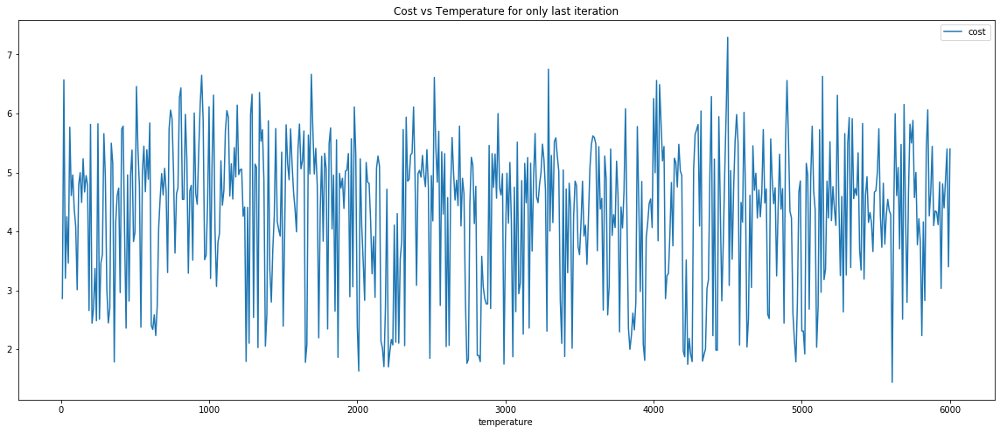

In [14]:
df1=pd.DataFrame(results,columns=["iteration",'x_inputs','cost','temperature'])
df_linear = pd.concat([df1.drop(columns=["x_inputs"]),pd.DataFrame(df1['x_inputs'].to_list(), columns=X.columns.tolist())],axis=1)
lines = df_linear.query("iteration == 99").plot.line(x='temperature', y='cost',figsize=(20,8))
plt.title("Cost vs Temperature for only last iteration")

Text(0.5, 1.0, 'Cost vs Iteration # for temperature = 1000')

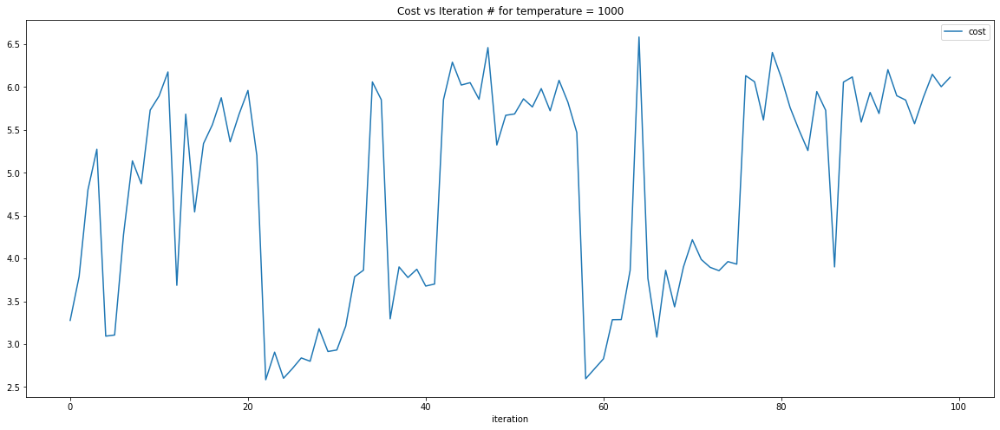

In [15]:
df_linear.query("temperature == 1000").plot.line(x='iteration', y='cost',figsize=(20,8))
plt.title("Cost vs Iteration # for temperature = 1000")

Text(0.5, 1.0, 'Cost from all iterations/temperatures during run of linear Simulated Annealing Optimization')

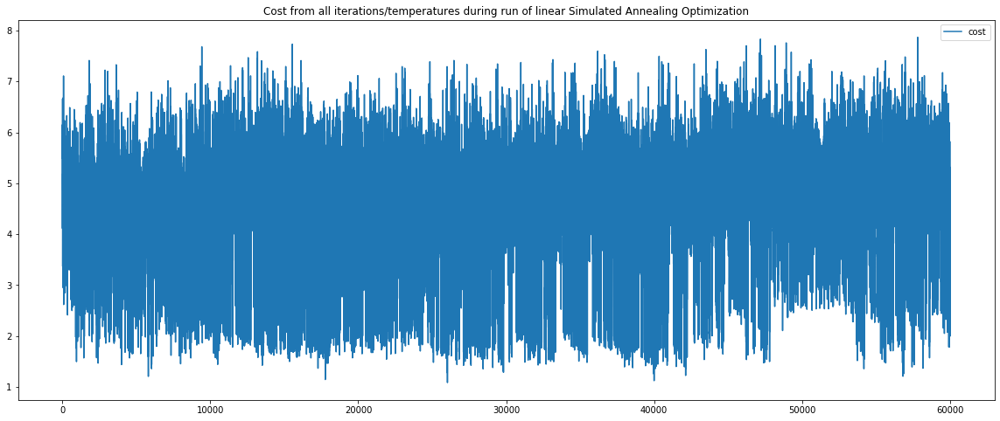

In [16]:
df_linear.plot.line( y='cost',figsize=(20,8))
plt.title('Cost from all iterations/temperatures during run of linear Simulated Annealing Optimization')

### Geometric Simulated Annealing

We performed SA with:
- geometric cooling from temperature from 6000 to 1
- alpha = 10 (default)
- upper and lower bounds informed by the actual data min and max values
- searching a distance of 0.5 from the current solution across all variables

In [17]:
%%time
sa_geometric = SimulatedAnnealing(initialSolution=np.array([[7.000e+00, 1.700e-01, 7.400e-01, 1.280e+01, 4.500e-02, 2.400e+01,
        1.260e+02, 9.942e-01, 3.260e+00, 3.800e-01, 1.220e+01, 0.000e+00]]), solutionEvaluator=xg_reg.predict, initialTemp=6000, 
                               finalTemp=1, tempReduction="geometric", neighborDistance=[0.5],upper_bound=ub,lower_bound=lb)
# alpha=0.95
results = sa_geometric.run()

Iteration 0 - cost: 6.65,cost_delta: 0.5498108863830566, currTemp: 6000.00
  new soln was better & accepted.
Iteration 1 - cost: 6.10,cost_delta: -0.2075486183166504, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 6.30,cost_delta: -0.21496152877807617, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 3 - cost: 6.52,cost_delta: 0.7312469482421875, currTemp: 6000.00
  new soln was better & accepted.
Iteration 4 - cost: 5.79,cost_delta: -0.5480208396911621, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 5 - cost: 6.34,cost_delta: 0.7818117141723633, currTemp: 6000.00
  new soln was better & accepted.
Iteration 6 - cost: 5.55,cost_delta: -1.6497306823730469, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 7.20,cost_delta: 1.659719467163086, currTemp: 6000.00
  new soln was better & ac

Iteration 95 - cost: 6.36,cost_delta: 0.0, currTemp: 6000.00
  new soln was better & accepted.
Iteration 96 - cost: 6.36,cost_delta: 0.8348865509033203, currTemp: 6000.00
  new soln was better & accepted.
Iteration 97 - cost: 5.53,cost_delta: 0.2695035934448242, currTemp: 6000.00
  new soln was better & accepted.
Iteration 98 - cost: 5.26,cost_delta: -0.8854503631591797, currTemp: 6000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 99 - cost: 6.15,cost_delta: 0.06811666488647461, currTemp: 6000.00
  new soln was better & accepted.
Iteration 0 - cost: 6.08,cost_delta: 0.10607242584228516, currTemp: 600.00
  new soln was better & accepted.
Iteration 1 - cost: 5.97,cost_delta: 0.24192047119140625, currTemp: 600.00
  new soln was better & accepted.
Iteration 2 - cost: 5.73,cost_delta: 0.478302001953125, currTemp: 600.00
  new soln was better & accepted.
Iteration 3 - cost: 5.25,cost_delta: 1.9872546195983887, currTemp: 600.00
  new soln was better & accepte

  new soln was NOT better & was accepted with probability of 1.00.
Iteration 92 - cost: 4.34,cost_delta: -0.08229541778564453, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 93 - cost: 4.42,cost_delta: 0.06428861618041992, currTemp: 600.00
  new soln was better & accepted.
Iteration 94 - cost: 4.36,cost_delta: -0.8350586891174316, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 95 - cost: 5.19,cost_delta: 0.22681188583374023, currTemp: 600.00
  new soln was better & accepted.
Iteration 96 - cost: 4.97,cost_delta: 0.011097908020019531, currTemp: 600.00
  new soln was better & accepted.
Iteration 97 - cost: 4.96,cost_delta: -0.047629356384277344, currTemp: 600.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 98 - cost: 5.00,cost_delta: 0.563694953918457, currTemp: 600.00
  new soln was better & accepted.
Iteration 99 - cost: 4.44,cost_delta: 0.19944381713867188, cur

Iteration 85 - cost: 4.14,cost_delta: -1.9310336112976074, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.03.
Iteration 86 - cost: 6.07,cost_delta: 1.7348299026489258, currTemp: 60.00
  new soln was better & accepted.
Iteration 87 - cost: 4.34,cost_delta: -0.2689790725708008, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 88 - cost: 4.61,cost_delta: -0.2684793472290039, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 89 - cost: 4.87,cost_delta: -0.4519162178039551, currTemp: 60.00
  new soln was NOT better & was accepted with probability of 1.01.
Iteration 90 - cost: 5.33,cost_delta: 0.29076290130615234, currTemp: 60.00
  new soln was better & accepted.
Iteration 91 - cost: 5.04,cost_delta: 0.9000692367553711, currTemp: 60.00
  new soln was better & accepted.
Iteration 92 - cost: 4.14,cost_delta: -1.9649863243103027, currTemp: 60.00
  new soln was NOT better & was 

Iteration 79 - cost: 2.64,cost_delta: 0.05014657974243164, currTemp: 6.00
  new soln was better & accepted.
Iteration 80 - cost: 2.59,cost_delta: -0.36352992057800293, currTemp: 6.00
  new soln was NOT better & was accepted with probability of 1.06.
Iteration 81 - cost: 2.95,cost_delta: 0.17165708541870117, currTemp: 6.00
  new soln was better & accepted.
Iteration 82 - cost: 2.78,cost_delta: -3.049771785736084, currTemp: 6.00
  new soln was NOT better & was accepted with probability of 1.66.
Iteration 83 - cost: 5.83,cost_delta: 0.5115737915039062, currTemp: 6.00
  new soln was better & accepted.
Iteration 84 - cost: 5.32,cost_delta: 0.36385154724121094, currTemp: 6.00
  new soln was better & accepted.
Iteration 85 - cost: 4.95,cost_delta: -0.6634783744812012, currTemp: 6.00
  new soln was NOT better & was accepted with probability of 1.12.
Iteration 86 - cost: 5.61,cost_delta: -0.1220846176147461, currTemp: 6.00
  new soln was NOT better & was accepted with probability of 1.02.
Itera

In [35]:
df1=pd.DataFrame(results,columns=["iteration",'x_inputs','cost','temperature'])
df_geometric = pd.concat([df1.drop(columns=["x_inputs"]),pd.DataFrame(df1['x_inputs'].to_list(), columns=X.columns.tolist())],axis=1)
df_geometric

,iteration,cost,temperature,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,red_wine


Text(0.5, 1.0, 'Cost vs Temperature for only last iteration')

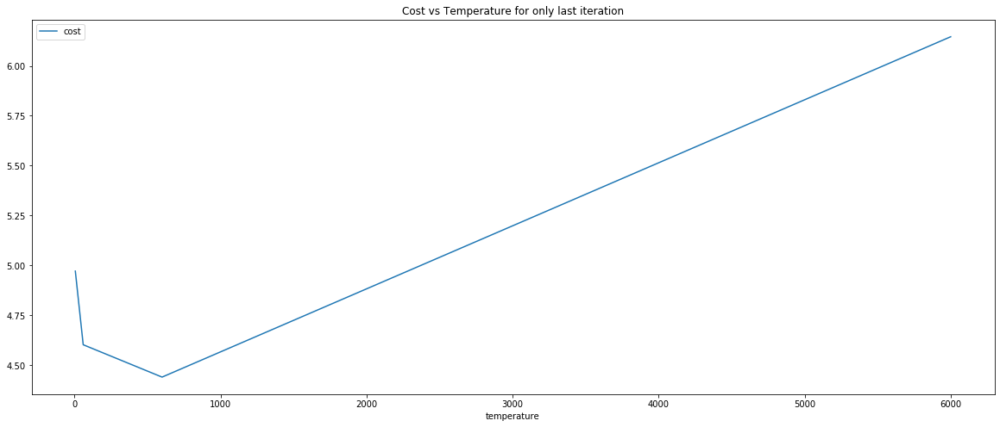

In [18]:
lines = df_geometric.query("iteration == 99").plot.line(x='temperature', y='cost',figsize=(20,8))
plt.title("Cost vs Temperature for only last iteration")

Text(0.5, 1.0, 'Cost vs Iteration # for temperature = 600')

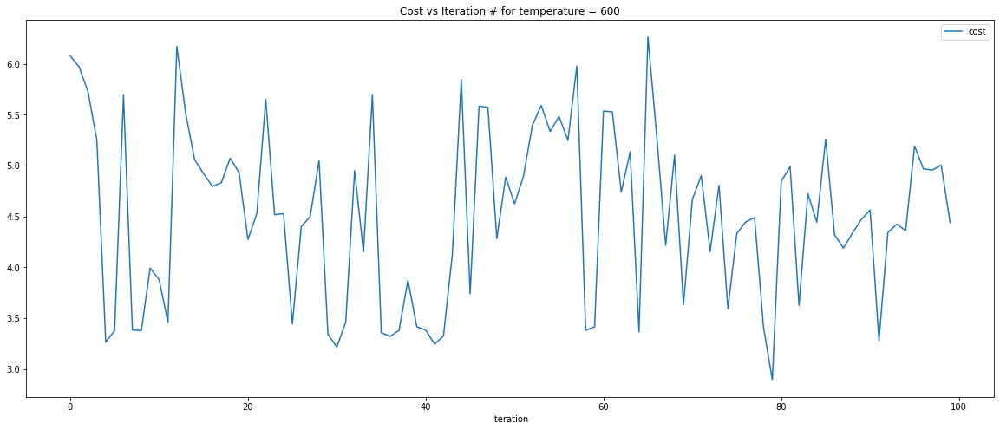

In [22]:
df_geometric.query("temperature == 600").plot.line(x='iteration', y='cost',figsize=(20,8))
plt.title("Cost vs Iteration # for temperature = 600")

Text(0.5, 1.0, 'Cost from all iterations/temperatures during run of Geometric Simulated Annealing Optimization')

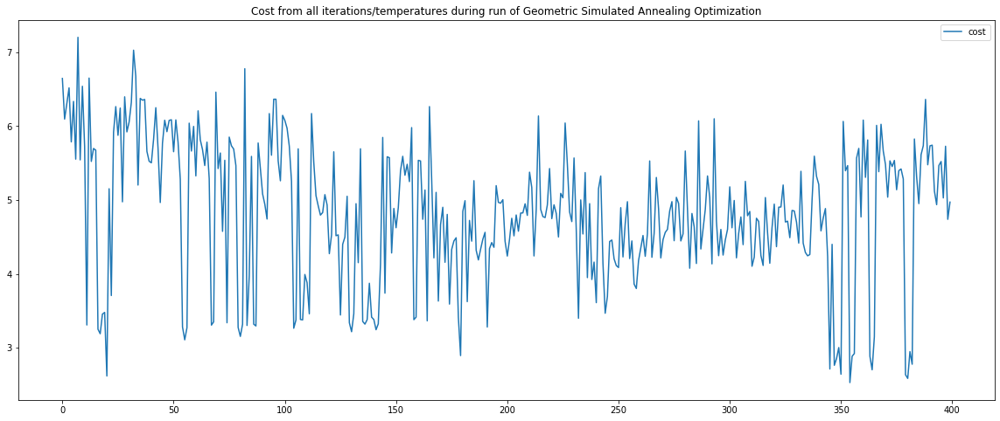

In [20]:
df_geometric.plot.line( y='cost',figsize=(20,8))
plt.title('Cost from all iterations/temperatures during run of Geometric Simulated Annealing Optimization')

This is what we expect to see! As the temperature decreases, the cost tends to increase towards 7.

### Slow Decrease Simulated Annealing

We performed SA with:
- Slow Decrease cooling from temperature from 6000 to 1
- alpha = 10 (default)
- upper and lower bounds informed by the actual data min and max values
- searching a distance of 0.5 from the current solution across all variables

In [30]:
%%time
sa_slowDecrease = SimulatedAnnealing(initialSolution=np.array([[7.000e+00, 1.700e-01, 7.400e-01, 1.280e+01, 4.500e-02, 2.400e+01,
        1.260e+02, 9.942e-01, 3.260e+00, 3.800e-01, 1.220e+01, 0.000e+00]]), solutionEvaluator=xg_reg.predict, initialTemp=10000, 
                               finalTemp=1, tempReduction="slowDecrease", neighborDistance=[0.5],upper_bound=ub,lower_bound=lb)
# alpha=10
results = sa_slowDecrease.run()

Iteration 0 - cost: 6.65,cost_delta: -0.2892451286315918, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 1 - cost: 6.94,cost_delta: 0.265655517578125, currTemp: 10000.00
  new soln was better & accepted.
Iteration 2 - cost: 6.67,cost_delta: 1.1793169975280762, currTemp: 10000.00
  new soln was better & accepted.
Iteration 3 - cost: 5.49,cost_delta: -1.223289966583252, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 4 - cost: 6.71,cost_delta: 2.0255608558654785, currTemp: 10000.00
  new soln was better & accepted.
Iteration 5 - cost: 4.69,cost_delta: -1.7561101913452148, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 6.44,cost_delta: 0.7504134178161621, currTemp: 10000.00
  new soln was better & accepted.
Iteration 7 - cost: 5.69,cost_delta: -0.5365839004516602, currTemp: 10000.00
  new soln was NOT better & was accepted with probabi

In [31]:
df1=pd.DataFrame(results,columns=["iteration",'x_inputs','cost','temperature'])
df_slowDecrease = pd.concat([df1.drop(columns=["x_inputs"]),pd.DataFrame(df1['x_inputs'].to_list(), columns=X.columns.tolist())],axis=1)
df_slowDecrease

,iteration,cost,temperature,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,red_wine
0,0,6.645835,10000,7.000000,0.170000,0.740000,12.800000,0.045000,24.000000,126.000000,0.994200,3.260000,0.380000,12.200000,0.000000
1,1,6.935080,10000,6.519955,0.091773,0.255166,12.319955,0.019696,23.519955,125.519955,0.988145,2.779955,0.233170,11.719955,0.009977
2,2,6.669425,10000,6.626759,0.390546,0.458237,12.426759,0.318892,23.626759,125.626759,1.018585,3.067647,0.531394,11.826759,0.309456
3,3,5.490108,10000,7.058698,0.835380,0.893019,12.858698,0.570027,24.058698,126.058698,1.035450,3.511316,0.976169,12.258698,0.754364
4,4,6.713398,10000,6.713849,0.490531,0.487193,12.513849,0.153960,23.713849,125.713849,0.995158,3.166263,0.631321,11.913849,0.370050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,4.477596,10000,5.357380,0.984188,0.579086,10.307465,0.210705,21.507465,123.507465,1.004489,3.543408,1.206654,9.729161,0.579086
96,96,5.931744,10000,4.883636,0.510444,0.103265,9.833721,0.024806,21.033721,123.033721,0.988472,3.068787,0.732910,9.255417,0.103265
97,97,5.084062,10000,4.620679,0.300555,0.143000,9.570764,0.131268,20.770764,122.770764,0.999405,2.936458,0.469953,8.992460,0.143000
98,98,4.852929,10000,4.880966,0.627829,0.488865,9.831051,0.466693,21.031051,123.031051,1.026546,3.269508,0.790180,9.252747,0.488865


Text(0.5, 1.0, 'Cost vs Temperature for only last iteration')

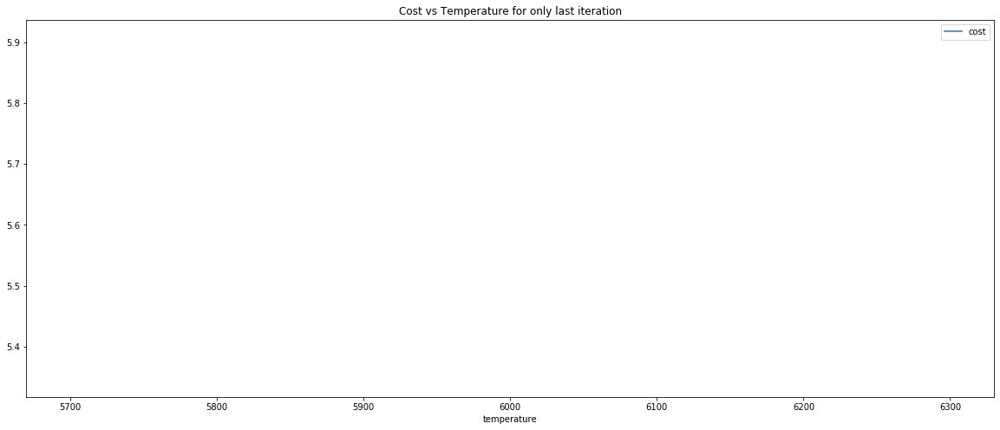

In [28]:
lines = df_slowDecrease.query("iteration == 10").plot.line(x='temperature', y='cost',figsize=(20,8))
plt.title("Cost vs Temperature for only last iteration")

Text(0.5, 1.0, 'Cost vs Iteration # for temperature = 600')

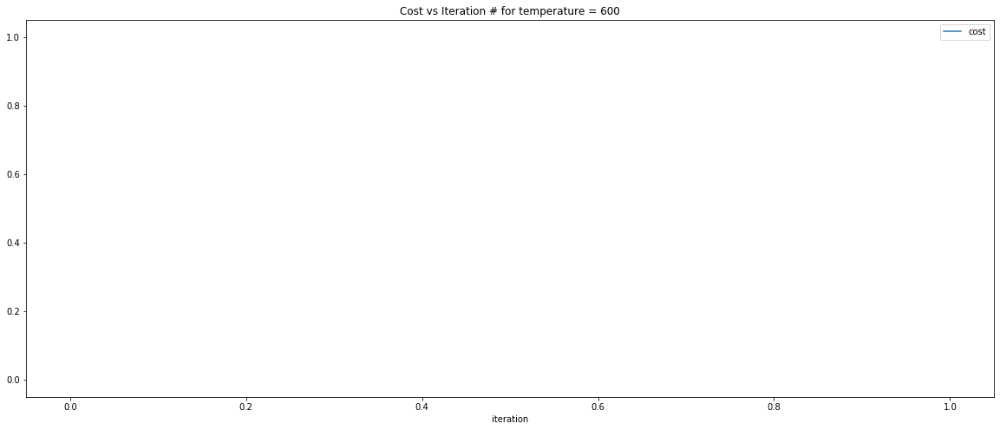

In [26]:
df_slowDecrease.query("temperature == 600").plot.line(x='iteration', y='cost',figsize=(20,8))
plt.title("Cost vs Iteration # for temperature = 600")

Text(0.5, 1.0, 'Cost from all iterations/temperatures during run of Slow Decrease Simulated Annealing Optimization')

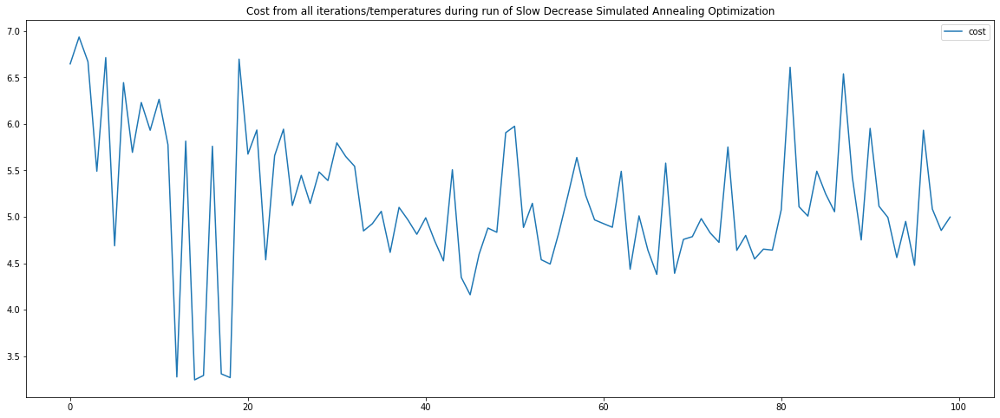

In [33]:
df_slowDecrease.plot.line( y='cost',figsize=(20,8))
plt.title('Cost from all iterations/temperatures during run of Slow Decrease Simulated Annealing Optimization')

The SlowDecrease cooling method also shows a trend towards higher cost with lower temperatures. The execution time was also pretty fast as there were effectively only one temperature. 

### Change alpha value for slow decrease

In [39]:
%%time
sa_slowDecrease = SimulatedAnnealing(initialSolution=np.array([[7.000e+00, 1.700e-01, 7.400e-01, 1.280e+01, 4.500e-02, 
                                                                2.400e+01, 1.260e+02, 9.942e-01, 3.260e+00, 3.800e-01, 
                                                                1.220e+01, 0.000e+00]]), solutionEvaluator=xg_reg.predict, 
                                     initialTemp=10000, finalTemp=1, tempReduction="slowDecrease", 
                                     neighborDistance=[0.5],upper_bound=ub,lower_bound=lb, alpha=0.95, iterationPerTemp=500)
results95 = sa_slowDecrease.run()

Iteration 0 - cost: 6.65,cost_delta: 0.8550887107849121, currTemp: 10000.00
  new soln was better & accepted.
Iteration 1 - cost: 5.79,cost_delta: -0.5554547309875488, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 2 - cost: 6.35,cost_delta: 1.279651165008545, currTemp: 10000.00
  new soln was better & accepted.
Iteration 3 - cost: 5.07,cost_delta: 0.10639238357543945, currTemp: 10000.00
  new soln was better & accepted.
Iteration 4 - cost: 4.96,cost_delta: 0.16375494003295898, currTemp: 10000.00
  new soln was better & accepted.
Iteration 5 - cost: 4.80,cost_delta: -0.45928382873535156, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 6 - cost: 5.26,cost_delta: -0.8626165390014648, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 7 - cost: 6.12,cost_delta: 1.0045547485351562, currTemp: 10000.00
  new soln was better & accepted.
Iteration 8 - co

Iteration 102 - cost: 2.92,cost_delta: 0.08267068862915039, currTemp: 10000.00
  new soln was better & accepted.
Iteration 103 - cost: 2.83,cost_delta: -0.06078767776489258, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 104 - cost: 2.89,cost_delta: -0.4655799865722656, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 105 - cost: 3.36,cost_delta: 0.4530494213104248, currTemp: 10000.00
  new soln was better & accepted.
Iteration 106 - cost: 2.91,cost_delta: -0.046039581298828125, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 107 - cost: 2.95,cost_delta: -0.29001832008361816, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 108 - cost: 3.24,cost_delta: 0.07386398315429688, currTemp: 10000.00
  new soln was better & accepted.
Iteration 109 - cost: 3.17,cost_delta: -0.29197263717651367, currTemp: 100

Iteration 201 - cost: 5.66,cost_delta: 1.941838264465332, currTemp: 10000.00
  new soln was better & accepted.
Iteration 202 - cost: 3.72,cost_delta: 0.5483617782592773, currTemp: 10000.00
  new soln was better & accepted.
Iteration 203 - cost: 3.17,cost_delta: -1.9603185653686523, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 204 - cost: 5.13,cost_delta: -0.32449913024902344, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 205 - cost: 5.46,cost_delta: -0.0586400032043457, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 206 - cost: 5.52,cost_delta: 0.464907169342041, currTemp: 10000.00
  new soln was better & accepted.
Iteration 207 - cost: 5.05,cost_delta: -0.22175836563110352, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 208 - cost: 5.27,cost_delta: 0.2698788642883301, currTemp: 10000.00
  

Iteration 288 - cost: 5.48,cost_delta: -0.9385519027709961, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 289 - cost: 6.41,cost_delta: 0.7901883125305176, currTemp: 10000.00
  new soln was better & accepted.
Iteration 290 - cost: 5.62,cost_delta: 0.02630615234375, currTemp: 10000.00
  new soln was better & accepted.
Iteration 291 - cost: 5.60,cost_delta: 2.9144058227539062, currTemp: 10000.00
  new soln was better & accepted.
Iteration 292 - cost: 2.68,cost_delta: -5.035560131072998, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 293 - cost: 7.72,cost_delta: 2.416208267211914, currTemp: 10000.00
  new soln was better & accepted.
Iteration 294 - cost: 5.30,cost_delta: -0.8926548957824707, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 295 - cost: 6.20,cost_delta: 0.46756649017333984, currTemp: 10000.00
  new soln was better & accepted.
Itera

Iteration 381 - cost: 5.43,cost_delta: 2.6201019287109375, currTemp: 10000.00
  new soln was better & accepted.
Iteration 382 - cost: 2.81,cost_delta: -1.9911155700683594, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 383 - cost: 4.80,cost_delta: 2.105978488922119, currTemp: 10000.00
  new soln was better & accepted.
Iteration 384 - cost: 2.69,cost_delta: -2.6079788208007812, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 385 - cost: 5.30,cost_delta: -0.02164602279663086, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 386 - cost: 5.32,cost_delta: 0.39048337936401367, currTemp: 10000.00
  new soln was better & accepted.
Iteration 387 - cost: 4.93,cost_delta: -0.2865638732910156, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 388 - cost: 5.22,cost_delta: -0.3926372528076172, currTemp: 10000.00


Iteration 473 - cost: 4.97,cost_delta: -1.0985817909240723, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 474 - cost: 6.07,cost_delta: 0.8398127555847168, currTemp: 10000.00
  new soln was better & accepted.
Iteration 475 - cost: 5.23,cost_delta: 0.6406497955322266, currTemp: 10000.00
  new soln was better & accepted.
Iteration 476 - cost: 4.59,cost_delta: -1.3264775276184082, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 477 - cost: 5.92,cost_delta: 0.5975809097290039, currTemp: 10000.00
  new soln was better & accepted.
Iteration 478 - cost: 5.32,cost_delta: -0.13230514526367188, currTemp: 10000.00
  new soln was NOT better & was accepted with probability of 1.00.
Iteration 479 - cost: 5.45,cost_delta: 0.11356639862060547, currTemp: 10000.00
  new soln was better & accepted.
Iteration 480 - cost: 5.34,cost_delta: 0.798128604888916, currTemp: 10000.00
  new soln was better & accepted.
I

In [40]:
df1=pd.DataFrame(results95,columns=["iteration",'x_inputs','cost','temperature'])
df_slowDecrease95 = pd.concat([df1.drop(columns=["x_inputs"]),pd.DataFrame(df1['x_inputs'].to_list(), columns=X.columns.tolist())],axis=1)
df_slowDecrease95

,iteration,cost,temperature,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,red_wine
0,0,6.645835,10000,7.000000,0.170000,0.740000,12.800000,0.045000,24.000000,126.000000,0.994200,3.260000,0.380000,12.200000,0.000000
1,1,5.790746,10000,7.349749,0.581352,0.885809,13.149749,0.464465,24.349749,126.349749,1.031186,3.609749,0.780834,12.549749,0.424874
2,2,6.346201,10000,6.925042,0.156645,0.432053,12.725042,0.054326,23.925042,125.925042,0.991015,3.177531,0.356127,12.125042,0.069637
3,3,5.066550,10000,6.476577,0.109718,0.048034,12.276577,0.037104,23.476577,125.476577,0.989783,2.788316,0.252783,11.676577,0.029357
4,4,4.960157,10000,6.058448,0.123368,0.044868,11.858448,0.052236,23.058448,125.058448,0.991357,2.784891,0.263619,11.258448,0.043339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,4.292162,10000,8.092987,1.281181,0.706653,13.499402,0.317844,24.699402,126.699402,1.009489,3.713315,1.649821,10.194153,0.706653
496,496,4.707739,10000,8.535983,1.534464,0.954776,13.942398,0.576683,25.142398,127.142398,1.036023,3.964585,1.904386,10.637149,0.954776
497,497,3.672948,10000,8.731533,1.413912,0.834007,14.137948,0.448327,25.337948,127.337948,1.023188,3.843949,1.783888,10.832699,0.834007
498,498,3.009857,10000,8.831747,1.313707,0.733745,14.238162,0.370329,25.438162,127.438162,1.018243,3.743722,1.683698,10.932913,0.733745


Text(0.5, 1.0, 'Cost from all iterations/temperatures during run of Slow Decrease Simulated Annealing Optimization')

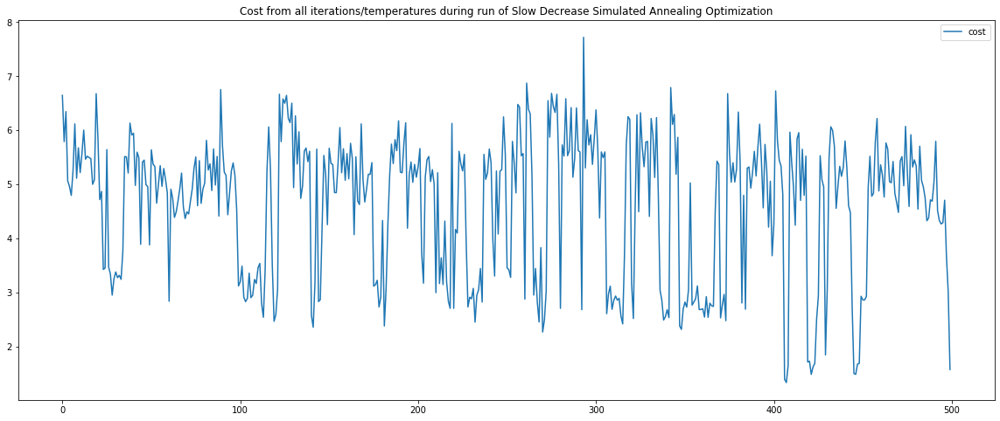

In [41]:
df_slowDecrease95.plot.line( y='cost',figsize=(20,8))
plt.title('Cost from all iterations/temperatures during run of Slow Decrease Simulated Annealing Optimization')

Changing alpha from 10 to 0.95, significantly affected the SA algorithm's performance. There is no obvious upward trend for the cost with temperature. 